# Tl;dr
Start of hyperparameter tuning process (optimized for **recall**) using RandomizedSearchCV for efficiency and data with embeddings. Previously judged `class_weight`, `weight`, and `sample_weights` arguments to perform better than resampling, so omitted resampling from process.

Using parquet files from Syed sent 06/01/2025.

# Load necessary libraries

In [ ]:
import pandas as pd

import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib.patches import Patch

from sklearn.preprocessing import (
    MinMaxScaler
)

# sklearn Imputer (for MICE)
from sklearn.experimental import enable_iterative_imputer
from sklearn.impute import IterativeImputer

# sklearn Model selection and evaluation
from sklearn.model_selection import (
    train_test_split,
    RandomizedSearchCV
)

# sklearn Model evaluation
from sklearn.metrics import (
    accuracy_score,
    confusion_matrix,
    classification_report,
    roc_curve,
    roc_auc_score,
    precision_score,
    recall_score,
    f1_score,
)

from imblearn.over_sampling import SMOTE

from sklearn.neighbors import KNeighborsClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.naive_bayes import ComplementNB
from sklearn.svm import SVC

from collections import Counter
from sklearn.utils.class_weight import compute_sample_weight

from sklearn.ensemble import (
    RandomForestClassifier,
    GradientBoostingClassifier,
    AdaBoostClassifier
)

from lightgbm import LGBMClassifier

import re

In [2]:
import os

parquet_root = '/Users/daisyliu/Desktop/Care4Minds/scaled_parquet/'

training_Xy = {}

parquets = ['combined_isolated_pca_128', 'combined_combined_pca_128', 'combined_isolated_pca_256', 'combined_isolated_pca_512']

for p in parquets:
    
    training_Xy[str(p)] = {}

    X_train_scaled = pd.read_parquet(os.path.join(parquet_root, f'{p}_X_train_scaled.parquet')).drop(['Patient_ID'], axis=1)
    X_test_scaled = pd.read_parquet(os.path.join(parquet_root, f'{p}_X_test_scaled.parquet')).drop(['Patient_ID'], axis=1)

    training_Xy[str(p)][f'X_train_scaled'] = X_train_scaled
    training_Xy[str(p)][f'X_test_scaled'] = X_test_scaled
    training_Xy[str(p)]['y_train'] = pd.read_parquet(os.path.join(parquet_root, 'y_train.parquet')).squeeze()
    training_Xy[str(p)]['y_test'] = pd.read_parquet(os.path.join(parquet_root, 'y_test.parquet')).squeeze()


## Useful code snippets

In [3]:
def count_nas(df):
    """
    Counts the number and percentage of missing (NaN) values in each column of a DataFrame.
    """
    tot = len(df)
    cols = list(df.columns)
    nas = [df[col].isna().sum() for col in cols]
    percent_nas = [na/tot * 100 for na in nas]

    na_df = pd.DataFrame.from_dict({"col": cols, "nas": nas, "percent_nas": percent_nas})
    na_df.sort_values(by = ["percent_nas"], ascending = False, inplace = True)
    na_df = na_df.reset_index(drop = True)

    return na_df

In [4]:
def print_summary_stats(df, col: str, groupby: str):
    print(f"\n===== {col}, summary stats =====")
    print("Overall:")
    print(df[col].describe())

    print("\nBy group:")
    print(df.groupby(groupby)[col].describe())

def make_boxplot(df, col: str, groupby: str, category_colours: list):
    """
    Plots a boxplot of a continuous variable split by a binary categorical grouping column.
    """
    print(f"===== {col}, boxplot =====")

    plt.figure(figsize=(4, 4))
    sns.boxplot(data=df, x=groupby, y=col, palette=category_colours, width=0.5)
    
    plt.title(f'Boxplot of {col} by {groupby}')
    plt.xlabel(groupby)
    plt.ylabel(col)
    plt.xticks([0, 1], ['No', 'Yes'])  # Assumes binary category coded as 0 and 1

    plt.show()

def make_histplot(df, col: str, groupby: str, category_colours:list):
    """
    Plots a histogram with KDE overlays to compare the distribution of a continuous variable
    across categories in a binary grouping column.
    """
    print(f"===== {col}, histogram =====")

    plt.figure(figsize=(4, 4))
    sns.histplot(data=df, x=col, hue=groupby, kde=True, bins=30, palette=category_colours, element='step', alpha=0.4)
    plt.title(f'Distribution of {col} by depression status')
    plt.xlabel(col)
    plt.ylabel('Frequency')

      
    legend_elements = [ Patch(facecolor=category_colours[0], label='No'), Patch(facecolor=category_colours[1],label='Yes') ]
    plt.legend(handles=legend_elements, title='depression', loc='upper right')
    plt.show()

In [5]:
def make_barplot(df, col: str, groupby: str, category_colours: list):
  """
  Check distribution of classes in categorical by target category
  """
  print(f"Column: {col}\n")
  print(df[col].value_counts(normalize = True)*100)

  plt.figure(figsize=(10, 5))
  sns.countplot(data=df, x = col, hue=groupby, palette=category_colours)
  plt.xticks(rotation=45)
  plt.xlabel(col)
  plt.ylabel('Count')
  plt.title(f'Count of {col}')
  plt.show()

  print("\n")

In [6]:
def plot_problematic_corr(df, corr_threshold=0.7):
    """
    Identifies features in a DataFrame that have pairwise Pearson correlation coefficients
    above a specified threshold.
    """
    problematic_corr = []
    corr_matrix = df.corr()
    for c in corr_matrix.columns: # Iterate over columns
        for i in corr_matrix.index: # Iterate over index (rows)
            if c != i and corr_matrix.loc[i, c] > corr_threshold:  # Exclude self-correlation and check threshold
                problematic_corr.extend([c, i])  # Add both column and index if correlated

    return set(problematic_corr)

In [7]:
def clean_column_names(df):
    df.columns = [re.sub(r'[\"\'\[\]\{\}\\,()]+', '_', col) for col in df.columns]
    return df

def impute_data(X_train, X_test, imputer=None):
    if imputer is None:
        imputer = IterativeImputer(max_iter=10, random_state=42)
    X_train_imputed = imputer.fit_transform(X_train)
    X_test_imputed = imputer.transform(X_test)
    return pd.DataFrame(X_train_imputed, columns=X_train.columns), pd.DataFrame(X_test_imputed, columns=X_test.columns)

def scale_data(X_train, X_test, scaler=None):
    if scaler is None:
        scaler = MinMaxScaler()
    X_train_scaled = scaler.fit_transform(X_train)
    X_test_scaled = scaler.transform(X_test)
    return pd.DataFrame(X_train_scaled, columns=X_train.columns), pd.DataFrame(X_test_scaled, columns=X_test.columns)

In [8]:
def get_scores(y_pred, y):
  """
    Computes evaluation metrics for a classification task.

    Parameters:
        y_pred (array-like): Predicted class labels.
        y (array-like): True class labels.

    Returns:
        tuple:
            - conf_matrix (ndarray): Confusion matrix.
            - class_report (str): Text summary of precision, recall, F1-score, and support for each class.
            - acc (float): Overall accuracy score.
  """
  conf_matrix = confusion_matrix(y, y_pred) # This line and the following two should be indented with 4 spaces.
  class_report = classification_report(y, y_pred)
  acc = accuracy_score(y, y_pred)
  return conf_matrix, class_report, acc

def print_scores(conf_matrix, class_report):
  """
    Prints the confusion matrix and classification report for a classification model.

    Parameters:
        conf_matrix (ndarray): Confusion matrix showing true vs. predicted classifications.
        class_report (str): Classification report including precision, recall, F1-score, and support.
  """
  print("Confusion Matrix:")
  print(conf_matrix)
  print("\nClassification Report:")
  print(class_report)

def plot_confusion_matrix(conf_matrix):
  """
    Plots a heatmap of the confusion matrix using Seaborn.

    Parameters:
        conf_matrix (ndarray): Confusion matrix of true vs. predicted class labels.

    Returns:
        None
  """
  sns.heatmap(conf_matrix, annot=True, fmt='d')
  plt.ylabel('Actual')
  plt.xlabel('Predicted')
  plt.show()

def get_auc_values(y_prob, y):
  """
  DOCSTRING
  """
  fpr, tpr, thresholds = roc_curve(y, y_prob)
  roc_auc = roc_auc_score(y, y_prob)
  return fpr, tpr, roc_auc

def plot_roc_curve(fpr, tpr, roc_auc, title = "ROC AUC Curve"):
  """
    Computes the false positive rate, true positive rate, and AUC score for a binary classifier.

    Parameters:
        y_prob (array-like): Predicted probabilities for the positive class.
        y (array-like): True binary class labels.

    Returns:
        tuple:
            - fpr (array): False positive rates.
            - tpr (array): True positive rates.
            - roc_auc (float): Area Under the ROC Curve (AUC) score.
  """
  plt.figure()
  plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (area = %0.2f)' % roc_auc)
  plt.plot([0, 1], [0, 1], 'k--')  # Plot diagonal
  plt.xlim([0.0, 1.0])
  plt.ylim([0.0, 1.05])
  plt.xlabel('False Positive Rate (FPR)')
  plt.ylabel('True Positive Rate (TPR)')
  plt.title(title)
  plt.legend(loc='lower right')
  plt.show()

def evaluate_model(model, X_train, y_train, X_test, y_test):
  """
    Evaluates a binary classification model using training and test data.

    This function computes and displays accuracy, confusion matrix, classification report,
    and AUC-ROC for both training and test sets. It assumes the model has both
    `predict()` and `predict_proba()` methods.

    Parameters:
        model: A fitted scikit-learn-style classification model.
        X_train (array-like): Feature matrix for the training set.
        y_train (array-like): True labels for the training set.
        X_test (array-like): Feature matrix for the test set.
        y_test (array-like): True labels for the test set.

    Returns:
        tuple:
            - y_pred_train (array): Predicted class labels for the training set.
            - y_pred_test (array): Predicted class labels for the test set.
            - y_prob_train (array): Predicted probabilities for the positive class (training set).
            - y_prob_test (array): Predicted probabilities for the positive class (test set).
  """
  y_pred_train = model.predict(X_train)
  y_pred_test = model.predict(X_test)
  y_prob_train = model.predict_proba(X_train)[:, 1]
  y_prob_test = model.predict_proba(X_test)[:, 1]

  print(f"Train accuracy score: {accuracy_score(y_train, y_pred_train)}")
  print(f"Test accuracy score: {accuracy_score(y_test, y_pred_test)}")
  print('\n')

  # Calculate evaluation metrics and scores for the test and training sets
  conf_matrix_train, class_report_train, acc_train = get_scores(y_pred_train, y_train)
  conf_matrix_test, class_report_test, acc_test = get_scores(y_pred_test, y_test)

  # Print scores and evaluation metrics for the training set
  print("======== Training Set ==========")
  print_scores(conf_matrix_train, class_report_train)
  plot_confusion_matrix(conf_matrix_train) # plot the confusion matrix for the training set using the function we created above

  fpr_train, tpr_train, roc_auc_train = get_auc_values(y_prob_train, y_train)
  print(f"Training AUC: {roc_auc_train:.4f}")
  plot_roc_curve(fpr_train, tpr_train, roc_auc_train)

  # Print scores and evaluation metrics for the test set
  print('======== Test Set ==========')
  print_scores(conf_matrix_test, class_report_test)
  plot_confusion_matrix(conf_matrix_test) # plot the confusion matrix for the test set using the function we created above

  fpr_test, tpr_test, roc_auc_test = get_auc_values(y_prob_test, y_test)
  print(f"Testing AUC: {roc_auc_test:.4f}")
  plot_roc_curve(fpr_test, tpr_test, roc_auc_test)

  return y_pred_train, y_pred_test, y_prob_train, y_prob_test

In [9]:
def find_best_params(model, param_grid, X_train, y_train):
  """
  Finds best parameters for a given model using grid search.

  Parameters:
    model: A fitted scikit-learn-style classification model.
    param_grid (dict): A dictionary of hyperparameters and their possible values.
    X_train (array-like): Feature matrix for the training set.
    y_train (array-like): True labels for the training set.

  Returns:
    dict: The best hyperparameters found by the grid search.
  """
  grid_search = GridSearchCV(model, param_grid, cv=5, scoring='recall')
  grid_search.fit(X_train, y_train)

  return grid_search

In [10]:
def plot_model_importances(model, X_train):
    importances = model.feature_importances_

    feature_names = X_train.columns
    importance_df = pd.DataFrame({
        'Feature': feature_names,
        'Importance': importances
    }).sort_values(by='Importance', ascending=False)

    plt.figure(figsize=(10, 6))
    sns.barplot(
        data=importance_df,
        x='Importance', y='Feature',
        orient='h',
        color=palette[0]
    )
    plt.title('Feature Importances')
    plt.tight_layout()
    plt.show()

## EDA

In [15]:
for k, v in combined_df.items():
    print(f'{k}, shape: {v.shape}')
    print('===== Column names and types =====')
    v.info(verbose=True)
    print('=====')
    print('\n')

combined_isolated_pca_128, shape: (234869, 159)
===== Column names and types =====
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 234869 entries, 0 to 234868
Data columns (total 159 columns):
 #    Column                                     Dtype  
---   ------                                     -----  
 0    Patient_ID                                 object 
 1    Sex_Bin                                    float64
 2    Age_2015                                   float64
 3    Num_Risks                                  int64  
 4    Total_Overall_Diagnoses                    int64  
 5    Total_Encounters                           int64  
 6    Lab_Risk_Proportion                        float64
 7    Num_Chronic                                int64  
 8    Total_Medications                          int64  
 9    Total_MedProcs                             int64  
 10   Status_Active                              int64  
 11   Status_Deceased                            int64  
 12   S

In [25]:
for k, v in combined_df.items():
    print(f'===== Percent of missingness by column in {k} =====')
    print(count_nas(v))

===== Percent of missingness by column in combined_isolated_pca_128 =====
                     col    nas  percent_nas
0    Lab_Risk_Proportion  80771    34.389809
1               Age_2015     23     0.009793
2                Sex_Bin     21     0.008941
3             Patient_ID      0     0.000000
4             feature_79      0     0.000000
..                   ...    ...          ...
154           feature_24      0     0.000000
155           feature_25      0     0.000000
156           feature_26      0     0.000000
157           feature_27      0     0.000000
158          feature_128      0     0.000000

[159 rows x 3 columns]
===== Percent of missingness by column in combined_isolated_pca_256 =====
                     col    nas  percent_nas
0    Lab_Risk_Proportion  80771    34.389809
1               Age_2015     23     0.009793
2                Sex_Bin     21     0.008941
3             Patient_ID      0     0.000000
4            feature_159      0     0.000000
..                

In [6]:
for k, v in combined_df.items():
    v['Lab_Risk_Proportion'] = v['Lab_Risk_Proportion'].fillna(0) # the way Lab_Risk_Proportion was created returns 0 if there were no lab tests

=====                Patient_ID  Sex_Bin  Age_2015  Num_Risks  \
0        1002000000000016      0.0      50.0          2   
1        1002000000000024      1.0      60.0          1   
2        1002000000000044      1.0      66.0          2   
3        1002000000000049      0.0      50.0          0   
4        1002000000000065      1.0      53.0          2   
...                   ...      ...       ...        ...   
234864  13001000000027092      0.0      32.0          9   
234865  13001000000027109      0.0      26.0          0   
234866  13001000000027112      1.0      17.0          3   
234867  13001000000027140      0.0       9.0          0   
234868  13001000000027240      1.0      51.0          2   

        Total_Overall_Diagnoses  Total_Encounters  Lab_Risk_Proportion  \
0                             3                13             0.312500   
1                             2                16             0.500000   
2                             1                44             0

/var/folders/yb/n93q7gbn67v_pbwyvgl9kgy80000gn/T/ipykernel_18873/4246718001.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df, x=groupby, y=col, palette=category_colours, width=0.5)


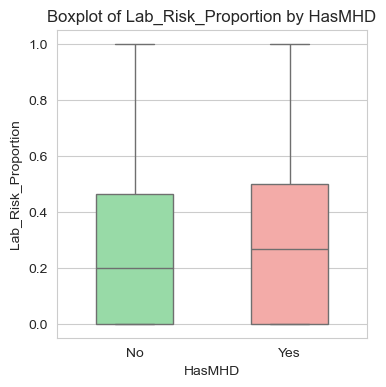

===== Lab_Risk_Proportion, histogram =====


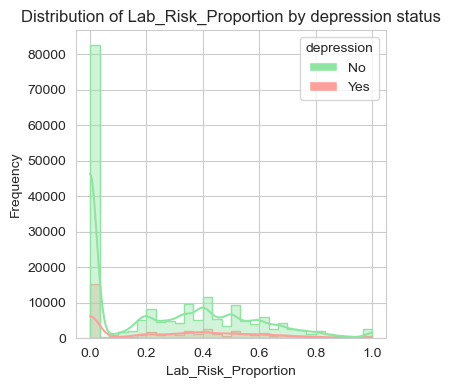

===== AGE_2015 =====

===== Age_2015, summary stats =====
Overall:
count    234846.000000
mean         50.043905
std          21.972825
min         -12.000000
25%          34.000000
50%          52.000000
75%          66.000000
max         111.000000
Name: Age_2015, dtype: float64

By group:
           count       mean        std   min   25%   50%   75%    max
HasMHD                                                               
0       194776.0  49.586048  22.472058  -7.0  33.0  51.0  66.0  111.0
1        40070.0  52.269503  19.209044 -12.0  38.0  53.0  66.0  107.0
===== Age_2015, boxplot =====


/var/folders/yb/n93q7gbn67v_pbwyvgl9kgy80000gn/T/ipykernel_18873/4246718001.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df, x=groupby, y=col, palette=category_colours, width=0.5)


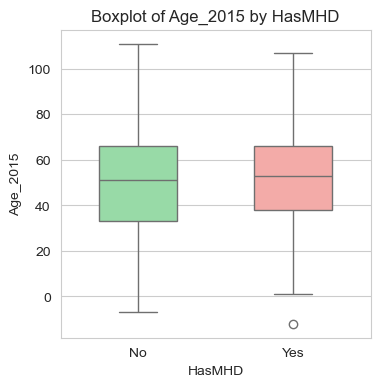

===== Age_2015, histogram =====


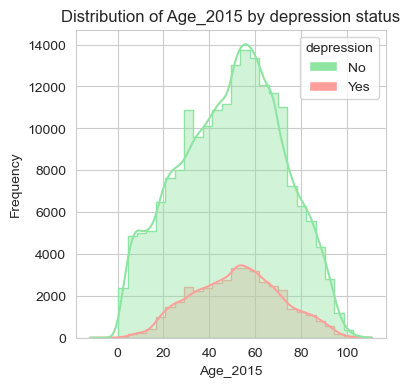

===== SHORTTERMMEDS_NUM =====

===== ShortTermMeds_Num, summary stats =====
Overall:
count    234869.000000
mean          2.270632
std           5.907644
min          -1.000000
25%           0.000000
50%           0.000000
75%           3.000000
max         236.000000
Name: ShortTermMeds_Num, dtype: float64

By group:
           count      mean       std  min  25%  50%  75%    max
HasMHD                                                         
0       194796.0  2.089858  5.367271 -1.0  0.0  0.0  3.0  236.0
1        40073.0  3.149377  7.974164 -1.0  0.0  0.0  4.0  222.0
===== ShortTermMeds_Num, boxplot =====


/var/folders/yb/n93q7gbn67v_pbwyvgl9kgy80000gn/T/ipykernel_18873/4246718001.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df, x=groupby, y=col, palette=category_colours, width=0.5)


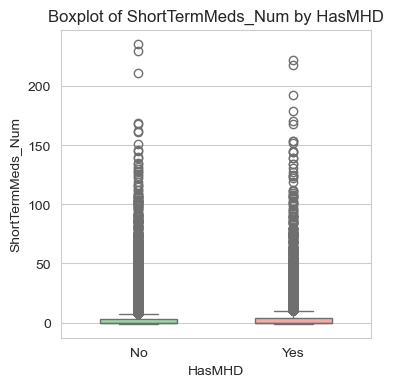

===== ShortTermMeds_Num, histogram =====


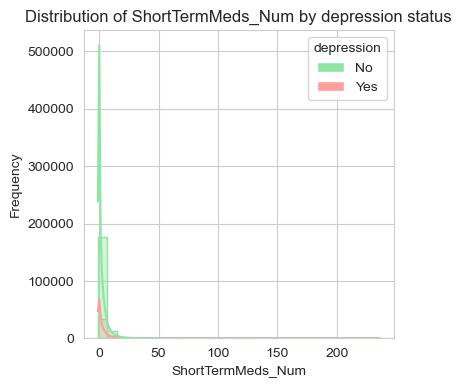

===== LONGTERMMEDS_NUM =====

===== LongTermMeds_Num, summary stats =====
Overall:
count    234869.000000
mean         13.912947
std          30.929102
min          -1.000000
25%           0.000000
50%           2.000000
75%          14.000000
max         662.000000
Name: LongTermMeds_Num, dtype: float64

By group:
           count       mean        std  min  25%  50%   75%    max
HasMHD                                                            
0       194796.0  12.635891  28.803350 -1.0  0.0  2.0  12.0  662.0
1        40073.0  20.120755  39.082164 -1.0  0.0  5.0  23.0  580.0
===== LongTermMeds_Num, boxplot =====


/var/folders/yb/n93q7gbn67v_pbwyvgl9kgy80000gn/T/ipykernel_18873/4246718001.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df, x=groupby, y=col, palette=category_colours, width=0.5)


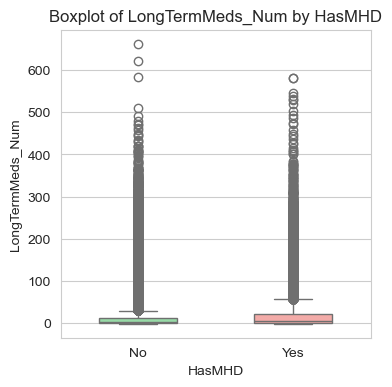

===== LongTermMeds_Num, histogram =====


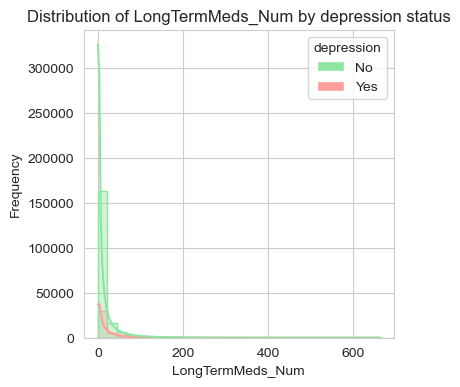

===== NUM_PHYSCOMORB =====

===== Num_PhysComorb, summary stats =====
Overall:
count    234869.000000
mean          0.595898
std           0.899054
min           0.000000
25%           0.000000
50%           0.000000
75%           1.000000
max          12.000000
Name: Num_PhysComorb, dtype: float64

By group:
           count      mean       std  min  25%  50%  75%   max
HasMHD                                                        
0       194796.0  0.547552  0.844909  0.0  0.0  0.0  1.0  12.0
1        40073.0  0.830909  1.095785  0.0  0.0  0.0  1.0  12.0
===== Num_PhysComorb, boxplot =====


/var/folders/yb/n93q7gbn67v_pbwyvgl9kgy80000gn/T/ipykernel_18873/4246718001.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df, x=groupby, y=col, palette=category_colours, width=0.5)


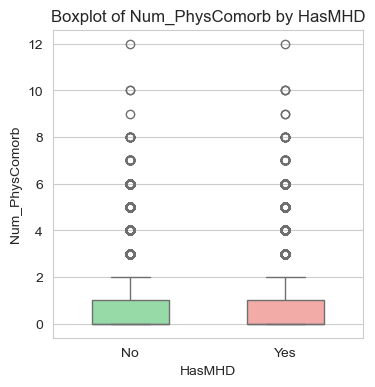

===== Num_PhysComorb, histogram =====


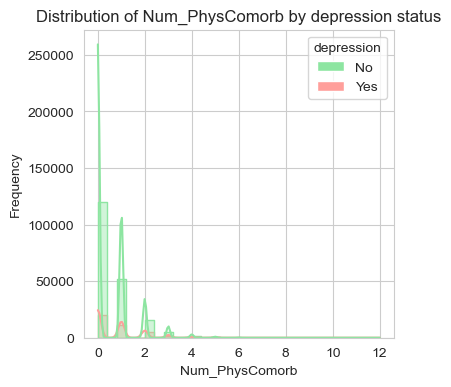

===== TOTAL_MEDPROCS =====

===== Total_MedProcs, summary stats =====
Overall:
count    234869.000000
mean          4.333995
std          12.038419
min           0.000000
25%           0.000000
50%           1.000000
75%           3.000000
max         537.000000
Name: Total_MedProcs, dtype: float64

By group:
           count      mean        std  min  25%  50%  75%    max
HasMHD                                                          
0       194796.0  4.146584  11.224728  0.0  0.0  1.0  3.0  537.0
1        40073.0  5.245003  15.360425  0.0  0.0  1.0  4.0  317.0
===== Total_MedProcs, boxplot =====


/var/folders/yb/n93q7gbn67v_pbwyvgl9kgy80000gn/T/ipykernel_18873/4246718001.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df, x=groupby, y=col, palette=category_colours, width=0.5)


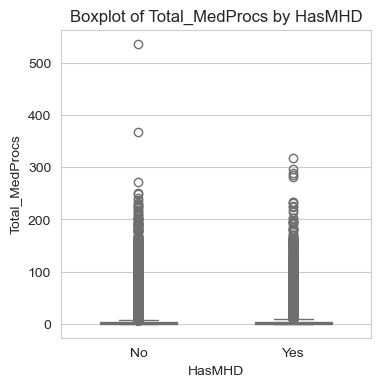

===== Total_MedProcs, histogram =====


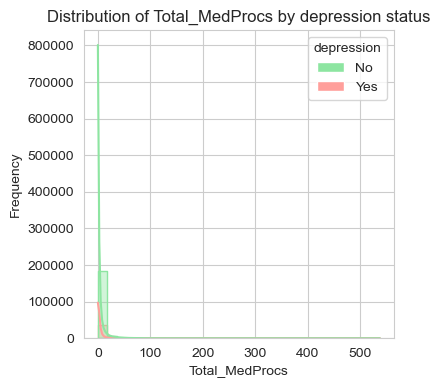

===== TOTAL_MEDICATIONS =====

===== Total_Medications, summary stats =====
Overall:
count    234869.000000
mean         25.818759
std          42.246487
min           0.000000
25%           3.000000
50%          12.000000
75%          30.000000
max         985.000000
Name: Total_Medications, dtype: float64

By group:
           count       mean        std  min  25%   50%   75%    max
HasMHD                                                             
0       194796.0  23.337055  38.592787  0.0  3.0  10.0  27.0  985.0
1        40073.0  37.882390  55.182697  0.0  6.0  20.0  47.0  816.0
===== Total_Medications, boxplot =====


/var/folders/yb/n93q7gbn67v_pbwyvgl9kgy80000gn/T/ipykernel_18873/4246718001.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df, x=groupby, y=col, palette=category_colours, width=0.5)


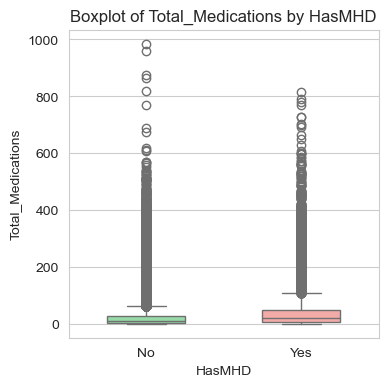

===== Total_Medications, histogram =====


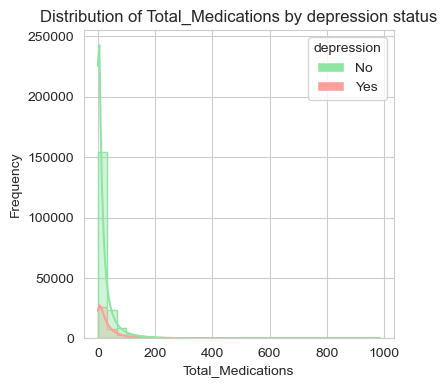

===== NUM_CHRONIC =====

===== Num_Chronic, summary stats =====
Overall:
count    234869.000000
mean          0.703716
std           1.053526
min           0.000000
25%           0.000000
50%           0.000000
75%           1.000000
max          15.000000
Name: Num_Chronic, dtype: float64

By group:
           count      mean       std  min  25%  50%  75%   max
HasMHD                                                        
0       194796.0  0.668833  1.017000  0.0  0.0  0.0  1.0  15.0
1        40073.0  0.873281  1.201214  0.0  0.0  0.0  1.0  12.0
===== Num_Chronic, boxplot =====


/var/folders/yb/n93q7gbn67v_pbwyvgl9kgy80000gn/T/ipykernel_18873/4246718001.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df, x=groupby, y=col, palette=category_colours, width=0.5)


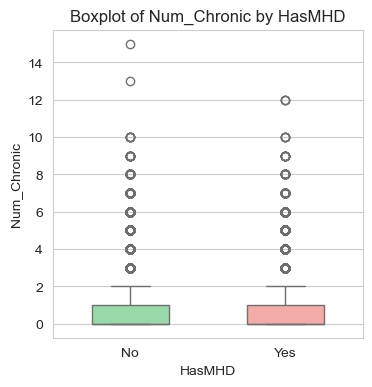

===== Num_Chronic, histogram =====


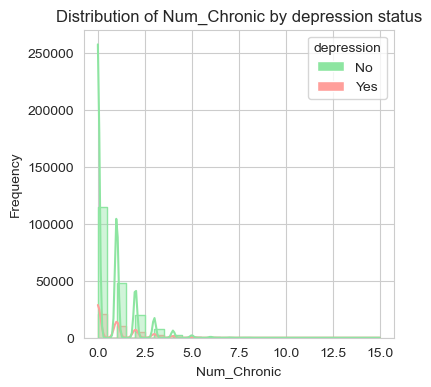

===== TOTAL_ENCOUNTERS =====

===== Total_Encounters, summary stats =====
Overall:
count    234869.000000
mean         39.432854
std          44.142399
min           1.000000
25%          13.000000
50%          27.000000
75%          50.000000
max        1398.000000
Name: Total_Encounters, dtype: float64

By group:
           count       mean        std  min   25%   50%   75%     max
HasMHD                                                               
0       194796.0  37.170851  41.595288  1.0  13.0  25.0  47.0  1398.0
1        40073.0  50.428518  53.520169  1.0  18.0  35.0  66.0  1215.0
===== Total_Encounters, boxplot =====


/var/folders/yb/n93q7gbn67v_pbwyvgl9kgy80000gn/T/ipykernel_18873/4246718001.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df, x=groupby, y=col, palette=category_colours, width=0.5)


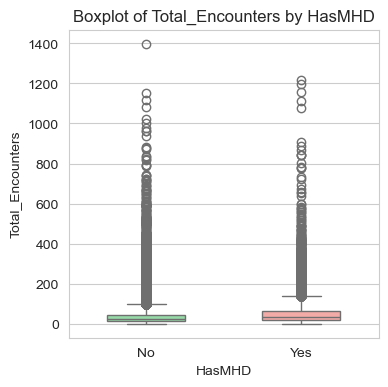

===== Total_Encounters, histogram =====


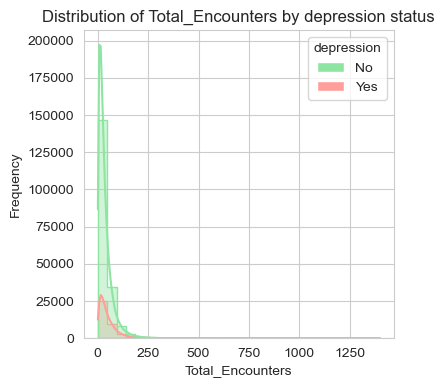

===== TOTAL_OVERALL_DIAGNOSES =====

===== Total_Overall_Diagnoses, summary stats =====
Overall:
count    234869.000000
mean          5.680694
std           7.292449
min           0.000000
25%           1.000000
50%           3.000000
75%           7.000000
max         118.000000
Name: Total_Overall_Diagnoses, dtype: float64

By group:
           count      mean       std  min  25%  50%  75%    max
HasMHD                                                         
0       194796.0  5.139012  6.583279  0.0  1.0  3.0  6.0  102.0
1        40073.0  8.313827  9.625791  1.0  3.0  5.0  9.0  118.0
===== Total_Overall_Diagnoses, boxplot =====


/var/folders/yb/n93q7gbn67v_pbwyvgl9kgy80000gn/T/ipykernel_18873/4246718001.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df, x=groupby, y=col, palette=category_colours, width=0.5)


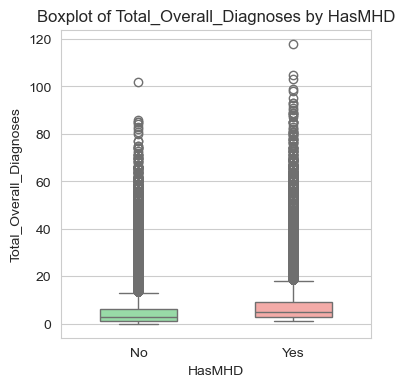

===== Total_Overall_Diagnoses, histogram =====


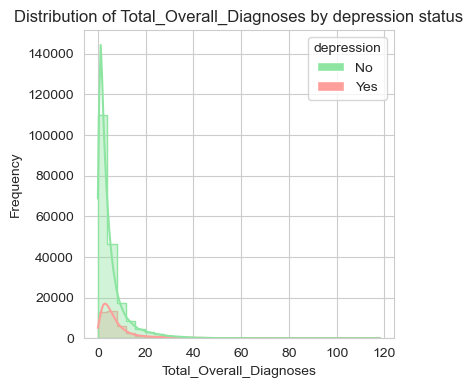

===== NUM_RISKS =====

===== Num_Risks, summary stats =====
Overall:
count    234869.000000
mean          1.671459
std           3.772628
min           0.000000
25%           0.000000
50%           0.000000
75%           2.000000
max         342.000000
Name: Num_Risks, dtype: float64

By group:
           count      mean       std  min  25%  50%  75%    max
HasMHD                                                         
0       194796.0  1.606229  3.617561  0.0  0.0  0.0  2.0  342.0
1        40073.0  1.988546  4.436504  0.0  0.0  0.0  2.0  194.0
===== Num_Risks, boxplot =====


/var/folders/yb/n93q7gbn67v_pbwyvgl9kgy80000gn/T/ipykernel_18873/4246718001.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df, x=groupby, y=col, palette=category_colours, width=0.5)


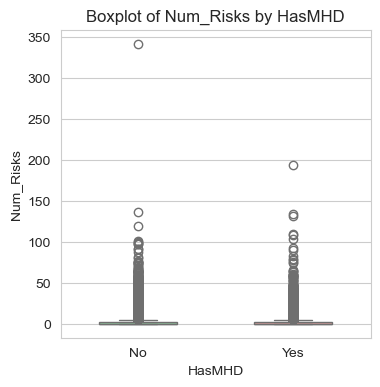

===== Num_Risks, histogram =====


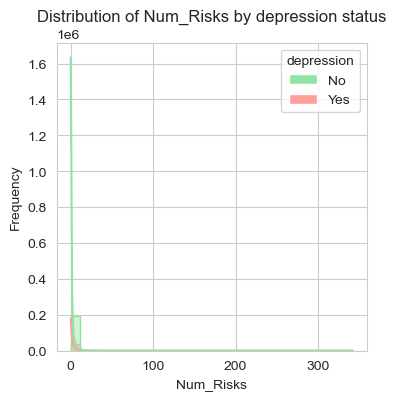

=====                Patient_ID  Sex_Bin  Age_2015  Num_Risks  \
0        1002000000000016      0.0      50.0          2   
1        1002000000000024      1.0      60.0          1   
2        1002000000000044      1.0      66.0          2   
3        1002000000000049      0.0      50.0          0   
4        1002000000000065      1.0      53.0          2   
...                   ...      ...       ...        ...   
234864  13001000000027092      0.0      32.0          9   
234865  13001000000027109      0.0      26.0          0   
234866  13001000000027112      1.0      17.0          3   
234867  13001000000027140      0.0       9.0          0   
234868  13001000000027240      1.0      51.0          2   

        Total_Overall_Diagnoses  Total_Encounters  Lab_Risk_Proportion  \
0                             3                13             0.312500   
1                             2                16             0.500000   
2                             1                44             0

/var/folders/yb/n93q7gbn67v_pbwyvgl9kgy80000gn/T/ipykernel_18873/4246718001.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df, x=groupby, y=col, palette=category_colours, width=0.5)


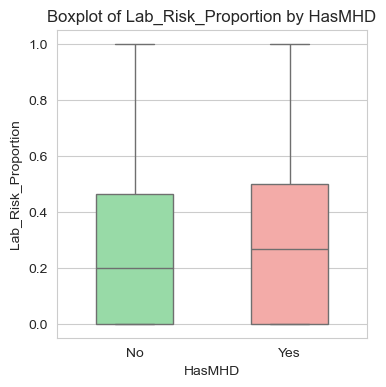

===== Lab_Risk_Proportion, histogram =====


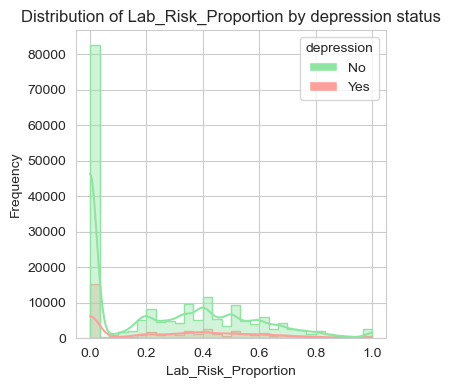

===== AGE_2015 =====

===== Age_2015, summary stats =====
Overall:
count    234846.000000
mean         50.043905
std          21.972825
min         -12.000000
25%          34.000000
50%          52.000000
75%          66.000000
max         111.000000
Name: Age_2015, dtype: float64

By group:
           count       mean        std   min   25%   50%   75%    max
HasMHD                                                               
0       194776.0  49.586048  22.472058  -7.0  33.0  51.0  66.0  111.0
1        40070.0  52.269503  19.209044 -12.0  38.0  53.0  66.0  107.0
===== Age_2015, boxplot =====


/var/folders/yb/n93q7gbn67v_pbwyvgl9kgy80000gn/T/ipykernel_18873/4246718001.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df, x=groupby, y=col, palette=category_colours, width=0.5)


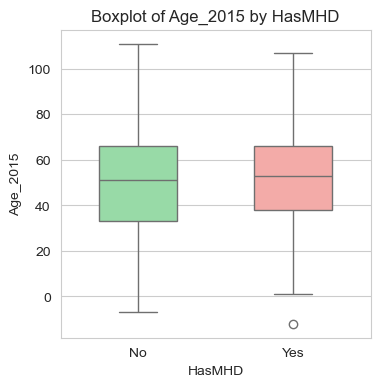

===== Age_2015, histogram =====


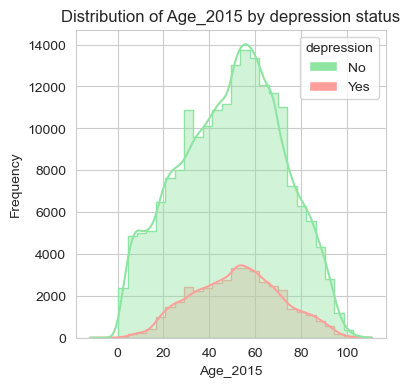

===== SHORTTERMMEDS_NUM =====

===== ShortTermMeds_Num, summary stats =====
Overall:
count    234869.000000
mean          2.270632
std           5.907644
min          -1.000000
25%           0.000000
50%           0.000000
75%           3.000000
max         236.000000
Name: ShortTermMeds_Num, dtype: float64

By group:
           count      mean       std  min  25%  50%  75%    max
HasMHD                                                         
0       194796.0  2.089858  5.367271 -1.0  0.0  0.0  3.0  236.0
1        40073.0  3.149377  7.974164 -1.0  0.0  0.0  4.0  222.0
===== ShortTermMeds_Num, boxplot =====


/var/folders/yb/n93q7gbn67v_pbwyvgl9kgy80000gn/T/ipykernel_18873/4246718001.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df, x=groupby, y=col, palette=category_colours, width=0.5)


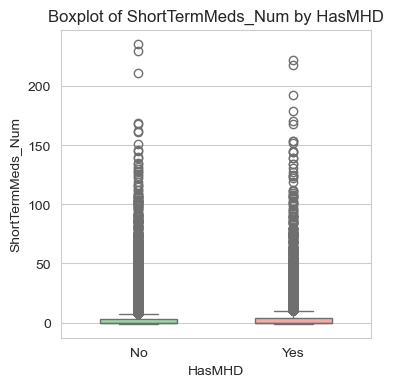

===== ShortTermMeds_Num, histogram =====


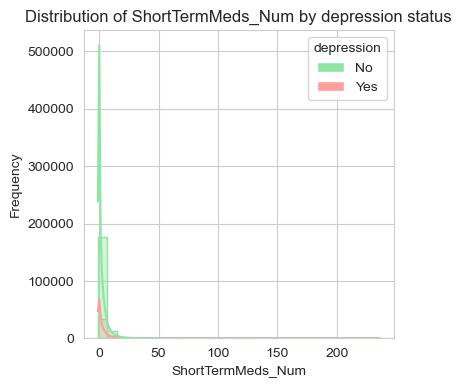

===== LONGTERMMEDS_NUM =====

===== LongTermMeds_Num, summary stats =====
Overall:
count    234869.000000
mean         13.912947
std          30.929102
min          -1.000000
25%           0.000000
50%           2.000000
75%          14.000000
max         662.000000
Name: LongTermMeds_Num, dtype: float64

By group:
           count       mean        std  min  25%  50%   75%    max
HasMHD                                                            
0       194796.0  12.635891  28.803350 -1.0  0.0  2.0  12.0  662.0
1        40073.0  20.120755  39.082164 -1.0  0.0  5.0  23.0  580.0
===== LongTermMeds_Num, boxplot =====


/var/folders/yb/n93q7gbn67v_pbwyvgl9kgy80000gn/T/ipykernel_18873/4246718001.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df, x=groupby, y=col, palette=category_colours, width=0.5)


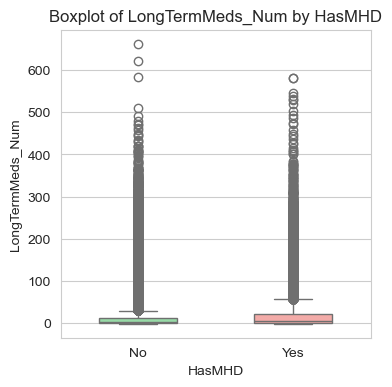

===== LongTermMeds_Num, histogram =====


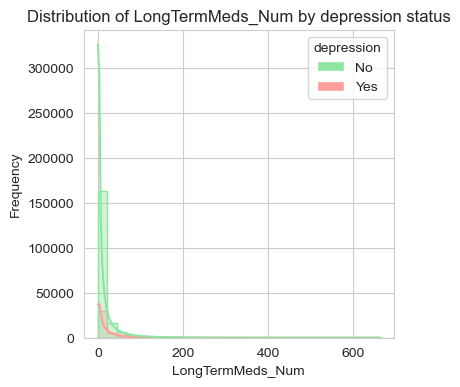

===== NUM_PHYSCOMORB =====

===== Num_PhysComorb, summary stats =====
Overall:
count    234869.000000
mean          0.595898
std           0.899054
min           0.000000
25%           0.000000
50%           0.000000
75%           1.000000
max          12.000000
Name: Num_PhysComorb, dtype: float64

By group:
           count      mean       std  min  25%  50%  75%   max
HasMHD                                                        
0       194796.0  0.547552  0.844909  0.0  0.0  0.0  1.0  12.0
1        40073.0  0.830909  1.095785  0.0  0.0  0.0  1.0  12.0
===== Num_PhysComorb, boxplot =====


/var/folders/yb/n93q7gbn67v_pbwyvgl9kgy80000gn/T/ipykernel_18873/4246718001.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df, x=groupby, y=col, palette=category_colours, width=0.5)


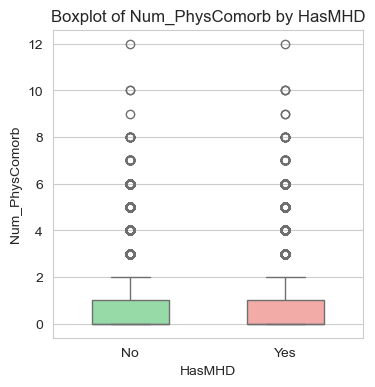

===== Num_PhysComorb, histogram =====


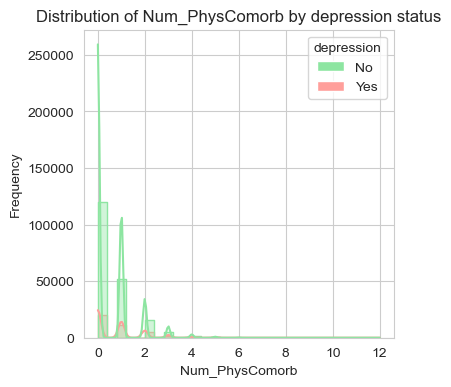

===== TOTAL_MEDPROCS =====

===== Total_MedProcs, summary stats =====
Overall:
count    234869.000000
mean          4.333995
std          12.038419
min           0.000000
25%           0.000000
50%           1.000000
75%           3.000000
max         537.000000
Name: Total_MedProcs, dtype: float64

By group:
           count      mean        std  min  25%  50%  75%    max
HasMHD                                                          
0       194796.0  4.146584  11.224728  0.0  0.0  1.0  3.0  537.0
1        40073.0  5.245003  15.360425  0.0  0.0  1.0  4.0  317.0
===== Total_MedProcs, boxplot =====


/var/folders/yb/n93q7gbn67v_pbwyvgl9kgy80000gn/T/ipykernel_18873/4246718001.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df, x=groupby, y=col, palette=category_colours, width=0.5)


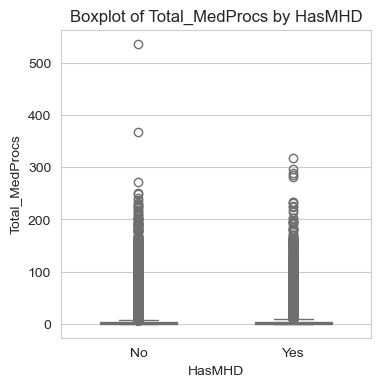

===== Total_MedProcs, histogram =====


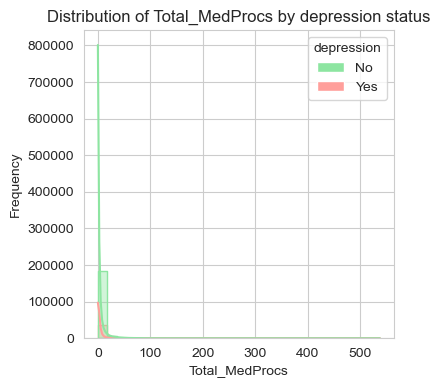

===== TOTAL_MEDICATIONS =====

===== Total_Medications, summary stats =====
Overall:
count    234869.000000
mean         25.818759
std          42.246487
min           0.000000
25%           3.000000
50%          12.000000
75%          30.000000
max         985.000000
Name: Total_Medications, dtype: float64

By group:
           count       mean        std  min  25%   50%   75%    max
HasMHD                                                             
0       194796.0  23.337055  38.592787  0.0  3.0  10.0  27.0  985.0
1        40073.0  37.882390  55.182697  0.0  6.0  20.0  47.0  816.0
===== Total_Medications, boxplot =====


/var/folders/yb/n93q7gbn67v_pbwyvgl9kgy80000gn/T/ipykernel_18873/4246718001.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df, x=groupby, y=col, palette=category_colours, width=0.5)


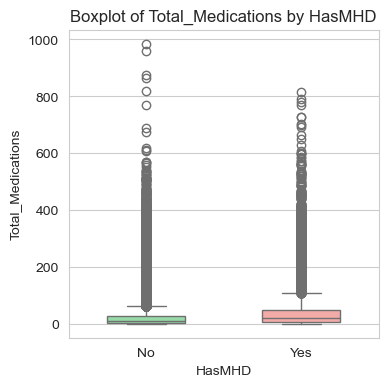

===== Total_Medications, histogram =====


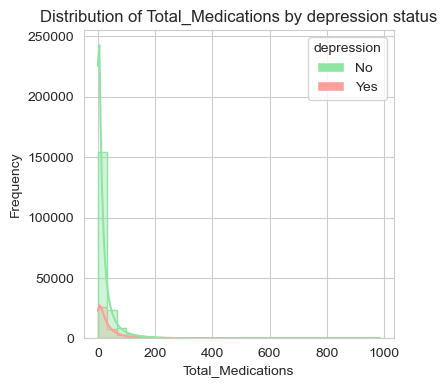

===== NUM_CHRONIC =====

===== Num_Chronic, summary stats =====
Overall:
count    234869.000000
mean          0.703716
std           1.053526
min           0.000000
25%           0.000000
50%           0.000000
75%           1.000000
max          15.000000
Name: Num_Chronic, dtype: float64

By group:
           count      mean       std  min  25%  50%  75%   max
HasMHD                                                        
0       194796.0  0.668833  1.017000  0.0  0.0  0.0  1.0  15.0
1        40073.0  0.873281  1.201214  0.0  0.0  0.0  1.0  12.0
===== Num_Chronic, boxplot =====


/var/folders/yb/n93q7gbn67v_pbwyvgl9kgy80000gn/T/ipykernel_18873/4246718001.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df, x=groupby, y=col, palette=category_colours, width=0.5)


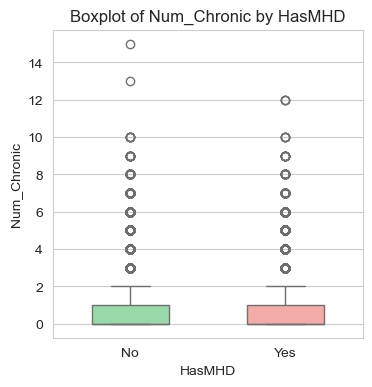

===== Num_Chronic, histogram =====


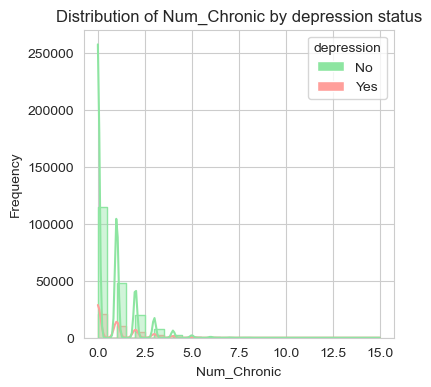

===== TOTAL_ENCOUNTERS =====

===== Total_Encounters, summary stats =====
Overall:
count    234869.000000
mean         39.432854
std          44.142399
min           1.000000
25%          13.000000
50%          27.000000
75%          50.000000
max        1398.000000
Name: Total_Encounters, dtype: float64

By group:
           count       mean        std  min   25%   50%   75%     max
HasMHD                                                               
0       194796.0  37.170851  41.595288  1.0  13.0  25.0  47.0  1398.0
1        40073.0  50.428518  53.520169  1.0  18.0  35.0  66.0  1215.0
===== Total_Encounters, boxplot =====


/var/folders/yb/n93q7gbn67v_pbwyvgl9kgy80000gn/T/ipykernel_18873/4246718001.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df, x=groupby, y=col, palette=category_colours, width=0.5)


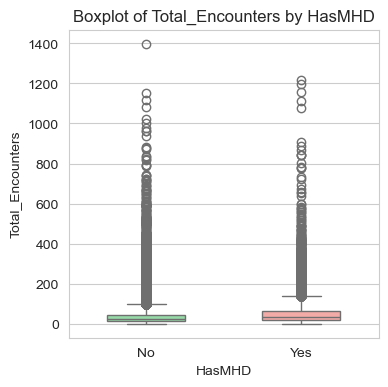

===== Total_Encounters, histogram =====


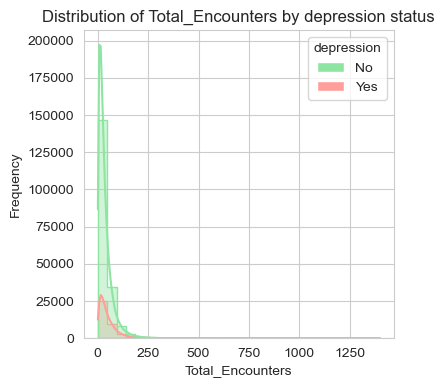

===== TOTAL_OVERALL_DIAGNOSES =====

===== Total_Overall_Diagnoses, summary stats =====
Overall:
count    234869.000000
mean          5.680694
std           7.292449
min           0.000000
25%           1.000000
50%           3.000000
75%           7.000000
max         118.000000
Name: Total_Overall_Diagnoses, dtype: float64

By group:
           count      mean       std  min  25%  50%  75%    max
HasMHD                                                         
0       194796.0  5.139012  6.583279  0.0  1.0  3.0  6.0  102.0
1        40073.0  8.313827  9.625791  1.0  3.0  5.0  9.0  118.0
===== Total_Overall_Diagnoses, boxplot =====


/var/folders/yb/n93q7gbn67v_pbwyvgl9kgy80000gn/T/ipykernel_18873/4246718001.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df, x=groupby, y=col, palette=category_colours, width=0.5)


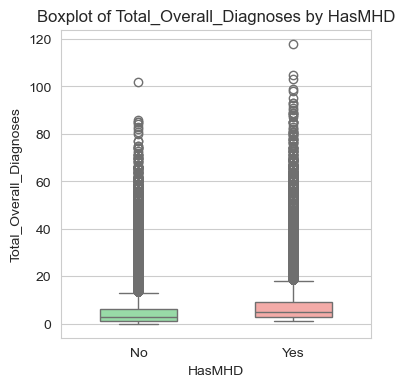

===== Total_Overall_Diagnoses, histogram =====


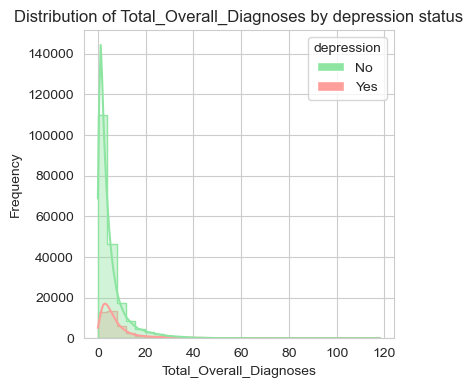

===== NUM_RISKS =====

===== Num_Risks, summary stats =====
Overall:
count    234869.000000
mean          1.671459
std           3.772628
min           0.000000
25%           0.000000
50%           0.000000
75%           2.000000
max         342.000000
Name: Num_Risks, dtype: float64

By group:
           count      mean       std  min  25%  50%  75%    max
HasMHD                                                         
0       194796.0  1.606229  3.617561  0.0  0.0  0.0  2.0  342.0
1        40073.0  1.988546  4.436504  0.0  0.0  0.0  2.0  194.0
===== Num_Risks, boxplot =====


/var/folders/yb/n93q7gbn67v_pbwyvgl9kgy80000gn/T/ipykernel_18873/4246718001.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df, x=groupby, y=col, palette=category_colours, width=0.5)


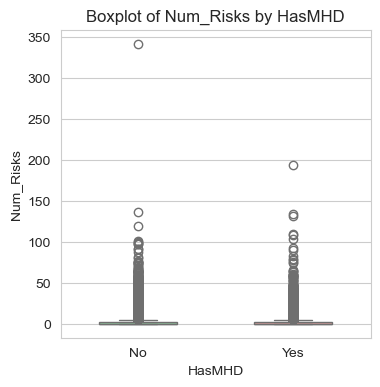

===== Num_Risks, histogram =====


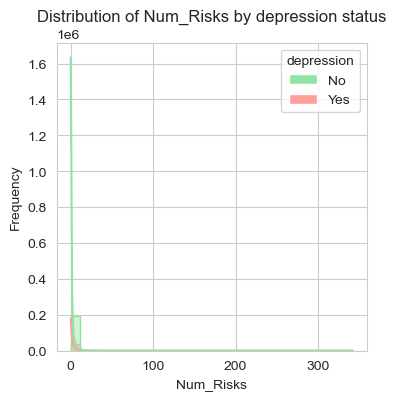

=====                Patient_ID  Sex_Bin  Age_2015  Num_Risks  \
0        1002000000000016      0.0      50.0          2   
1        1002000000000024      1.0      60.0          1   
2        1002000000000044      1.0      66.0          2   
3        1002000000000049      0.0      50.0          0   
4        1002000000000065      1.0      53.0          2   
...                   ...      ...       ...        ...   
234864  13001000000027092      0.0      32.0          9   
234865  13001000000027109      0.0      26.0          0   
234866  13001000000027112      1.0      17.0          3   
234867  13001000000027140      0.0       9.0          0   
234868  13001000000027240      1.0      51.0          2   

        Total_Overall_Diagnoses  Total_Encounters  Lab_Risk_Proportion  \
0                             3                13             0.312500   
1                             2                16             0.500000   
2                             1                44             0

/var/folders/yb/n93q7gbn67v_pbwyvgl9kgy80000gn/T/ipykernel_18873/4246718001.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df, x=groupby, y=col, palette=category_colours, width=0.5)


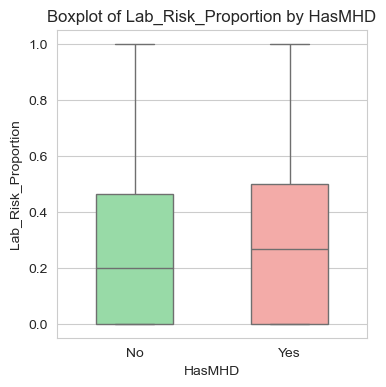

===== Lab_Risk_Proportion, histogram =====


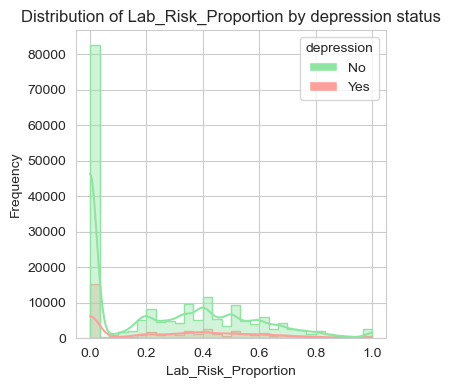

===== AGE_2015 =====

===== Age_2015, summary stats =====
Overall:
count    234846.000000
mean         50.043905
std          21.972825
min         -12.000000
25%          34.000000
50%          52.000000
75%          66.000000
max         111.000000
Name: Age_2015, dtype: float64

By group:
           count       mean        std   min   25%   50%   75%    max
HasMHD                                                               
0       194776.0  49.586048  22.472058  -7.0  33.0  51.0  66.0  111.0
1        40070.0  52.269503  19.209044 -12.0  38.0  53.0  66.0  107.0
===== Age_2015, boxplot =====


/var/folders/yb/n93q7gbn67v_pbwyvgl9kgy80000gn/T/ipykernel_18873/4246718001.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df, x=groupby, y=col, palette=category_colours, width=0.5)


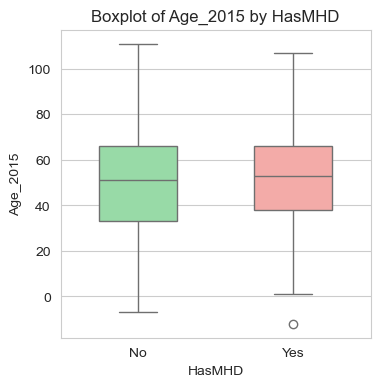

===== Age_2015, histogram =====


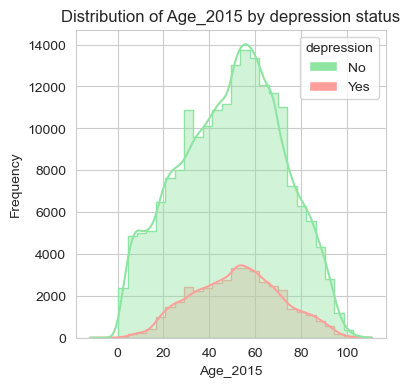

===== SHORTTERMMEDS_NUM =====

===== ShortTermMeds_Num, summary stats =====
Overall:
count    234869.000000
mean          2.270632
std           5.907644
min          -1.000000
25%           0.000000
50%           0.000000
75%           3.000000
max         236.000000
Name: ShortTermMeds_Num, dtype: float64

By group:
           count      mean       std  min  25%  50%  75%    max
HasMHD                                                         
0       194796.0  2.089858  5.367271 -1.0  0.0  0.0  3.0  236.0
1        40073.0  3.149377  7.974164 -1.0  0.0  0.0  4.0  222.0
===== ShortTermMeds_Num, boxplot =====


/var/folders/yb/n93q7gbn67v_pbwyvgl9kgy80000gn/T/ipykernel_18873/4246718001.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df, x=groupby, y=col, palette=category_colours, width=0.5)


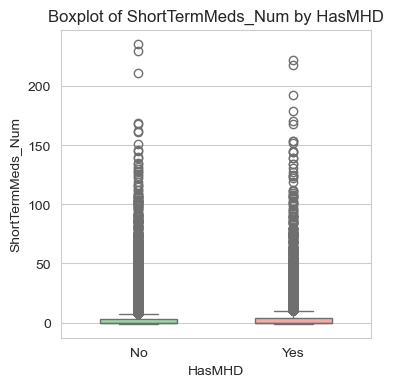

===== ShortTermMeds_Num, histogram =====


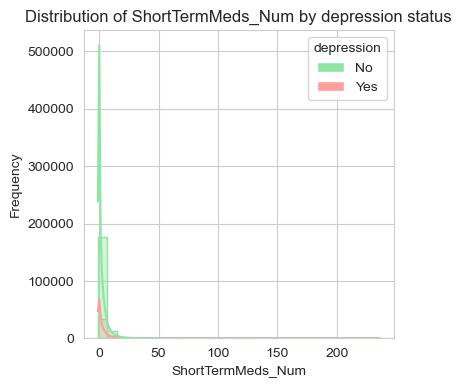

===== LONGTERMMEDS_NUM =====

===== LongTermMeds_Num, summary stats =====
Overall:
count    234869.000000
mean         13.912947
std          30.929102
min          -1.000000
25%           0.000000
50%           2.000000
75%          14.000000
max         662.000000
Name: LongTermMeds_Num, dtype: float64

By group:
           count       mean        std  min  25%  50%   75%    max
HasMHD                                                            
0       194796.0  12.635891  28.803350 -1.0  0.0  2.0  12.0  662.0
1        40073.0  20.120755  39.082164 -1.0  0.0  5.0  23.0  580.0
===== LongTermMeds_Num, boxplot =====


/var/folders/yb/n93q7gbn67v_pbwyvgl9kgy80000gn/T/ipykernel_18873/4246718001.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df, x=groupby, y=col, palette=category_colours, width=0.5)


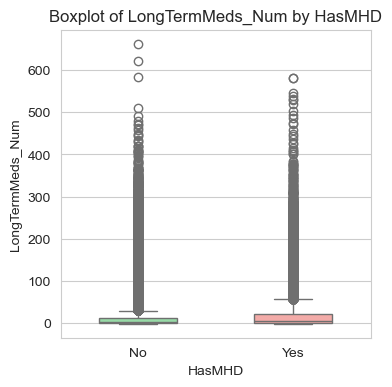

===== LongTermMeds_Num, histogram =====


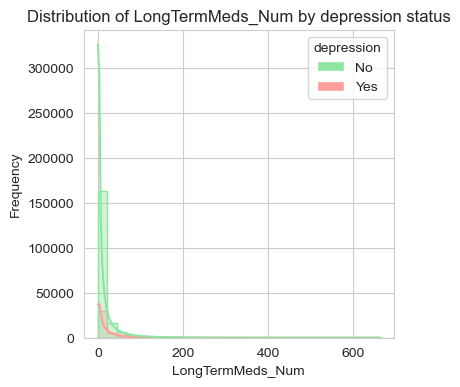

===== NUM_PHYSCOMORB =====

===== Num_PhysComorb, summary stats =====
Overall:
count    234869.000000
mean          0.595898
std           0.899054
min           0.000000
25%           0.000000
50%           0.000000
75%           1.000000
max          12.000000
Name: Num_PhysComorb, dtype: float64

By group:
           count      mean       std  min  25%  50%  75%   max
HasMHD                                                        
0       194796.0  0.547552  0.844909  0.0  0.0  0.0  1.0  12.0
1        40073.0  0.830909  1.095785  0.0  0.0  0.0  1.0  12.0
===== Num_PhysComorb, boxplot =====


/var/folders/yb/n93q7gbn67v_pbwyvgl9kgy80000gn/T/ipykernel_18873/4246718001.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df, x=groupby, y=col, palette=category_colours, width=0.5)


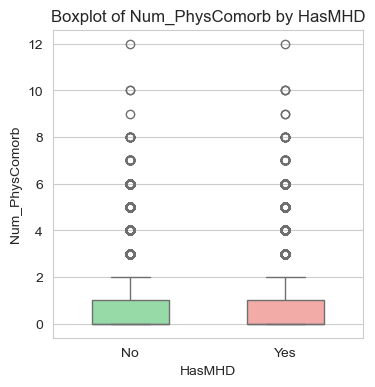

===== Num_PhysComorb, histogram =====


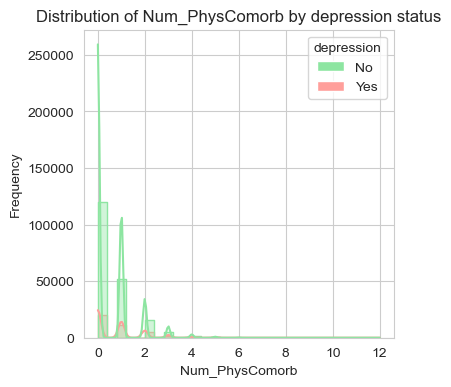

===== TOTAL_MEDPROCS =====

===== Total_MedProcs, summary stats =====
Overall:
count    234869.000000
mean          4.333995
std          12.038419
min           0.000000
25%           0.000000
50%           1.000000
75%           3.000000
max         537.000000
Name: Total_MedProcs, dtype: float64

By group:
           count      mean        std  min  25%  50%  75%    max
HasMHD                                                          
0       194796.0  4.146584  11.224728  0.0  0.0  1.0  3.0  537.0
1        40073.0  5.245003  15.360425  0.0  0.0  1.0  4.0  317.0
===== Total_MedProcs, boxplot =====


/var/folders/yb/n93q7gbn67v_pbwyvgl9kgy80000gn/T/ipykernel_18873/4246718001.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df, x=groupby, y=col, palette=category_colours, width=0.5)


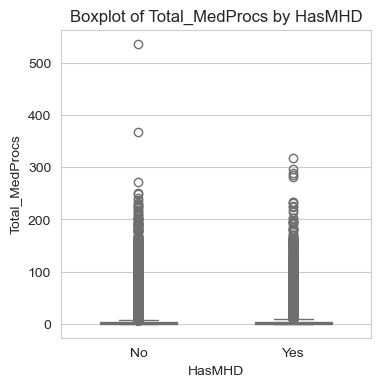

===== Total_MedProcs, histogram =====


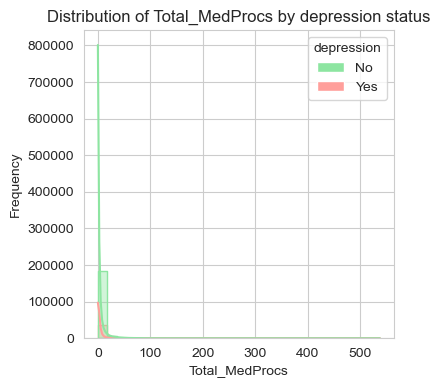

===== TOTAL_MEDICATIONS =====

===== Total_Medications, summary stats =====
Overall:
count    234869.000000
mean         25.818759
std          42.246487
min           0.000000
25%           3.000000
50%          12.000000
75%          30.000000
max         985.000000
Name: Total_Medications, dtype: float64

By group:
           count       mean        std  min  25%   50%   75%    max
HasMHD                                                             
0       194796.0  23.337055  38.592787  0.0  3.0  10.0  27.0  985.0
1        40073.0  37.882390  55.182697  0.0  6.0  20.0  47.0  816.0
===== Total_Medications, boxplot =====


/var/folders/yb/n93q7gbn67v_pbwyvgl9kgy80000gn/T/ipykernel_18873/4246718001.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df, x=groupby, y=col, palette=category_colours, width=0.5)


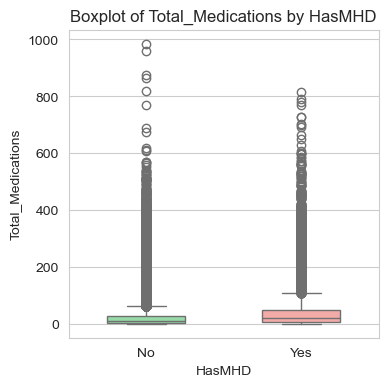

===== Total_Medications, histogram =====


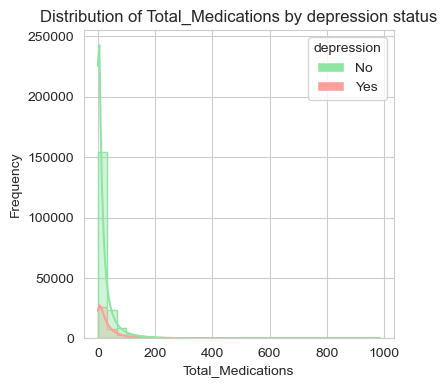

===== NUM_CHRONIC =====

===== Num_Chronic, summary stats =====
Overall:
count    234869.000000
mean          0.703716
std           1.053526
min           0.000000
25%           0.000000
50%           0.000000
75%           1.000000
max          15.000000
Name: Num_Chronic, dtype: float64

By group:
           count      mean       std  min  25%  50%  75%   max
HasMHD                                                        
0       194796.0  0.668833  1.017000  0.0  0.0  0.0  1.0  15.0
1        40073.0  0.873281  1.201214  0.0  0.0  0.0  1.0  12.0
===== Num_Chronic, boxplot =====


/var/folders/yb/n93q7gbn67v_pbwyvgl9kgy80000gn/T/ipykernel_18873/4246718001.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df, x=groupby, y=col, palette=category_colours, width=0.5)


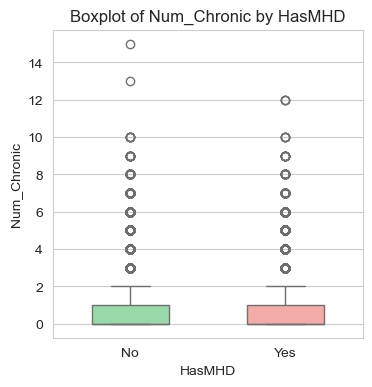

===== Num_Chronic, histogram =====


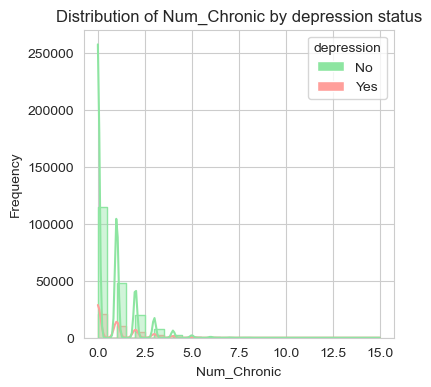

===== TOTAL_ENCOUNTERS =====

===== Total_Encounters, summary stats =====
Overall:
count    234869.000000
mean         39.432854
std          44.142399
min           1.000000
25%          13.000000
50%          27.000000
75%          50.000000
max        1398.000000
Name: Total_Encounters, dtype: float64

By group:
           count       mean        std  min   25%   50%   75%     max
HasMHD                                                               
0       194796.0  37.170851  41.595288  1.0  13.0  25.0  47.0  1398.0
1        40073.0  50.428518  53.520169  1.0  18.0  35.0  66.0  1215.0
===== Total_Encounters, boxplot =====


/var/folders/yb/n93q7gbn67v_pbwyvgl9kgy80000gn/T/ipykernel_18873/4246718001.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df, x=groupby, y=col, palette=category_colours, width=0.5)


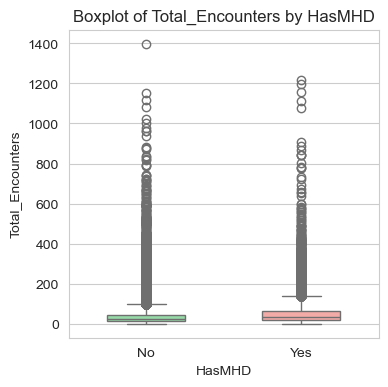

===== Total_Encounters, histogram =====


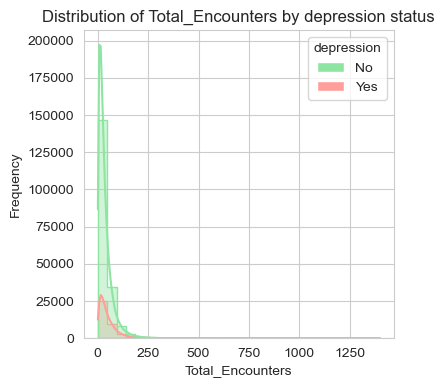

===== TOTAL_OVERALL_DIAGNOSES =====

===== Total_Overall_Diagnoses, summary stats =====
Overall:
count    234869.000000
mean          5.680694
std           7.292449
min           0.000000
25%           1.000000
50%           3.000000
75%           7.000000
max         118.000000
Name: Total_Overall_Diagnoses, dtype: float64

By group:
           count      mean       std  min  25%  50%  75%    max
HasMHD                                                         
0       194796.0  5.139012  6.583279  0.0  1.0  3.0  6.0  102.0
1        40073.0  8.313827  9.625791  1.0  3.0  5.0  9.0  118.0
===== Total_Overall_Diagnoses, boxplot =====


/var/folders/yb/n93q7gbn67v_pbwyvgl9kgy80000gn/T/ipykernel_18873/4246718001.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df, x=groupby, y=col, palette=category_colours, width=0.5)


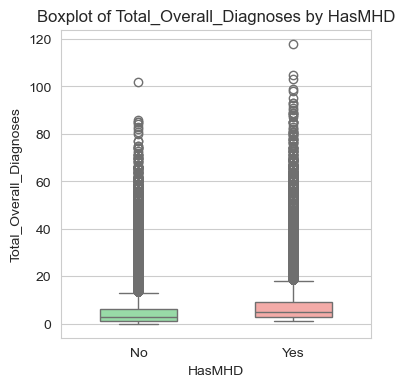

===== Total_Overall_Diagnoses, histogram =====


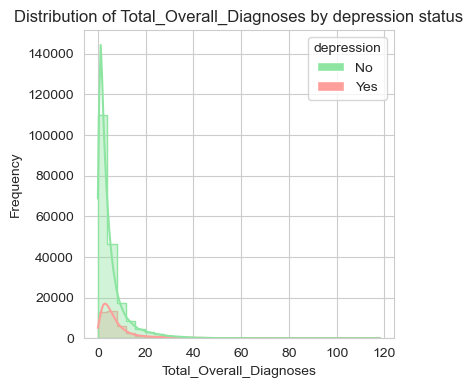

===== NUM_RISKS =====

===== Num_Risks, summary stats =====
Overall:
count    234869.000000
mean          1.671459
std           3.772628
min           0.000000
25%           0.000000
50%           0.000000
75%           2.000000
max         342.000000
Name: Num_Risks, dtype: float64

By group:
           count      mean       std  min  25%  50%  75%    max
HasMHD                                                         
0       194796.0  1.606229  3.617561  0.0  0.0  0.0  2.0  342.0
1        40073.0  1.988546  4.436504  0.0  0.0  0.0  2.0  194.0
===== Num_Risks, boxplot =====


/var/folders/yb/n93q7gbn67v_pbwyvgl9kgy80000gn/T/ipykernel_18873/4246718001.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df, x=groupby, y=col, palette=category_colours, width=0.5)


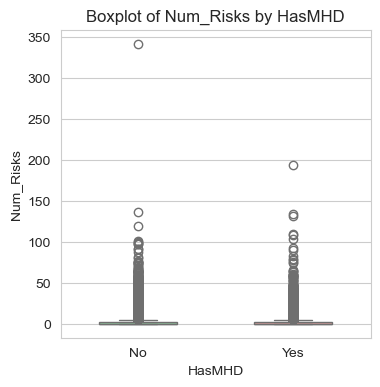

===== Num_Risks, histogram =====


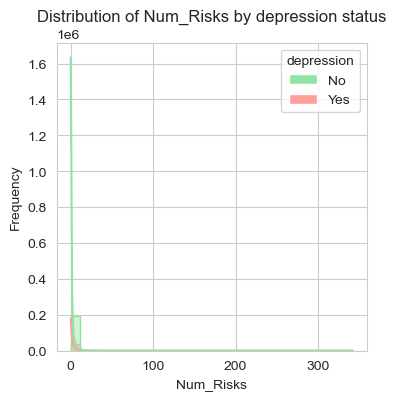

=====                Patient_ID  Sex_Bin  Age_2015  Num_Risks  \
0        1002000000000016      0.0      50.0          2   
1        1002000000000024      1.0      60.0          1   
2        1002000000000044      1.0      66.0          2   
3        1002000000000049      0.0      50.0          0   
4        1002000000000065      1.0      53.0          2   
...                   ...      ...       ...        ...   
234864  13001000000027092      0.0      32.0          9   
234865  13001000000027109      0.0      26.0          0   
234866  13001000000027112      1.0      17.0          3   
234867  13001000000027140      0.0       9.0          0   
234868  13001000000027240      1.0      51.0          2   

        Total_Overall_Diagnoses  Total_Encounters  Lab_Risk_Proportion  \
0                             3                13             0.312500   
1                             2                16             0.500000   
2                             1                44             0

/var/folders/yb/n93q7gbn67v_pbwyvgl9kgy80000gn/T/ipykernel_18873/4246718001.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df, x=groupby, y=col, palette=category_colours, width=0.5)


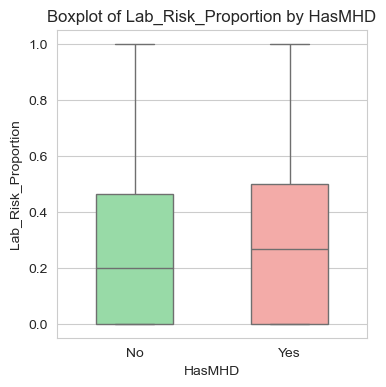

===== Lab_Risk_Proportion, histogram =====


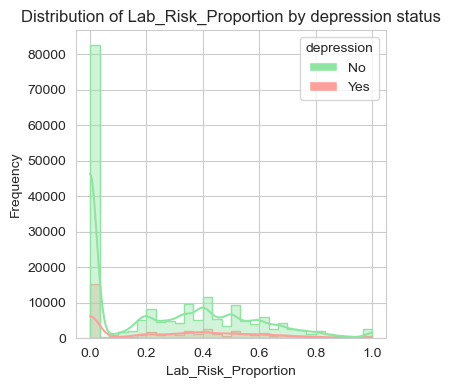

===== AGE_2015 =====

===== Age_2015, summary stats =====
Overall:
count    234846.000000
mean         50.043905
std          21.972825
min         -12.000000
25%          34.000000
50%          52.000000
75%          66.000000
max         111.000000
Name: Age_2015, dtype: float64

By group:
           count       mean        std   min   25%   50%   75%    max
HasMHD                                                               
0       194776.0  49.586048  22.472058  -7.0  33.0  51.0  66.0  111.0
1        40070.0  52.269503  19.209044 -12.0  38.0  53.0  66.0  107.0
===== Age_2015, boxplot =====


/var/folders/yb/n93q7gbn67v_pbwyvgl9kgy80000gn/T/ipykernel_18873/4246718001.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df, x=groupby, y=col, palette=category_colours, width=0.5)


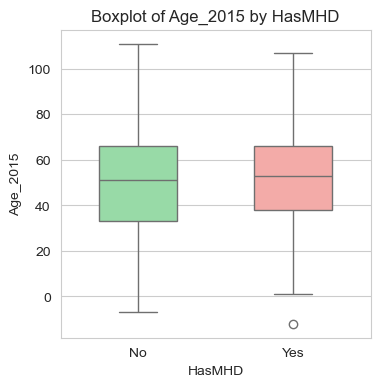

===== Age_2015, histogram =====


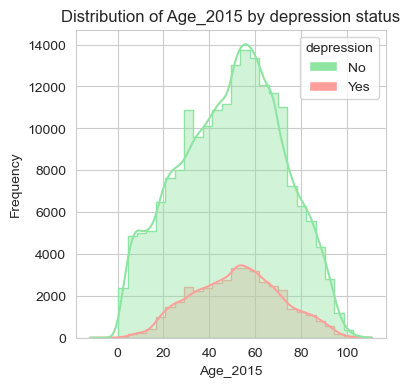

===== SHORTTERMMEDS_NUM =====

===== ShortTermMeds_Num, summary stats =====
Overall:
count    234869.000000
mean          2.270632
std           5.907644
min          -1.000000
25%           0.000000
50%           0.000000
75%           3.000000
max         236.000000
Name: ShortTermMeds_Num, dtype: float64

By group:
           count      mean       std  min  25%  50%  75%    max
HasMHD                                                         
0       194796.0  2.089858  5.367271 -1.0  0.0  0.0  3.0  236.0
1        40073.0  3.149377  7.974164 -1.0  0.0  0.0  4.0  222.0
===== ShortTermMeds_Num, boxplot =====


/var/folders/yb/n93q7gbn67v_pbwyvgl9kgy80000gn/T/ipykernel_18873/4246718001.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df, x=groupby, y=col, palette=category_colours, width=0.5)


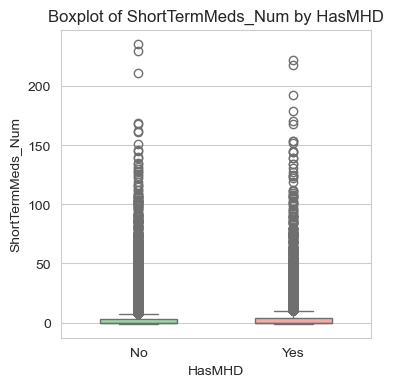

===== ShortTermMeds_Num, histogram =====


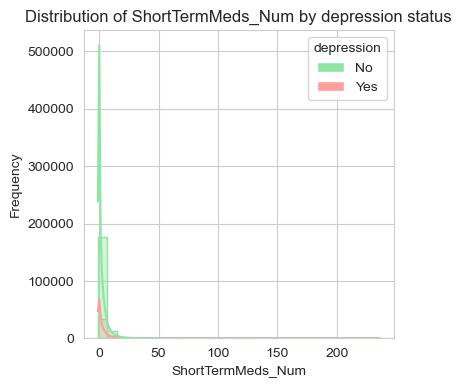

===== LONGTERMMEDS_NUM =====

===== LongTermMeds_Num, summary stats =====
Overall:
count    234869.000000
mean         13.912947
std          30.929102
min          -1.000000
25%           0.000000
50%           2.000000
75%          14.000000
max         662.000000
Name: LongTermMeds_Num, dtype: float64

By group:
           count       mean        std  min  25%  50%   75%    max
HasMHD                                                            
0       194796.0  12.635891  28.803350 -1.0  0.0  2.0  12.0  662.0
1        40073.0  20.120755  39.082164 -1.0  0.0  5.0  23.0  580.0
===== LongTermMeds_Num, boxplot =====


/var/folders/yb/n93q7gbn67v_pbwyvgl9kgy80000gn/T/ipykernel_18873/4246718001.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df, x=groupby, y=col, palette=category_colours, width=0.5)


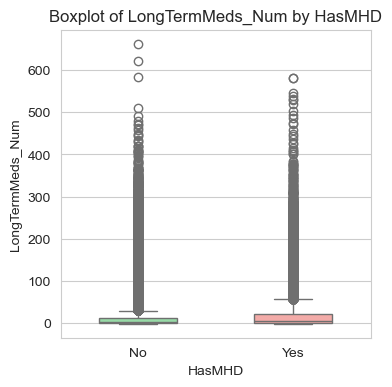

===== LongTermMeds_Num, histogram =====


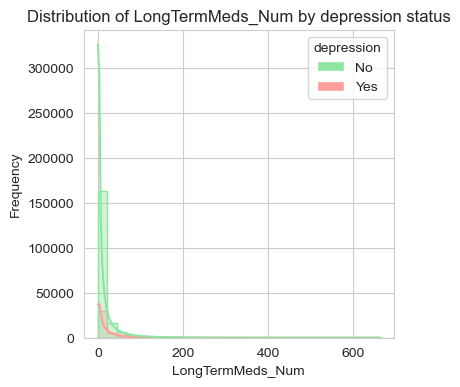

===== NUM_PHYSCOMORB =====

===== Num_PhysComorb, summary stats =====
Overall:
count    234869.000000
mean          0.595898
std           0.899054
min           0.000000
25%           0.000000
50%           0.000000
75%           1.000000
max          12.000000
Name: Num_PhysComorb, dtype: float64

By group:
           count      mean       std  min  25%  50%  75%   max
HasMHD                                                        
0       194796.0  0.547552  0.844909  0.0  0.0  0.0  1.0  12.0
1        40073.0  0.830909  1.095785  0.0  0.0  0.0  1.0  12.0
===== Num_PhysComorb, boxplot =====


/var/folders/yb/n93q7gbn67v_pbwyvgl9kgy80000gn/T/ipykernel_18873/4246718001.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df, x=groupby, y=col, palette=category_colours, width=0.5)


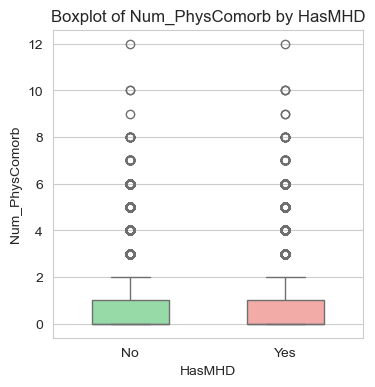

===== Num_PhysComorb, histogram =====


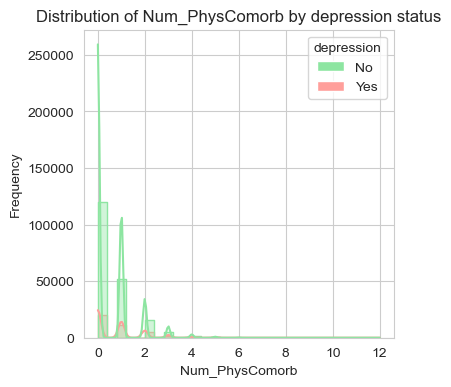

===== TOTAL_MEDPROCS =====

===== Total_MedProcs, summary stats =====
Overall:
count    234869.000000
mean          4.333995
std          12.038419
min           0.000000
25%           0.000000
50%           1.000000
75%           3.000000
max         537.000000
Name: Total_MedProcs, dtype: float64

By group:
           count      mean        std  min  25%  50%  75%    max
HasMHD                                                          
0       194796.0  4.146584  11.224728  0.0  0.0  1.0  3.0  537.0
1        40073.0  5.245003  15.360425  0.0  0.0  1.0  4.0  317.0
===== Total_MedProcs, boxplot =====


/var/folders/yb/n93q7gbn67v_pbwyvgl9kgy80000gn/T/ipykernel_18873/4246718001.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df, x=groupby, y=col, palette=category_colours, width=0.5)


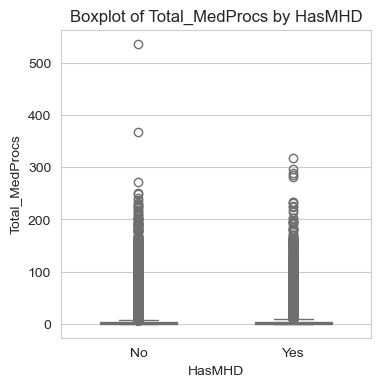

===== Total_MedProcs, histogram =====


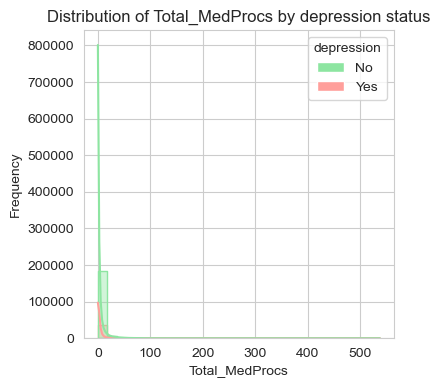

===== TOTAL_MEDICATIONS =====

===== Total_Medications, summary stats =====
Overall:
count    234869.000000
mean         25.818759
std          42.246487
min           0.000000
25%           3.000000
50%          12.000000
75%          30.000000
max         985.000000
Name: Total_Medications, dtype: float64

By group:
           count       mean        std  min  25%   50%   75%    max
HasMHD                                                             
0       194796.0  23.337055  38.592787  0.0  3.0  10.0  27.0  985.0
1        40073.0  37.882390  55.182697  0.0  6.0  20.0  47.0  816.0
===== Total_Medications, boxplot =====


/var/folders/yb/n93q7gbn67v_pbwyvgl9kgy80000gn/T/ipykernel_18873/4246718001.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df, x=groupby, y=col, palette=category_colours, width=0.5)


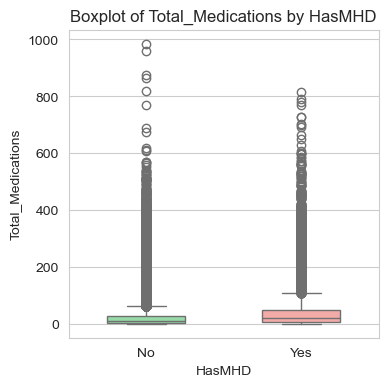

===== Total_Medications, histogram =====


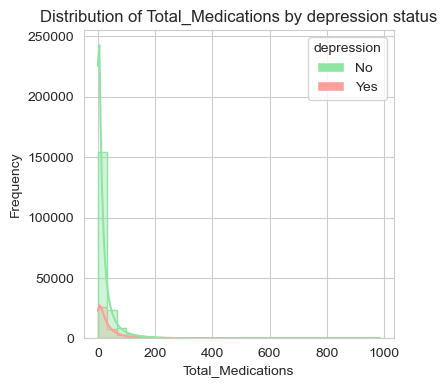

===== NUM_CHRONIC =====

===== Num_Chronic, summary stats =====
Overall:
count    234869.000000
mean          0.703716
std           1.053526
min           0.000000
25%           0.000000
50%           0.000000
75%           1.000000
max          15.000000
Name: Num_Chronic, dtype: float64

By group:
           count      mean       std  min  25%  50%  75%   max
HasMHD                                                        
0       194796.0  0.668833  1.017000  0.0  0.0  0.0  1.0  15.0
1        40073.0  0.873281  1.201214  0.0  0.0  0.0  1.0  12.0
===== Num_Chronic, boxplot =====


/var/folders/yb/n93q7gbn67v_pbwyvgl9kgy80000gn/T/ipykernel_18873/4246718001.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df, x=groupby, y=col, palette=category_colours, width=0.5)


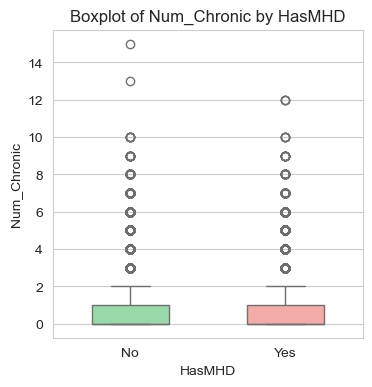

===== Num_Chronic, histogram =====


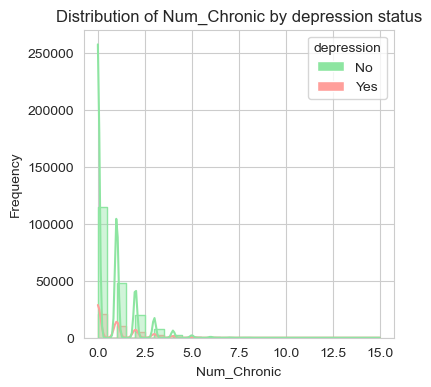

===== TOTAL_ENCOUNTERS =====

===== Total_Encounters, summary stats =====
Overall:
count    234869.000000
mean         39.432854
std          44.142399
min           1.000000
25%          13.000000
50%          27.000000
75%          50.000000
max        1398.000000
Name: Total_Encounters, dtype: float64

By group:
           count       mean        std  min   25%   50%   75%     max
HasMHD                                                               
0       194796.0  37.170851  41.595288  1.0  13.0  25.0  47.0  1398.0
1        40073.0  50.428518  53.520169  1.0  18.0  35.0  66.0  1215.0
===== Total_Encounters, boxplot =====


/var/folders/yb/n93q7gbn67v_pbwyvgl9kgy80000gn/T/ipykernel_18873/4246718001.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df, x=groupby, y=col, palette=category_colours, width=0.5)


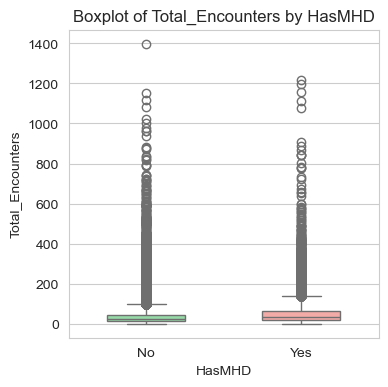

===== Total_Encounters, histogram =====


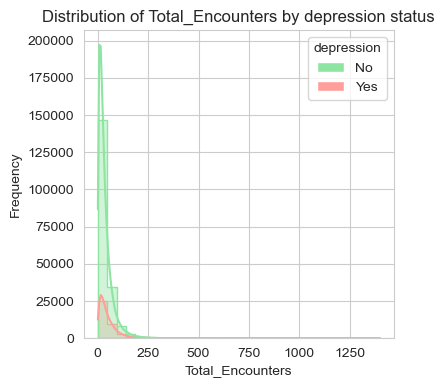

===== TOTAL_OVERALL_DIAGNOSES =====

===== Total_Overall_Diagnoses, summary stats =====
Overall:
count    234869.000000
mean          5.680694
std           7.292449
min           0.000000
25%           1.000000
50%           3.000000
75%           7.000000
max         118.000000
Name: Total_Overall_Diagnoses, dtype: float64

By group:
           count      mean       std  min  25%  50%  75%    max
HasMHD                                                         
0       194796.0  5.139012  6.583279  0.0  1.0  3.0  6.0  102.0
1        40073.0  8.313827  9.625791  1.0  3.0  5.0  9.0  118.0
===== Total_Overall_Diagnoses, boxplot =====


/var/folders/yb/n93q7gbn67v_pbwyvgl9kgy80000gn/T/ipykernel_18873/4246718001.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df, x=groupby, y=col, palette=category_colours, width=0.5)


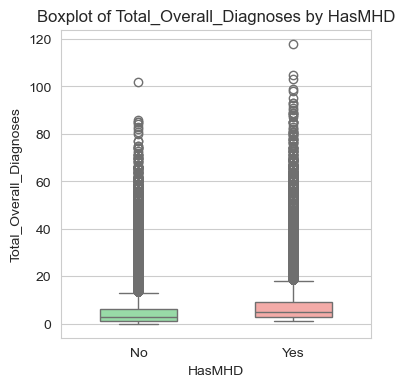

===== Total_Overall_Diagnoses, histogram =====


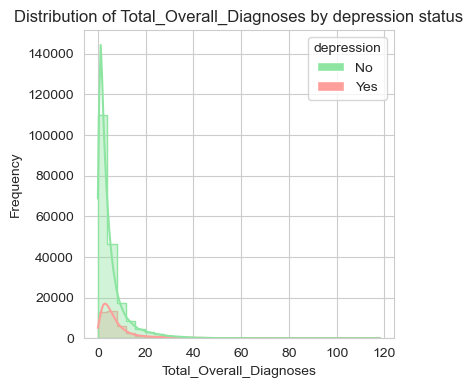

===== NUM_RISKS =====

===== Num_Risks, summary stats =====
Overall:
count    234869.000000
mean          1.671459
std           3.772628
min           0.000000
25%           0.000000
50%           0.000000
75%           2.000000
max         342.000000
Name: Num_Risks, dtype: float64

By group:
           count      mean       std  min  25%  50%  75%    max
HasMHD                                                         
0       194796.0  1.606229  3.617561  0.0  0.0  0.0  2.0  342.0
1        40073.0  1.988546  4.436504  0.0  0.0  0.0  2.0  194.0
===== Num_Risks, boxplot =====


/var/folders/yb/n93q7gbn67v_pbwyvgl9kgy80000gn/T/ipykernel_18873/4246718001.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df, x=groupby, y=col, palette=category_colours, width=0.5)


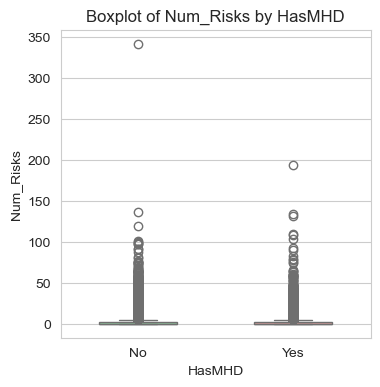

===== Num_Risks, histogram =====


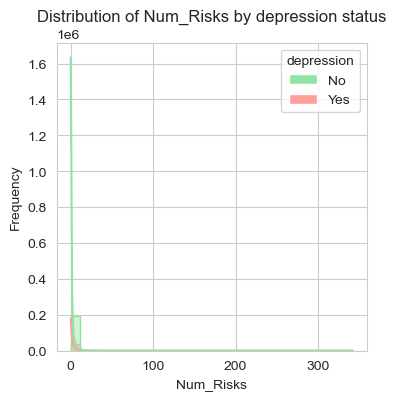

In [27]:
continuous_columns = ['Lab_Risk_Proportion', 'Age_2015', 'ShortTermMeds_Num', 'LongTermMeds_Num',
                      'Num_PhysComorb', 'Total_MedProcs', 'Total_Medications', 'Num_Chronic', 
                      'Total_Encounters', 'Total_Overall_Diagnoses', 'Num_Risks']

palette = sns.color_palette("pastel")
category_colours = [palette[2], palette[3]]
sns.set_style("whitegrid")

for k, v in combined_df.items():
    print(f'===== {v} Continuous Plots ======')
    for c in continuous_columns:
        print(f'===== {c.upper()} =====')
        print_summary_stats(v, c, groupby='HasMHD')
        make_boxplot(v, c, groupby='HasMHD', category_colours=category_colours)
        make_histplot(v, c, groupby='HasMHD', category_colours=category_colours)

===== combined_isolated_pca_128, SEX_BIN =====
Sex_Bin
1.0    143000
0.0     91848
NaN        21
Name: count, dtype: int64
Sex_Bin
1.0    0.609
0.0    0.391
NaN    0.000
Name: proportion, dtype: float64

Crosstab (counts):
HasMHD        0      1
Sex_Bin               
0.0       78685  13163
1.0      116093  26907

Crosstab (row %):
HasMHD       0      1
Sex_Bin              
0.0      0.857  0.143
1.0      0.812  0.188
Column: Sex_Bin

Sex_Bin
1.0    60.890448
0.0    39.109552
Name: proportion, dtype: float64


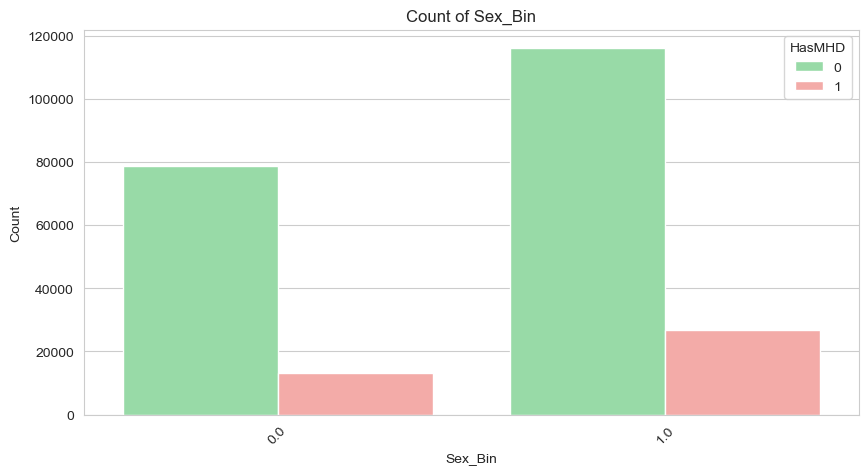



===== combined_isolated_pca_128, STATUS_ACTIVE =====
Status_Active
1    158248
0     76621
Name: count, dtype: int64
Status_Active
1    0.674
0    0.326
Name: proportion, dtype: float64

Crosstab (counts):
HasMHD              0      1
Status_Active               
0               63253  13368
1              131543  26705

Crosstab (row %):
HasMHD             0      1
Status_Active              
0              0.826  0.174
1              0.831  0.169
Column: Status_Active

Status_Active
1    67.377134
0    32.622866
Name: proportion, dtype: float64


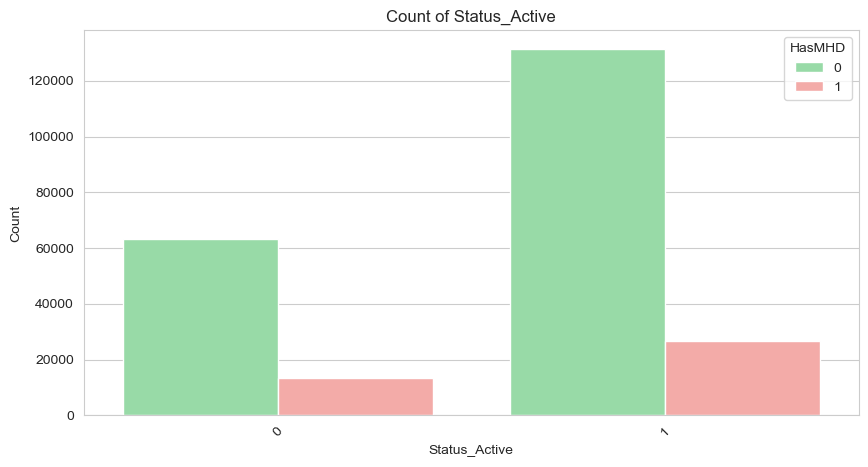



===== combined_isolated_pca_128, STATUS_DECEASED =====
Status_Deceased
0    228863
1      6006
Name: count, dtype: int64
Status_Deceased
0    0.974
1    0.026
Name: proportion, dtype: float64

Crosstab (counts):
HasMHD                0      1
Status_Deceased               
0                189990  38873
1                  4806   1200

Crosstab (row %):
HasMHD              0     1
Status_Deceased            
0                0.83  0.17
1                0.80  0.20
Column: Status_Deceased

Status_Deceased
0    97.44283
1     2.55717
Name: proportion, dtype: float64


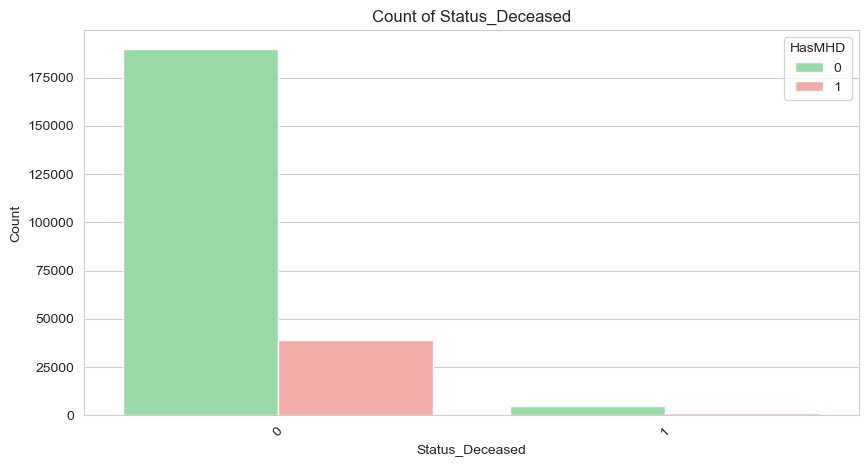



===== combined_isolated_pca_128, STATUS_INACTIVE =====
Status_Inactive
0    221664
1     13205
Name: count, dtype: int64
Status_Inactive
0    0.944
1    0.056
Name: proportion, dtype: float64

Crosstab (counts):
HasMHD                0      1
Status_Inactive               
0                183816  37848
1                 10980   2225

Crosstab (row %):
HasMHD               0      1
Status_Inactive              
0                0.829  0.171
1                0.832  0.168
Column: Status_Inactive

Status_Inactive
0    94.377717
1     5.622283
Name: proportion, dtype: float64


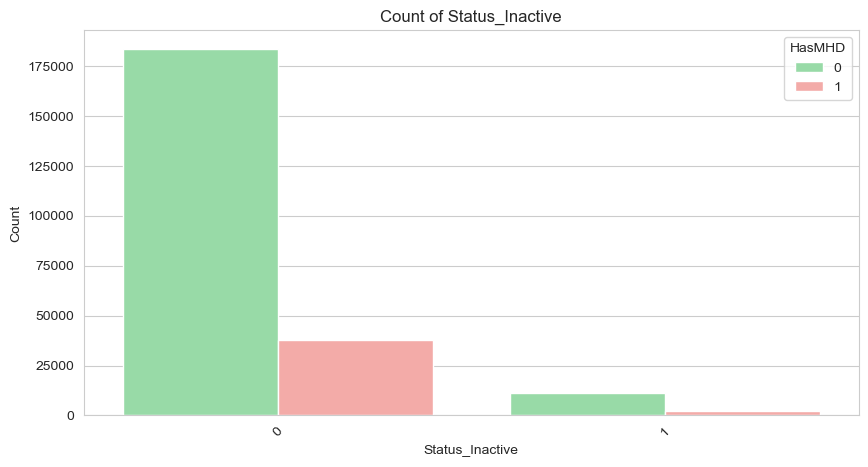



===== combined_isolated_pca_128, STATUS_UNKNOWN =====
Status_Unknown
0    177671
1     57198
Name: count, dtype: int64
Status_Unknown
0    0.756
1    0.244
Name: proportion, dtype: float64

Crosstab (counts):
HasMHD               0      1
Status_Unknown               
0               147474  30197
1                47322   9876

Crosstab (row %):
HasMHD              0      1
Status_Unknown              
0               0.830  0.170
1               0.827  0.173
Column: Status_Unknown

Status_Unknown
0    75.64685
1    24.35315
Name: proportion, dtype: float64


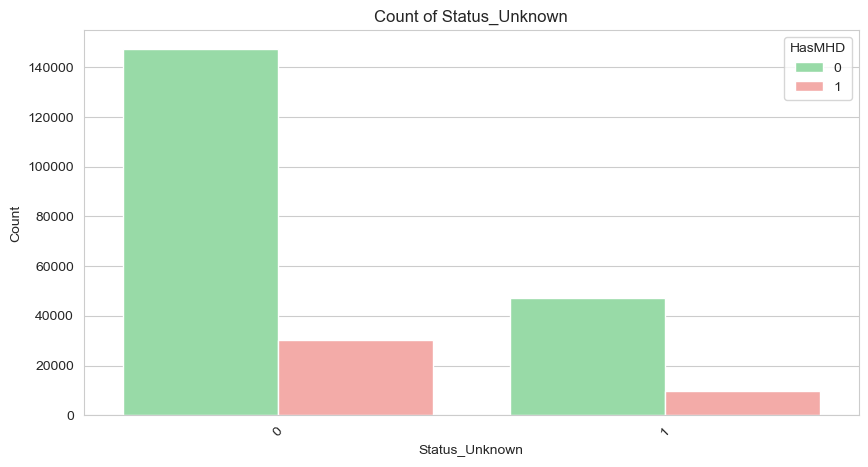



===== combined_isolated_pca_128, DIABETES_BIN =====
Diabetes_Bin
0    222276
1     12593
Name: count, dtype: int64
Diabetes_Bin
0    0.946
1    0.054
Name: proportion, dtype: float64

Crosstab (counts):
HasMHD             0      1
Diabetes_Bin               
0             185245  37031
1               9551   3042

Crosstab (row %):
HasMHD            0      1
Diabetes_Bin              
0             0.833  0.167
1             0.758  0.242
Column: Diabetes_Bin

Diabetes_Bin
0    94.638288
1     5.361712
Name: proportion, dtype: float64


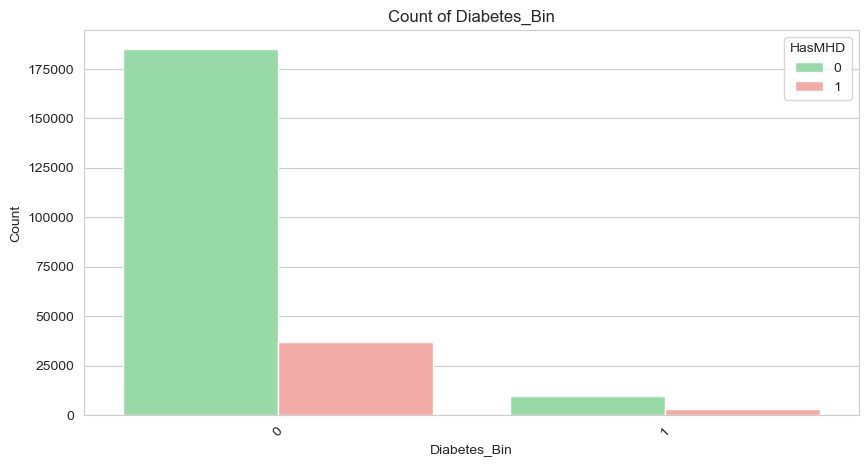



===== combined_isolated_pca_128, ESSENTIAL (PRIMARY) HYPERTENSION_BIN =====
Essential (primary) hypertension_Bin
0    214890
1     19979
Name: count, dtype: int64
Essential (primary) hypertension_Bin
0    0.915
1    0.085
Name: proportion, dtype: float64

Crosstab (counts):
HasMHD                                     0      1
Essential (primary) hypertension_Bin               
0                                     180051  34839
1                                      14745   5234

Crosstab (row %):
HasMHD                                    0      1
Essential (primary) hypertension_Bin              
0                                     0.838  0.162
1                                     0.738  0.262
Column: Essential (primary) hypertension_Bin

Essential (primary) hypertension_Bin
0    91.493556
1     8.506444
Name: proportion, dtype: float64


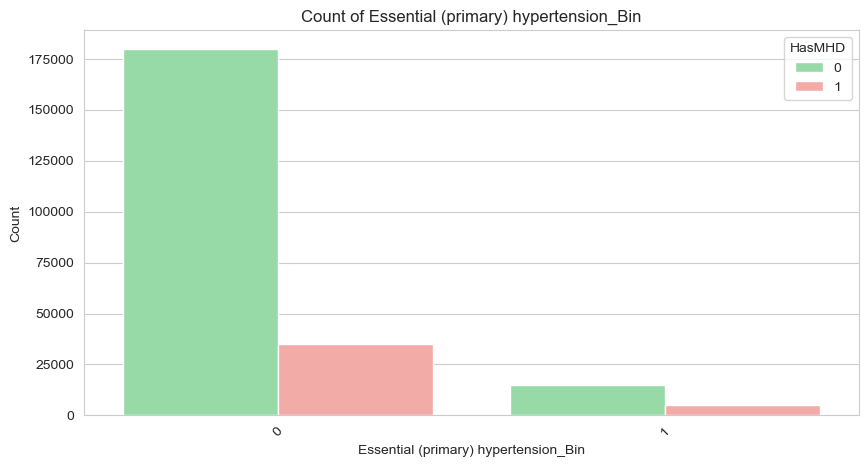



===== combined_isolated_pca_128, COPD (ASTHMA, EMPHYSEMA,  BRONCHITIS)_BIN =====
COPD (asthma, emphysema,  bronchitis)_Bin
0    214635
1     20234
Name: count, dtype: int64
COPD (asthma, emphysema,  bronchitis)_Bin
0    0.914
1    0.086
Name: proportion, dtype: float64

Crosstab (counts):
HasMHD                                          0      1
COPD (asthma, emphysema,  bronchitis)_Bin               
0                                          179213  35422
1                                           15583   4651

Crosstab (row %):
HasMHD                                         0      1
COPD (asthma, emphysema,  bronchitis)_Bin              
0                                          0.835  0.165
1                                          0.770  0.230
Column: COPD (asthma, emphysema,  bronchitis)_Bin

COPD (asthma, emphysema,  bronchitis)_Bin
0    91.384985
1     8.615015
Name: proportion, dtype: float64


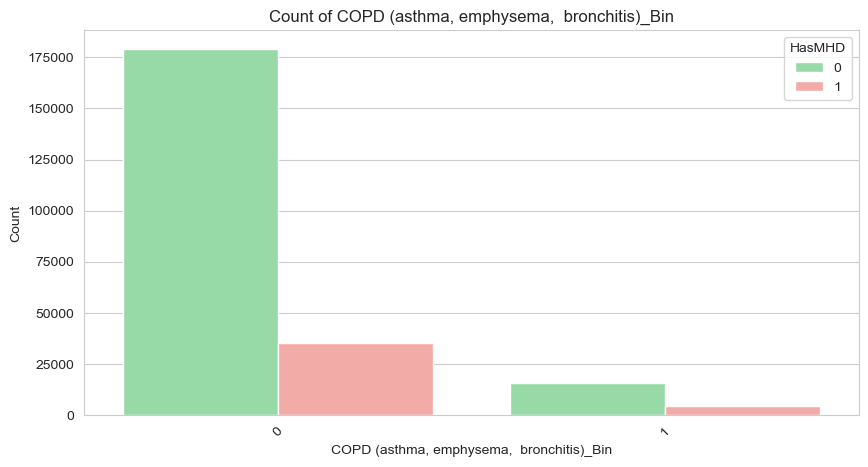



===== combined_isolated_pca_128, VIRAL HEPATITIS_BIN =====
Viral hepatitis_Bin
0    234869
Name: count, dtype: int64
Viral hepatitis_Bin
0    1.0
Name: proportion, dtype: float64

Crosstab (counts):
HasMHD                    0      1
Viral hepatitis_Bin               
0                    194796  40073

Crosstab (row %):
HasMHD                   0      1
Viral hepatitis_Bin              
0                    0.829  0.171
Column: Viral hepatitis_Bin

Viral hepatitis_Bin
0    100.0
Name: proportion, dtype: float64


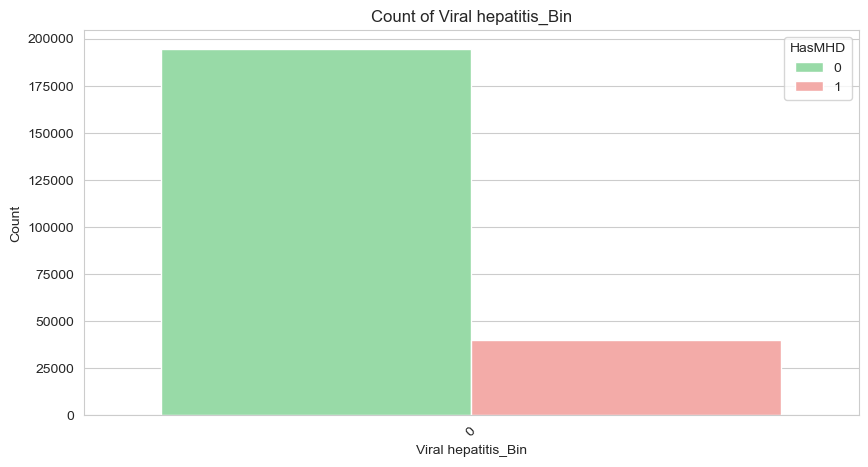



===== combined_isolated_pca_128, CHRONIC PAIN_BIN =====
Chronic pain_Bin
0    234259
1       610
Name: count, dtype: int64
Chronic pain_Bin
0    0.997
1    0.003
Name: proportion, dtype: float64

Crosstab (counts):
HasMHD                 0      1
Chronic pain_Bin               
0                 194453  39806
1                    343    267

Crosstab (row %):
HasMHD                0      1
Chronic pain_Bin              
0                 0.830  0.170
1                 0.562  0.438
Column: Chronic pain_Bin

Chronic pain_Bin
0    99.740281
1     0.259719
Name: proportion, dtype: float64


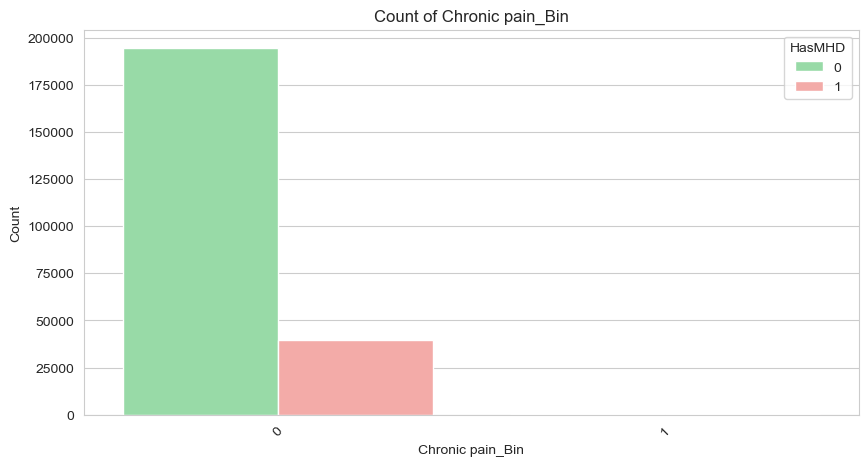



===== combined_isolated_pca_128, RHEUMATOID ARTHRITIS_BIN =====
Rheumatoid arthritis_Bin
0    233541
1      1328
Name: count, dtype: int64
Rheumatoid arthritis_Bin
0    0.994
1    0.006
Name: proportion, dtype: float64

Crosstab (counts):
HasMHD                         0      1
Rheumatoid arthritis_Bin               
0                         193790  39751
1                           1006    322

Crosstab (row %):
HasMHD                        0      1
Rheumatoid arthritis_Bin              
0                         0.830  0.170
1                         0.758  0.242
Column: Rheumatoid arthritis_Bin

Rheumatoid arthritis_Bin
0    99.434578
1     0.565422
Name: proportion, dtype: float64


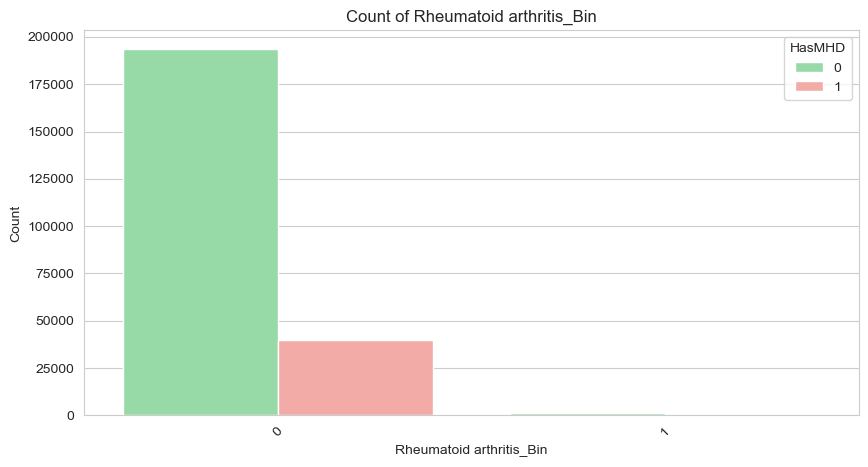



===== combined_isolated_pca_128, MYOCARDIAL INFARCTION_BIN =====
Myocardial infarction_Bin
0    233309
1      1560
Name: count, dtype: int64
Myocardial infarction_Bin
0    0.993
1    0.007
Name: proportion, dtype: float64

Crosstab (counts):
HasMHD                          0      1
Myocardial infarction_Bin               
0                          193572  39737
1                            1224    336

Crosstab (row %):
HasMHD                         0      1
Myocardial infarction_Bin              
0                          0.830  0.170
1                          0.785  0.215
Column: Myocardial infarction_Bin

Myocardial infarction_Bin
0    99.3358
1     0.6642
Name: proportion, dtype: float64


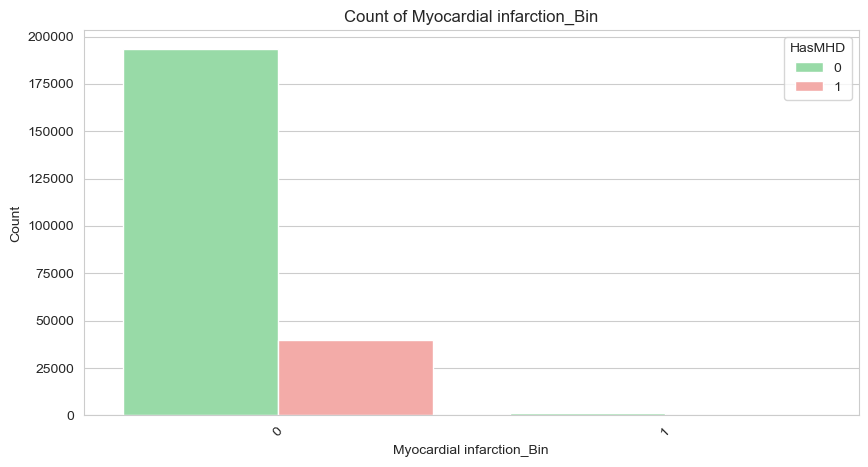



===== combined_isolated_pca_128, PARKINSON'S DISEASE_BIN =====
Parkinson's disease_Bin
0    234094
1       775
Name: count, dtype: int64
Parkinson's disease_Bin
0    0.997
1    0.003
Name: proportion, dtype: float64

Crosstab (counts):
HasMHD                        0      1
Parkinson's disease_Bin               
0                        194208  39886
1                           588    187

Crosstab (row %):
HasMHD                       0      1
Parkinson's disease_Bin              
0                        0.830  0.170
1                        0.759  0.241
Column: Parkinson's disease_Bin

Parkinson's disease_Bin
0    99.670029
1     0.329971
Name: proportion, dtype: float64


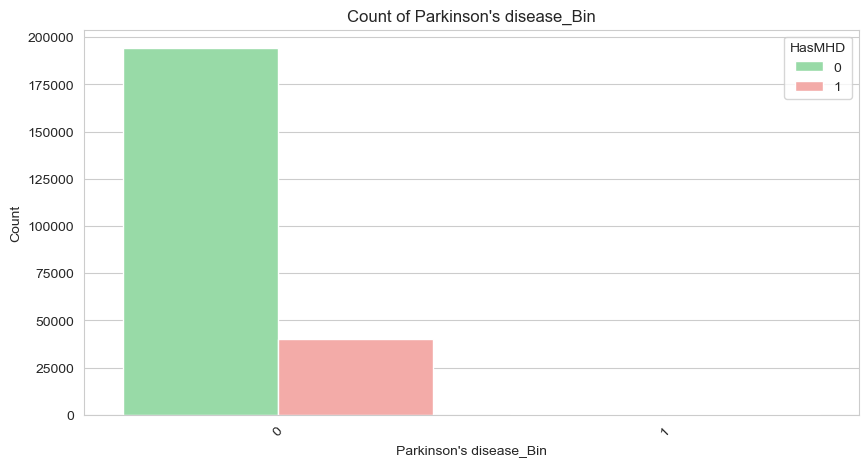



===== combined_isolated_pca_128, STROKE_BIN =====
Stroke_Bin
0    232016
1      2853
Name: count, dtype: int64
Stroke_Bin
0    0.988
1    0.012
Name: proportion, dtype: float64

Crosstab (counts):
HasMHD           0      1
Stroke_Bin               
0           192574  39442
1             2222    631

Crosstab (row %):
HasMHD          0      1
Stroke_Bin              
0           0.830  0.170
1           0.779  0.221
Column: Stroke_Bin

Stroke_Bin
0    98.78528
1     1.21472
Name: proportion, dtype: float64


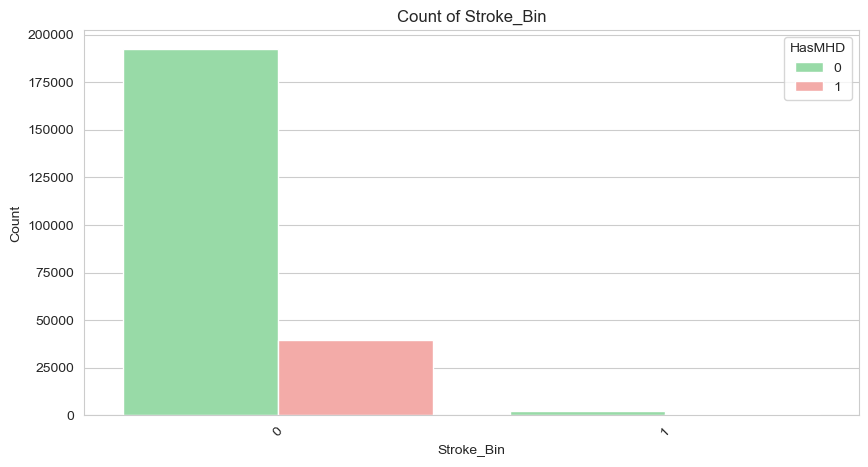



===== combined_isolated_pca_128, ANGINA PECTORIS_BIN =====
Angina pectoris_Bin
0    233150
1      1719
Name: count, dtype: int64
Angina pectoris_Bin
0    0.993
1    0.007
Name: proportion, dtype: float64

Crosstab (counts):
HasMHD                    0      1
Angina pectoris_Bin               
0                    193543  39607
1                      1253    466

Crosstab (row %):
HasMHD                   0      1
Angina pectoris_Bin              
0                    0.830  0.170
1                    0.729  0.271
Column: Angina pectoris_Bin

Angina pectoris_Bin
0    99.268103
1     0.731897
Name: proportion, dtype: float64


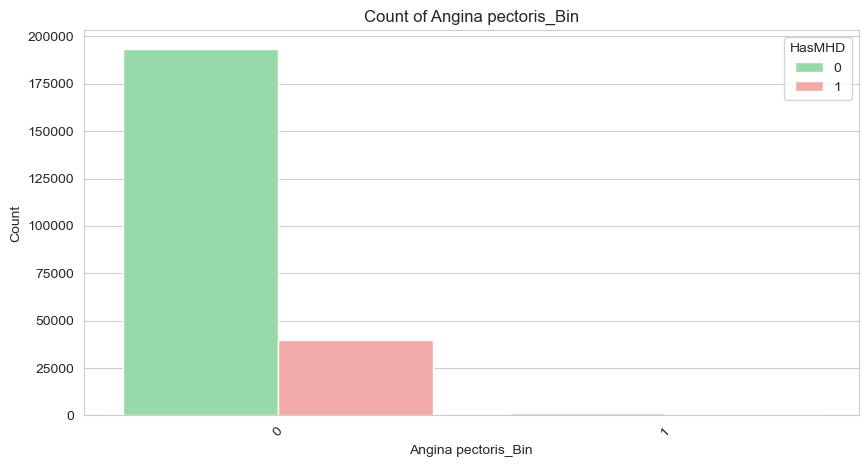



===== combined_isolated_pca_128, LIVER DISEASE_BIN =====
Liver disease_Bin
0    233319
1      1550
Name: count, dtype: int64
Liver disease_Bin
0    0.993
1    0.007
Name: proportion, dtype: float64

Crosstab (counts):
HasMHD                  0      1
Liver disease_Bin               
0                  193599  39720
1                    1197    353

Crosstab (row %):
HasMHD                 0      1
Liver disease_Bin              
0                  0.830  0.170
1                  0.772  0.228
Column: Liver disease_Bin

Liver disease_Bin
0    99.340058
1     0.659942
Name: proportion, dtype: float64


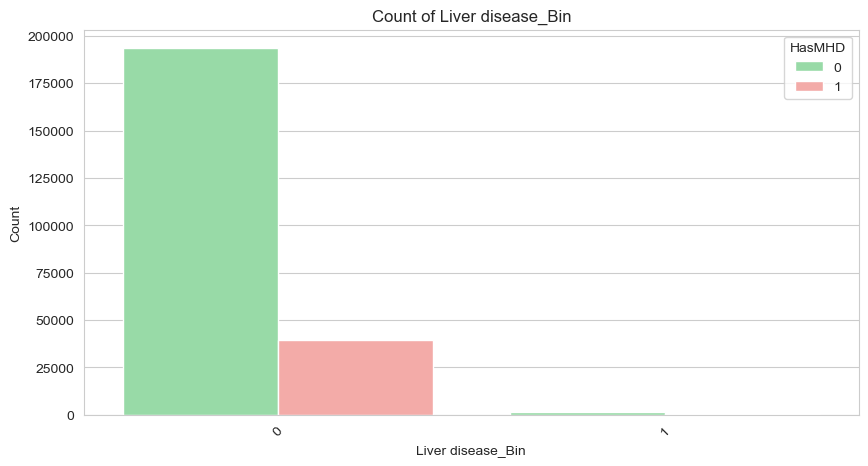



===== combined_isolated_pca_128, MIGRAINE_BIN =====
Migraine_Bin
0    233402
1      1467
Name: count, dtype: int64
Migraine_Bin
0    0.994
1    0.006
Name: proportion, dtype: float64

Crosstab (counts):
HasMHD             0      1
Migraine_Bin               
0             193790  39612
1               1006    461

Crosstab (row %):
HasMHD            0      1
Migraine_Bin              
0             0.830  0.170
1             0.686  0.314
Column: Migraine_Bin

Migraine_Bin
0    99.375396
1     0.624604
Name: proportion, dtype: float64


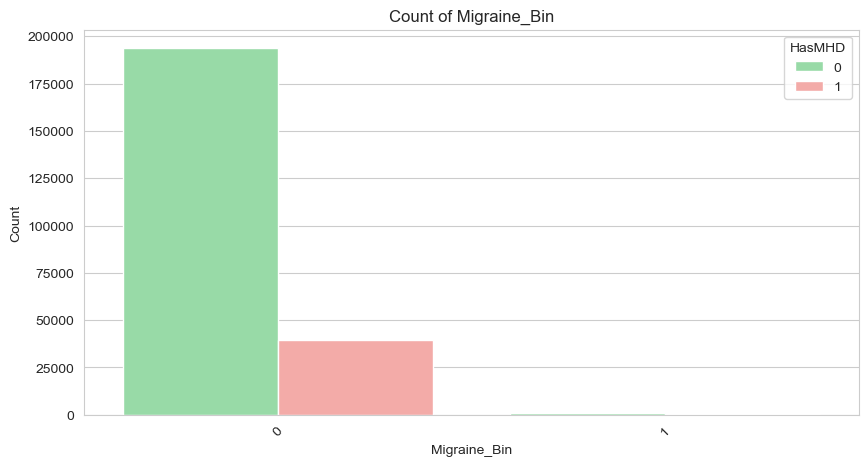



===== combined_isolated_pca_128, CONSTIPATION_BIN =====
Constipation_Bin
0    233337
1      1532
Name: count, dtype: int64
Constipation_Bin
0    0.993
1    0.007
Name: proportion, dtype: float64

Crosstab (counts):
HasMHD                 0      1
Constipation_Bin               
0                 193819  39518
1                    977    555

Crosstab (row %):
HasMHD                0      1
Constipation_Bin              
0                 0.831  0.169
1                 0.638  0.362
Column: Constipation_Bin

Constipation_Bin
0    99.347721
1     0.652279
Name: proportion, dtype: float64


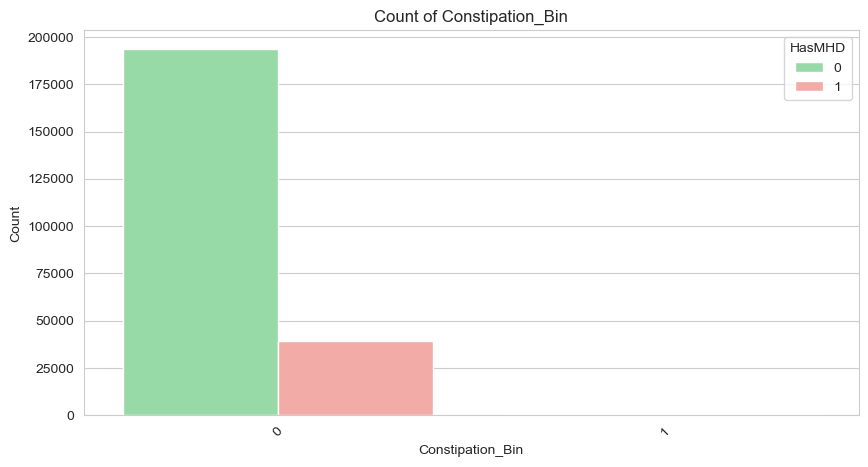



===== combined_isolated_pca_128, HASMHD =====
HasMHD
0    194796
1     40073
Name: count, dtype: int64
HasMHD
0    0.829
1    0.171
Name: proportion, dtype: float64

Crosstab (counts):
HasMHD       0      1
HasMHD               
0       194796      0
1            0  40073

Crosstab (row %):
HasMHD    0    1
HasMHD          
0       1.0  0.0
1       0.0  1.0
Column: HasMHD

HasMHD
0    82.938148
1    17.061852
Name: proportion, dtype: float64


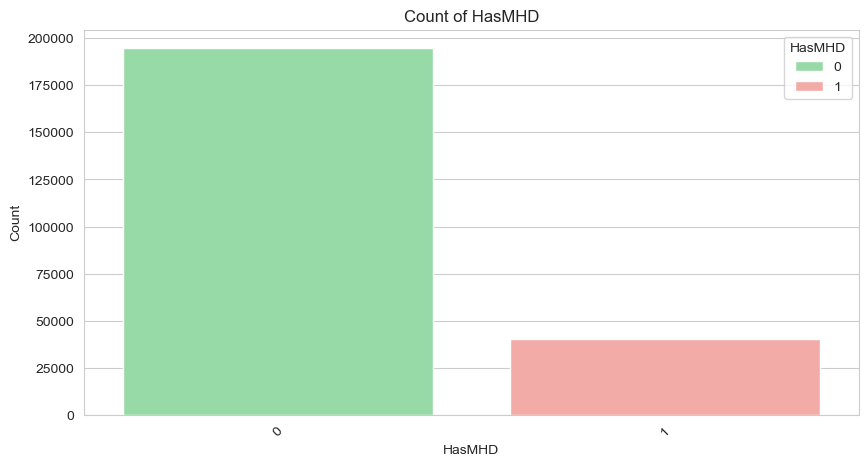



===== combined_isolated_pca_256, SEX_BIN =====
Sex_Bin
1.0    143000
0.0     91848
NaN        21
Name: count, dtype: int64
Sex_Bin
1.0    0.609
0.0    0.391
NaN    0.000
Name: proportion, dtype: float64

Crosstab (counts):
HasMHD        0      1
Sex_Bin               
0.0       78685  13163
1.0      116093  26907

Crosstab (row %):
HasMHD       0      1
Sex_Bin              
0.0      0.857  0.143
1.0      0.812  0.188
Column: Sex_Bin

Sex_Bin
1.0    60.890448
0.0    39.109552
Name: proportion, dtype: float64


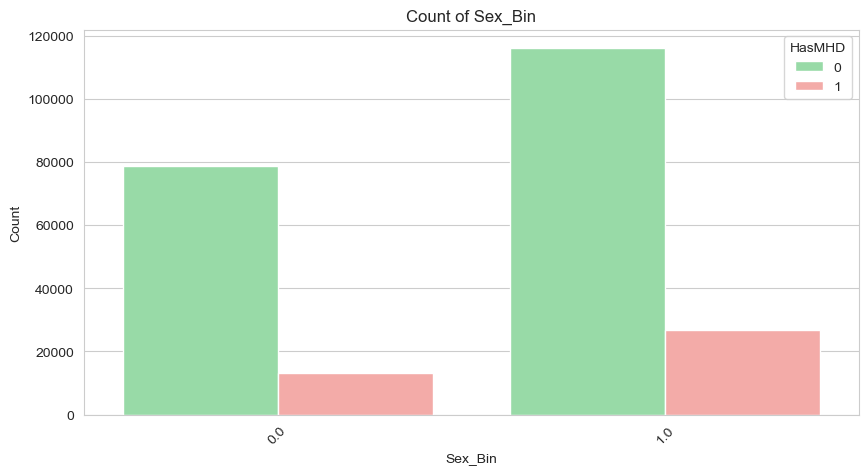



===== combined_isolated_pca_256, STATUS_ACTIVE =====
Status_Active
1    158248
0     76621
Name: count, dtype: int64
Status_Active
1    0.674
0    0.326
Name: proportion, dtype: float64

Crosstab (counts):
HasMHD              0      1
Status_Active               
0               63253  13368
1              131543  26705

Crosstab (row %):
HasMHD             0      1
Status_Active              
0              0.826  0.174
1              0.831  0.169
Column: Status_Active

Status_Active
1    67.377134
0    32.622866
Name: proportion, dtype: float64


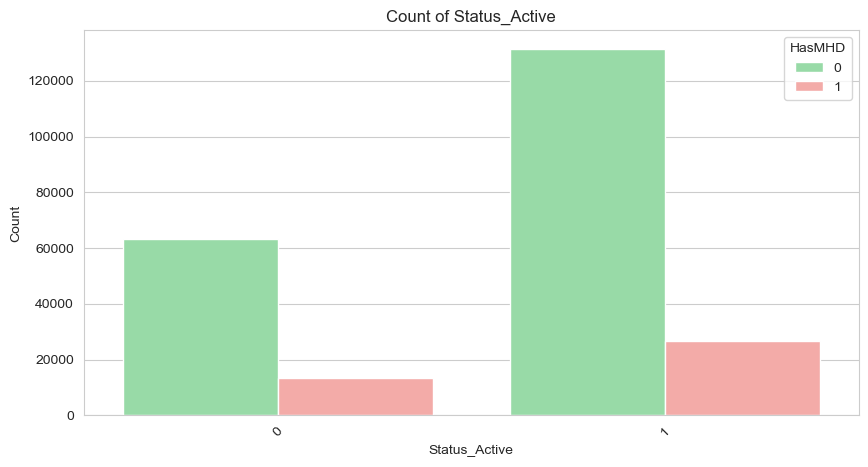



===== combined_isolated_pca_256, STATUS_DECEASED =====
Status_Deceased
0    228863
1      6006
Name: count, dtype: int64
Status_Deceased
0    0.974
1    0.026
Name: proportion, dtype: float64

Crosstab (counts):
HasMHD                0      1
Status_Deceased               
0                189990  38873
1                  4806   1200

Crosstab (row %):
HasMHD              0     1
Status_Deceased            
0                0.83  0.17
1                0.80  0.20
Column: Status_Deceased

Status_Deceased
0    97.44283
1     2.55717
Name: proportion, dtype: float64


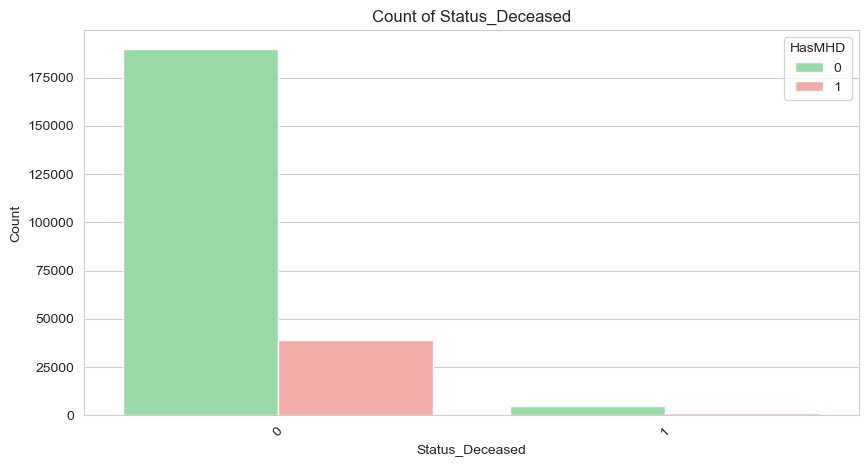



===== combined_isolated_pca_256, STATUS_INACTIVE =====
Status_Inactive
0    221664
1     13205
Name: count, dtype: int64
Status_Inactive
0    0.944
1    0.056
Name: proportion, dtype: float64

Crosstab (counts):
HasMHD                0      1
Status_Inactive               
0                183816  37848
1                 10980   2225

Crosstab (row %):
HasMHD               0      1
Status_Inactive              
0                0.829  0.171
1                0.832  0.168
Column: Status_Inactive

Status_Inactive
0    94.377717
1     5.622283
Name: proportion, dtype: float64


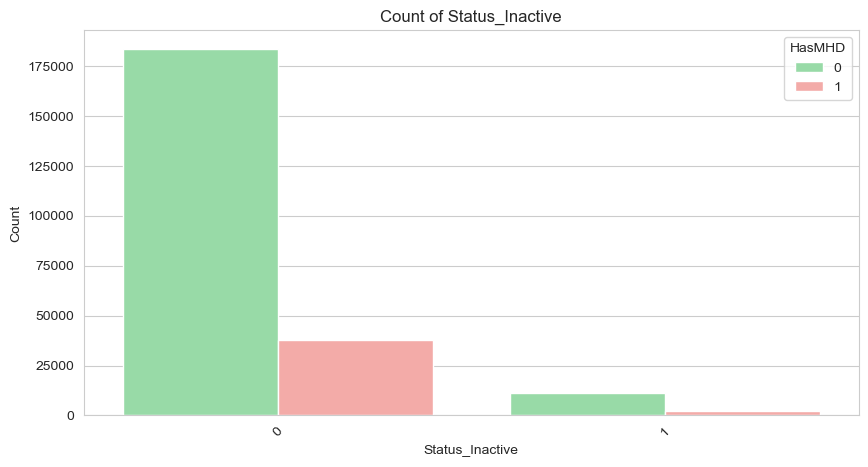



===== combined_isolated_pca_256, STATUS_UNKNOWN =====
Status_Unknown
0    177671
1     57198
Name: count, dtype: int64
Status_Unknown
0    0.756
1    0.244
Name: proportion, dtype: float64

Crosstab (counts):
HasMHD               0      1
Status_Unknown               
0               147474  30197
1                47322   9876

Crosstab (row %):
HasMHD              0      1
Status_Unknown              
0               0.830  0.170
1               0.827  0.173
Column: Status_Unknown

Status_Unknown
0    75.64685
1    24.35315
Name: proportion, dtype: float64


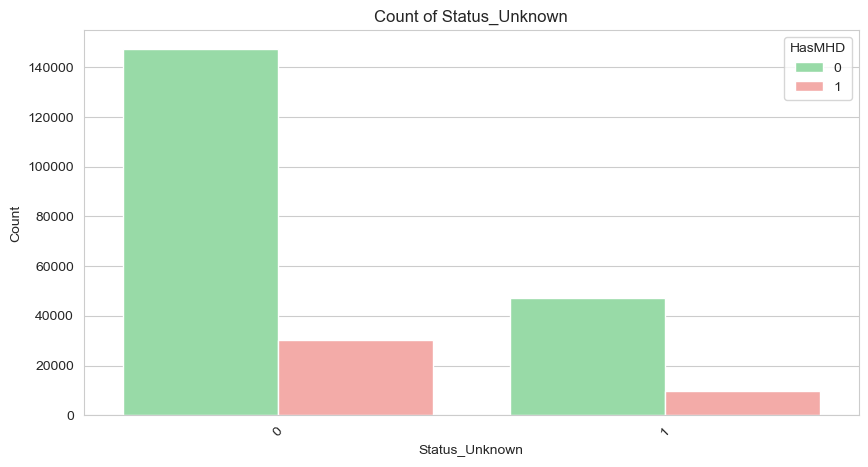



===== combined_isolated_pca_256, DIABETES_BIN =====
Diabetes_Bin
0    222276
1     12593
Name: count, dtype: int64
Diabetes_Bin
0    0.946
1    0.054
Name: proportion, dtype: float64

Crosstab (counts):
HasMHD             0      1
Diabetes_Bin               
0             185245  37031
1               9551   3042

Crosstab (row %):
HasMHD            0      1
Diabetes_Bin              
0             0.833  0.167
1             0.758  0.242
Column: Diabetes_Bin

Diabetes_Bin
0    94.638288
1     5.361712
Name: proportion, dtype: float64


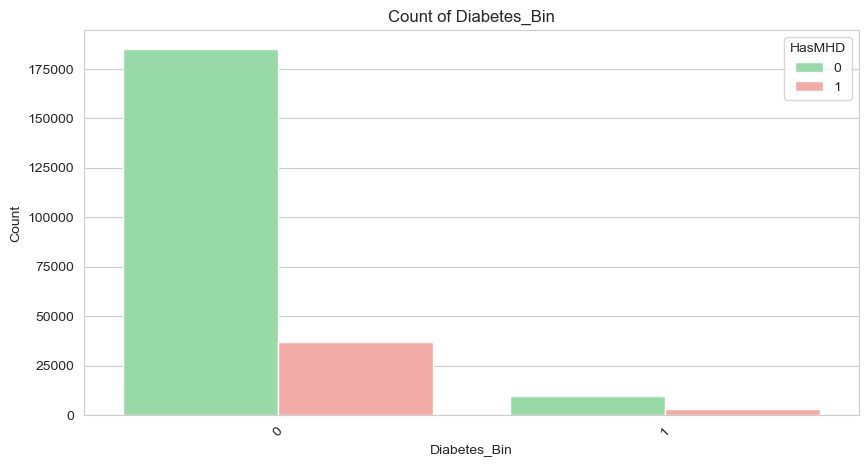



===== combined_isolated_pca_256, ESSENTIAL (PRIMARY) HYPERTENSION_BIN =====
Essential (primary) hypertension_Bin
0    214890
1     19979
Name: count, dtype: int64
Essential (primary) hypertension_Bin
0    0.915
1    0.085
Name: proportion, dtype: float64

Crosstab (counts):
HasMHD                                     0      1
Essential (primary) hypertension_Bin               
0                                     180051  34839
1                                      14745   5234

Crosstab (row %):
HasMHD                                    0      1
Essential (primary) hypertension_Bin              
0                                     0.838  0.162
1                                     0.738  0.262
Column: Essential (primary) hypertension_Bin

Essential (primary) hypertension_Bin
0    91.493556
1     8.506444
Name: proportion, dtype: float64


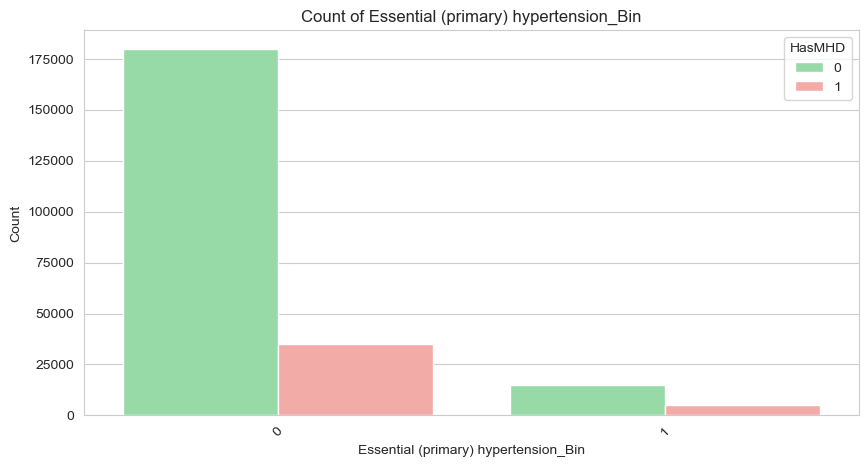



===== combined_isolated_pca_256, COPD (ASTHMA, EMPHYSEMA,  BRONCHITIS)_BIN =====
COPD (asthma, emphysema,  bronchitis)_Bin
0    214635
1     20234
Name: count, dtype: int64
COPD (asthma, emphysema,  bronchitis)_Bin
0    0.914
1    0.086
Name: proportion, dtype: float64

Crosstab (counts):
HasMHD                                          0      1
COPD (asthma, emphysema,  bronchitis)_Bin               
0                                          179213  35422
1                                           15583   4651

Crosstab (row %):
HasMHD                                         0      1
COPD (asthma, emphysema,  bronchitis)_Bin              
0                                          0.835  0.165
1                                          0.770  0.230
Column: COPD (asthma, emphysema,  bronchitis)_Bin

COPD (asthma, emphysema,  bronchitis)_Bin
0    91.384985
1     8.615015
Name: proportion, dtype: float64


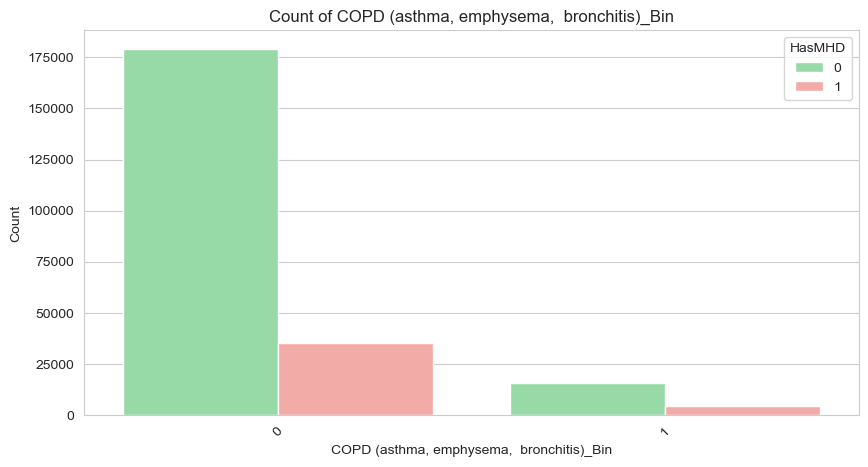



===== combined_isolated_pca_256, VIRAL HEPATITIS_BIN =====
Viral hepatitis_Bin
0    234869
Name: count, dtype: int64
Viral hepatitis_Bin
0    1.0
Name: proportion, dtype: float64

Crosstab (counts):
HasMHD                    0      1
Viral hepatitis_Bin               
0                    194796  40073

Crosstab (row %):
HasMHD                   0      1
Viral hepatitis_Bin              
0                    0.829  0.171
Column: Viral hepatitis_Bin

Viral hepatitis_Bin
0    100.0
Name: proportion, dtype: float64


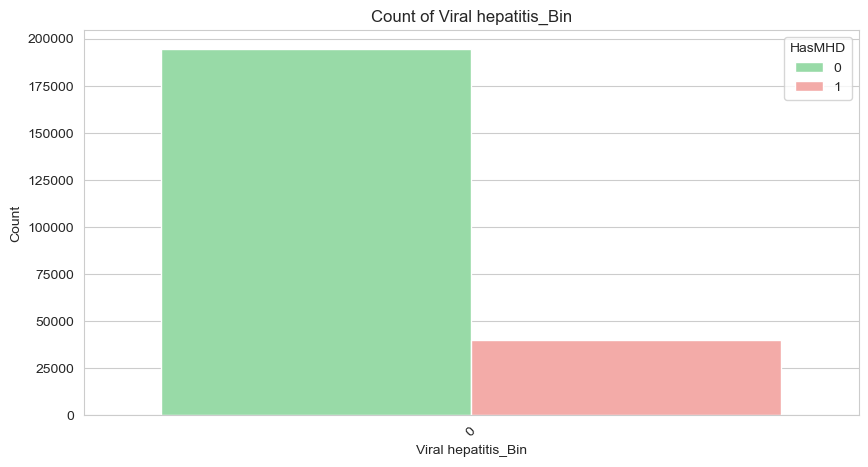



===== combined_isolated_pca_256, CHRONIC PAIN_BIN =====
Chronic pain_Bin
0    234259
1       610
Name: count, dtype: int64
Chronic pain_Bin
0    0.997
1    0.003
Name: proportion, dtype: float64

Crosstab (counts):
HasMHD                 0      1
Chronic pain_Bin               
0                 194453  39806
1                    343    267

Crosstab (row %):
HasMHD                0      1
Chronic pain_Bin              
0                 0.830  0.170
1                 0.562  0.438
Column: Chronic pain_Bin

Chronic pain_Bin
0    99.740281
1     0.259719
Name: proportion, dtype: float64


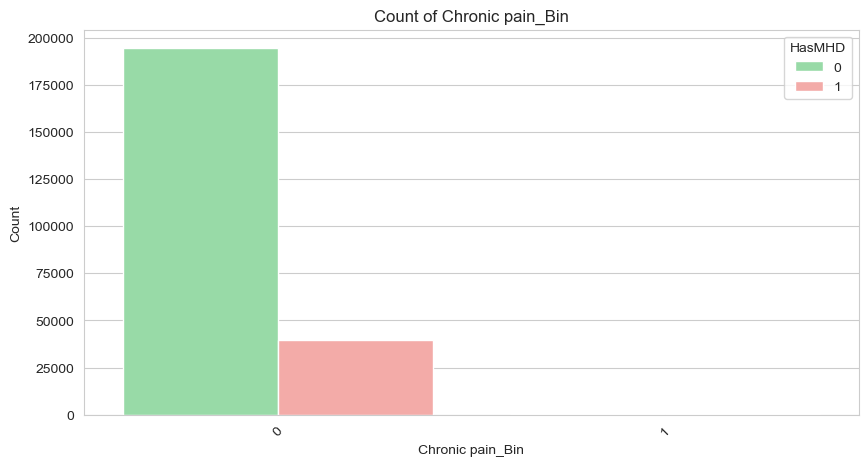



===== combined_isolated_pca_256, RHEUMATOID ARTHRITIS_BIN =====
Rheumatoid arthritis_Bin
0    233541
1      1328
Name: count, dtype: int64
Rheumatoid arthritis_Bin
0    0.994
1    0.006
Name: proportion, dtype: float64

Crosstab (counts):
HasMHD                         0      1
Rheumatoid arthritis_Bin               
0                         193790  39751
1                           1006    322

Crosstab (row %):
HasMHD                        0      1
Rheumatoid arthritis_Bin              
0                         0.830  0.170
1                         0.758  0.242
Column: Rheumatoid arthritis_Bin

Rheumatoid arthritis_Bin
0    99.434578
1     0.565422
Name: proportion, dtype: float64


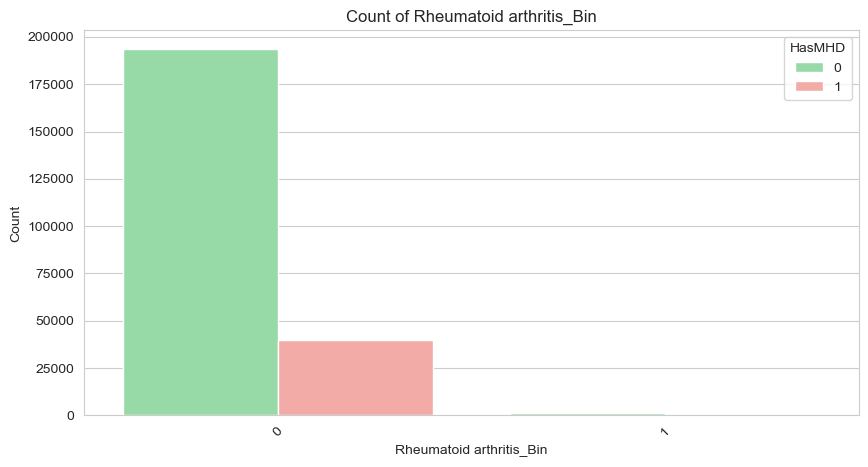



===== combined_isolated_pca_256, MYOCARDIAL INFARCTION_BIN =====
Myocardial infarction_Bin
0    233309
1      1560
Name: count, dtype: int64
Myocardial infarction_Bin
0    0.993
1    0.007
Name: proportion, dtype: float64

Crosstab (counts):
HasMHD                          0      1
Myocardial infarction_Bin               
0                          193572  39737
1                            1224    336

Crosstab (row %):
HasMHD                         0      1
Myocardial infarction_Bin              
0                          0.830  0.170
1                          0.785  0.215
Column: Myocardial infarction_Bin

Myocardial infarction_Bin
0    99.3358
1     0.6642
Name: proportion, dtype: float64


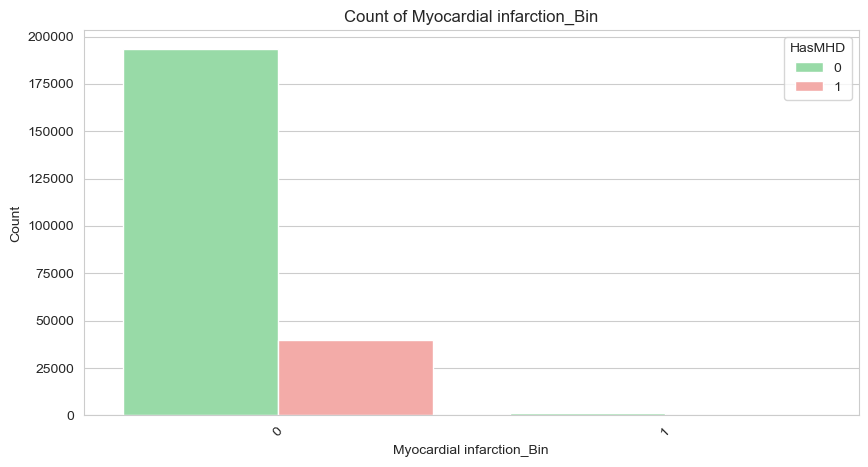



===== combined_isolated_pca_256, PARKINSON'S DISEASE_BIN =====
Parkinson's disease_Bin
0    234094
1       775
Name: count, dtype: int64
Parkinson's disease_Bin
0    0.997
1    0.003
Name: proportion, dtype: float64

Crosstab (counts):
HasMHD                        0      1
Parkinson's disease_Bin               
0                        194208  39886
1                           588    187

Crosstab (row %):
HasMHD                       0      1
Parkinson's disease_Bin              
0                        0.830  0.170
1                        0.759  0.241
Column: Parkinson's disease_Bin

Parkinson's disease_Bin
0    99.670029
1     0.329971
Name: proportion, dtype: float64


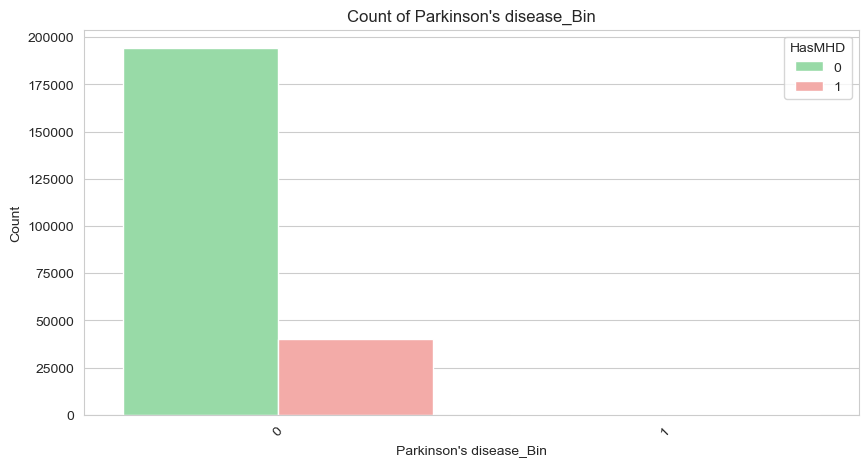



===== combined_isolated_pca_256, STROKE_BIN =====
Stroke_Bin
0    232016
1      2853
Name: count, dtype: int64
Stroke_Bin
0    0.988
1    0.012
Name: proportion, dtype: float64

Crosstab (counts):
HasMHD           0      1
Stroke_Bin               
0           192574  39442
1             2222    631

Crosstab (row %):
HasMHD          0      1
Stroke_Bin              
0           0.830  0.170
1           0.779  0.221
Column: Stroke_Bin

Stroke_Bin
0    98.78528
1     1.21472
Name: proportion, dtype: float64


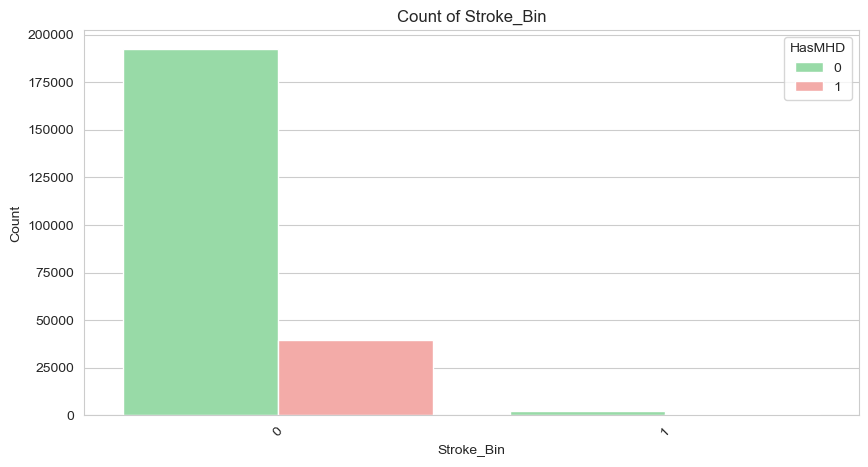



===== combined_isolated_pca_256, ANGINA PECTORIS_BIN =====
Angina pectoris_Bin
0    233150
1      1719
Name: count, dtype: int64
Angina pectoris_Bin
0    0.993
1    0.007
Name: proportion, dtype: float64

Crosstab (counts):
HasMHD                    0      1
Angina pectoris_Bin               
0                    193543  39607
1                      1253    466

Crosstab (row %):
HasMHD                   0      1
Angina pectoris_Bin              
0                    0.830  0.170
1                    0.729  0.271
Column: Angina pectoris_Bin

Angina pectoris_Bin
0    99.268103
1     0.731897
Name: proportion, dtype: float64


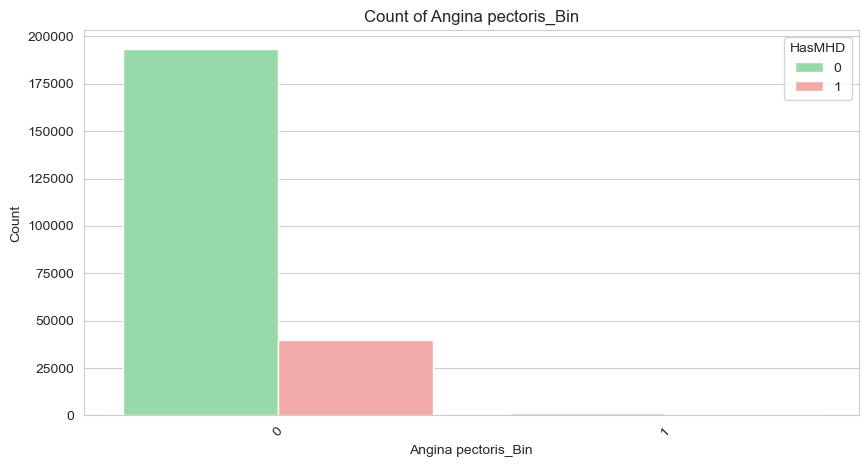



===== combined_isolated_pca_256, LIVER DISEASE_BIN =====
Liver disease_Bin
0    233319
1      1550
Name: count, dtype: int64
Liver disease_Bin
0    0.993
1    0.007
Name: proportion, dtype: float64

Crosstab (counts):
HasMHD                  0      1
Liver disease_Bin               
0                  193599  39720
1                    1197    353

Crosstab (row %):
HasMHD                 0      1
Liver disease_Bin              
0                  0.830  0.170
1                  0.772  0.228
Column: Liver disease_Bin

Liver disease_Bin
0    99.340058
1     0.659942
Name: proportion, dtype: float64


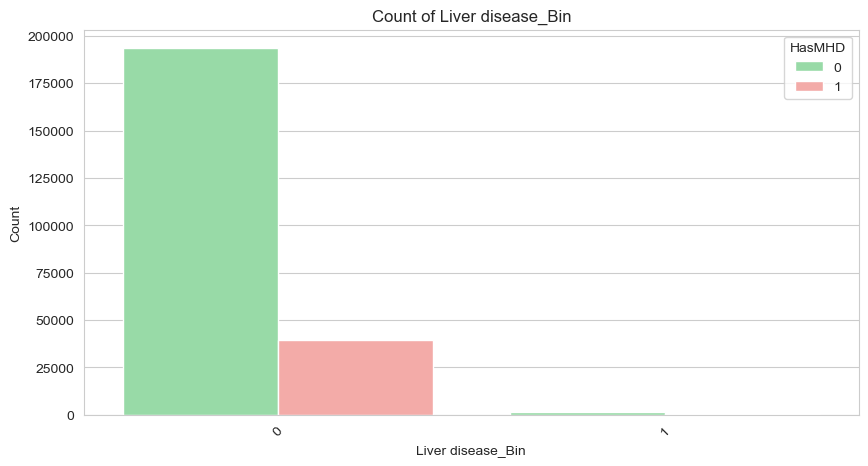



===== combined_isolated_pca_256, MIGRAINE_BIN =====
Migraine_Bin
0    233402
1      1467
Name: count, dtype: int64
Migraine_Bin
0    0.994
1    0.006
Name: proportion, dtype: float64

Crosstab (counts):
HasMHD             0      1
Migraine_Bin               
0             193790  39612
1               1006    461

Crosstab (row %):
HasMHD            0      1
Migraine_Bin              
0             0.830  0.170
1             0.686  0.314
Column: Migraine_Bin

Migraine_Bin
0    99.375396
1     0.624604
Name: proportion, dtype: float64


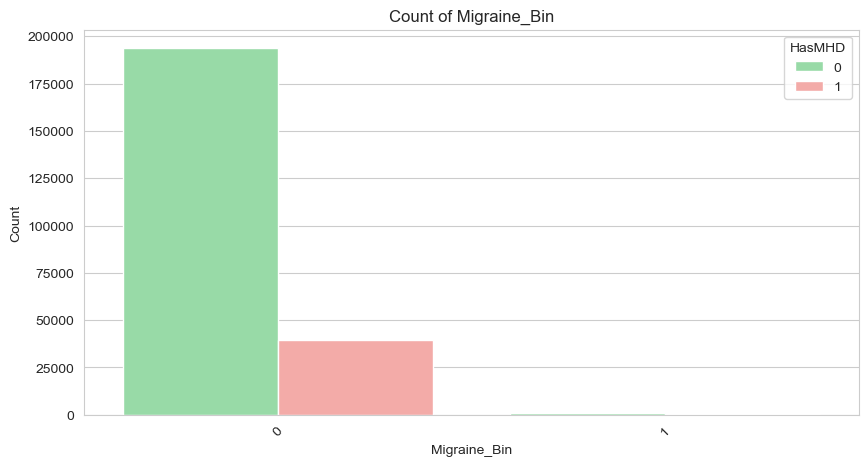



===== combined_isolated_pca_256, CONSTIPATION_BIN =====
Constipation_Bin
0    233337
1      1532
Name: count, dtype: int64
Constipation_Bin
0    0.993
1    0.007
Name: proportion, dtype: float64

Crosstab (counts):
HasMHD                 0      1
Constipation_Bin               
0                 193819  39518
1                    977    555

Crosstab (row %):
HasMHD                0      1
Constipation_Bin              
0                 0.831  0.169
1                 0.638  0.362
Column: Constipation_Bin

Constipation_Bin
0    99.347721
1     0.652279
Name: proportion, dtype: float64


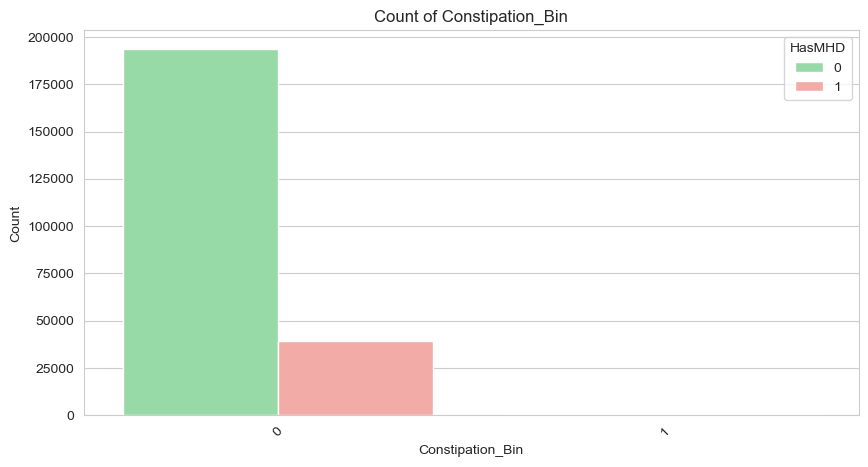



===== combined_isolated_pca_256, HASMHD =====
HasMHD
0    194796
1     40073
Name: count, dtype: int64
HasMHD
0    0.829
1    0.171
Name: proportion, dtype: float64

Crosstab (counts):
HasMHD       0      1
HasMHD               
0       194796      0
1            0  40073

Crosstab (row %):
HasMHD    0    1
HasMHD          
0       1.0  0.0
1       0.0  1.0
Column: HasMHD

HasMHD
0    82.938148
1    17.061852
Name: proportion, dtype: float64


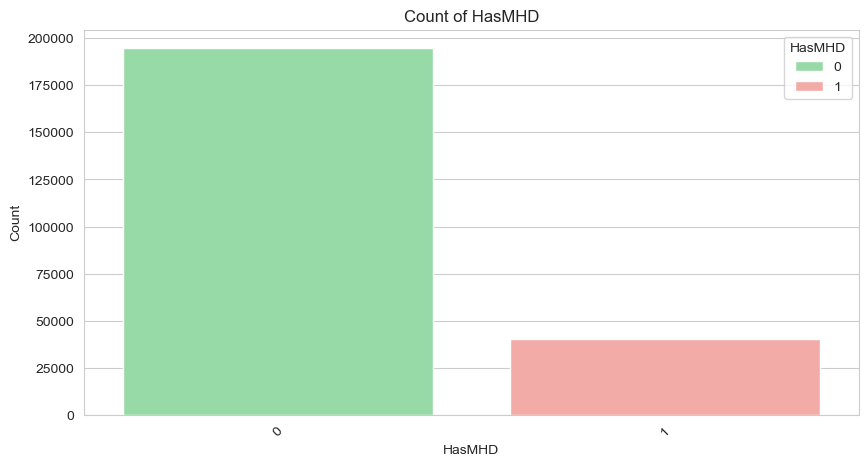



===== combined_isolated_pca_512, SEX_BIN =====
Sex_Bin
1.0    143000
0.0     91848
NaN        21
Name: count, dtype: int64
Sex_Bin
1.0    0.609
0.0    0.391
NaN    0.000
Name: proportion, dtype: float64

Crosstab (counts):
HasMHD        0      1
Sex_Bin               
0.0       78685  13163
1.0      116093  26907

Crosstab (row %):
HasMHD       0      1
Sex_Bin              
0.0      0.857  0.143
1.0      0.812  0.188
Column: Sex_Bin

Sex_Bin
1.0    60.890448
0.0    39.109552
Name: proportion, dtype: float64


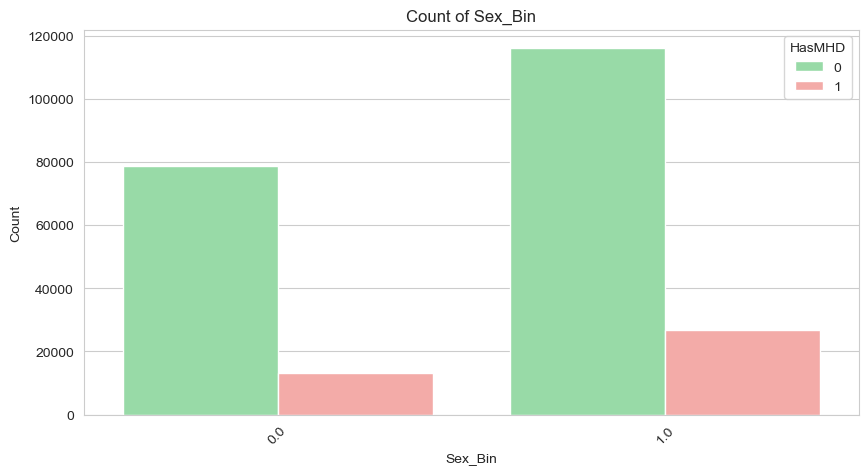



===== combined_isolated_pca_512, STATUS_ACTIVE =====
Status_Active
1    158248
0     76621
Name: count, dtype: int64
Status_Active
1    0.674
0    0.326
Name: proportion, dtype: float64

Crosstab (counts):
HasMHD              0      1
Status_Active               
0               63253  13368
1              131543  26705

Crosstab (row %):
HasMHD             0      1
Status_Active              
0              0.826  0.174
1              0.831  0.169
Column: Status_Active

Status_Active
1    67.377134
0    32.622866
Name: proportion, dtype: float64


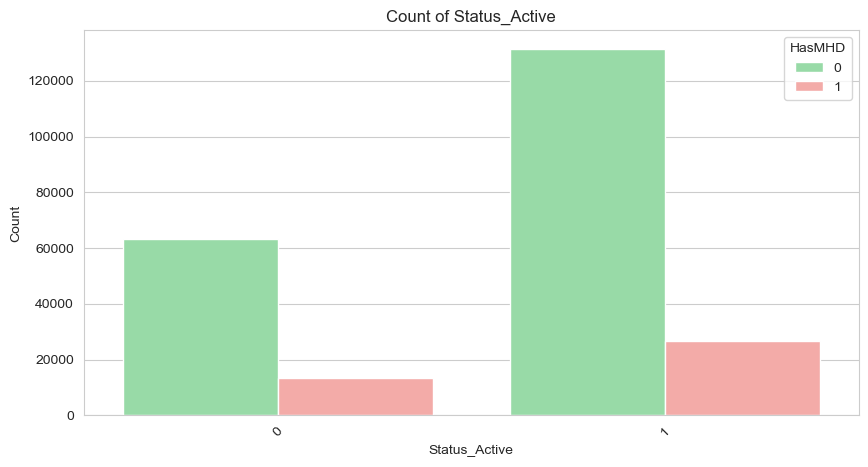



===== combined_isolated_pca_512, STATUS_DECEASED =====
Status_Deceased
0    228863
1      6006
Name: count, dtype: int64
Status_Deceased
0    0.974
1    0.026
Name: proportion, dtype: float64

Crosstab (counts):
HasMHD                0      1
Status_Deceased               
0                189990  38873
1                  4806   1200

Crosstab (row %):
HasMHD              0     1
Status_Deceased            
0                0.83  0.17
1                0.80  0.20
Column: Status_Deceased

Status_Deceased
0    97.44283
1     2.55717
Name: proportion, dtype: float64


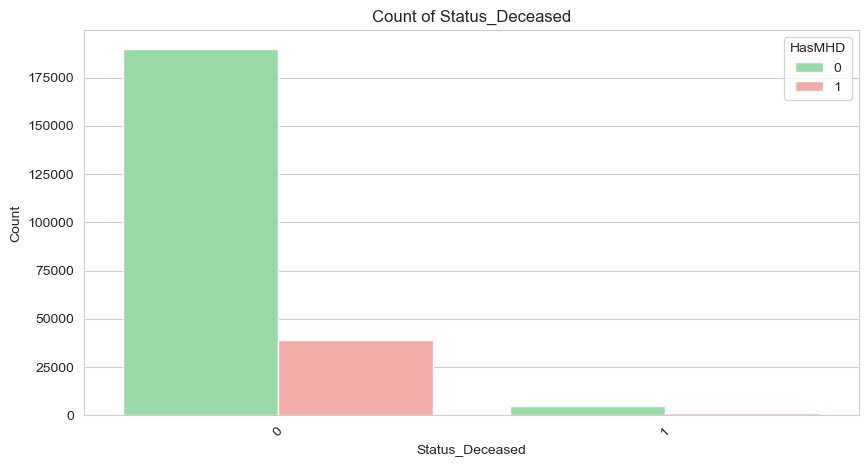



===== combined_isolated_pca_512, STATUS_INACTIVE =====
Status_Inactive
0    221664
1     13205
Name: count, dtype: int64
Status_Inactive
0    0.944
1    0.056
Name: proportion, dtype: float64

Crosstab (counts):
HasMHD                0      1
Status_Inactive               
0                183816  37848
1                 10980   2225

Crosstab (row %):
HasMHD               0      1
Status_Inactive              
0                0.829  0.171
1                0.832  0.168
Column: Status_Inactive

Status_Inactive
0    94.377717
1     5.622283
Name: proportion, dtype: float64


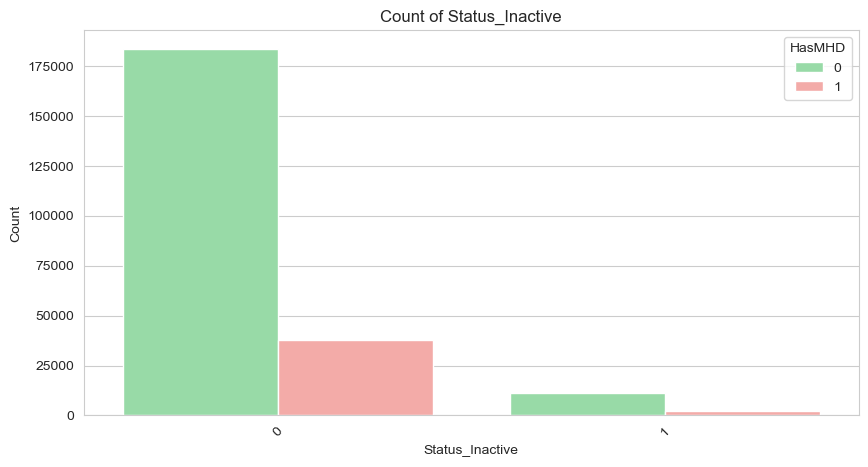



===== combined_isolated_pca_512, STATUS_UNKNOWN =====
Status_Unknown
0    177671
1     57198
Name: count, dtype: int64
Status_Unknown
0    0.756
1    0.244
Name: proportion, dtype: float64

Crosstab (counts):
HasMHD               0      1
Status_Unknown               
0               147474  30197
1                47322   9876

Crosstab (row %):
HasMHD              0      1
Status_Unknown              
0               0.830  0.170
1               0.827  0.173
Column: Status_Unknown

Status_Unknown
0    75.64685
1    24.35315
Name: proportion, dtype: float64


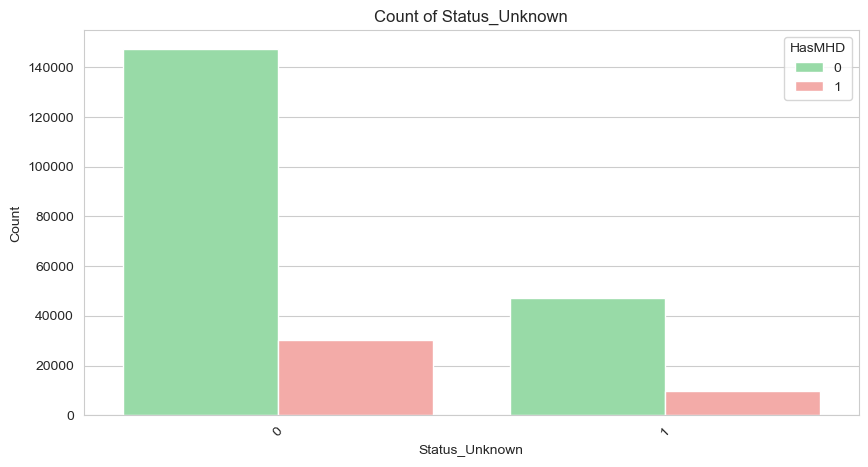



===== combined_isolated_pca_512, DIABETES_BIN =====
Diabetes_Bin
0    222276
1     12593
Name: count, dtype: int64
Diabetes_Bin
0    0.946
1    0.054
Name: proportion, dtype: float64

Crosstab (counts):
HasMHD             0      1
Diabetes_Bin               
0             185245  37031
1               9551   3042

Crosstab (row %):
HasMHD            0      1
Diabetes_Bin              
0             0.833  0.167
1             0.758  0.242
Column: Diabetes_Bin

Diabetes_Bin
0    94.638288
1     5.361712
Name: proportion, dtype: float64


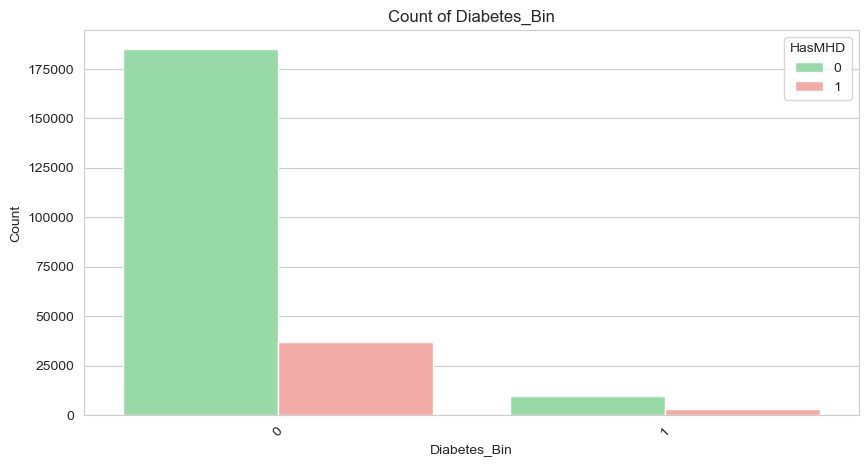



===== combined_isolated_pca_512, ESSENTIAL (PRIMARY) HYPERTENSION_BIN =====
Essential (primary) hypertension_Bin
0    214890
1     19979
Name: count, dtype: int64
Essential (primary) hypertension_Bin
0    0.915
1    0.085
Name: proportion, dtype: float64

Crosstab (counts):
HasMHD                                     0      1
Essential (primary) hypertension_Bin               
0                                     180051  34839
1                                      14745   5234

Crosstab (row %):
HasMHD                                    0      1
Essential (primary) hypertension_Bin              
0                                     0.838  0.162
1                                     0.738  0.262
Column: Essential (primary) hypertension_Bin

Essential (primary) hypertension_Bin
0    91.493556
1     8.506444
Name: proportion, dtype: float64


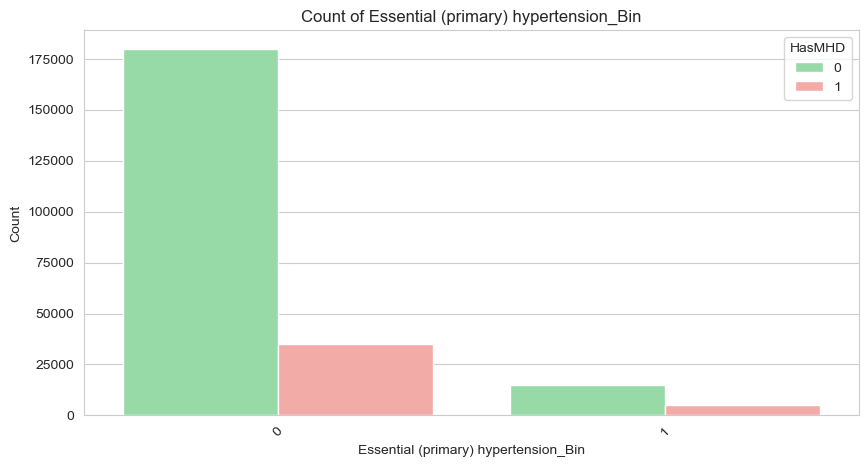



===== combined_isolated_pca_512, COPD (ASTHMA, EMPHYSEMA,  BRONCHITIS)_BIN =====
COPD (asthma, emphysema,  bronchitis)_Bin
0    214635
1     20234
Name: count, dtype: int64
COPD (asthma, emphysema,  bronchitis)_Bin
0    0.914
1    0.086
Name: proportion, dtype: float64

Crosstab (counts):
HasMHD                                          0      1
COPD (asthma, emphysema,  bronchitis)_Bin               
0                                          179213  35422
1                                           15583   4651

Crosstab (row %):
HasMHD                                         0      1
COPD (asthma, emphysema,  bronchitis)_Bin              
0                                          0.835  0.165
1                                          0.770  0.230
Column: COPD (asthma, emphysema,  bronchitis)_Bin

COPD (asthma, emphysema,  bronchitis)_Bin
0    91.384985
1     8.615015
Name: proportion, dtype: float64


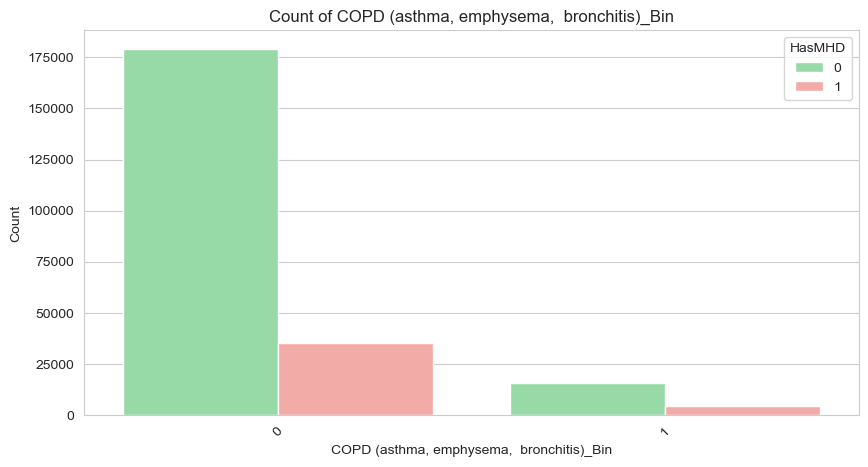



===== combined_isolated_pca_512, VIRAL HEPATITIS_BIN =====
Viral hepatitis_Bin
0    234869
Name: count, dtype: int64
Viral hepatitis_Bin
0    1.0
Name: proportion, dtype: float64

Crosstab (counts):
HasMHD                    0      1
Viral hepatitis_Bin               
0                    194796  40073

Crosstab (row %):
HasMHD                   0      1
Viral hepatitis_Bin              
0                    0.829  0.171
Column: Viral hepatitis_Bin

Viral hepatitis_Bin
0    100.0
Name: proportion, dtype: float64


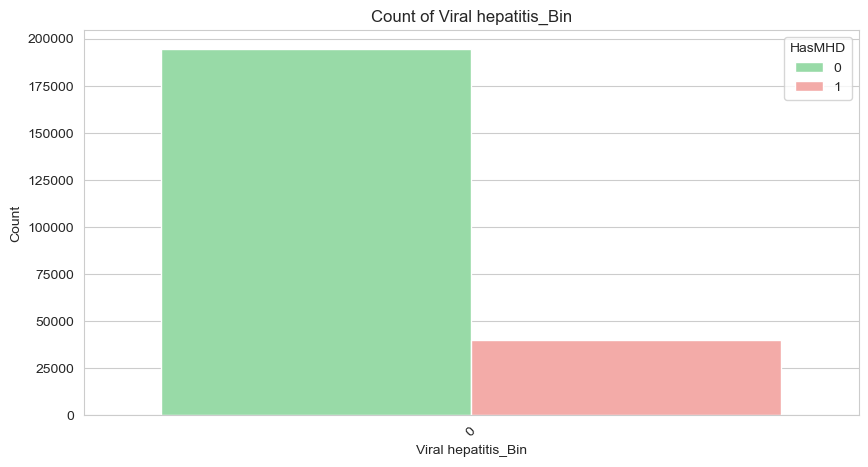



===== combined_isolated_pca_512, CHRONIC PAIN_BIN =====
Chronic pain_Bin
0    234259
1       610
Name: count, dtype: int64
Chronic pain_Bin
0    0.997
1    0.003
Name: proportion, dtype: float64

Crosstab (counts):
HasMHD                 0      1
Chronic pain_Bin               
0                 194453  39806
1                    343    267

Crosstab (row %):
HasMHD                0      1
Chronic pain_Bin              
0                 0.830  0.170
1                 0.562  0.438
Column: Chronic pain_Bin

Chronic pain_Bin
0    99.740281
1     0.259719
Name: proportion, dtype: float64


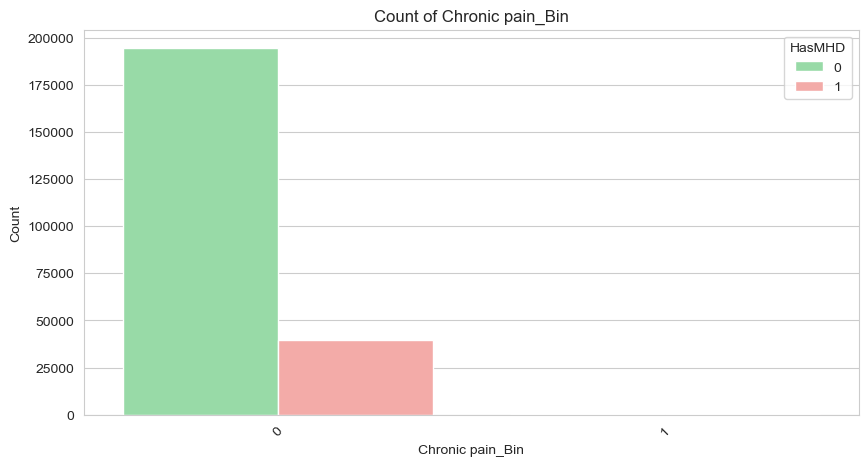



===== combined_isolated_pca_512, RHEUMATOID ARTHRITIS_BIN =====
Rheumatoid arthritis_Bin
0    233541
1      1328
Name: count, dtype: int64
Rheumatoid arthritis_Bin
0    0.994
1    0.006
Name: proportion, dtype: float64

Crosstab (counts):
HasMHD                         0      1
Rheumatoid arthritis_Bin               
0                         193790  39751
1                           1006    322

Crosstab (row %):
HasMHD                        0      1
Rheumatoid arthritis_Bin              
0                         0.830  0.170
1                         0.758  0.242
Column: Rheumatoid arthritis_Bin

Rheumatoid arthritis_Bin
0    99.434578
1     0.565422
Name: proportion, dtype: float64


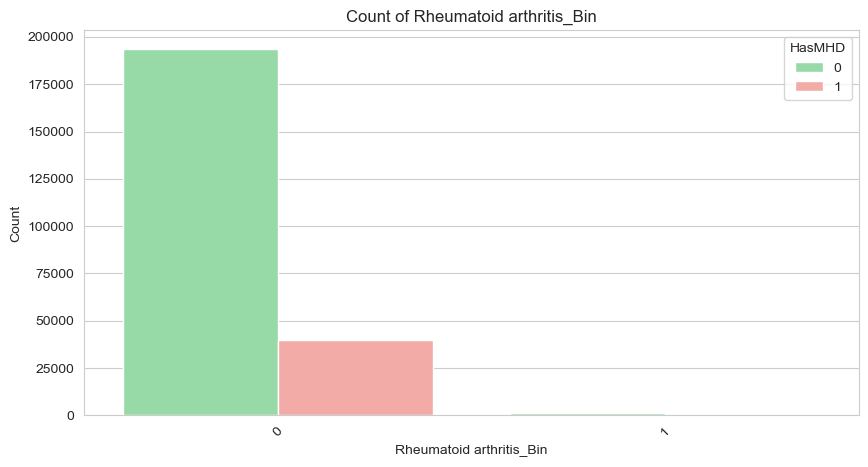



===== combined_isolated_pca_512, MYOCARDIAL INFARCTION_BIN =====
Myocardial infarction_Bin
0    233309
1      1560
Name: count, dtype: int64
Myocardial infarction_Bin
0    0.993
1    0.007
Name: proportion, dtype: float64

Crosstab (counts):
HasMHD                          0      1
Myocardial infarction_Bin               
0                          193572  39737
1                            1224    336

Crosstab (row %):
HasMHD                         0      1
Myocardial infarction_Bin              
0                          0.830  0.170
1                          0.785  0.215
Column: Myocardial infarction_Bin

Myocardial infarction_Bin
0    99.3358
1     0.6642
Name: proportion, dtype: float64


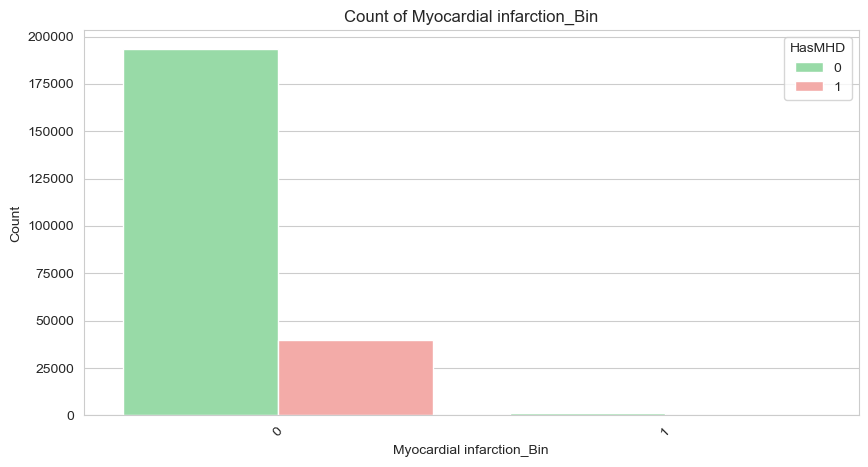



===== combined_isolated_pca_512, PARKINSON'S DISEASE_BIN =====
Parkinson's disease_Bin
0    234094
1       775
Name: count, dtype: int64
Parkinson's disease_Bin
0    0.997
1    0.003
Name: proportion, dtype: float64

Crosstab (counts):
HasMHD                        0      1
Parkinson's disease_Bin               
0                        194208  39886
1                           588    187

Crosstab (row %):
HasMHD                       0      1
Parkinson's disease_Bin              
0                        0.830  0.170
1                        0.759  0.241
Column: Parkinson's disease_Bin

Parkinson's disease_Bin
0    99.670029
1     0.329971
Name: proportion, dtype: float64


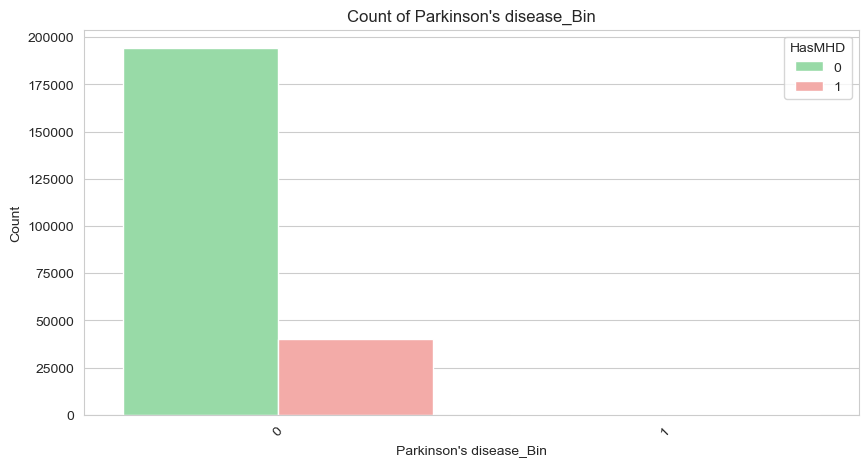



===== combined_isolated_pca_512, STROKE_BIN =====
Stroke_Bin
0    232016
1      2853
Name: count, dtype: int64
Stroke_Bin
0    0.988
1    0.012
Name: proportion, dtype: float64

Crosstab (counts):
HasMHD           0      1
Stroke_Bin               
0           192574  39442
1             2222    631

Crosstab (row %):
HasMHD          0      1
Stroke_Bin              
0           0.830  0.170
1           0.779  0.221
Column: Stroke_Bin

Stroke_Bin
0    98.78528
1     1.21472
Name: proportion, dtype: float64


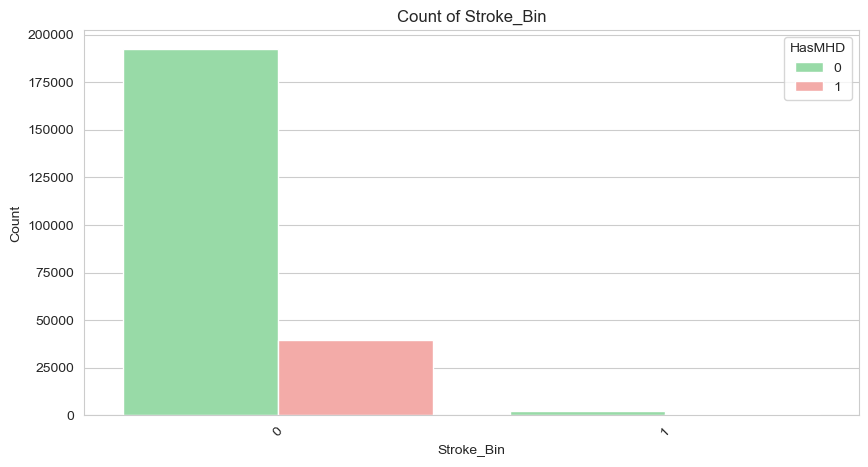



===== combined_isolated_pca_512, ANGINA PECTORIS_BIN =====
Angina pectoris_Bin
0    233150
1      1719
Name: count, dtype: int64
Angina pectoris_Bin
0    0.993
1    0.007
Name: proportion, dtype: float64

Crosstab (counts):
HasMHD                    0      1
Angina pectoris_Bin               
0                    193543  39607
1                      1253    466

Crosstab (row %):
HasMHD                   0      1
Angina pectoris_Bin              
0                    0.830  0.170
1                    0.729  0.271
Column: Angina pectoris_Bin

Angina pectoris_Bin
0    99.268103
1     0.731897
Name: proportion, dtype: float64


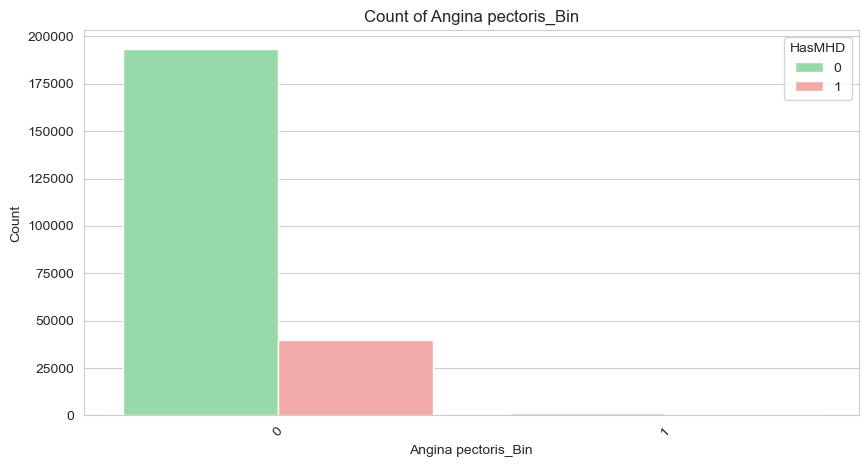



===== combined_isolated_pca_512, LIVER DISEASE_BIN =====
Liver disease_Bin
0    233319
1      1550
Name: count, dtype: int64
Liver disease_Bin
0    0.993
1    0.007
Name: proportion, dtype: float64

Crosstab (counts):
HasMHD                  0      1
Liver disease_Bin               
0                  193599  39720
1                    1197    353

Crosstab (row %):
HasMHD                 0      1
Liver disease_Bin              
0                  0.830  0.170
1                  0.772  0.228
Column: Liver disease_Bin

Liver disease_Bin
0    99.340058
1     0.659942
Name: proportion, dtype: float64


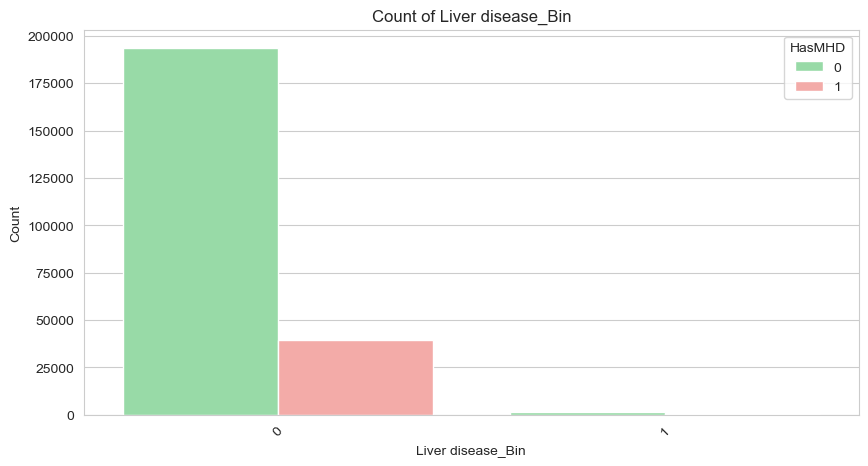



===== combined_isolated_pca_512, MIGRAINE_BIN =====
Migraine_Bin
0    233402
1      1467
Name: count, dtype: int64
Migraine_Bin
0    0.994
1    0.006
Name: proportion, dtype: float64

Crosstab (counts):
HasMHD             0      1
Migraine_Bin               
0             193790  39612
1               1006    461

Crosstab (row %):
HasMHD            0      1
Migraine_Bin              
0             0.830  0.170
1             0.686  0.314
Column: Migraine_Bin

Migraine_Bin
0    99.375396
1     0.624604
Name: proportion, dtype: float64


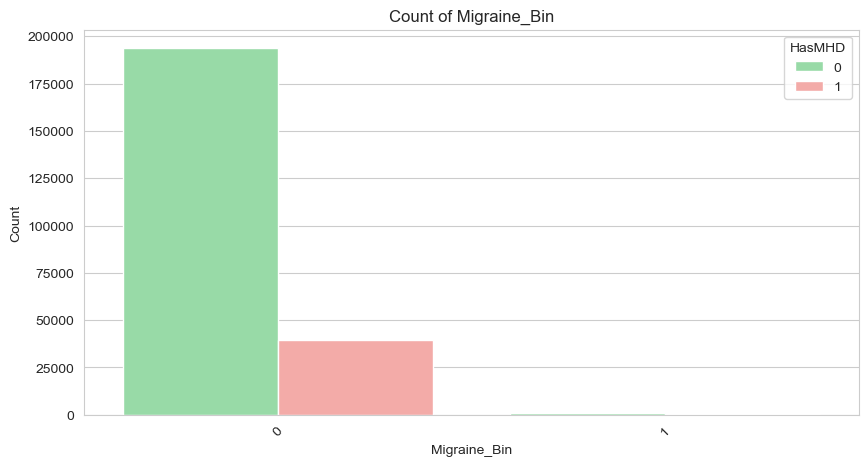



===== combined_isolated_pca_512, CONSTIPATION_BIN =====
Constipation_Bin
0    233337
1      1532
Name: count, dtype: int64
Constipation_Bin
0    0.993
1    0.007
Name: proportion, dtype: float64

Crosstab (counts):
HasMHD                 0      1
Constipation_Bin               
0                 193819  39518
1                    977    555

Crosstab (row %):
HasMHD                0      1
Constipation_Bin              
0                 0.831  0.169
1                 0.638  0.362
Column: Constipation_Bin

Constipation_Bin
0    99.347721
1     0.652279
Name: proportion, dtype: float64


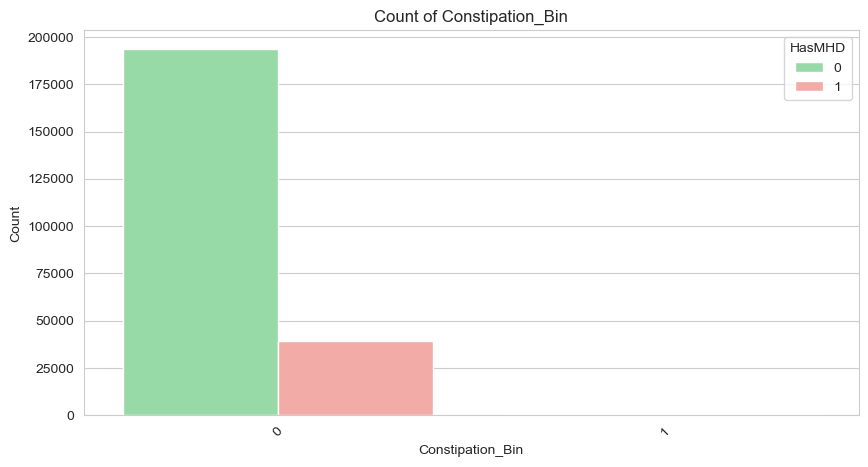



===== combined_isolated_pca_512, HASMHD =====
HasMHD
0    194796
1     40073
Name: count, dtype: int64
HasMHD
0    0.829
1    0.171
Name: proportion, dtype: float64

Crosstab (counts):
HasMHD       0      1
HasMHD               
0       194796      0
1            0  40073

Crosstab (row %):
HasMHD    0    1
HasMHD          
0       1.0  0.0
1       0.0  1.0
Column: HasMHD

HasMHD
0    82.938148
1    17.061852
Name: proportion, dtype: float64


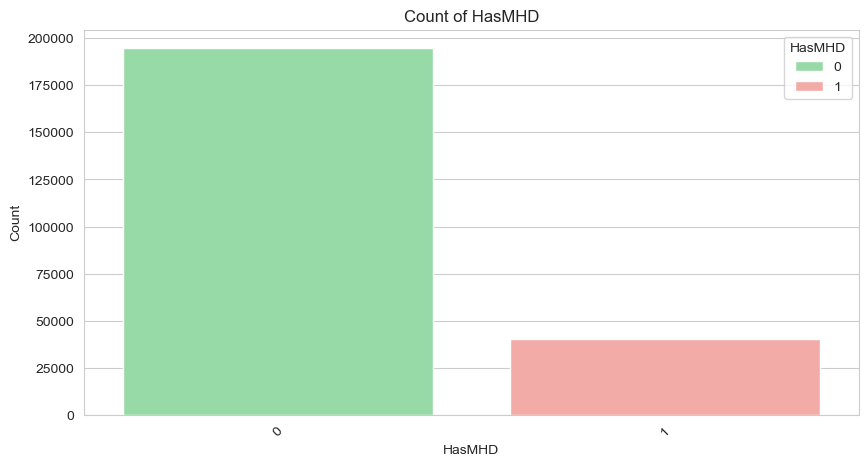



===== combined_combined_pca_128, SEX_BIN =====
Sex_Bin
1.0    143000
0.0     91848
NaN        21
Name: count, dtype: int64
Sex_Bin
1.0    0.609
0.0    0.391
NaN    0.000
Name: proportion, dtype: float64

Crosstab (counts):
HasMHD        0      1
Sex_Bin               
0.0       78685  13163
1.0      116093  26907

Crosstab (row %):
HasMHD       0      1
Sex_Bin              
0.0      0.857  0.143
1.0      0.812  0.188
Column: Sex_Bin

Sex_Bin
1.0    60.890448
0.0    39.109552
Name: proportion, dtype: float64


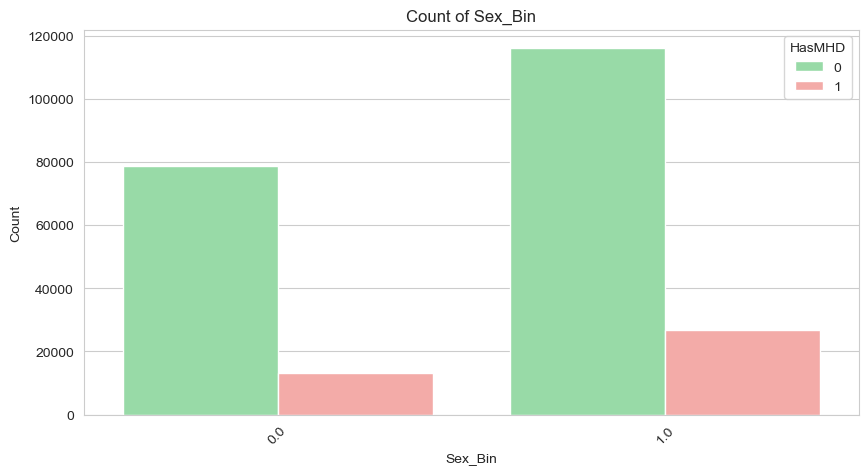



===== combined_combined_pca_128, STATUS_ACTIVE =====
Status_Active
1    158248
0     76621
Name: count, dtype: int64
Status_Active
1    0.674
0    0.326
Name: proportion, dtype: float64

Crosstab (counts):
HasMHD              0      1
Status_Active               
0               63253  13368
1              131543  26705

Crosstab (row %):
HasMHD             0      1
Status_Active              
0              0.826  0.174
1              0.831  0.169
Column: Status_Active

Status_Active
1    67.377134
0    32.622866
Name: proportion, dtype: float64


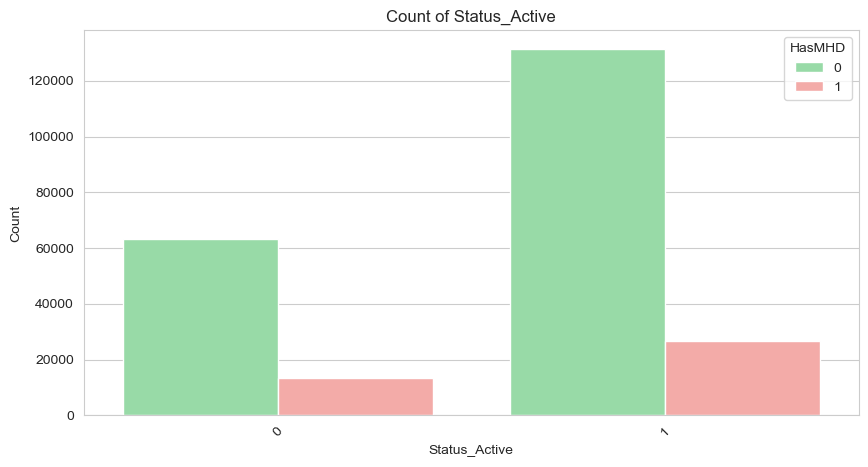



===== combined_combined_pca_128, STATUS_DECEASED =====
Status_Deceased
0    228863
1      6006
Name: count, dtype: int64
Status_Deceased
0    0.974
1    0.026
Name: proportion, dtype: float64

Crosstab (counts):
HasMHD                0      1
Status_Deceased               
0                189990  38873
1                  4806   1200

Crosstab (row %):
HasMHD              0     1
Status_Deceased            
0                0.83  0.17
1                0.80  0.20
Column: Status_Deceased

Status_Deceased
0    97.44283
1     2.55717
Name: proportion, dtype: float64


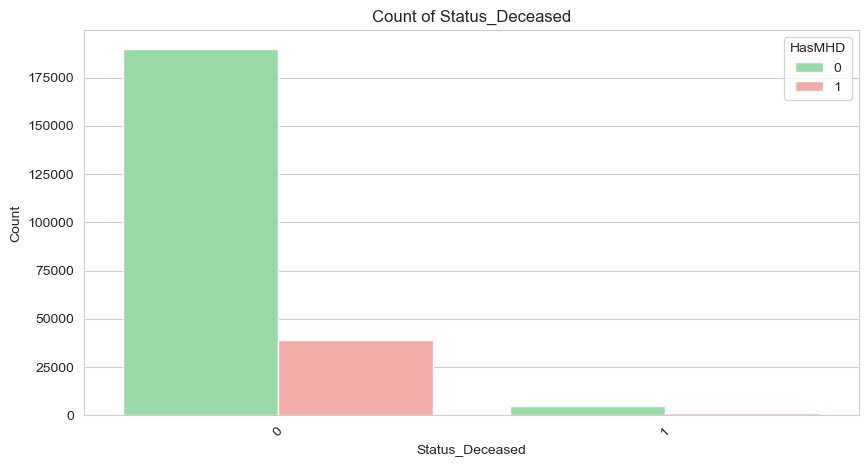



===== combined_combined_pca_128, STATUS_INACTIVE =====
Status_Inactive
0    221664
1     13205
Name: count, dtype: int64
Status_Inactive
0    0.944
1    0.056
Name: proportion, dtype: float64

Crosstab (counts):
HasMHD                0      1
Status_Inactive               
0                183816  37848
1                 10980   2225

Crosstab (row %):
HasMHD               0      1
Status_Inactive              
0                0.829  0.171
1                0.832  0.168
Column: Status_Inactive

Status_Inactive
0    94.377717
1     5.622283
Name: proportion, dtype: float64


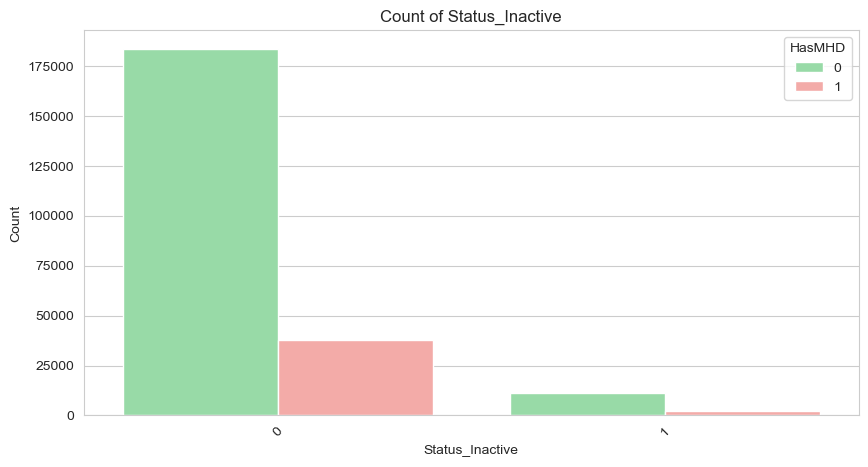



===== combined_combined_pca_128, STATUS_UNKNOWN =====
Status_Unknown
0    177671
1     57198
Name: count, dtype: int64
Status_Unknown
0    0.756
1    0.244
Name: proportion, dtype: float64

Crosstab (counts):
HasMHD               0      1
Status_Unknown               
0               147474  30197
1                47322   9876

Crosstab (row %):
HasMHD              0      1
Status_Unknown              
0               0.830  0.170
1               0.827  0.173
Column: Status_Unknown

Status_Unknown
0    75.64685
1    24.35315
Name: proportion, dtype: float64


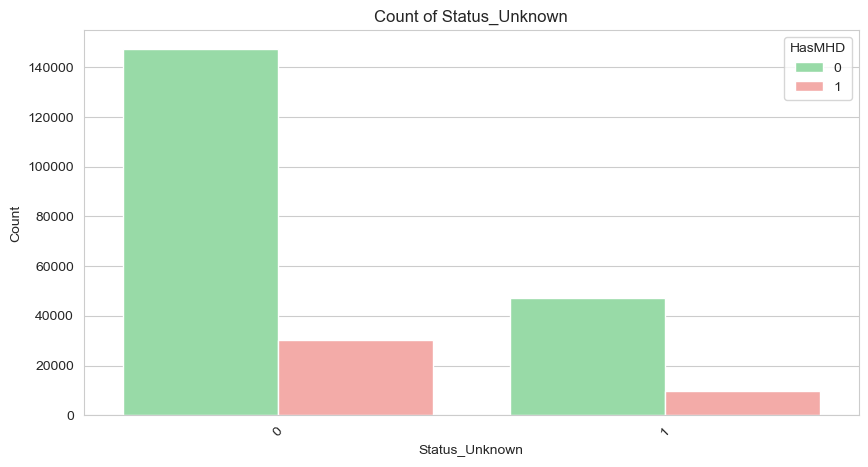



===== combined_combined_pca_128, DIABETES_BIN =====
Diabetes_Bin
0    222276
1     12593
Name: count, dtype: int64
Diabetes_Bin
0    0.946
1    0.054
Name: proportion, dtype: float64

Crosstab (counts):
HasMHD             0      1
Diabetes_Bin               
0             185245  37031
1               9551   3042

Crosstab (row %):
HasMHD            0      1
Diabetes_Bin              
0             0.833  0.167
1             0.758  0.242
Column: Diabetes_Bin

Diabetes_Bin
0    94.638288
1     5.361712
Name: proportion, dtype: float64


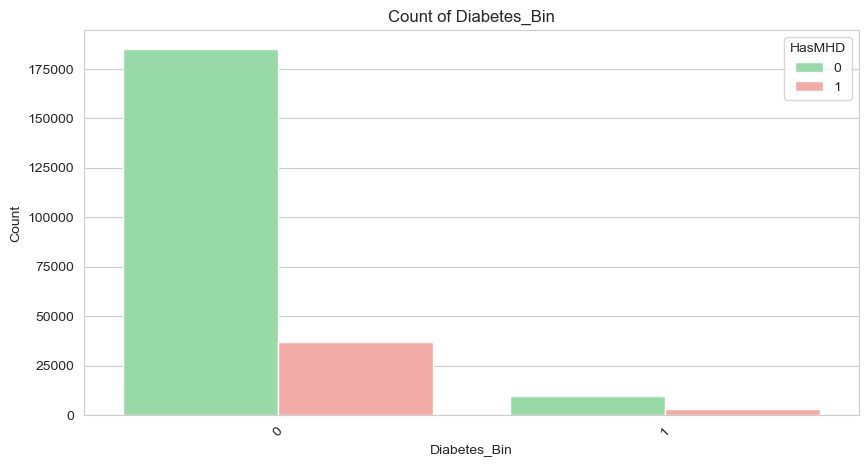



===== combined_combined_pca_128, ESSENTIAL (PRIMARY) HYPERTENSION_BIN =====
Essential (primary) hypertension_Bin
0    214890
1     19979
Name: count, dtype: int64
Essential (primary) hypertension_Bin
0    0.915
1    0.085
Name: proportion, dtype: float64

Crosstab (counts):
HasMHD                                     0      1
Essential (primary) hypertension_Bin               
0                                     180051  34839
1                                      14745   5234

Crosstab (row %):
HasMHD                                    0      1
Essential (primary) hypertension_Bin              
0                                     0.838  0.162
1                                     0.738  0.262
Column: Essential (primary) hypertension_Bin

Essential (primary) hypertension_Bin
0    91.493556
1     8.506444
Name: proportion, dtype: float64


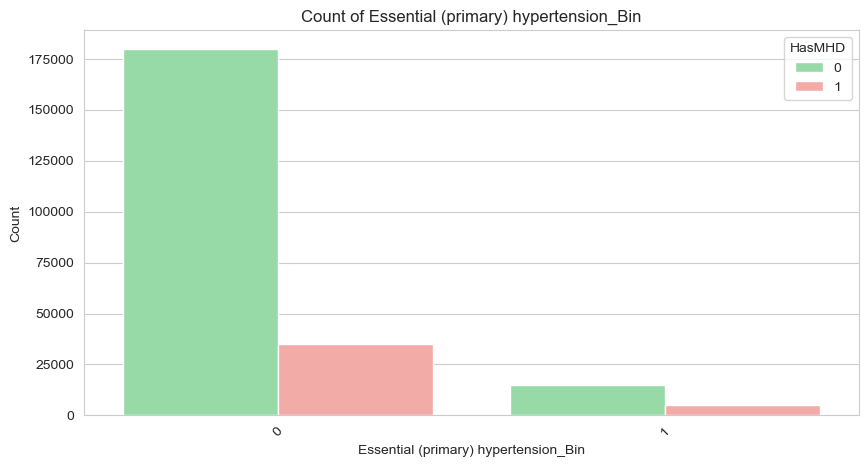



===== combined_combined_pca_128, COPD (ASTHMA, EMPHYSEMA,  BRONCHITIS)_BIN =====
COPD (asthma, emphysema,  bronchitis)_Bin
0    214635
1     20234
Name: count, dtype: int64
COPD (asthma, emphysema,  bronchitis)_Bin
0    0.914
1    0.086
Name: proportion, dtype: float64

Crosstab (counts):
HasMHD                                          0      1
COPD (asthma, emphysema,  bronchitis)_Bin               
0                                          179213  35422
1                                           15583   4651

Crosstab (row %):
HasMHD                                         0      1
COPD (asthma, emphysema,  bronchitis)_Bin              
0                                          0.835  0.165
1                                          0.770  0.230
Column: COPD (asthma, emphysema,  bronchitis)_Bin

COPD (asthma, emphysema,  bronchitis)_Bin
0    91.384985
1     8.615015
Name: proportion, dtype: float64


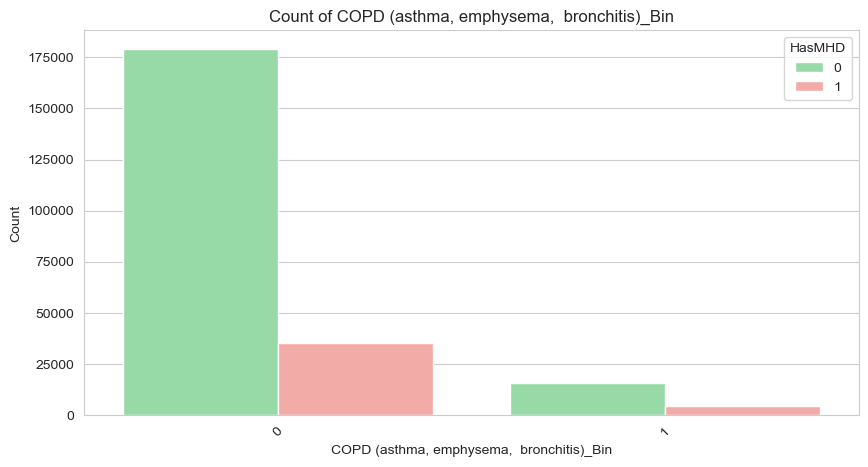



===== combined_combined_pca_128, VIRAL HEPATITIS_BIN =====
Viral hepatitis_Bin
0    234869
Name: count, dtype: int64
Viral hepatitis_Bin
0    1.0
Name: proportion, dtype: float64

Crosstab (counts):
HasMHD                    0      1
Viral hepatitis_Bin               
0                    194796  40073

Crosstab (row %):
HasMHD                   0      1
Viral hepatitis_Bin              
0                    0.829  0.171
Column: Viral hepatitis_Bin

Viral hepatitis_Bin
0    100.0
Name: proportion, dtype: float64


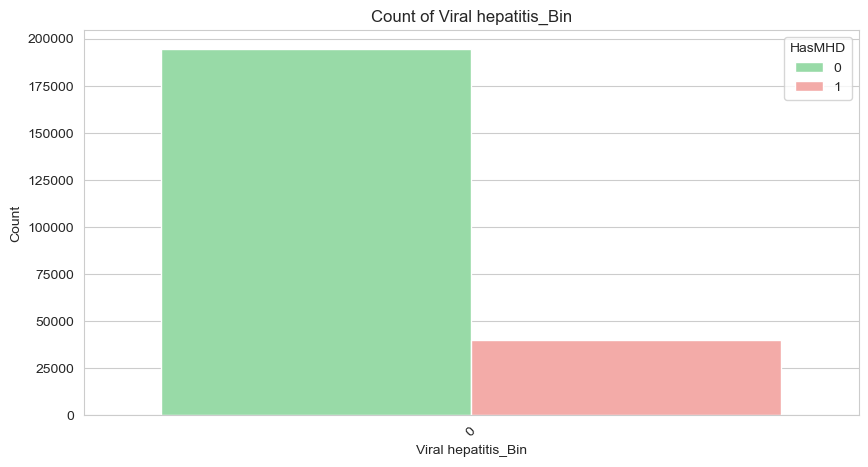



===== combined_combined_pca_128, CHRONIC PAIN_BIN =====
Chronic pain_Bin
0    234259
1       610
Name: count, dtype: int64
Chronic pain_Bin
0    0.997
1    0.003
Name: proportion, dtype: float64

Crosstab (counts):
HasMHD                 0      1
Chronic pain_Bin               
0                 194453  39806
1                    343    267

Crosstab (row %):
HasMHD                0      1
Chronic pain_Bin              
0                 0.830  0.170
1                 0.562  0.438
Column: Chronic pain_Bin

Chronic pain_Bin
0    99.740281
1     0.259719
Name: proportion, dtype: float64


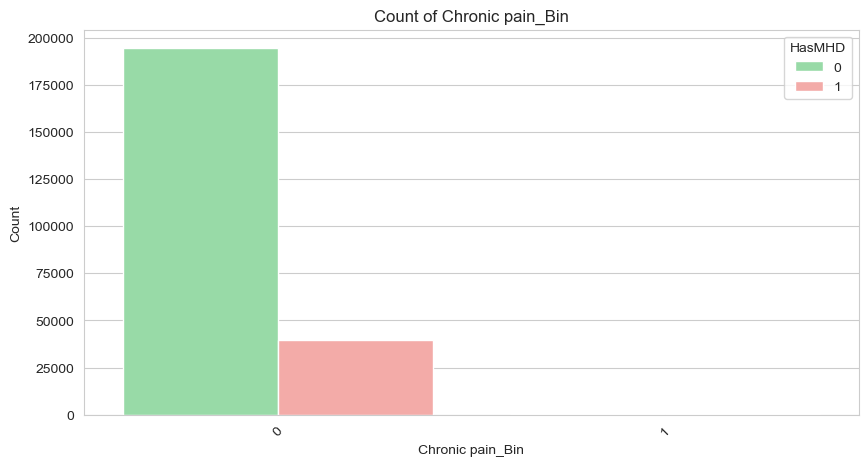



===== combined_combined_pca_128, RHEUMATOID ARTHRITIS_BIN =====
Rheumatoid arthritis_Bin
0    233541
1      1328
Name: count, dtype: int64
Rheumatoid arthritis_Bin
0    0.994
1    0.006
Name: proportion, dtype: float64

Crosstab (counts):
HasMHD                         0      1
Rheumatoid arthritis_Bin               
0                         193790  39751
1                           1006    322

Crosstab (row %):
HasMHD                        0      1
Rheumatoid arthritis_Bin              
0                         0.830  0.170
1                         0.758  0.242
Column: Rheumatoid arthritis_Bin

Rheumatoid arthritis_Bin
0    99.434578
1     0.565422
Name: proportion, dtype: float64


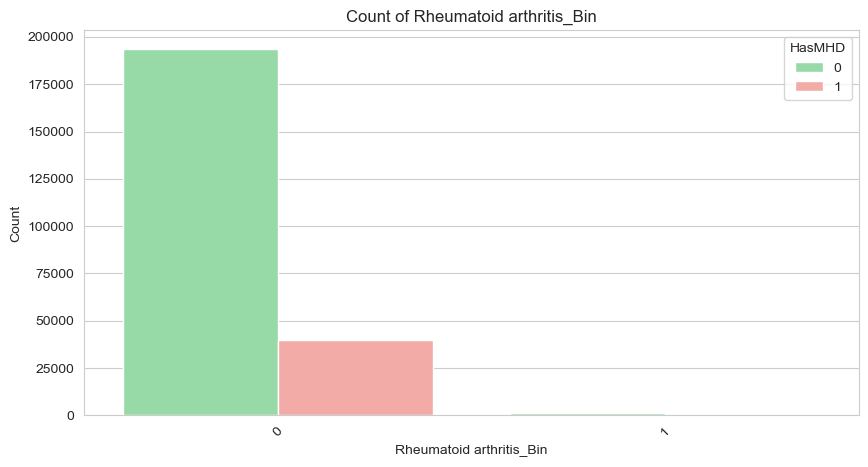



===== combined_combined_pca_128, MYOCARDIAL INFARCTION_BIN =====
Myocardial infarction_Bin
0    233309
1      1560
Name: count, dtype: int64
Myocardial infarction_Bin
0    0.993
1    0.007
Name: proportion, dtype: float64

Crosstab (counts):
HasMHD                          0      1
Myocardial infarction_Bin               
0                          193572  39737
1                            1224    336

Crosstab (row %):
HasMHD                         0      1
Myocardial infarction_Bin              
0                          0.830  0.170
1                          0.785  0.215
Column: Myocardial infarction_Bin

Myocardial infarction_Bin
0    99.3358
1     0.6642
Name: proportion, dtype: float64


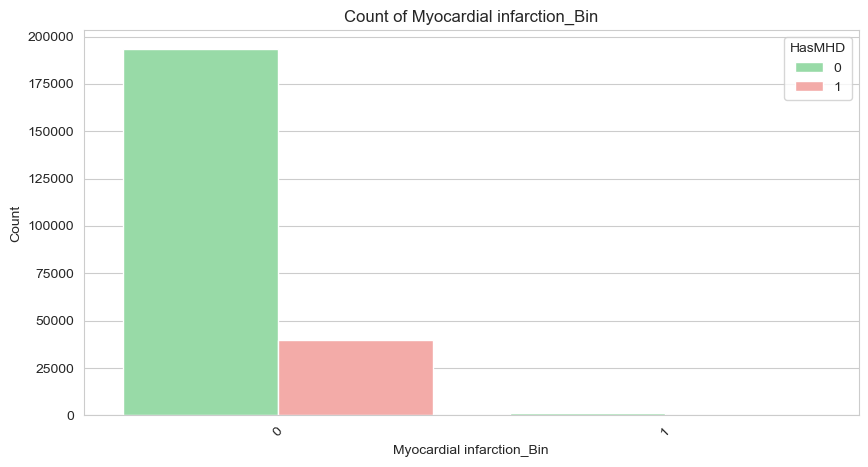



===== combined_combined_pca_128, PARKINSON'S DISEASE_BIN =====
Parkinson's disease_Bin
0    234094
1       775
Name: count, dtype: int64
Parkinson's disease_Bin
0    0.997
1    0.003
Name: proportion, dtype: float64

Crosstab (counts):
HasMHD                        0      1
Parkinson's disease_Bin               
0                        194208  39886
1                           588    187

Crosstab (row %):
HasMHD                       0      1
Parkinson's disease_Bin              
0                        0.830  0.170
1                        0.759  0.241
Column: Parkinson's disease_Bin

Parkinson's disease_Bin
0    99.670029
1     0.329971
Name: proportion, dtype: float64


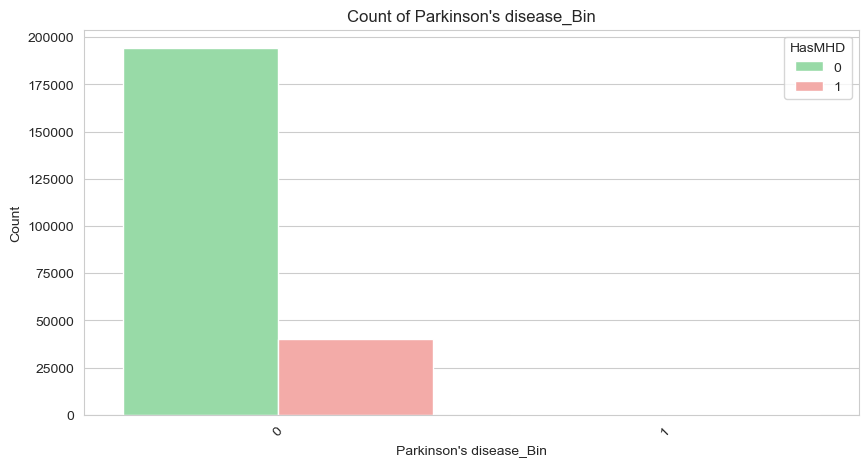



===== combined_combined_pca_128, STROKE_BIN =====
Stroke_Bin
0    232016
1      2853
Name: count, dtype: int64
Stroke_Bin
0    0.988
1    0.012
Name: proportion, dtype: float64

Crosstab (counts):
HasMHD           0      1
Stroke_Bin               
0           192574  39442
1             2222    631

Crosstab (row %):
HasMHD          0      1
Stroke_Bin              
0           0.830  0.170
1           0.779  0.221
Column: Stroke_Bin

Stroke_Bin
0    98.78528
1     1.21472
Name: proportion, dtype: float64


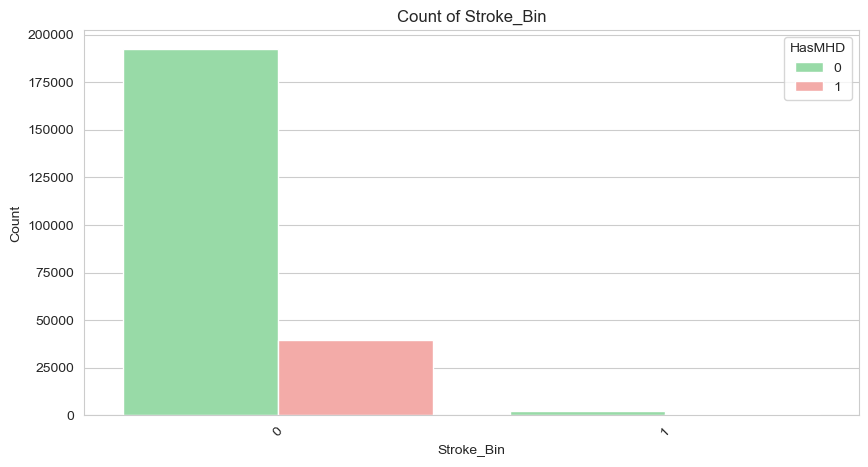



===== combined_combined_pca_128, ANGINA PECTORIS_BIN =====
Angina pectoris_Bin
0    233150
1      1719
Name: count, dtype: int64
Angina pectoris_Bin
0    0.993
1    0.007
Name: proportion, dtype: float64

Crosstab (counts):
HasMHD                    0      1
Angina pectoris_Bin               
0                    193543  39607
1                      1253    466

Crosstab (row %):
HasMHD                   0      1
Angina pectoris_Bin              
0                    0.830  0.170
1                    0.729  0.271
Column: Angina pectoris_Bin

Angina pectoris_Bin
0    99.268103
1     0.731897
Name: proportion, dtype: float64


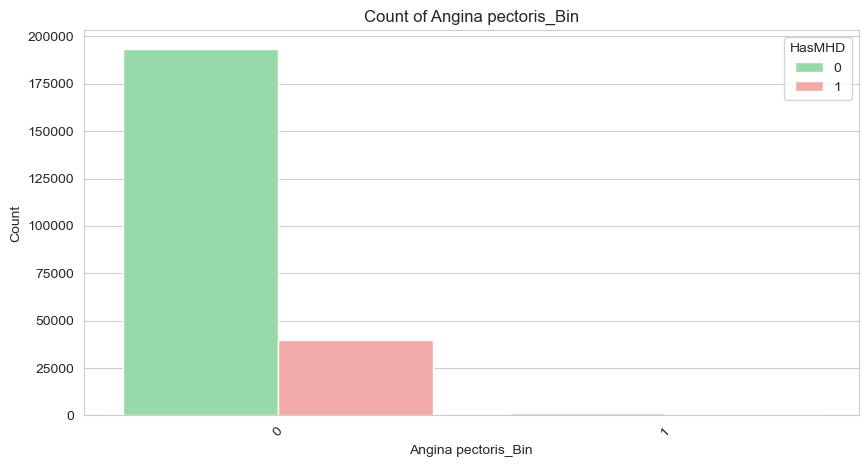



===== combined_combined_pca_128, LIVER DISEASE_BIN =====
Liver disease_Bin
0    233319
1      1550
Name: count, dtype: int64
Liver disease_Bin
0    0.993
1    0.007
Name: proportion, dtype: float64

Crosstab (counts):
HasMHD                  0      1
Liver disease_Bin               
0                  193599  39720
1                    1197    353

Crosstab (row %):
HasMHD                 0      1
Liver disease_Bin              
0                  0.830  0.170
1                  0.772  0.228
Column: Liver disease_Bin

Liver disease_Bin
0    99.340058
1     0.659942
Name: proportion, dtype: float64


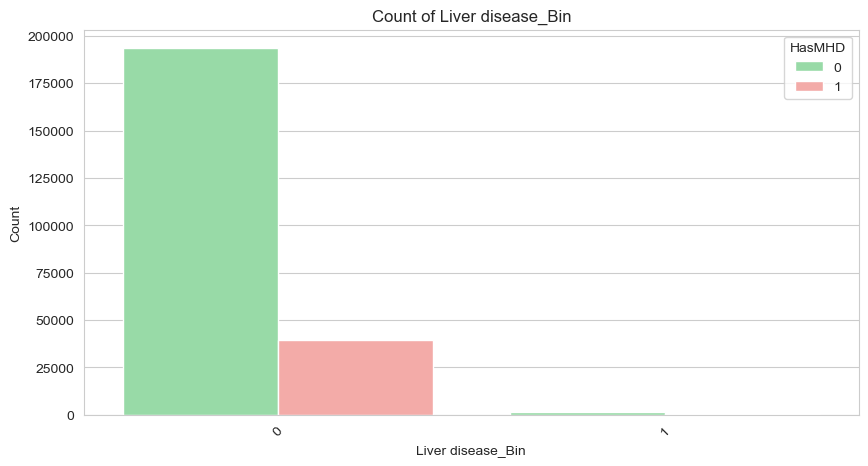



===== combined_combined_pca_128, MIGRAINE_BIN =====
Migraine_Bin
0    233402
1      1467
Name: count, dtype: int64
Migraine_Bin
0    0.994
1    0.006
Name: proportion, dtype: float64

Crosstab (counts):
HasMHD             0      1
Migraine_Bin               
0             193790  39612
1               1006    461

Crosstab (row %):
HasMHD            0      1
Migraine_Bin              
0             0.830  0.170
1             0.686  0.314
Column: Migraine_Bin

Migraine_Bin
0    99.375396
1     0.624604
Name: proportion, dtype: float64


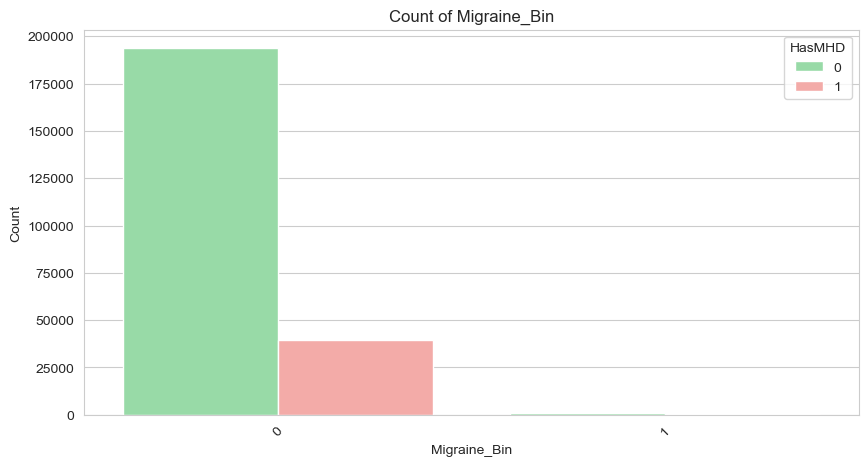



===== combined_combined_pca_128, CONSTIPATION_BIN =====
Constipation_Bin
0    233337
1      1532
Name: count, dtype: int64
Constipation_Bin
0    0.993
1    0.007
Name: proportion, dtype: float64

Crosstab (counts):
HasMHD                 0      1
Constipation_Bin               
0                 193819  39518
1                    977    555

Crosstab (row %):
HasMHD                0      1
Constipation_Bin              
0                 0.831  0.169
1                 0.638  0.362
Column: Constipation_Bin

Constipation_Bin
0    99.347721
1     0.652279
Name: proportion, dtype: float64


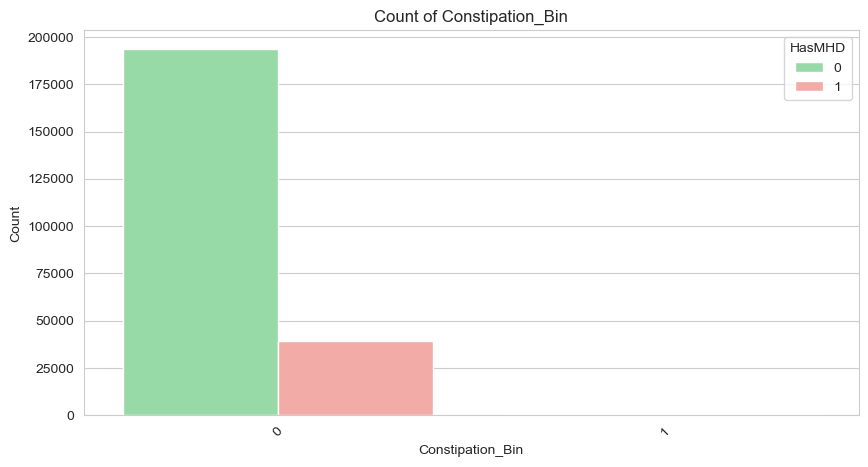



===== combined_combined_pca_128, HASMHD =====
HasMHD
0    194796
1     40073
Name: count, dtype: int64
HasMHD
0    0.829
1    0.171
Name: proportion, dtype: float64

Crosstab (counts):
HasMHD       0      1
HasMHD               
0       194796      0
1            0  40073

Crosstab (row %):
HasMHD    0    1
HasMHD          
0       1.0  0.0
1       0.0  1.0
Column: HasMHD

HasMHD
0    82.938148
1    17.061852
Name: proportion, dtype: float64


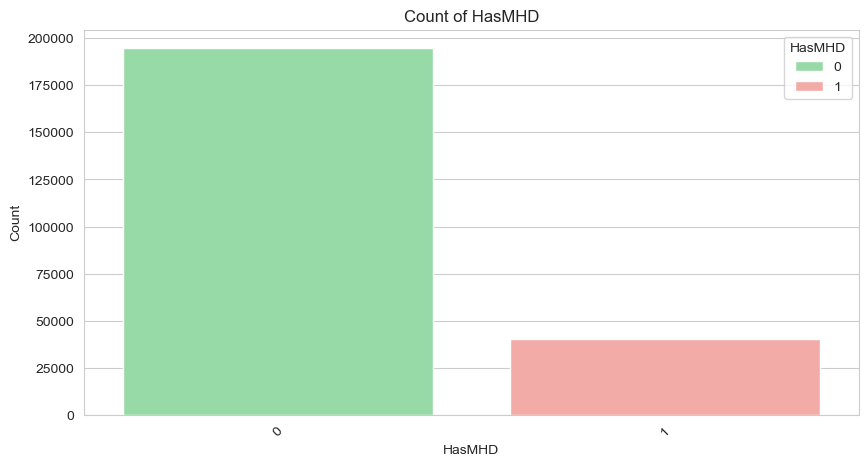

In [31]:
example = combined_df['combined_isolated_pca_128']

categorical_columns = [c for c in example.columns if c not in continuous_columns and c not in parquet_columns]

for k, v in combined_df.items():

    for c in categorical_columns:
    
        print(f'===== {k}, {c.upper()} =====')
    
        print(v[c].value_counts(dropna=False))
        print(v[c].value_counts(normalize=True, dropna=False).round(3))

        print("\nCrosstab (counts):")
        print(pd.crosstab(v[c], v['HasMHD']))

        print("\nCrosstab (row %):")
        print(pd.crosstab(v[c], v['HasMHD'], normalize='index').round(3))

        make_barplot(v, c, groupby='HasMHD', category_colours=category_colours)

===== Correlations in combined_isolated_pca_128 =====
Problematic columns: ['LongTermMeds_Num', 'Total_Medications']


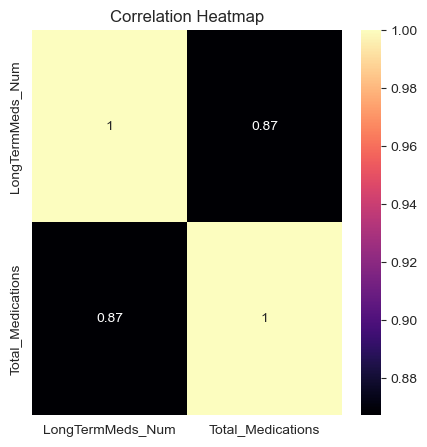

===== Correlations in combined_isolated_pca_256 =====
Problematic columns: ['LongTermMeds_Num', 'Total_Medications']


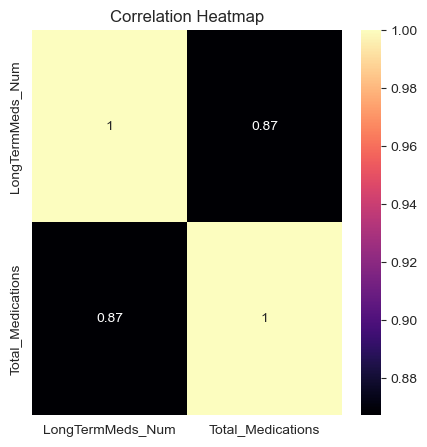

===== Correlations in combined_isolated_pca_512 =====
Problematic columns: ['LongTermMeds_Num', 'Total_Medications']


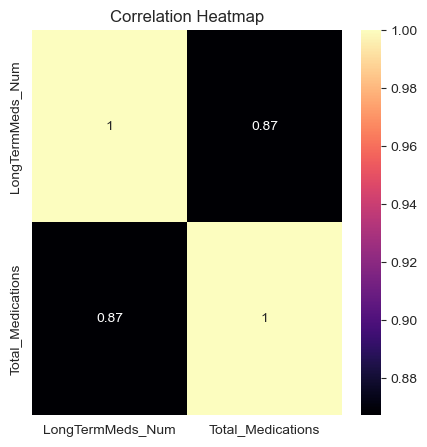

===== Correlations in combined_combined_pca_128 =====
Problematic columns: ['LongTermMeds_Num', 'Total_Medications']


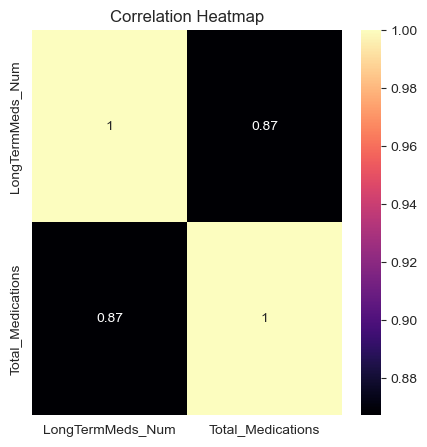

In [32]:
for k, v in combined_df.items():
    print(f'===== Correlations in {k} =====')
    problematic_corr = plot_problematic_corr(v[continuous_columns])

    print(f'Problematic columns: {list(problematic_corr)}')

    problematic_corr_matrix = v[list(problematic_corr)].corr()
    plt.figure(figsize=(5, 5))
    sns.heatmap(problematic_corr_matrix, cmap="magma", annot=True)
    plt.title("Correlation Heatmap")
    plt.show()

In [7]:
for k, v in combined_df.items():
    combined_df[k] = v.drop(['Total_Medications'], axis=1)


In [17]:
training_Xy = {}

for k, v in combined_df.items():
    v = clean_column_names(v)
    X = v.drop(columns = ['HasMHD'])
    y = v['HasMHD']

    X_train, X_test, y_train, y_test = train_test_split(X, y,
                                                        test_size=0.2,
                                                        random_state=42,
                                                        stratify=y)

In [ ]:
X_train, X_test = impute_data(X_train, X_test)

X_train_scaled, X_test_scaled = scale_data(X_train, X_test)

training_Xy[k] = {
    'df': v,
    'X': X,
    'y': y,
    'X_train_scaled': X_train_scaled,
    'X_test_scaled': X_test_scaled,
    'y_train': y_train,
    'y_test': y_test
    }

# Model Training

## No hyperparameter tuning

===== combined_isolated_pca_128_KNN =====
Train accuracy score: 1.0
Test accuracy score: 0.8254779239579342


======== Training Set ==========
Confusion Matrix:
[[155837      0]
 [     0  32058]]

Classification Report:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00    155837
           1       1.00      1.00      1.00     32058

    accuracy                           1.00    187895
   macro avg       1.00      1.00      1.00    187895
weighted avg       1.00      1.00      1.00    187895



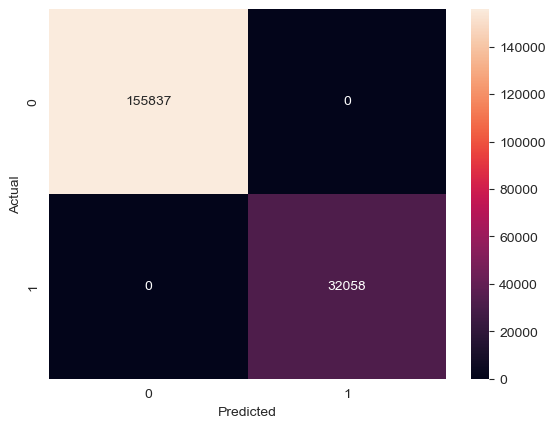

Training AUC: 1.0000


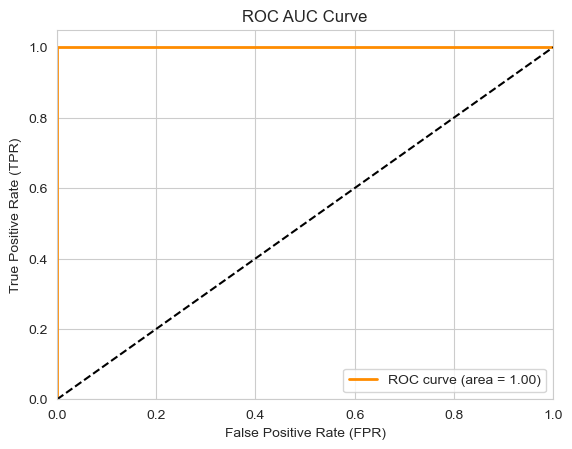

======== Test Set ==========
Confusion Matrix:
[[38121   838]
 [ 7360   655]]

Classification Report:
              precision    recall  f1-score   support

           0       0.84      0.98      0.90     38959
           1       0.44      0.08      0.14      8015

    accuracy                           0.83     46974
   macro avg       0.64      0.53      0.52     46974
weighted avg       0.77      0.83      0.77     46974



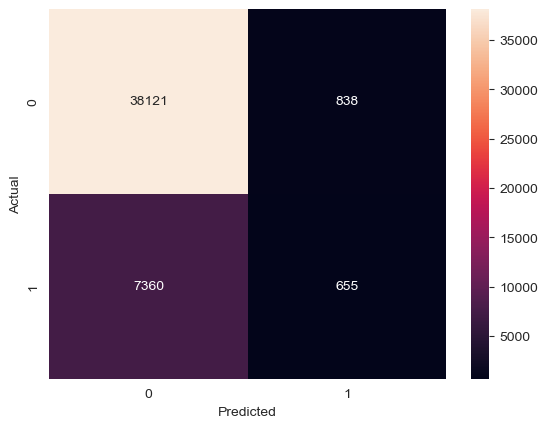

Testing AUC: 0.6285


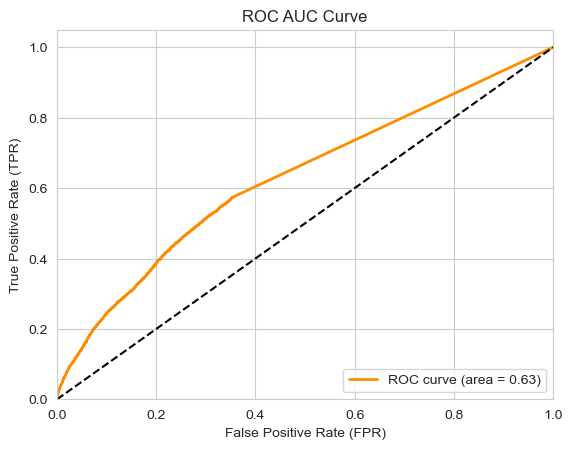

===== combined_isolated_pca_128_LR =====
Train accuracy score: 0.6914713004603635
Test accuracy score: 0.6854217226550858


======== Training Set ==========
Confusion Matrix:
[[110517  45320]
 [ 12651  19407]]

Classification Report:
              precision    recall  f1-score   support

           0       0.90      0.71      0.79    155837
           1       0.30      0.61      0.40     32058

    accuracy                           0.69    187895
   macro avg       0.60      0.66      0.60    187895
weighted avg       0.80      0.69      0.73    187895



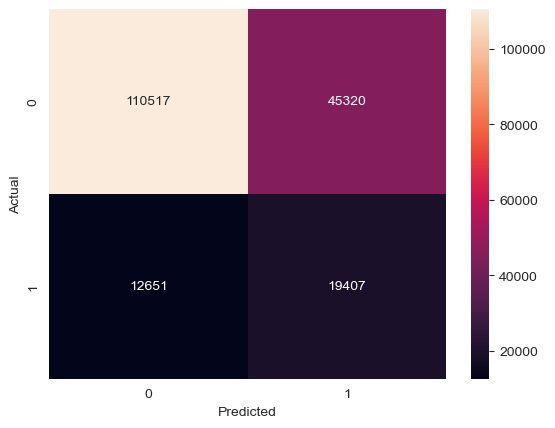

Training AUC: 0.7106


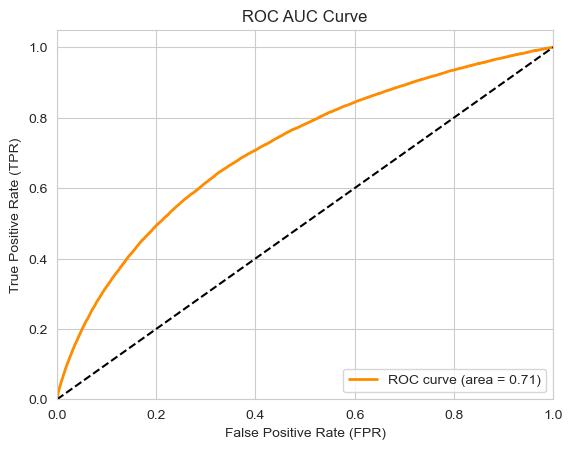

======== Test Set ==========
Confusion Matrix:
[[27397 11562]
 [ 3215  4800]]

Classification Report:
              precision    recall  f1-score   support

           0       0.89      0.70      0.79     38959
           1       0.29      0.60      0.39      8015

    accuracy                           0.69     46974
   macro avg       0.59      0.65      0.59     46974
weighted avg       0.79      0.69      0.72     46974



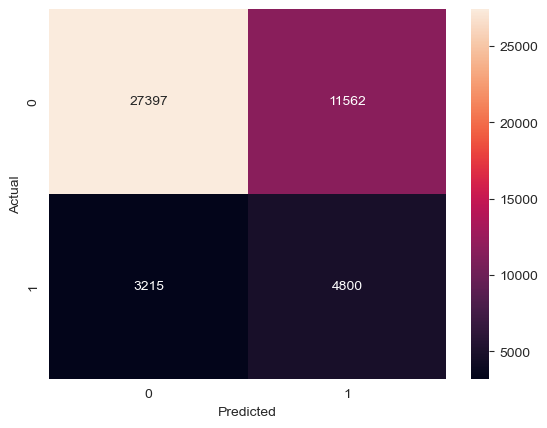

Testing AUC: 0.7035


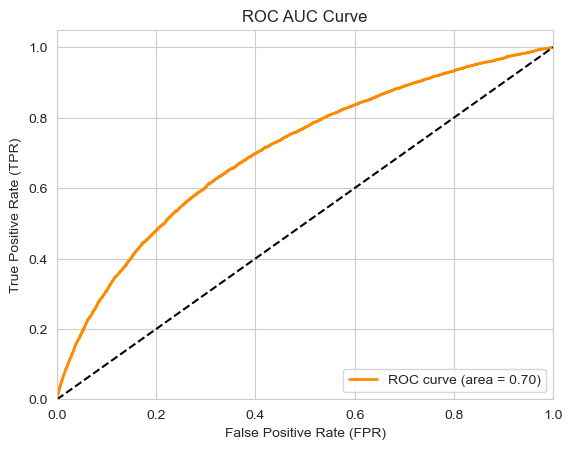

===== combined_isolated_pca_256_KNN =====
Train accuracy score: 1.0
Test accuracy score: 0.8264784774556138


======== Training Set ==========
Confusion Matrix:
[[155837      0]
 [     0  32058]]

Classification Report:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00    155837
           1       1.00      1.00      1.00     32058

    accuracy                           1.00    187895
   macro avg       1.00      1.00      1.00    187895
weighted avg       1.00      1.00      1.00    187895



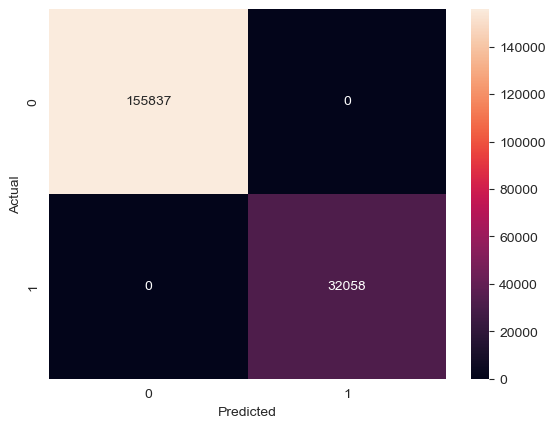

Training AUC: 1.0000


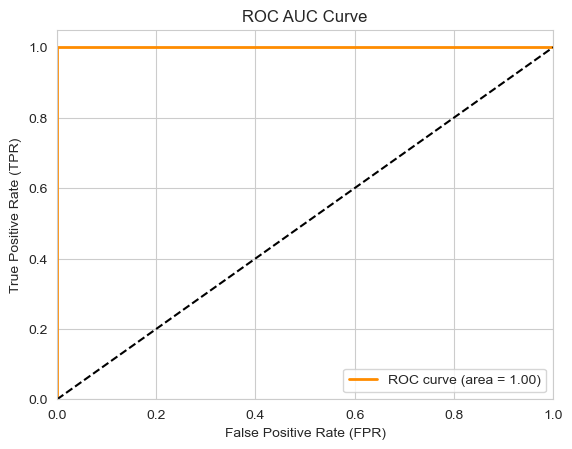

======== Test Set ==========
Confusion Matrix:
[[38196   763]
 [ 7388   627]]

Classification Report:
              precision    recall  f1-score   support

           0       0.84      0.98      0.90     38959
           1       0.45      0.08      0.13      8015

    accuracy                           0.83     46974
   macro avg       0.64      0.53      0.52     46974
weighted avg       0.77      0.83      0.77     46974



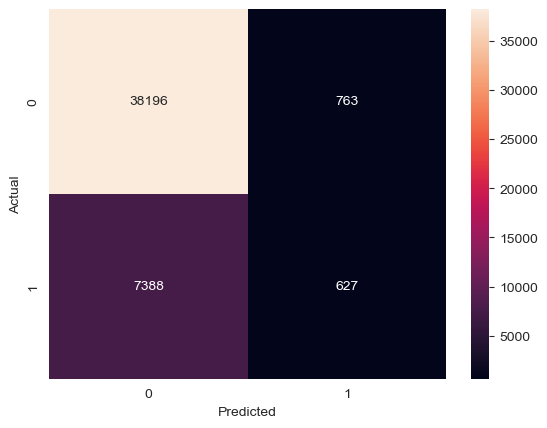

Testing AUC: 0.6150


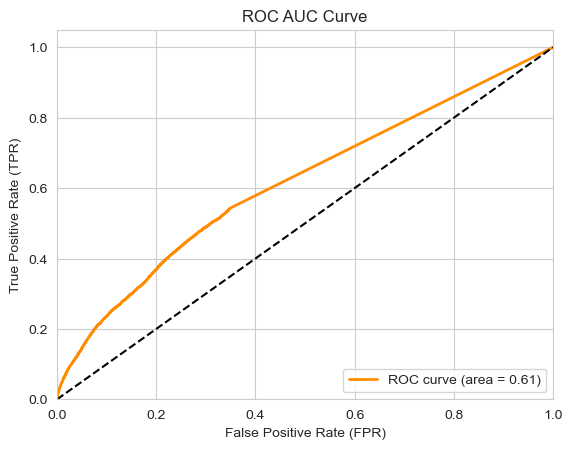

===== combined_isolated_pca_256_LR =====
Train accuracy score: 0.6924825035259055
Test accuracy score: 0.6875931366287734


======== Training Set ==========
Confusion Matrix:
[[110666  45171]
 [ 12610  19448]]

Classification Report:
              precision    recall  f1-score   support

           0       0.90      0.71      0.79    155837
           1       0.30      0.61      0.40     32058

    accuracy                           0.69    187895
   macro avg       0.60      0.66      0.60    187895
weighted avg       0.80      0.69      0.73    187895



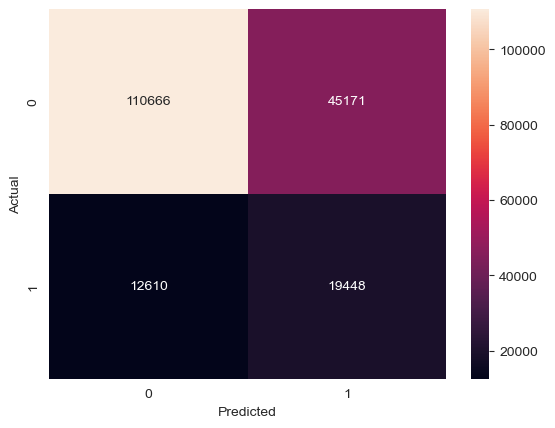

Training AUC: 0.7124


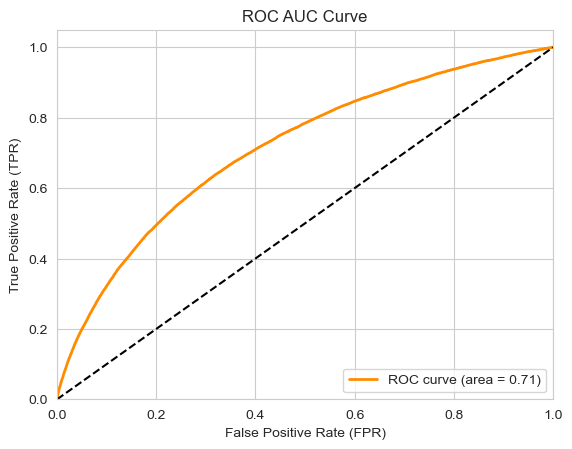

======== Test Set ==========
Confusion Matrix:
[[27496 11463]
 [ 3212  4803]]

Classification Report:
              precision    recall  f1-score   support

           0       0.90      0.71      0.79     38959
           1       0.30      0.60      0.40      8015

    accuracy                           0.69     46974
   macro avg       0.60      0.65      0.59     46974
weighted avg       0.79      0.69      0.72     46974



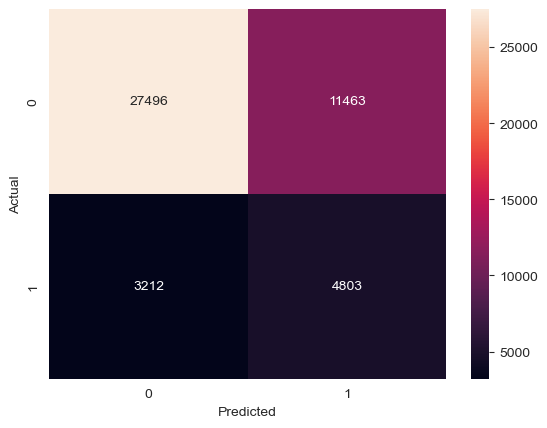

Testing AUC: 0.7048


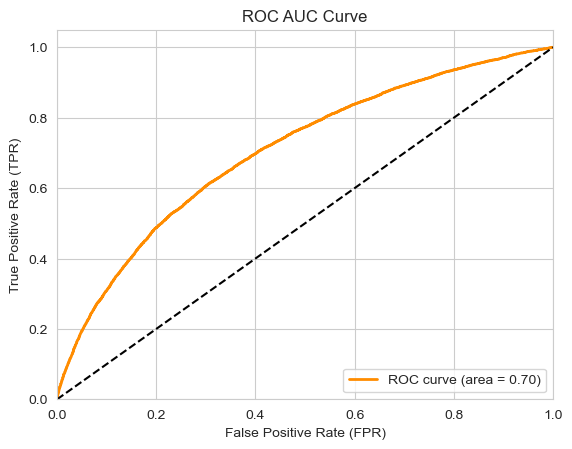

===== combined_isolated_pca_512_KNN =====
Train accuracy score: 1.0
Test accuracy score: 0.8258611146591731


======== Training Set ==========
Confusion Matrix:
[[155837      0]
 [     0  32058]]

Classification Report:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00    155837
           1       1.00      1.00      1.00     32058

    accuracy                           1.00    187895
   macro avg       1.00      1.00      1.00    187895
weighted avg       1.00      1.00      1.00    187895



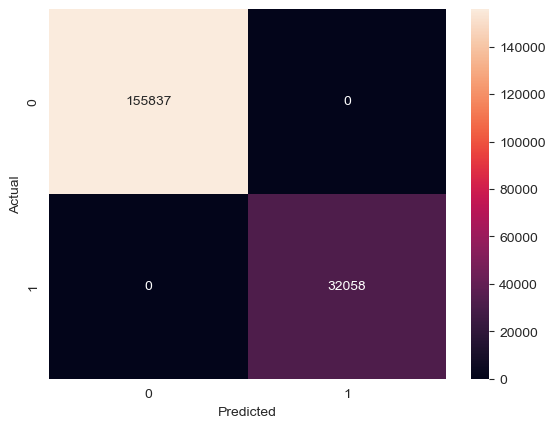

Training AUC: 1.0000


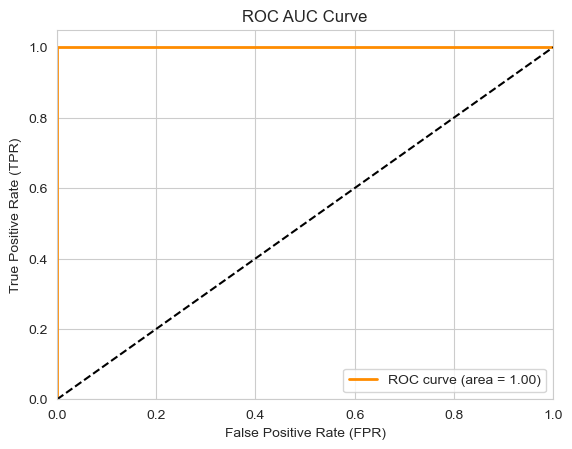

======== Test Set ==========
Confusion Matrix:
[[38198   761]
 [ 7419   596]]

Classification Report:
              precision    recall  f1-score   support

           0       0.84      0.98      0.90     38959
           1       0.44      0.07      0.13      8015

    accuracy                           0.83     46974
   macro avg       0.64      0.53      0.52     46974
weighted avg       0.77      0.83      0.77     46974



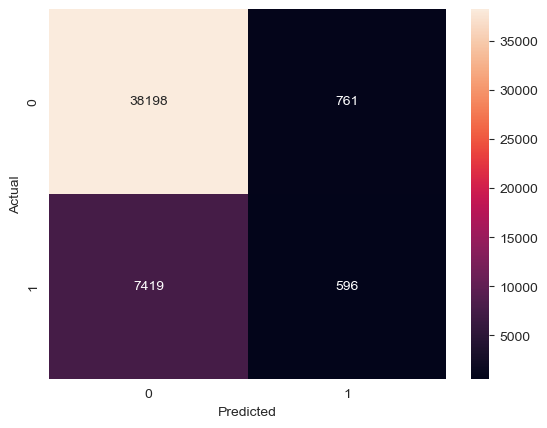

Testing AUC: 0.6073


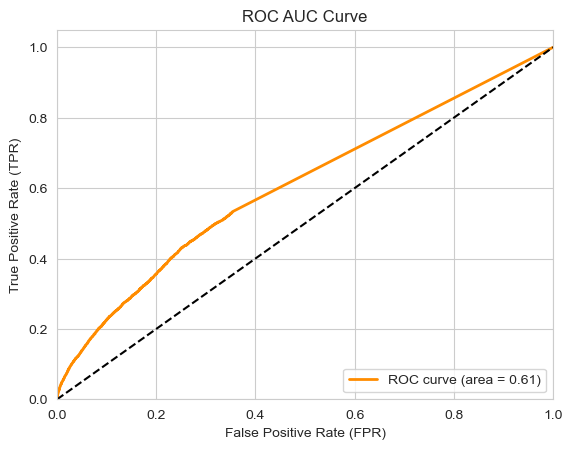

===== combined_isolated_pca_512_LR =====
Train accuracy score: 0.6926208786822428
Test accuracy score: 0.6881040575637587


======== Training Set ==========
Confusion Matrix:
[[110647  45190]
 [ 12565  19493]]

Classification Report:
              precision    recall  f1-score   support

           0       0.90      0.71      0.79    155837
           1       0.30      0.61      0.40     32058

    accuracy                           0.69    187895
   macro avg       0.60      0.66      0.60    187895
weighted avg       0.80      0.69      0.73    187895



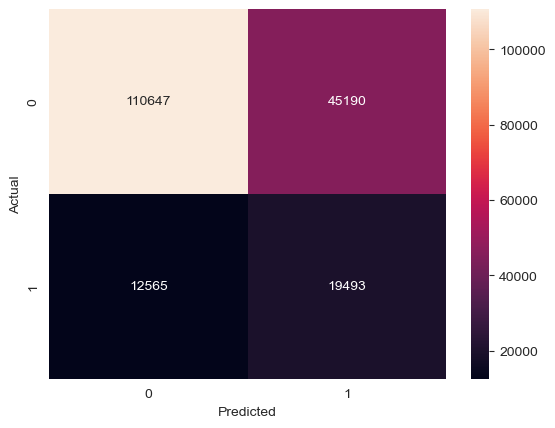

Training AUC: 0.7146


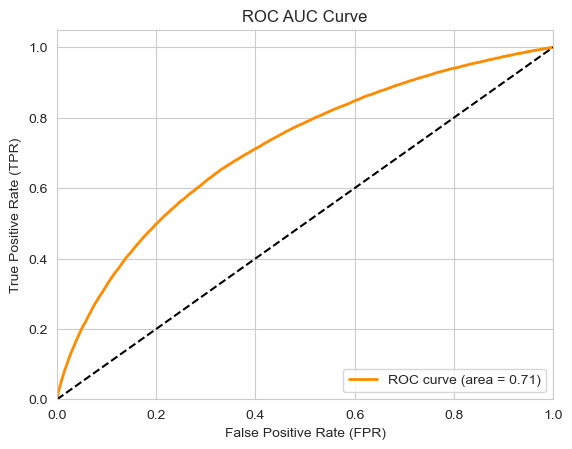

======== Test Set ==========
Confusion Matrix:
[[27515 11444]
 [ 3207  4808]]

Classification Report:
              precision    recall  f1-score   support

           0       0.90      0.71      0.79     38959
           1       0.30      0.60      0.40      8015

    accuracy                           0.69     46974
   macro avg       0.60      0.65      0.59     46974
weighted avg       0.79      0.69      0.72     46974



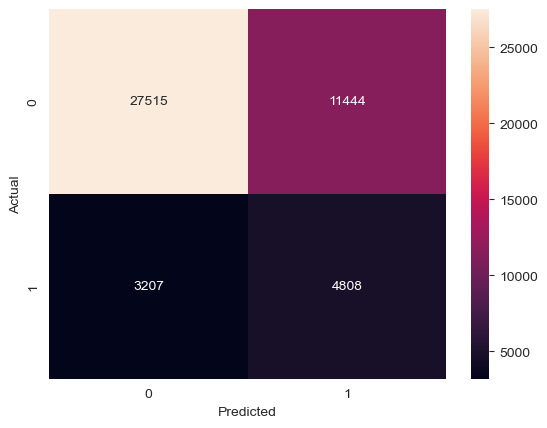

Testing AUC: 0.7049


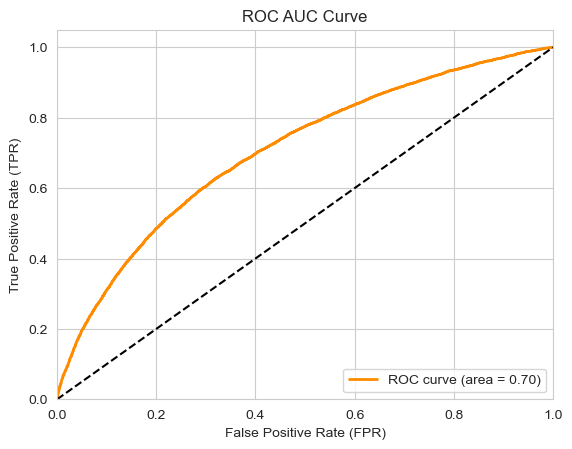

===== combined_combined_pca_128_KNN =====
Train accuracy score: 1.0
Test accuracy score: 0.8264784774556138


======== Training Set ==========
Confusion Matrix:
[[155837      0]
 [     0  32058]]

Classification Report:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00    155837
           1       1.00      1.00      1.00     32058

    accuracy                           1.00    187895
   macro avg       1.00      1.00      1.00    187895
weighted avg       1.00      1.00      1.00    187895



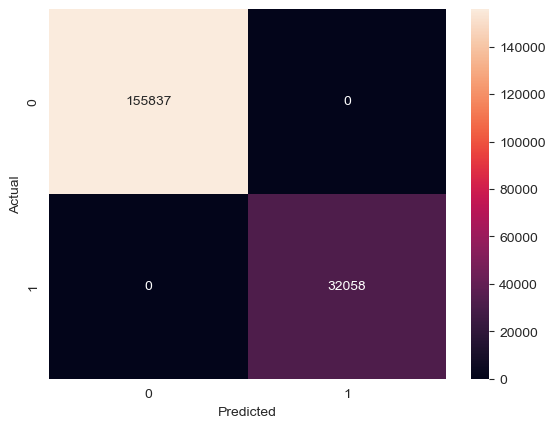

Training AUC: 1.0000


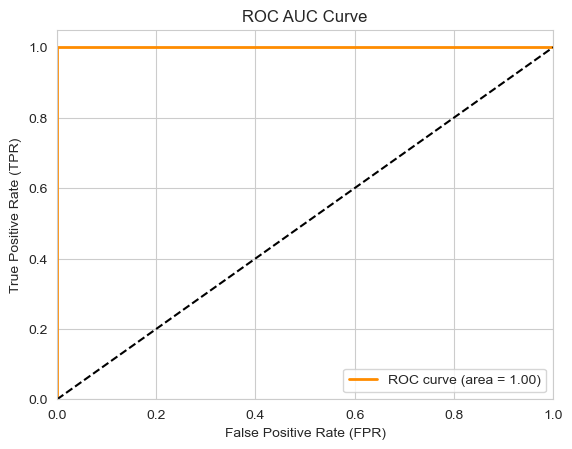

======== Test Set ==========
Confusion Matrix:
[[38196   763]
 [ 7388   627]]

Classification Report:
              precision    recall  f1-score   support

           0       0.84      0.98      0.90     38959
           1       0.45      0.08      0.13      8015

    accuracy                           0.83     46974
   macro avg       0.64      0.53      0.52     46974
weighted avg       0.77      0.83      0.77     46974



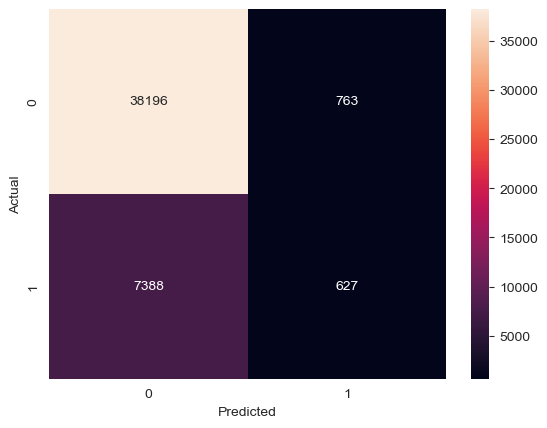

Testing AUC: 0.6150


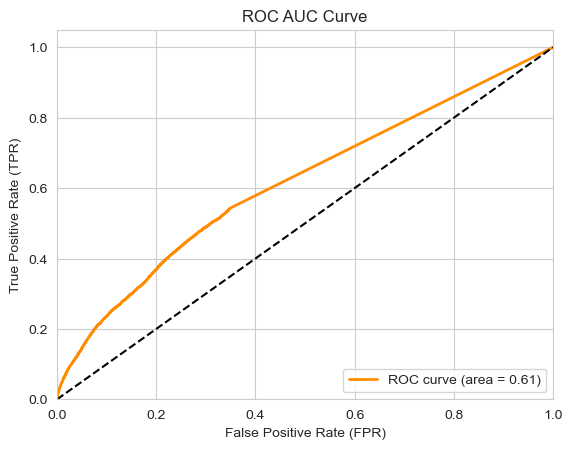

===== combined_combined_pca_128_LR =====
Train accuracy score: 0.6924825035259055
Test accuracy score: 0.6875931366287734


======== Training Set ==========
Confusion Matrix:
[[110666  45171]
 [ 12610  19448]]

Classification Report:
              precision    recall  f1-score   support

           0       0.90      0.71      0.79    155837
           1       0.30      0.61      0.40     32058

    accuracy                           0.69    187895
   macro avg       0.60      0.66      0.60    187895
weighted avg       0.80      0.69      0.73    187895



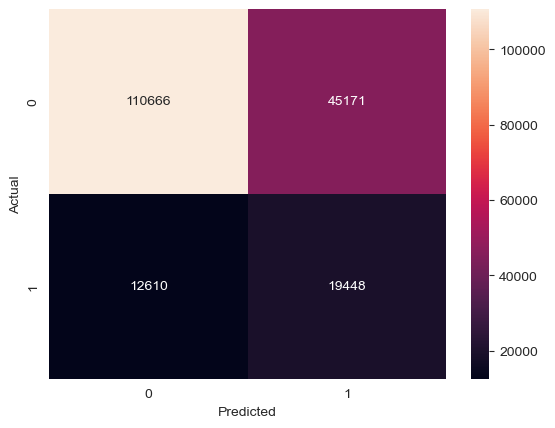

Training AUC: 0.7124


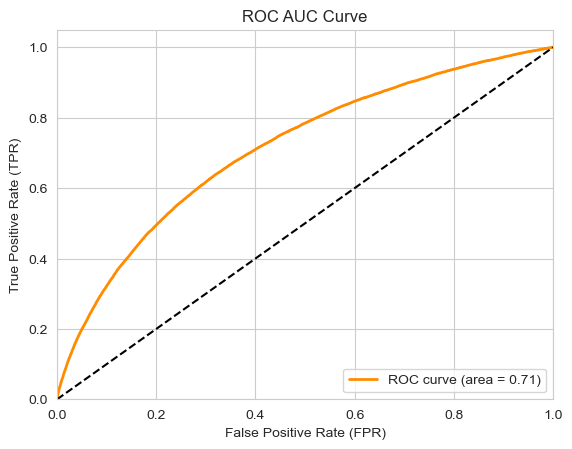

======== Test Set ==========
Confusion Matrix:
[[27496 11463]
 [ 3212  4803]]

Classification Report:
              precision    recall  f1-score   support

           0       0.90      0.71      0.79     38959
           1       0.30      0.60      0.40      8015

    accuracy                           0.69     46974
   macro avg       0.60      0.65      0.59     46974
weighted avg       0.79      0.69      0.72     46974



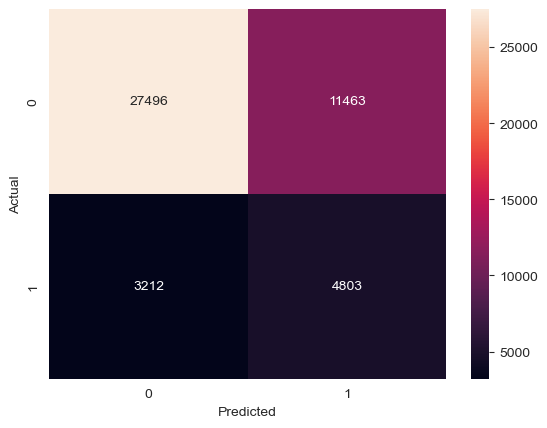

Testing AUC: 0.7048


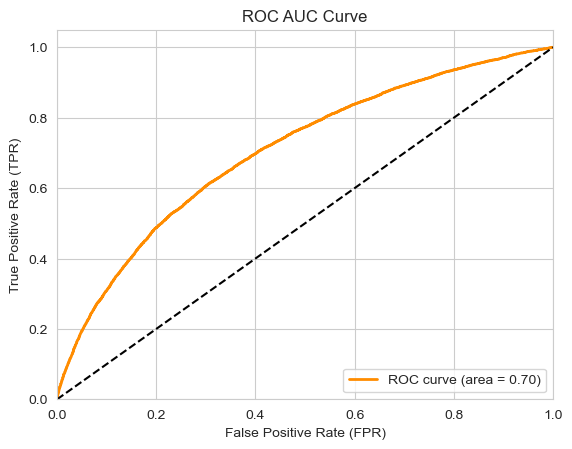

In [49]:
results_KNN = {}
results_LR = {}

models = {
    'KNN': KNeighborsClassifier(weights='distance'),
    'LR': LogisticRegression(class_weight='balanced', max_iter = 1000)
}

for dataset_name, dataset_dict in training_Xy.items():
    X_train_scaled = dataset_dict['X_train_scaled']
    X_test_scaled = dataset_dict['X_test_scaled']
    y_train = dataset_dict['y_train']
    y_test = dataset_dict['y_test']

    for model_name, model in models.items():
        name = f"{dataset_name}_{model_name}"
        trained = model.fit(X_train_scaled, y_train)
        print(f'===== {name} =====')

        y_pred_train, y_pred_test, y_prob_train, y_prob_test = evaluate_model(
            trained, X_train_scaled, y_train, X_test_scaled, y_test
        )

        result_entry = {
            'trained': trained,
            'y_pred_train': y_pred_train,
            'y_pred_test': y_pred_test,
            'y_prob_train': y_prob_train,
            'y_prob_test': y_prob_test
        }

        if model_name == 'KNN':
            results_KNN[name] = result_entry
        elif model_name == 'LR':
            results_LR[name] = result_entry


===== combined_isolated_pca_128_RFC =====
Train accuracy score: 0.9999893557572048
Test accuracy score: 0.8316941286669222


======== Training Set ==========
Confusion Matrix:
[[155837      0]
 [     2  32056]]

Classification Report:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00    155837
           1       1.00      1.00      1.00     32058

    accuracy                           1.00    187895
   macro avg       1.00      1.00      1.00    187895
weighted avg       1.00      1.00      1.00    187895



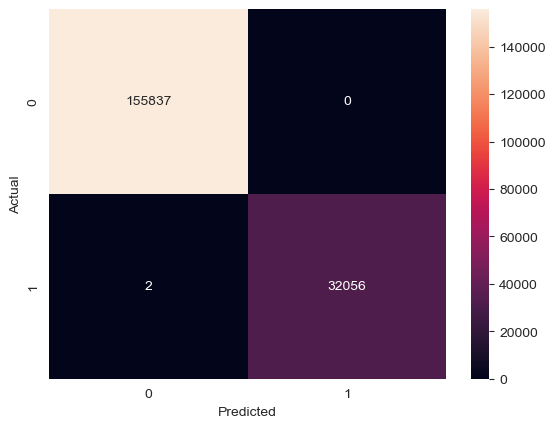

Training AUC: 1.0000


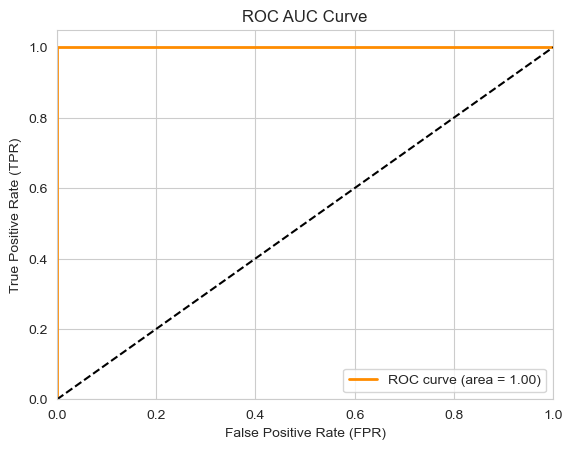

======== Test Set ==========
Confusion Matrix:
[[38863    96]
 [ 7810   205]]

Classification Report:
              precision    recall  f1-score   support

           0       0.83      1.00      0.91     38959
           1       0.68      0.03      0.05      8015

    accuracy                           0.83     46974
   macro avg       0.76      0.51      0.48     46974
weighted avg       0.81      0.83      0.76     46974



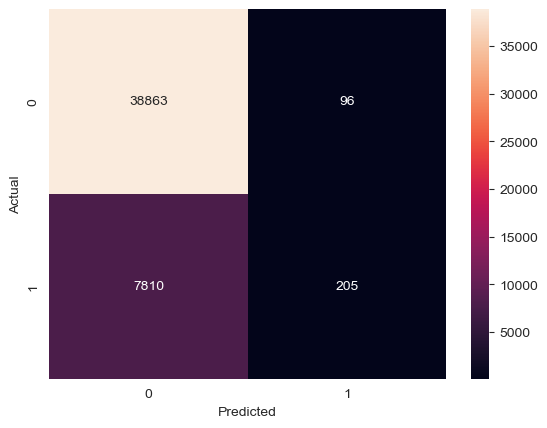

Testing AUC: 0.7981


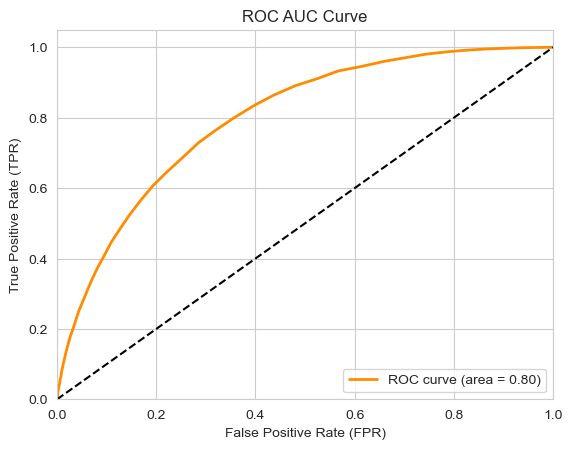

===== combined_isolated_pca_128_XGB =====
Train accuracy score: 0.72531999254903
Test accuracy score: 0.7238685230127304


======== Training Set ==========
Confusion Matrix:
[[112062  43775]
 [  7836  24222]]

Classification Report:
              precision    recall  f1-score   support

           0       0.93      0.72      0.81    155837
           1       0.36      0.76      0.48     32058

    accuracy                           0.73    187895
   macro avg       0.65      0.74      0.65    187895
weighted avg       0.84      0.73      0.76    187895



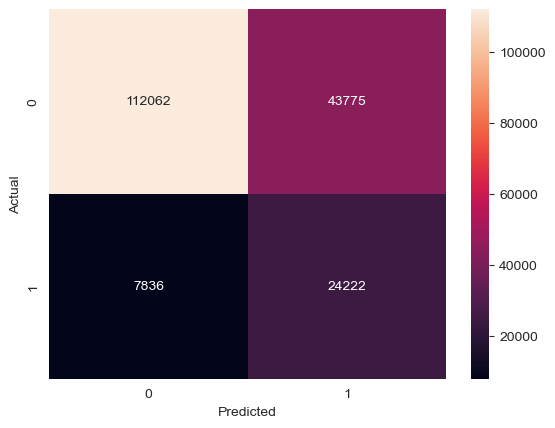

Training AUC: 0.8203


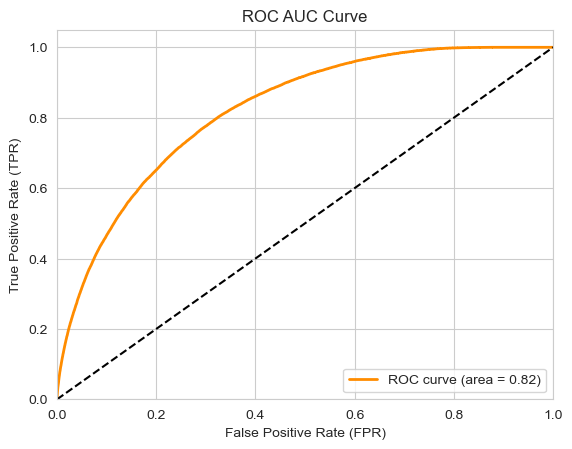

======== Test Set ==========
Confusion Matrix:
[[28052 10907]
 [ 2064  5951]]

Classification Report:
              precision    recall  f1-score   support

           0       0.93      0.72      0.81     38959
           1       0.35      0.74      0.48      8015

    accuracy                           0.72     46974
   macro avg       0.64      0.73      0.65     46974
weighted avg       0.83      0.72      0.76     46974



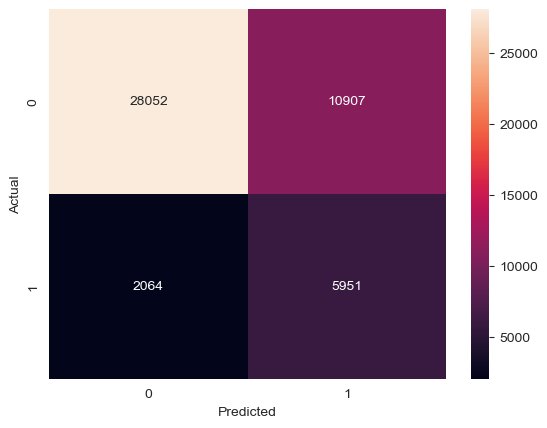

Testing AUC: 0.8140


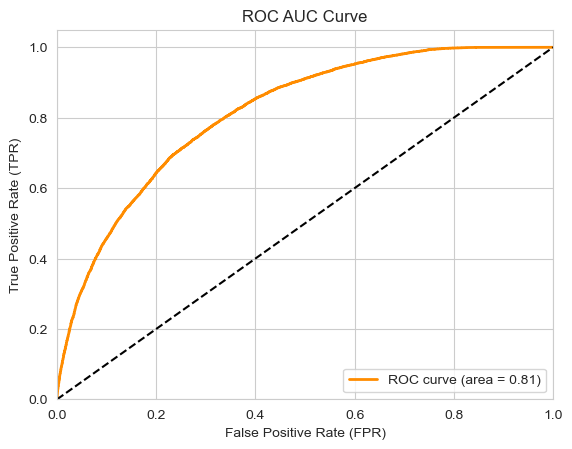

===== combined_isolated_pca_128_ADA =====
Train accuracy score: 0.58715239894622
Test accuracy score: 0.5886873589645336


======== Training Set ==========
Confusion Matrix:
[[86124 69713]
 [ 7859 24199]]

Classification Report:
              precision    recall  f1-score   support

           0       0.92      0.55      0.69    155837
           1       0.26      0.75      0.38     32058

    accuracy                           0.59    187895
   macro avg       0.59      0.65      0.54    187895
weighted avg       0.80      0.59      0.64    187895



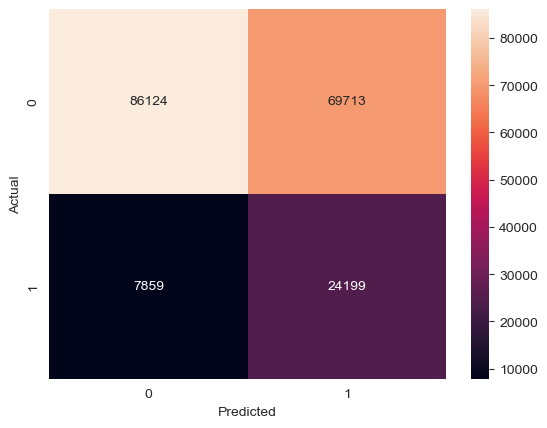

Training AUC: 0.7325


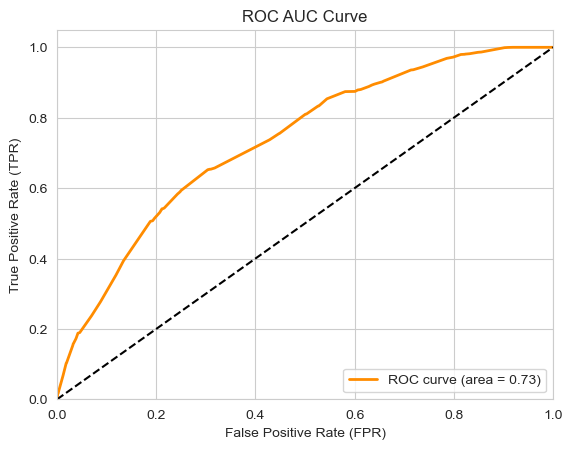

======== Test Set ==========
Confusion Matrix:
[[21652 17307]
 [ 2014  6001]]

Classification Report:
              precision    recall  f1-score   support

           0       0.91      0.56      0.69     38959
           1       0.26      0.75      0.38      8015

    accuracy                           0.59     46974
   macro avg       0.59      0.65      0.54     46974
weighted avg       0.80      0.59      0.64     46974



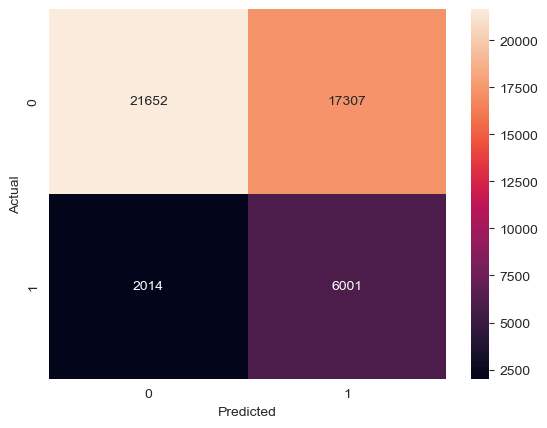

Testing AUC: 0.7298


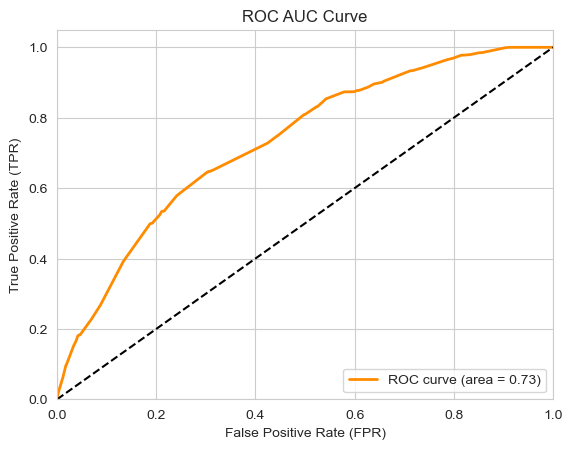

===== combined_isolated_pca_256_RFC =====
Train accuracy score: 0.9999840336358072
Test accuracy score: 0.8303103844680035


======== Training Set ==========
Confusion Matrix:
[[155837      0]
 [     3  32055]]

Classification Report:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00    155837
           1       1.00      1.00      1.00     32058

    accuracy                           1.00    187895
   macro avg       1.00      1.00      1.00    187895
weighted avg       1.00      1.00      1.00    187895



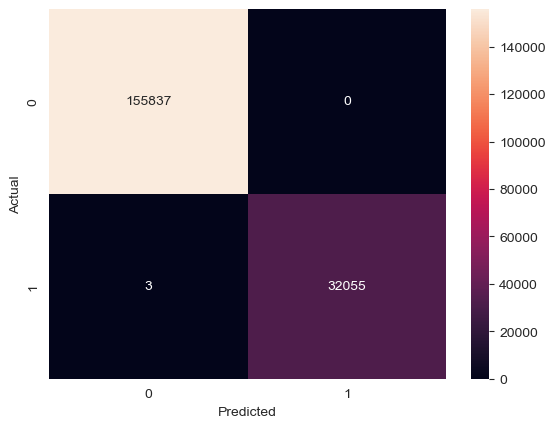

Training AUC: 1.0000


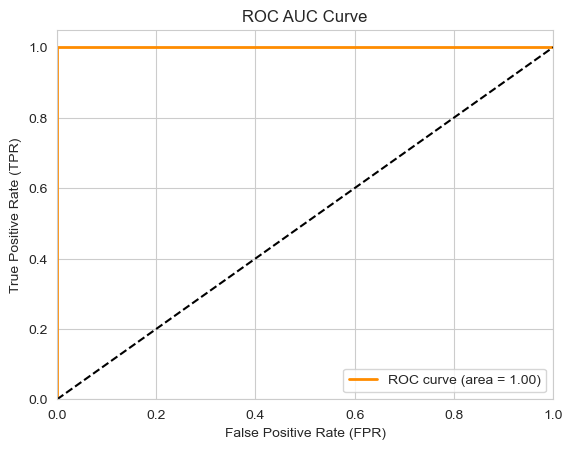

======== Test Set ==========
Confusion Matrix:
[[38875    84]
 [ 7887   128]]

Classification Report:
              precision    recall  f1-score   support

           0       0.83      1.00      0.91     38959
           1       0.60      0.02      0.03      8015

    accuracy                           0.83     46974
   macro avg       0.72      0.51      0.47     46974
weighted avg       0.79      0.83      0.76     46974



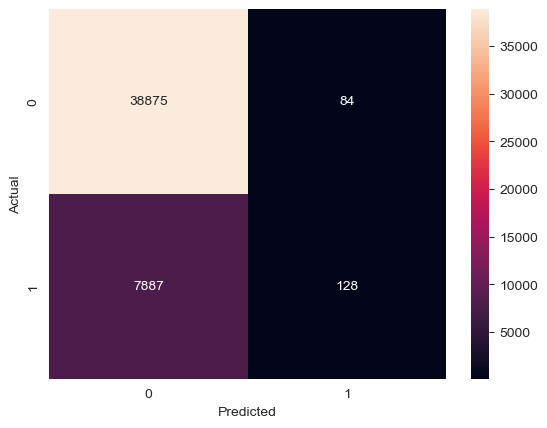

Testing AUC: 0.7830


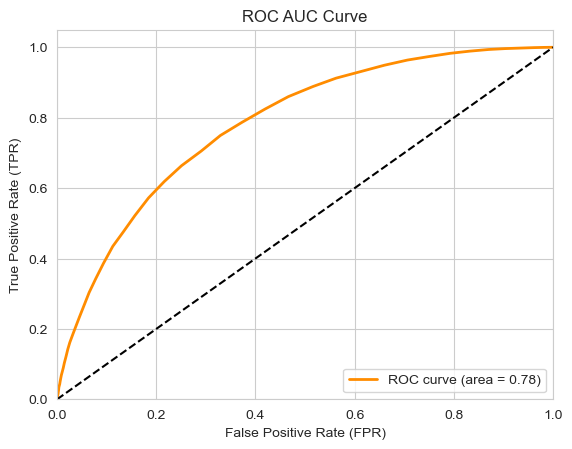

===== combined_isolated_pca_256_XGB =====
Train accuracy score: 0.7272146677665717
Test accuracy score: 0.7254438625622684


======== Training Set ==========
Confusion Matrix:
[[112421  43416]
 [  7839  24219]]

Classification Report:
              precision    recall  f1-score   support

           0       0.93      0.72      0.81    155837
           1       0.36      0.76      0.49     32058

    accuracy                           0.73    187895
   macro avg       0.65      0.74      0.65    187895
weighted avg       0.84      0.73      0.76    187895



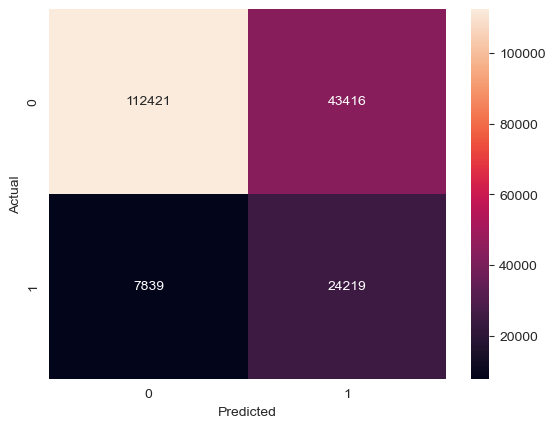

Training AUC: 0.8215


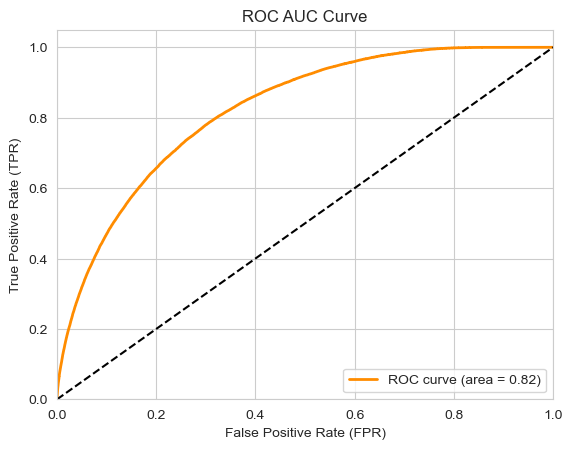

======== Test Set ==========
Confusion Matrix:
[[28102 10857]
 [ 2040  5975]]

Classification Report:
              precision    recall  f1-score   support

           0       0.93      0.72      0.81     38959
           1       0.35      0.75      0.48      8015

    accuracy                           0.73     46974
   macro avg       0.64      0.73      0.65     46974
weighted avg       0.83      0.73      0.76     46974



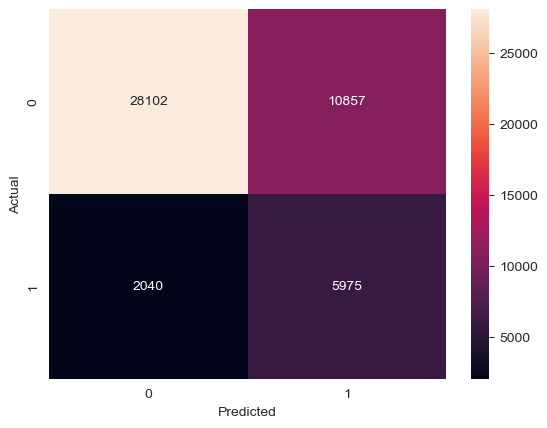

Testing AUC: 0.8156


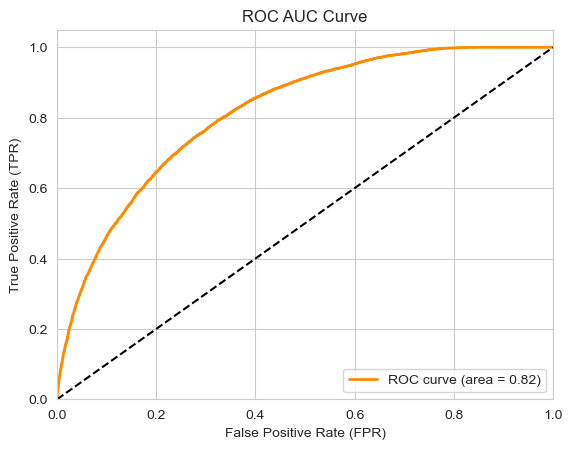

===== combined_isolated_pca_256_ADA =====
Train accuracy score: 0.58715239894622
Test accuracy score: 0.5886873589645336


======== Training Set ==========
Confusion Matrix:
[[86124 69713]
 [ 7859 24199]]

Classification Report:
              precision    recall  f1-score   support

           0       0.92      0.55      0.69    155837
           1       0.26      0.75      0.38     32058

    accuracy                           0.59    187895
   macro avg       0.59      0.65      0.54    187895
weighted avg       0.80      0.59      0.64    187895



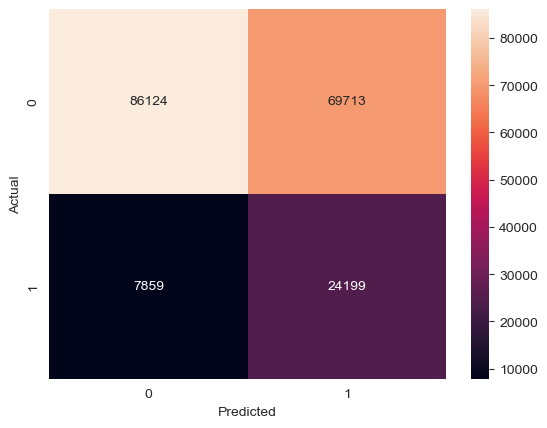

Training AUC: 0.7325


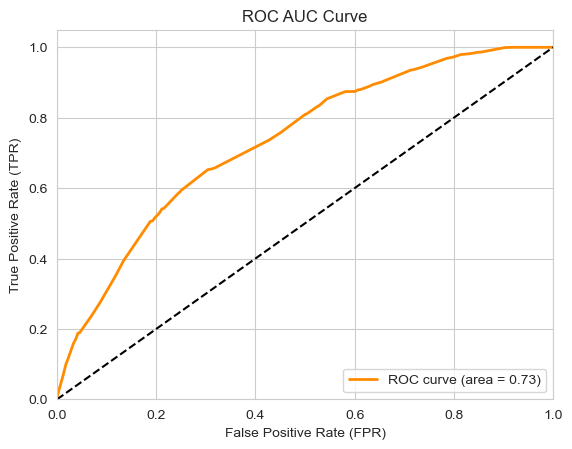

======== Test Set ==========
Confusion Matrix:
[[21652 17307]
 [ 2014  6001]]

Classification Report:
              precision    recall  f1-score   support

           0       0.91      0.56      0.69     38959
           1       0.26      0.75      0.38      8015

    accuracy                           0.59     46974
   macro avg       0.59      0.65      0.54     46974
weighted avg       0.80      0.59      0.64     46974



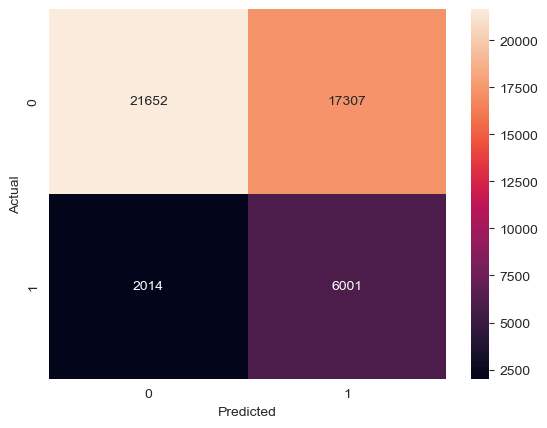

Testing AUC: 0.7298


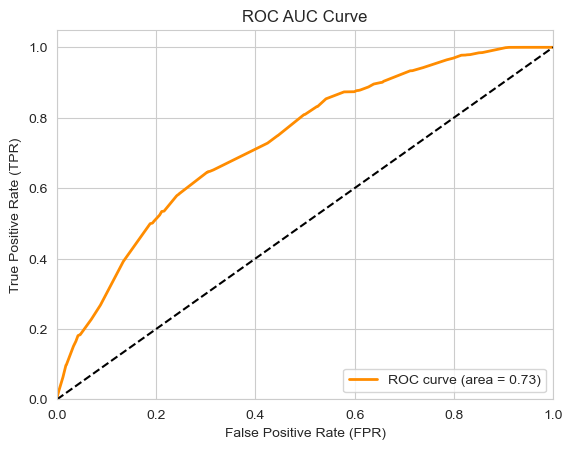

===== combined_isolated_pca_512_RFC =====
Train accuracy score: 0.9999893557572048
Test accuracy score: 0.8302465193511304


======== Training Set ==========
Confusion Matrix:
[[155837      0]
 [     2  32056]]

Classification Report:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00    155837
           1       1.00      1.00      1.00     32058

    accuracy                           1.00    187895
   macro avg       1.00      1.00      1.00    187895
weighted avg       1.00      1.00      1.00    187895



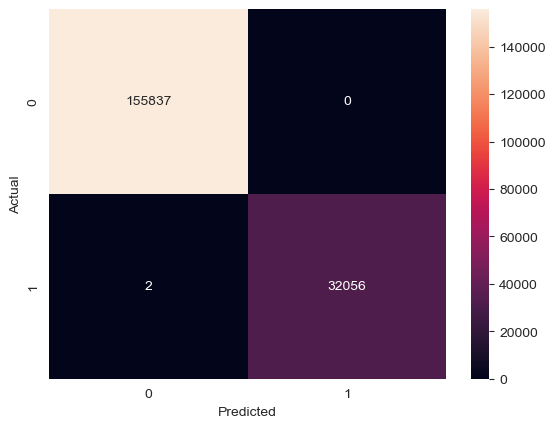

Training AUC: 1.0000


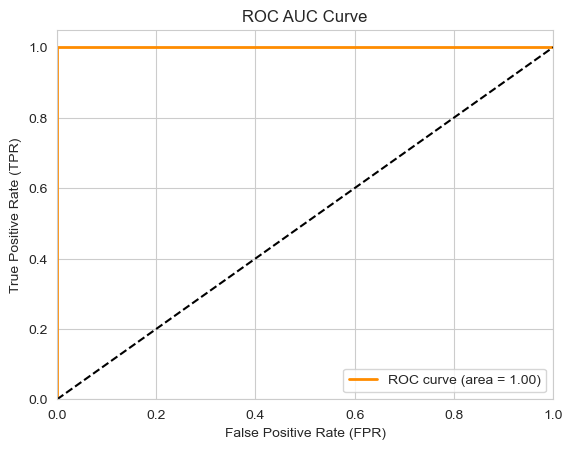

======== Test Set ==========
Confusion Matrix:
[[38874    85]
 [ 7889   126]]

Classification Report:
              precision    recall  f1-score   support

           0       0.83      1.00      0.91     38959
           1       0.60      0.02      0.03      8015

    accuracy                           0.83     46974
   macro avg       0.71      0.51      0.47     46974
weighted avg       0.79      0.83      0.76     46974



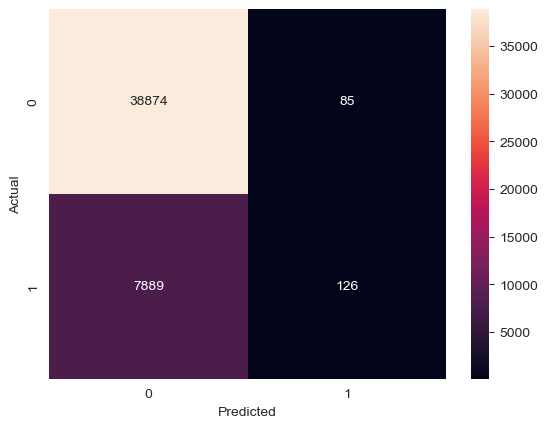

Testing AUC: 0.7560


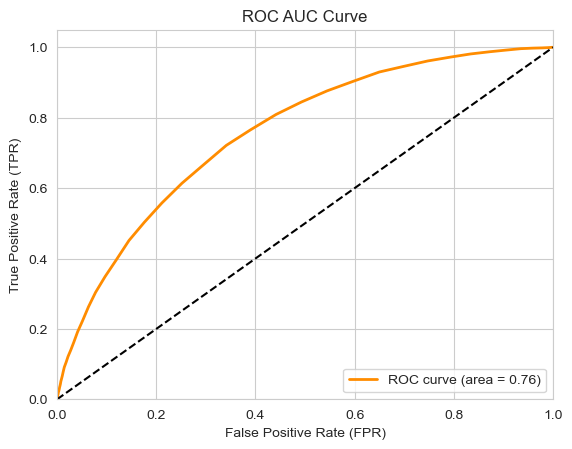

===== combined_isolated_pca_512_XGB =====
Train accuracy score: 0.7275606056574151
Test accuracy score: 0.7257418997743432


======== Training Set ==========
Confusion Matrix:
[[112473  43364]
 [  7826  24232]]

Classification Report:
              precision    recall  f1-score   support

           0       0.93      0.72      0.81    155837
           1       0.36      0.76      0.49     32058

    accuracy                           0.73    187895
   macro avg       0.65      0.74      0.65    187895
weighted avg       0.84      0.73      0.76    187895



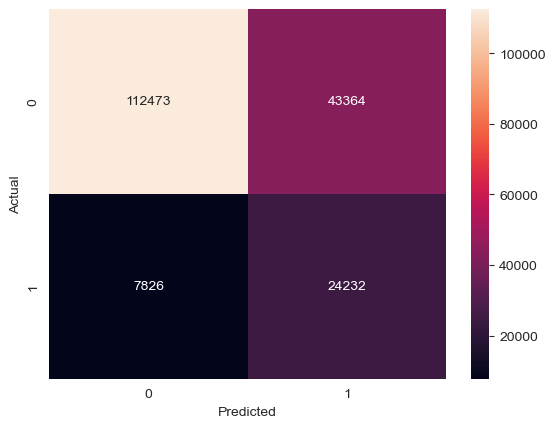

Training AUC: 0.8211


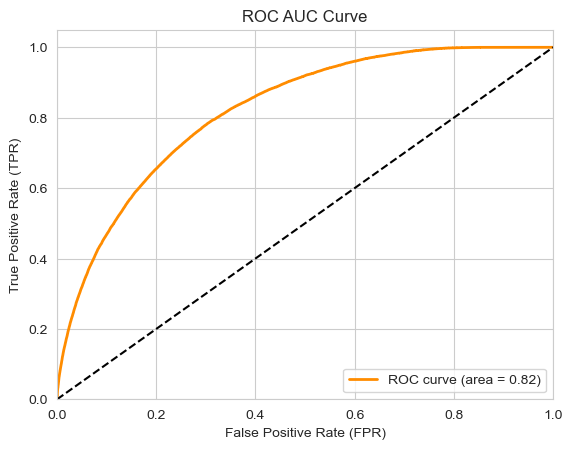

======== Test Set ==========
Confusion Matrix:
[[28118 10841]
 [ 2042  5973]]

Classification Report:
              precision    recall  f1-score   support

           0       0.93      0.72      0.81     38959
           1       0.36      0.75      0.48      8015

    accuracy                           0.73     46974
   macro avg       0.64      0.73      0.65     46974
weighted avg       0.83      0.73      0.76     46974



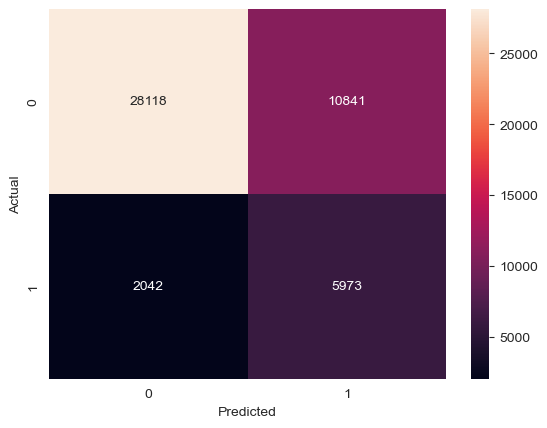

Testing AUC: 0.8153


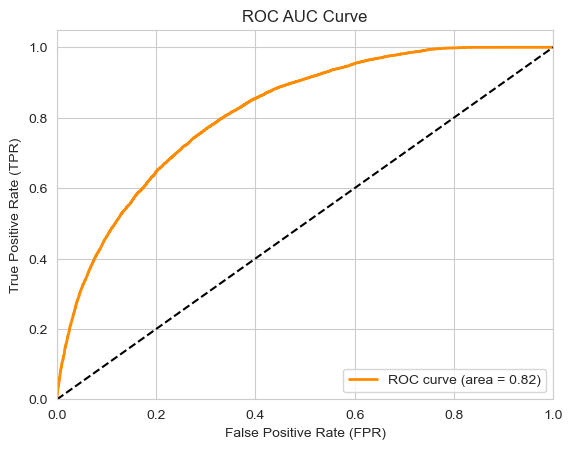

===== combined_isolated_pca_512_ADA =====
Train accuracy score: 0.5871470768248224
Test accuracy score: 0.5886873589645336


======== Training Set ==========
Confusion Matrix:
[[86123 69714]
 [ 7859 24199]]

Classification Report:
              precision    recall  f1-score   support

           0       0.92      0.55      0.69    155837
           1       0.26      0.75      0.38     32058

    accuracy                           0.59    187895
   macro avg       0.59      0.65      0.54    187895
weighted avg       0.80      0.59      0.64    187895



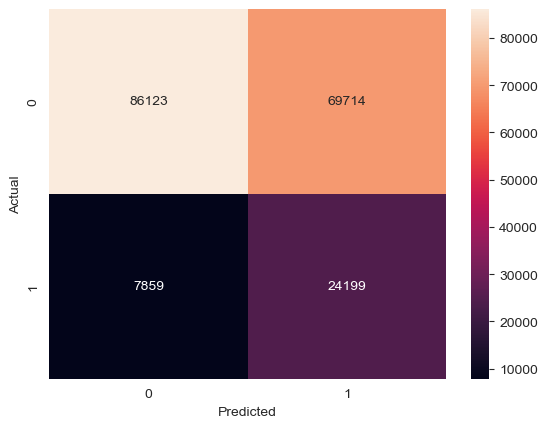

Training AUC: 0.7325


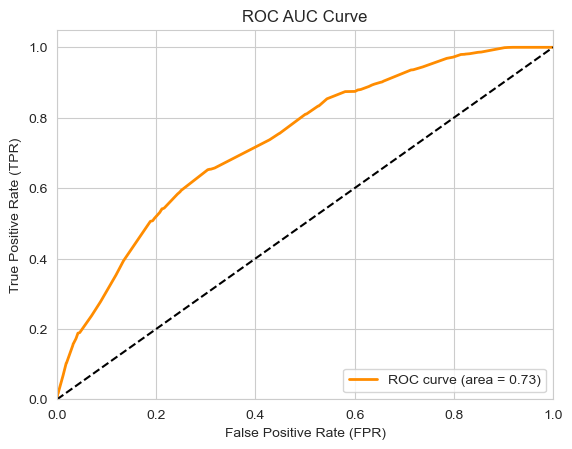

======== Test Set ==========
Confusion Matrix:
[[21652 17307]
 [ 2014  6001]]

Classification Report:
              precision    recall  f1-score   support

           0       0.91      0.56      0.69     38959
           1       0.26      0.75      0.38      8015

    accuracy                           0.59     46974
   macro avg       0.59      0.65      0.54     46974
weighted avg       0.80      0.59      0.64     46974



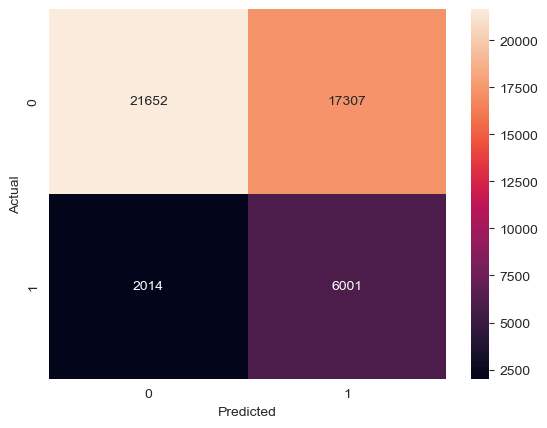

Testing AUC: 0.7298


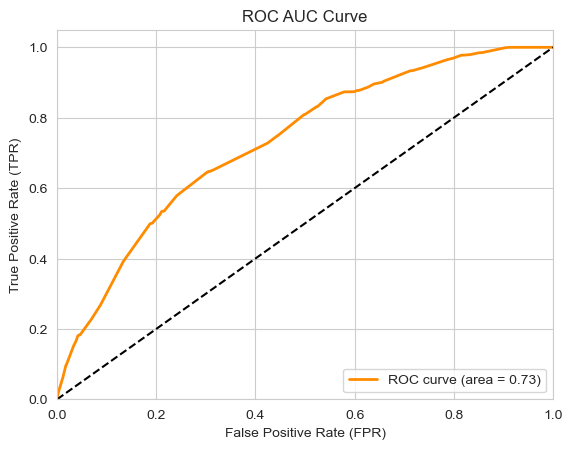

===== combined_combined_pca_128_RFC =====
Train accuracy score: 0.9999893557572048
Test accuracy score: 0.8301187891173841


======== Training Set ==========
Confusion Matrix:
[[155837      0]
 [     2  32056]]

Classification Report:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00    155837
           1       1.00      1.00      1.00     32058

    accuracy                           1.00    187895
   macro avg       1.00      1.00      1.00    187895
weighted avg       1.00      1.00      1.00    187895



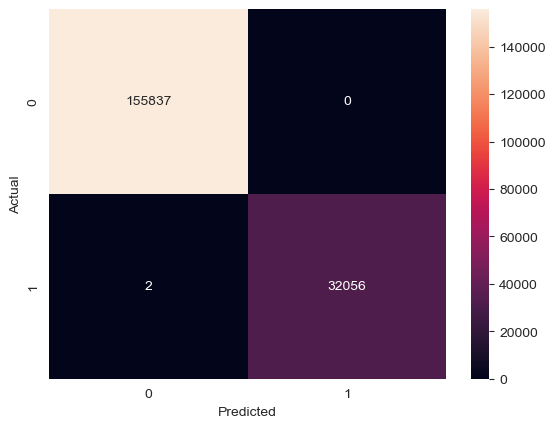

Training AUC: 1.0000


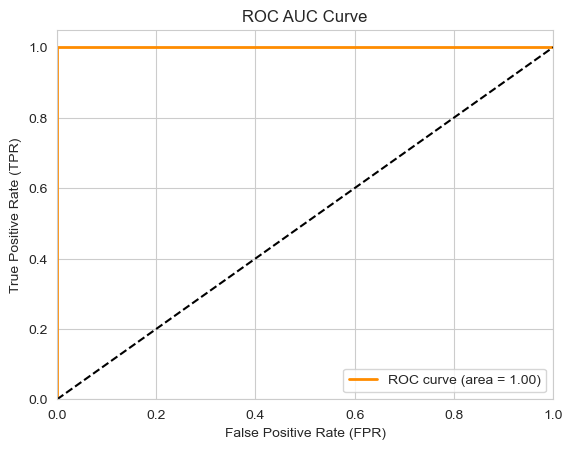

======== Test Set ==========
Confusion Matrix:
[[38876    83]
 [ 7897   118]]

Classification Report:
              precision    recall  f1-score   support

           0       0.83      1.00      0.91     38959
           1       0.59      0.01      0.03      8015

    accuracy                           0.83     46974
   macro avg       0.71      0.51      0.47     46974
weighted avg       0.79      0.83      0.76     46974



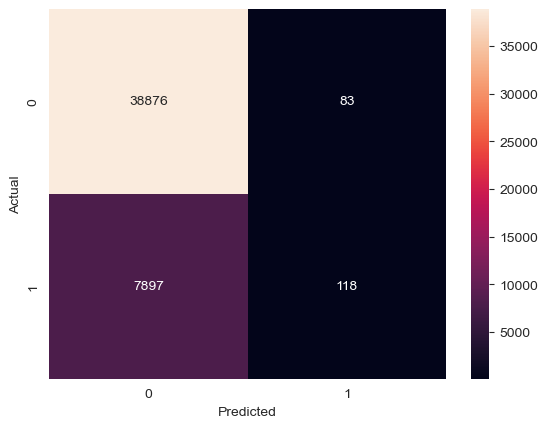

Testing AUC: 0.7798


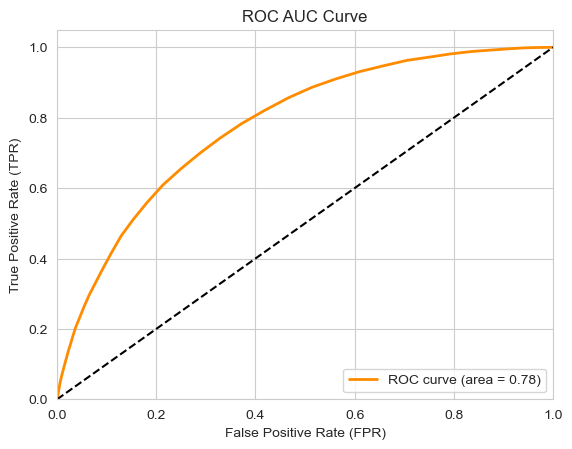

===== combined_combined_pca_128_XGB =====
Train accuracy score: 0.7272146677665717
Test accuracy score: 0.7254438625622684


======== Training Set ==========
Confusion Matrix:
[[112421  43416]
 [  7839  24219]]

Classification Report:
              precision    recall  f1-score   support

           0       0.93      0.72      0.81    155837
           1       0.36      0.76      0.49     32058

    accuracy                           0.73    187895
   macro avg       0.65      0.74      0.65    187895
weighted avg       0.84      0.73      0.76    187895



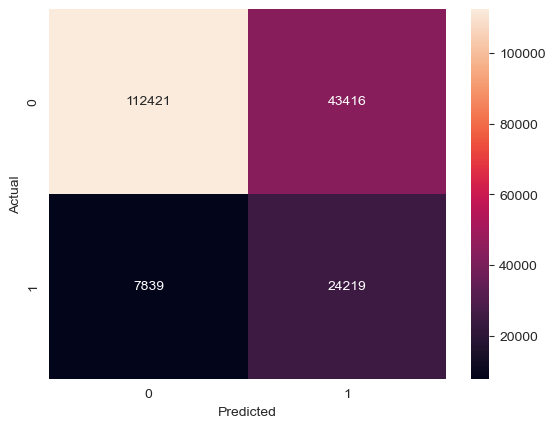

Training AUC: 0.8215


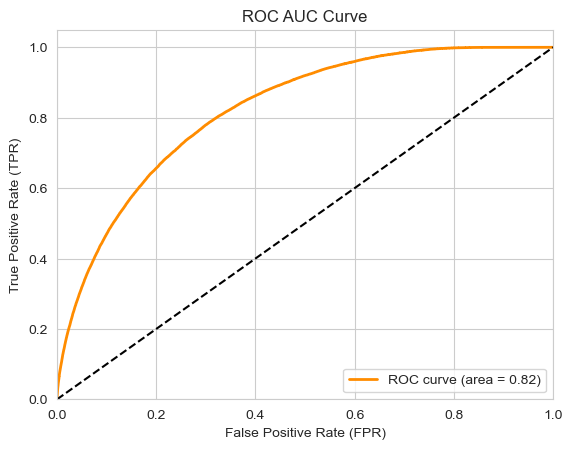

======== Test Set ==========
Confusion Matrix:
[[28102 10857]
 [ 2040  5975]]

Classification Report:
              precision    recall  f1-score   support

           0       0.93      0.72      0.81     38959
           1       0.35      0.75      0.48      8015

    accuracy                           0.73     46974
   macro avg       0.64      0.73      0.65     46974
weighted avg       0.83      0.73      0.76     46974



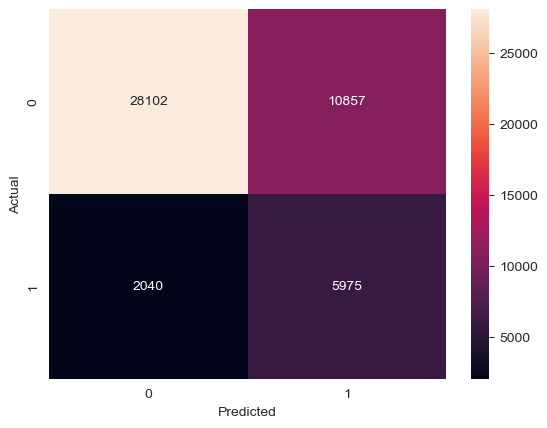

Testing AUC: 0.8156


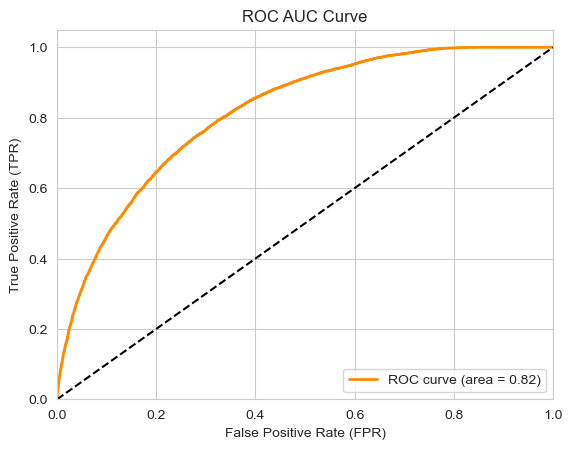

===== combined_combined_pca_128_ADA =====
Train accuracy score: 0.58715239894622
Test accuracy score: 0.5886873589645336


======== Training Set ==========
Confusion Matrix:
[[86124 69713]
 [ 7859 24199]]

Classification Report:
              precision    recall  f1-score   support

           0       0.92      0.55      0.69    155837
           1       0.26      0.75      0.38     32058

    accuracy                           0.59    187895
   macro avg       0.59      0.65      0.54    187895
weighted avg       0.80      0.59      0.64    187895



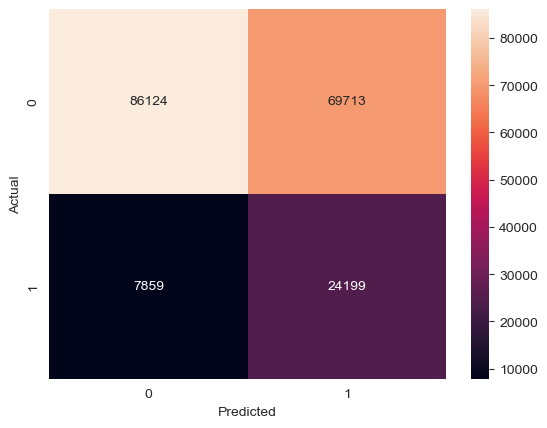

Training AUC: 0.7325


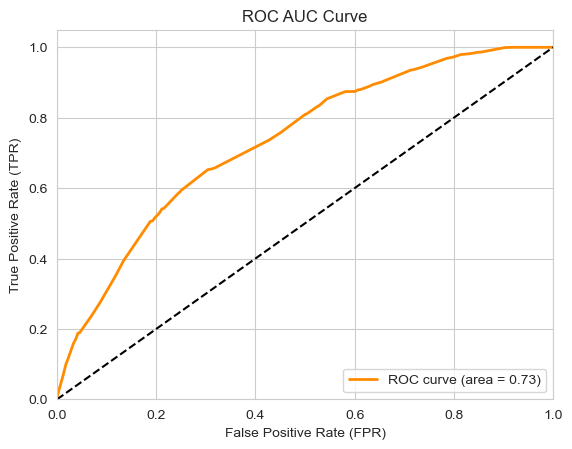

======== Test Set ==========
Confusion Matrix:
[[21652 17307]
 [ 2014  6001]]

Classification Report:
              precision    recall  f1-score   support

           0       0.91      0.56      0.69     38959
           1       0.26      0.75      0.38      8015

    accuracy                           0.59     46974
   macro avg       0.59      0.65      0.54     46974
weighted avg       0.80      0.59      0.64     46974



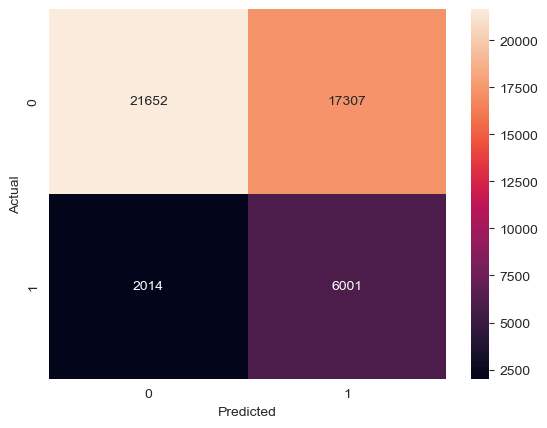

Testing AUC: 0.7298


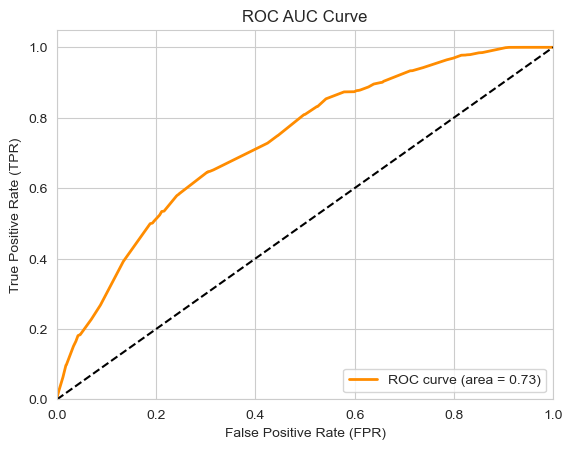

In [50]:
results_RFC = {}
results_XGB = {}
results_ADA = {}

trees = {
    'RFC': RandomForestClassifier(),
    'XGB': GradientBoostingClassifier(),
    'ADA': AdaBoostClassifier()
    }

for dataset_name, dataset_dict in training_Xy.items():
    X_train_scaled = dataset_dict['X_train_scaled']
    X_test_scaled = dataset_dict['X_test_scaled']
    y_train = dataset_dict['y_train']
    y_test = dataset_dict['y_test']

    for tree_name, tree in trees.items():
        name = f'{dataset_name}_{tree_name}'
        
        sample_weight = compute_sample_weight(class_weight='balanced', y=y_train)
        trained = tree.fit(X_train_scaled, y_train, sample_weight = sample_weight)
        print(f'===== {name} =====')

        y_pred_train, y_pred_test, y_prob_train, y_prob_test = evaluate_model(
            trained, X_train_scaled, y_train, X_test_scaled, y_test
        )

        result_entry = {
            'trained': trained,
            'y_pred_train': y_pred_train,
            'y_pred_test': y_pred_test,
            'y_prob_train': y_prob_train,
            'y_prob_test': y_prob_test
        }

        if tree_name == 'RFC':
            results_RFC[name] = result_entry
        elif tree_name == 'XGB':
            results_XGB[name] = result_entry
        elif tree_name == 'ADA':
            results_ADA[name] = result_entry

[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 32058, number of negative: 155837
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.052298 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 34286
[LightGBM] [Info] Number of data points in the train set: 187895, number of used features: 156
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.170617 -> initscore=-1.581264
[LightGBM] [Info] Start training from score -1.581264
Train accuracy score: 0.7617126586657441
Test accuracy score: 0.7511602162898625


======== Training Set ==========
Confusion Matrix:
[[116889  38948]
 [  5825  26233]]

Classification Report:
              precision    recall  f1-score   support

           0       0.95      0.75      0.84    155837
           1       0.40      0.82      0.54     32058

    accuracy                           0.76    187895
   macro av

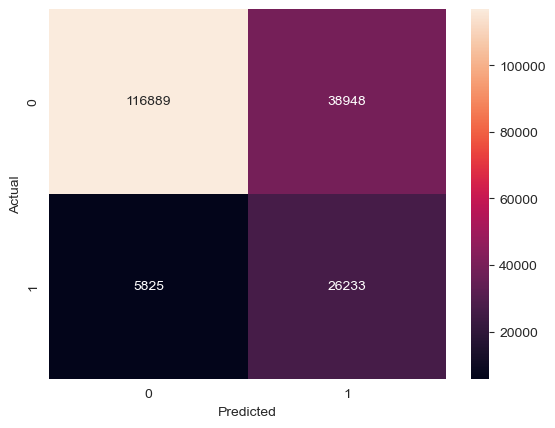

Training AUC: 0.8671


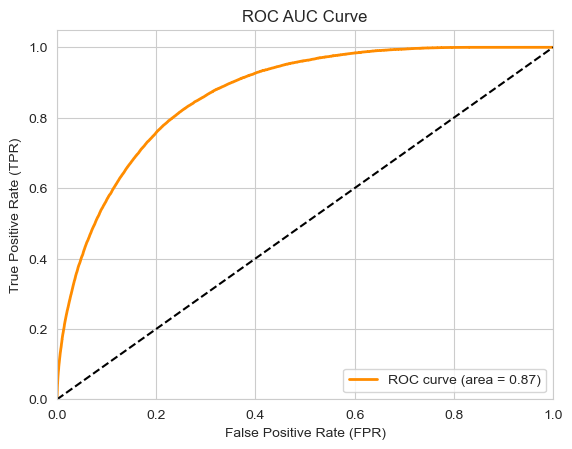

======== Test Set ==========
Confusion Matrix:
[[29034  9925]
 [ 1764  6251]]

Classification Report:
              precision    recall  f1-score   support

           0       0.94      0.75      0.83     38959
           1       0.39      0.78      0.52      8015

    accuracy                           0.75     46974
   macro avg       0.66      0.76      0.67     46974
weighted avg       0.85      0.75      0.78     46974



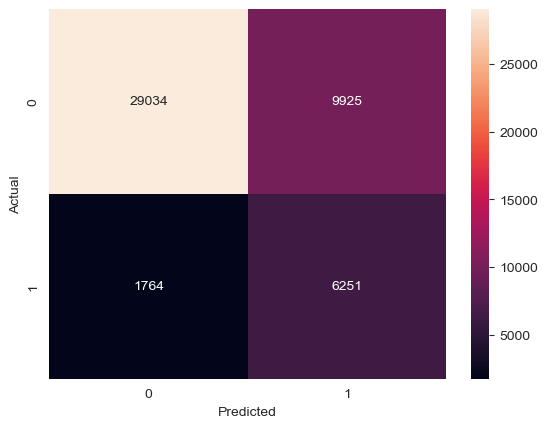

Testing AUC: 0.8455


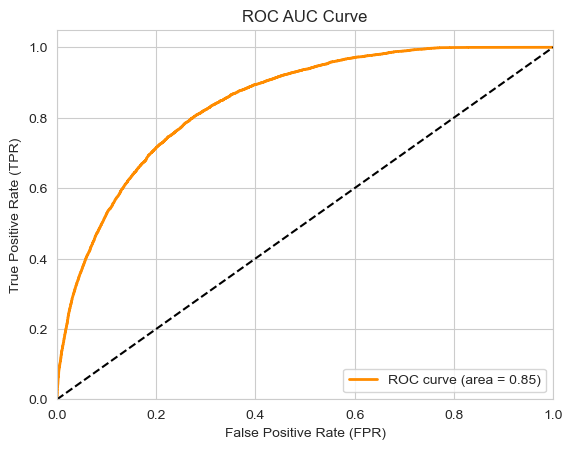

[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 32058, number of negative: 155837
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.095184 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 66929
[LightGBM] [Info] Number of data points in the train set: 187895, number of used features: 284
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.170617 -> initscore=-1.581264
[LightGBM] [Info] Start training from score -1.581264
Train accuracy score: 0.7623938902046355
Test accuracy score: 0.7513092348958998


======== Training Set ==========
Confusion Matrix:
[[116981  38856]
 [  5789  26269]]

Classification Report:
              precision    recall  f1-score   support

           0       0.95      0.75      0.84    155837
           1       0.40      0.82      0.54     32058

    accuracy                           0.76    187895
   macro av

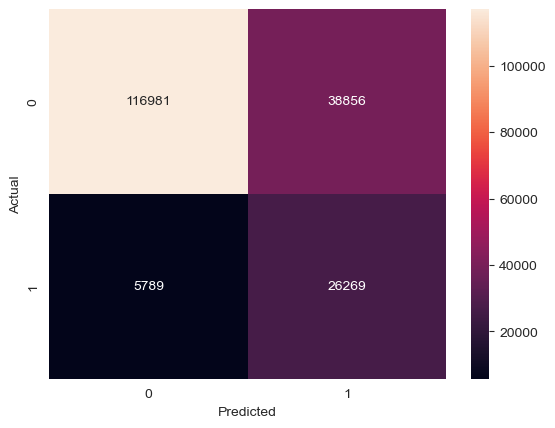

Training AUC: 0.8684


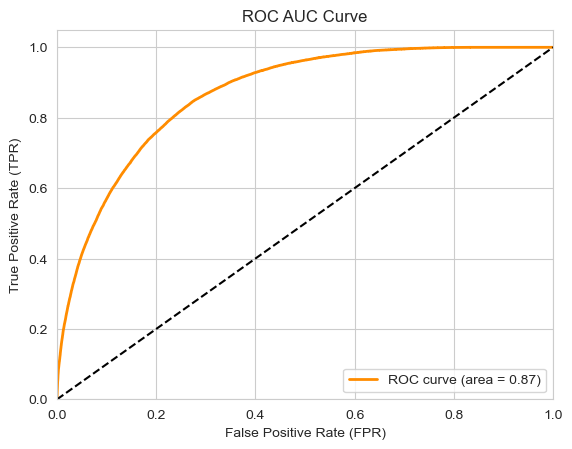

======== Test Set ==========
Confusion Matrix:
[[29049  9910]
 [ 1772  6243]]

Classification Report:
              precision    recall  f1-score   support

           0       0.94      0.75      0.83     38959
           1       0.39      0.78      0.52      8015

    accuracy                           0.75     46974
   macro avg       0.66      0.76      0.67     46974
weighted avg       0.85      0.75      0.78     46974



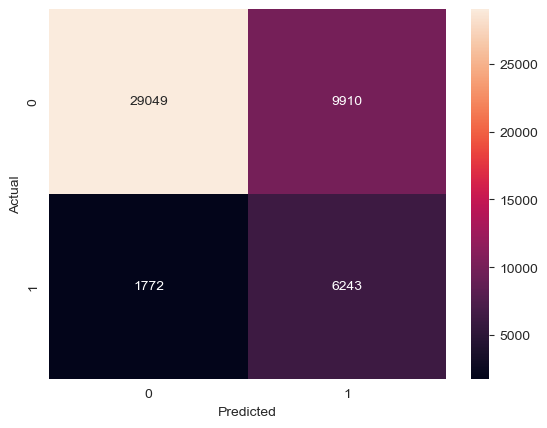

Testing AUC: 0.8452


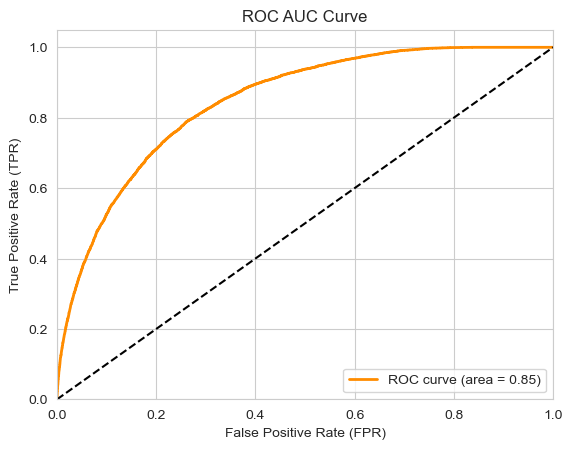

[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 32058, number of negative: 155837
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.228170 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 132206
[LightGBM] [Info] Number of data points in the train set: 187895, number of used features: 540
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.170617 -> initscore=-1.581264
[LightGBM] [Info] Start training from score -1.581264
Train accuracy score: 0.7643151760291652
Test accuracy score: 0.7520330395537957


======== Training Set ==========
Confusion Matrix:
[[117275  38562]
 [  5722  26336]]

Classification Report:
              precision    recall  f1-score   support

           0       0.95      0.75      0.84    155837
           1       0.41      0.82      0.54     32058

    accuracy                           0.76    187895
   macro a

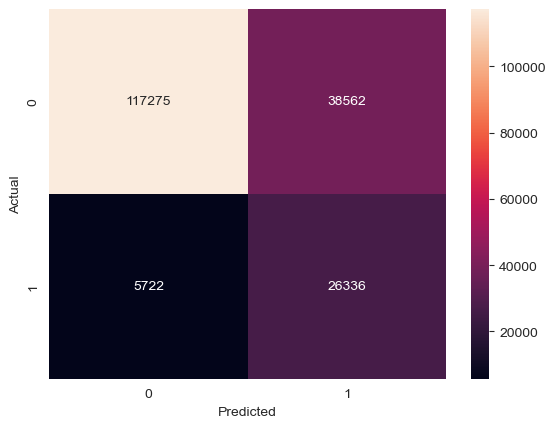

Training AUC: 0.8698


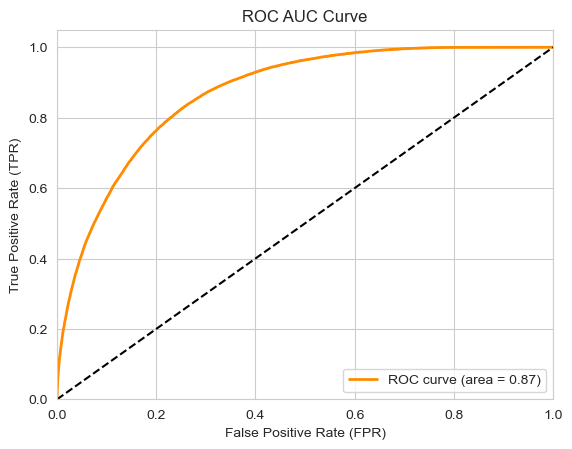

======== Test Set ==========
Confusion Matrix:
[[29100  9859]
 [ 1789  6226]]

Classification Report:
              precision    recall  f1-score   support

           0       0.94      0.75      0.83     38959
           1       0.39      0.78      0.52      8015

    accuracy                           0.75     46974
   macro avg       0.66      0.76      0.67     46974
weighted avg       0.85      0.75      0.78     46974



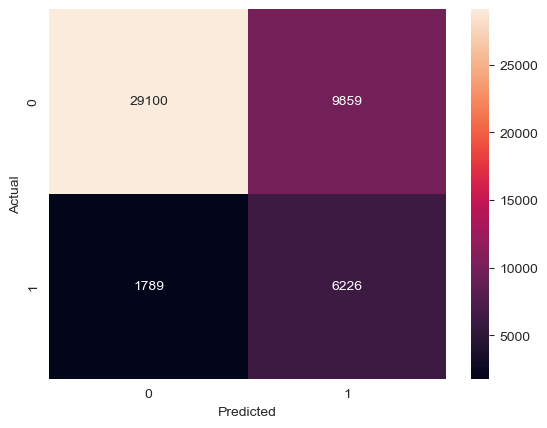

Testing AUC: 0.8450


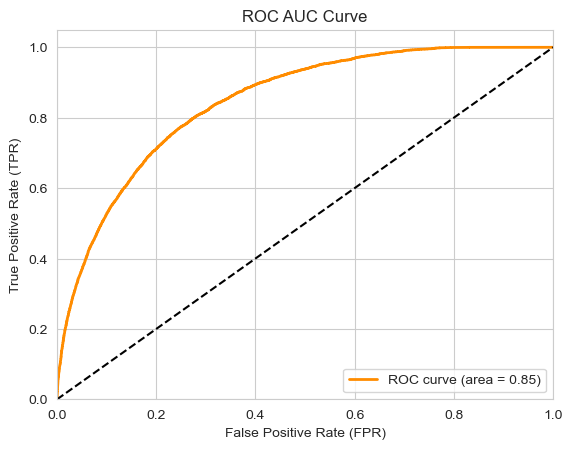

[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 32058, number of negative: 155837
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.094560 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 66929
[LightGBM] [Info] Number of data points in the train set: 187895, number of used features: 284
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.170617 -> initscore=-1.581264
[LightGBM] [Info] Start training from score -1.581264
Train accuracy score: 0.7623938902046355
Test accuracy score: 0.7513092348958998


======== Training Set ==========
Confusion Matrix:
[[116981  38856]
 [  5789  26269]]

Classification Report:
              precision    recall  f1-score   support

           0       0.95      0.75      0.84    155837
           1       0.40      0.82      0.54     32058

    accuracy                           0.76    187895
   macro av

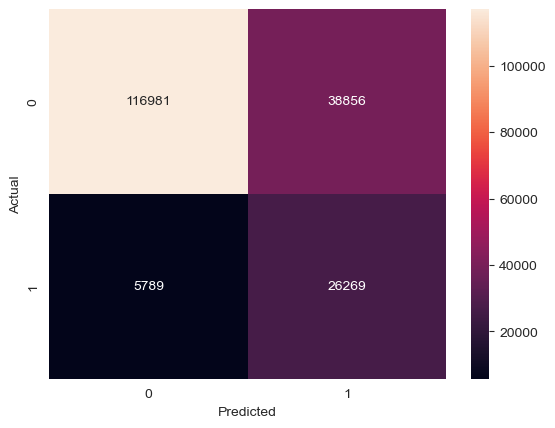

Training AUC: 0.8684


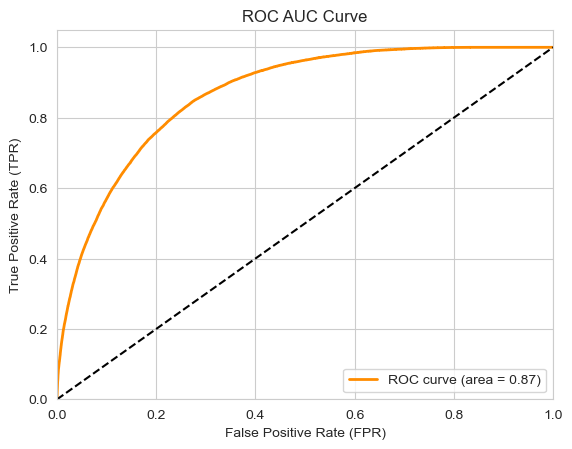

======== Test Set ==========
Confusion Matrix:
[[29049  9910]
 [ 1772  6243]]

Classification Report:
              precision    recall  f1-score   support

           0       0.94      0.75      0.83     38959
           1       0.39      0.78      0.52      8015

    accuracy                           0.75     46974
   macro avg       0.66      0.76      0.67     46974
weighted avg       0.85      0.75      0.78     46974



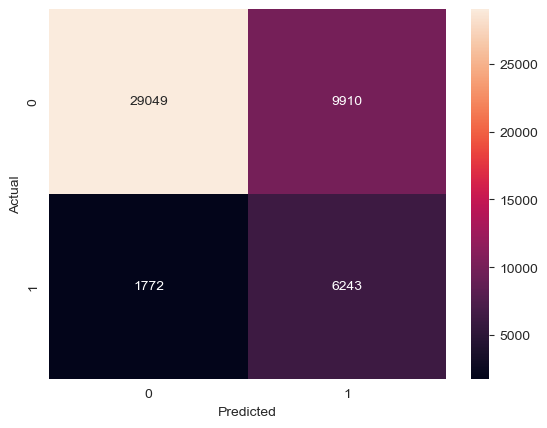

Testing AUC: 0.8452


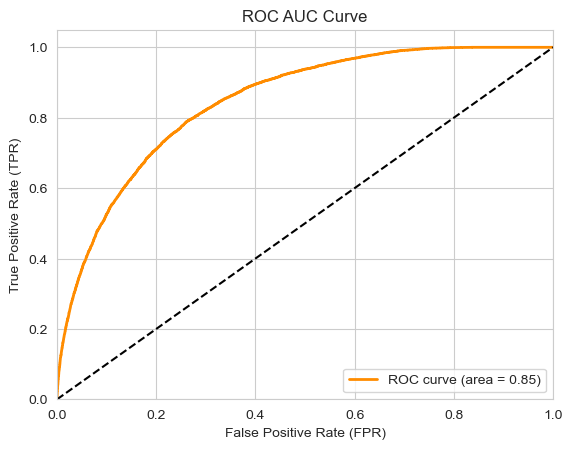

In [51]:
results_LGC = {}

for dataset_name, dataset_dict in training_Xy.items():
    X_train_scaled = dataset_dict['X_train_scaled']
    X_test_scaled = dataset_dict['X_test_scaled']
    y_train = dataset_dict['y_train']
    y_test = dataset_dict['y_test']

    counter = Counter(y_train)
    scale_pos_weight = counter[0] / counter[1]
    
    lgc = LGBMClassifier(scale_pos_weight=scale_pos_weight)
    lgc = lgc.fit(X_train_scaled, y_train)

    y_pred_train, y_pred_test, y_prob_train, y_prob_test = evaluate_model(
        lgc, X_train_scaled, y_train, X_test_scaled, y_test
    )

    results_LGC[f'{dataset_name}_LGC'] = {
        'model': lgc,
        'y_pred_train': y_pred_train,
        'y_pred_test': y_pred_test,
        'y_prob_train': y_prob_train,
        'y_prob_test': y_prob_test
    }

In [ ]:
svc = SVC(probability = True, class_weight='balanced')
svc.fit(X_train_scaled, y_train)

y_pred_train, y_pred_test, y_prob_train, y_prob_test = evaluate_model(svc, X_train_scaled, y_train, X_test_scaled, y_test)

results['SVC'] = {
    'model': 'SVC',
    'y_pred_test': y_pred_test,
    'y_prob_test': y_prob_test
}

## With hyperparameter tuning

In [ ]:
KNN_grid = {
    'n_neighbors': [3, 5, 7, 11, 15, 21, 31, 51, 71],
    'metric': ['minkowski', 'euclidean', 'manhattan']
}

LR_grid = {
    'C': [0.001, 0.01, 0.1, 1, 10, 100],
    'solver': ['lbfgs', 'newton-cholesky']
}


RFC_grid = {
    'n_estimators': [100, 300],
    'max_depth': [5, 7],
    'min_samples_split': [2, 10],
    'max_features': ['sqrt', 1.0]
    }

XGB_grid = {
    'max_depth': [3, 5],
    'min_samples_split': [2, 10],
    'learning_rate': [0.05, 0.1]
}

ADA_grid = {
    'learning_rate': [0.05, 0.1],
    'n_estimators': [100, 300]
}

LGC_grid = {
    'n_estimators': [100, 200, 300],
    'learning_rate': [0.01, 0.05, 0.1],
    'max_depth': [3, 5, 7],
    'num_leaves': [15, 31, 63],
    'min_child_samples': [10, 20, 40],
    'reg_lambda': [0, 1, 5],
}

RCV_grids = {
    'KNN_grid': KNN_grid,
    'LR_grid': LR_grid,
    'RFC_grid': RFC_grid,
    'XGB_grid': XGB_grid,
    'ADA_grid': ADA_grid,
    'LGC_grid': LGC_grid
}

In [ ]:
results = {}

models = {
    'KNN': KNeighborsClassifier(weights='distance'),
    'LR': LogisticRegression(class_weight='balanced')
         }

for model_name, model in models.items():

    for dataset_name, dataset in training_Xy.items():

        grid_name = f'{model_name}_grid'
        grid = RCV_grids[grid_name]

        search = RandomizedSearchCV(model, param_distributions = grid, n_iter = 6, 
                                    scoring = 'recall', cv = 5, random_state = 42)
    
        search.fit(dataset['X_train_scaled'], dataset['y_train'])

        print(f'===== Model: {model_name}, {dataset_name} =====')
        best_params = search.best_params_
        print(best_params)
        print('=====')

KeyboardInterrupt: 

In [17]:
trees = {'XGB': GradientBoostingClassifier(),
         'ADA': AdaBoostClassifier()
        }

dataset_name = 'combined_combined_pca_128'

for tree_name, tree in trees.items():

    grid_name = f'{tree_name}_grid'
    grid = RCV_grids[grid_name]

    search = RandomizedSearchCV(tree, param_distributions = grid, n_iter = 6, 
                                    scoring = 'recall', cv = 5, random_state = 42)
    
    search.fit(training_Xy[dataset_name]['X_train_scaled'], training_Xy[dataset_name]['y_train'])

    print(f'===== Model: {tree_name}, {dataset_name} =====')
    best_params = search.best_params_
    print(best_params)
    print('=====')

===== Model: XGB, combined_combined_pca_128 =====
{'min_samples_split': 10, 'max_depth': 5, 'learning_rate': 0.1}
=====


/Users/daisyliu/anaconda3/envs/had7001/lib/python3.13/site-packages/sklearn/model_selection/_search.py:317: UserWarning: The total space of parameters 4 is smaller than n_iter=6. Running 4 iterations. For exhaustive searches, use GridSearchCV.
  warnings.warn(


===== Model: ADA, combined_combined_pca_128 =====
{'n_estimators': 100, 'learning_rate': 0.05}
=====


===== combined_isolated_pca_128_KNN =====
Train accuracy score: 1.0
Test accuracy score: 0.8159407331715417


======== Training Set ==========
Confusion Matrix:
[[155837      0]
 [     0  32058]]

Classification Report:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00    155837
           1       1.00      1.00      1.00     32058

    accuracy                           1.00    187895
   macro avg       1.00      1.00      1.00    187895
weighted avg       1.00      1.00      1.00    187895



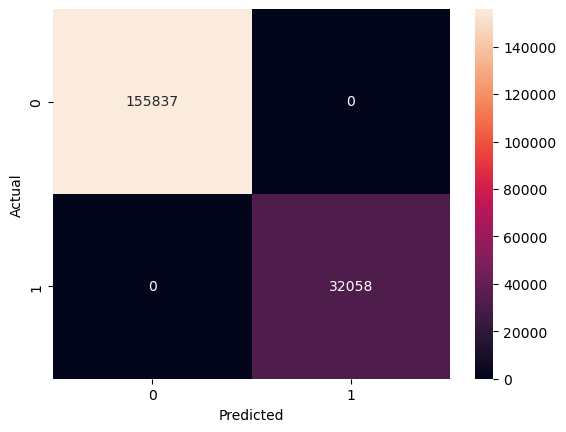

Training AUC: 1.0000


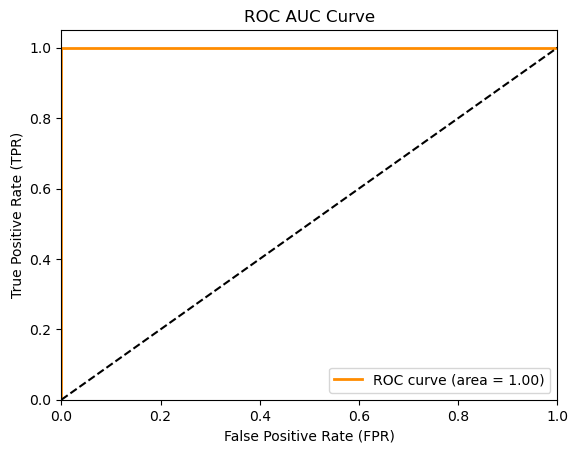

======== Test Set ==========
Confusion Matrix:
[[37438  1521]
 [ 7125   890]]

Classification Report:
              precision    recall  f1-score   support

           0       0.84      0.96      0.90     38959
           1       0.37      0.11      0.17      8015

    accuracy                           0.82     46974
   macro avg       0.60      0.54      0.53     46974
weighted avg       0.76      0.82      0.77     46974



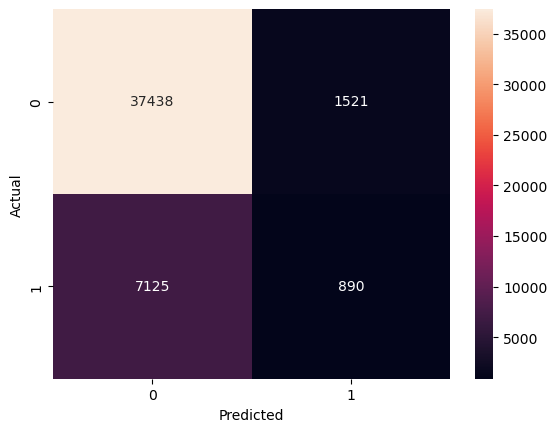

Testing AUC: 0.5938


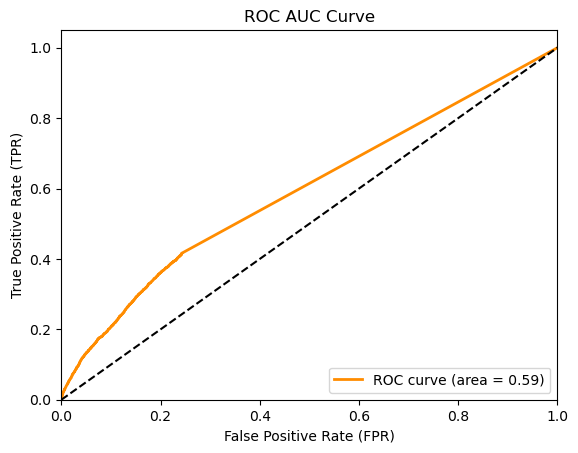

/Users/daisyliu/anaconda3/envs/had7001/lib/python3.13/site-packages/sklearn/linear_model/_logistic.py:465: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. OF ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


===== combined_isolated_pca_128_LR =====
Train accuracy score: 0.6847015620426302
Test accuracy score: 0.6819091412270618


======== Training Set ==========
Confusion Matrix:
[[109761  46076]
 [ 13167  18891]]

Classification Report:
              precision    recall  f1-score   support

           0       0.89      0.70      0.79    155837
           1       0.29      0.59      0.39     32058

    accuracy                           0.68    187895
   macro avg       0.59      0.65      0.59    187895
weighted avg       0.79      0.68      0.72    187895



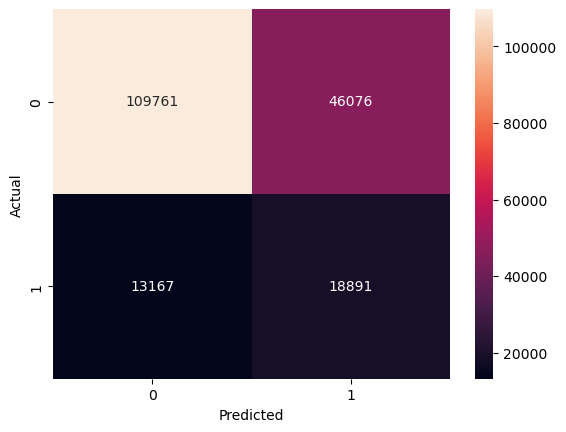

Training AUC: 0.7023


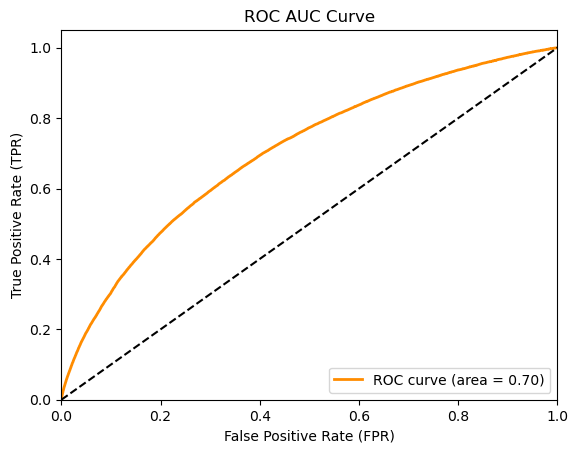

======== Test Set ==========
Confusion Matrix:
[[27364 11595]
 [ 3347  4668]]

Classification Report:
              precision    recall  f1-score   support

           0       0.89      0.70      0.79     38959
           1       0.29      0.58      0.38      8015

    accuracy                           0.68     46974
   macro avg       0.59      0.64      0.59     46974
weighted avg       0.79      0.68      0.72     46974



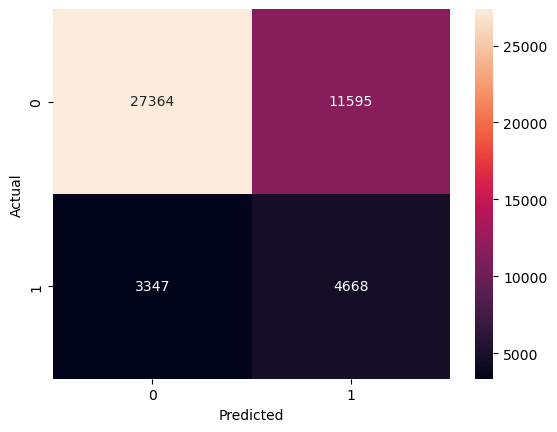

Testing AUC: 0.6947


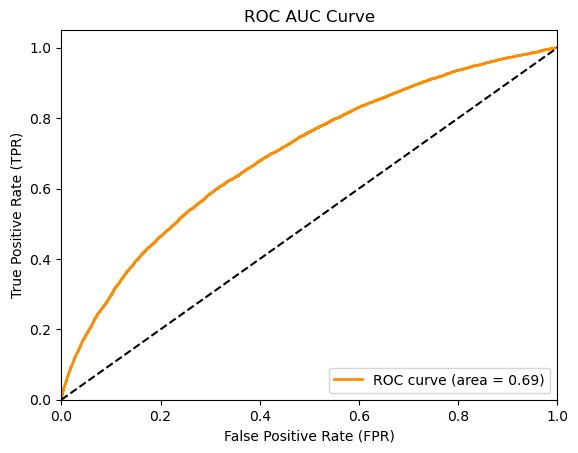

===== combined_combined_pca_128_KNN =====
Train accuracy score: 1.0
Test accuracy score: 0.8168774215523481


======== Training Set ==========
Confusion Matrix:
[[155837      0]
 [     0  32058]]

Classification Report:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00    155837
           1       1.00      1.00      1.00     32058

    accuracy                           1.00    187895
   macro avg       1.00      1.00      1.00    187895
weighted avg       1.00      1.00      1.00    187895



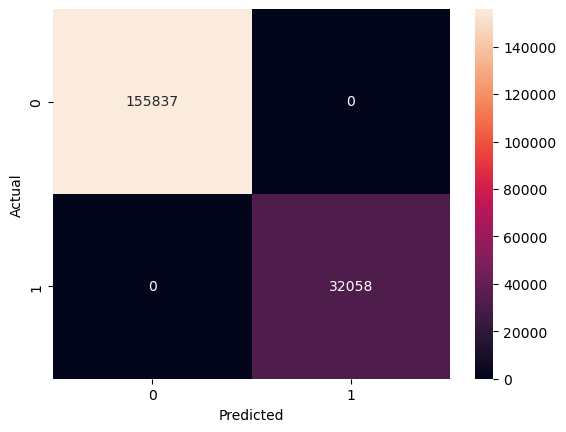

Training AUC: 1.0000


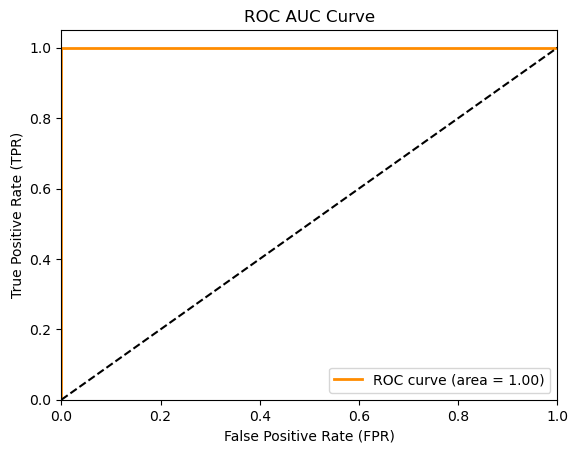

======== Test Set ==========
Confusion Matrix:
[[37485  1474]
 [ 7128   887]]

Classification Report:
              precision    recall  f1-score   support

           0       0.84      0.96      0.90     38959
           1       0.38      0.11      0.17      8015

    accuracy                           0.82     46974
   macro avg       0.61      0.54      0.53     46974
weighted avg       0.76      0.82      0.77     46974



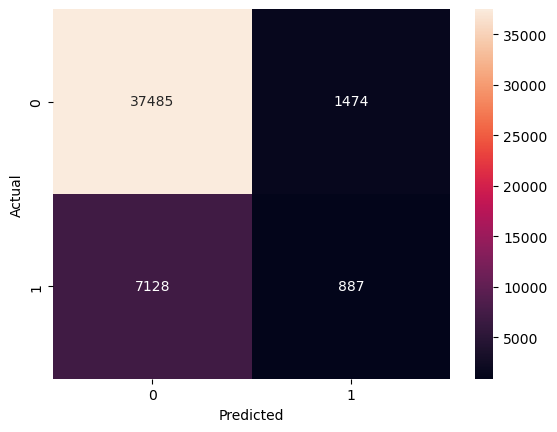

Testing AUC: 0.5904


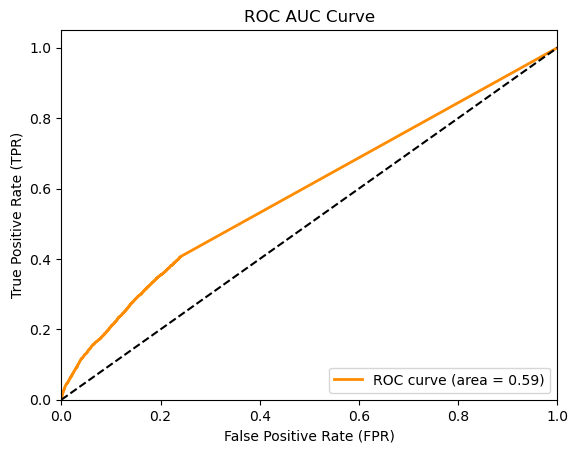

/Users/daisyliu/anaconda3/envs/had7001/lib/python3.13/site-packages/sklearn/linear_model/_logistic.py:465: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. OF ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


===== combined_combined_pca_128_LR =====
Train accuracy score: 0.6813166928337635
Test accuracy score: 0.6787797505002767


======== Training Set ==========
Confusion Matrix:
[[108829  47008]
 [ 12871  19187]]

Classification Report:
              precision    recall  f1-score   support

           0       0.89      0.70      0.78    155837
           1       0.29      0.60      0.39     32058

    accuracy                           0.68    187895
   macro avg       0.59      0.65      0.59    187895
weighted avg       0.79      0.68      0.72    187895



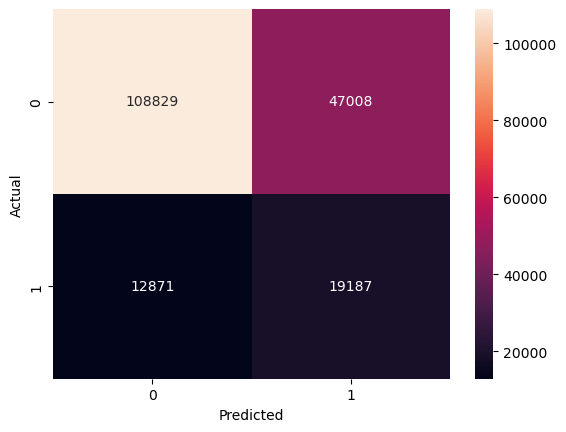

Training AUC: 0.7033


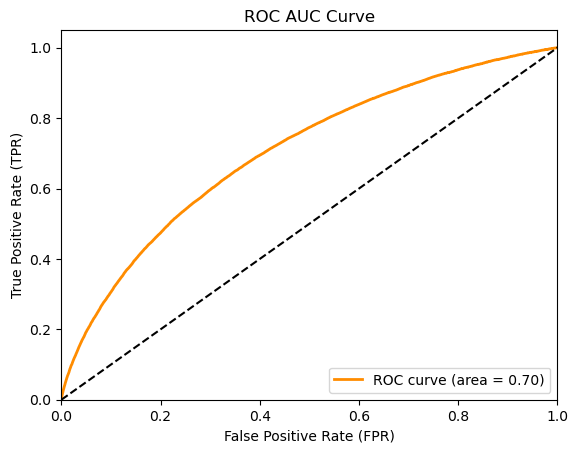

======== Test Set ==========
Confusion Matrix:
[[27169 11790]
 [ 3299  4716]]

Classification Report:
              precision    recall  f1-score   support

           0       0.89      0.70      0.78     38959
           1       0.29      0.59      0.38      8015

    accuracy                           0.68     46974
   macro avg       0.59      0.64      0.58     46974
weighted avg       0.79      0.68      0.71     46974



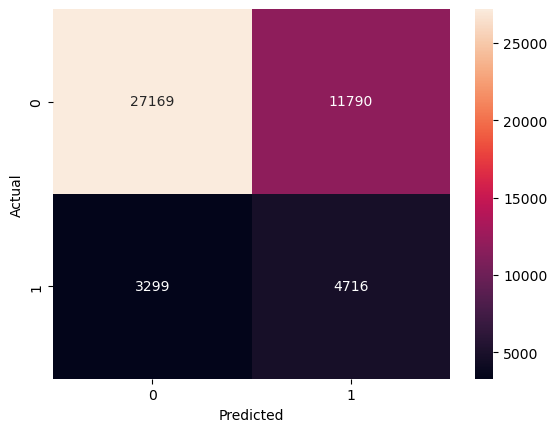

Testing AUC: 0.6951


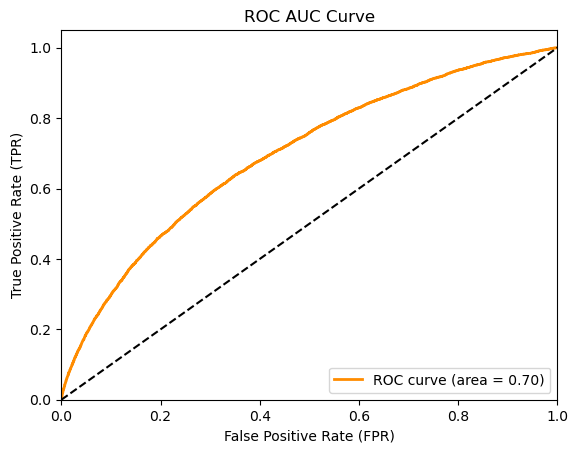

===== combined_isolated_pca_256_KNN =====
Train accuracy score: 1.0
Test accuracy score: 0.8168774215523481


======== Training Set ==========
Confusion Matrix:
[[155837      0]
 [     0  32058]]

Classification Report:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00    155837
           1       1.00      1.00      1.00     32058

    accuracy                           1.00    187895
   macro avg       1.00      1.00      1.00    187895
weighted avg       1.00      1.00      1.00    187895



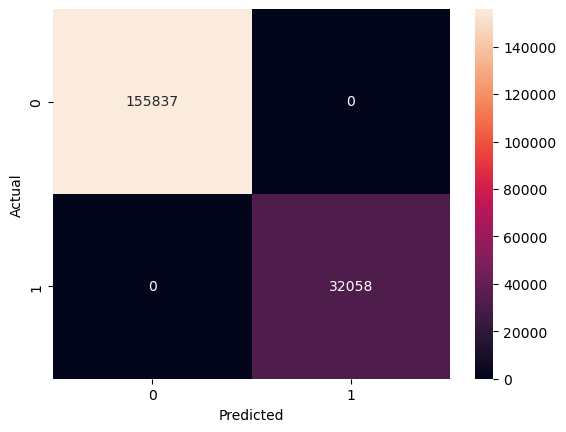

Training AUC: 1.0000


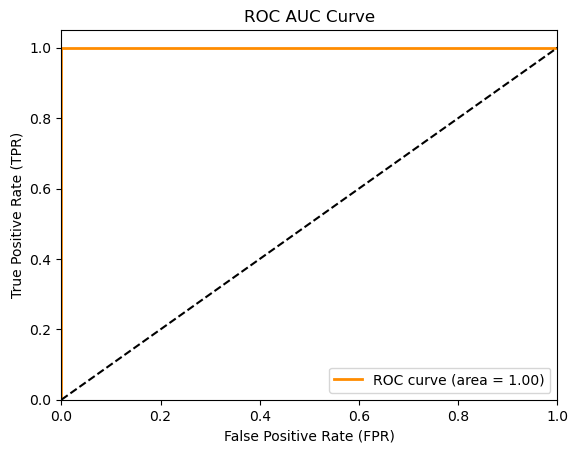

======== Test Set ==========
Confusion Matrix:
[[37485  1474]
 [ 7128   887]]

Classification Report:
              precision    recall  f1-score   support

           0       0.84      0.96      0.90     38959
           1       0.38      0.11      0.17      8015

    accuracy                           0.82     46974
   macro avg       0.61      0.54      0.53     46974
weighted avg       0.76      0.82      0.77     46974



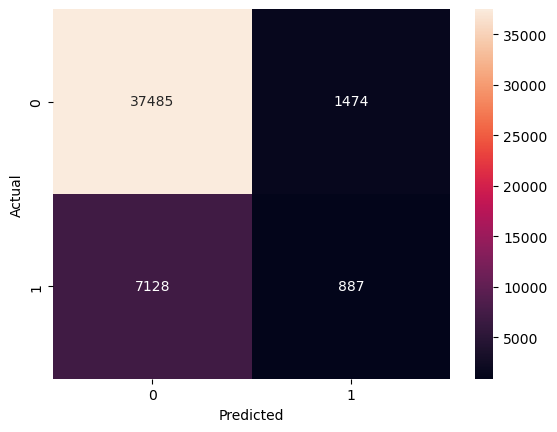

Testing AUC: 0.5904


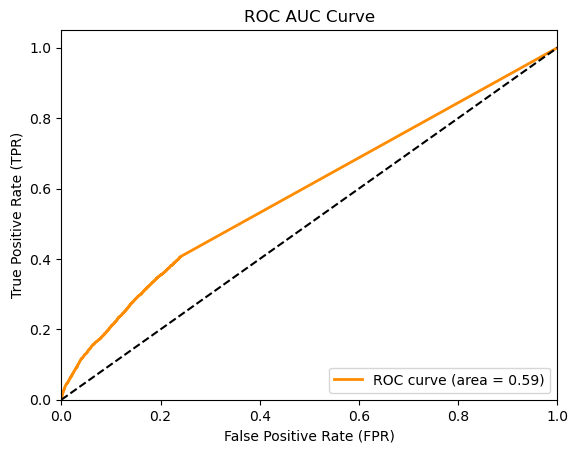

/Users/daisyliu/anaconda3/envs/had7001/lib/python3.13/site-packages/sklearn/linear_model/_logistic.py:465: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. OF ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


===== combined_isolated_pca_256_LR =====
Train accuracy score: 0.6813166928337635
Test accuracy score: 0.6787797505002767


======== Training Set ==========
Confusion Matrix:
[[108829  47008]
 [ 12871  19187]]

Classification Report:
              precision    recall  f1-score   support

           0       0.89      0.70      0.78    155837
           1       0.29      0.60      0.39     32058

    accuracy                           0.68    187895
   macro avg       0.59      0.65      0.59    187895
weighted avg       0.79      0.68      0.72    187895



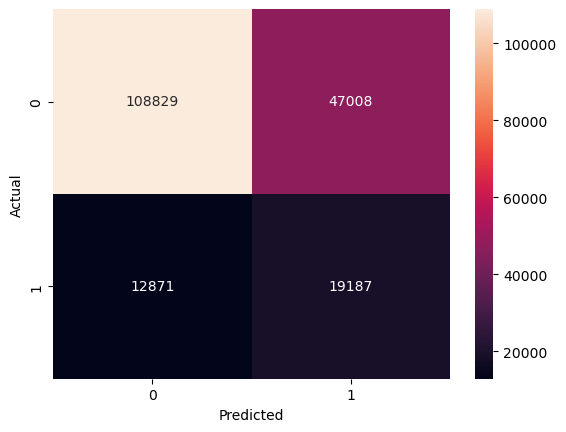

Training AUC: 0.7033


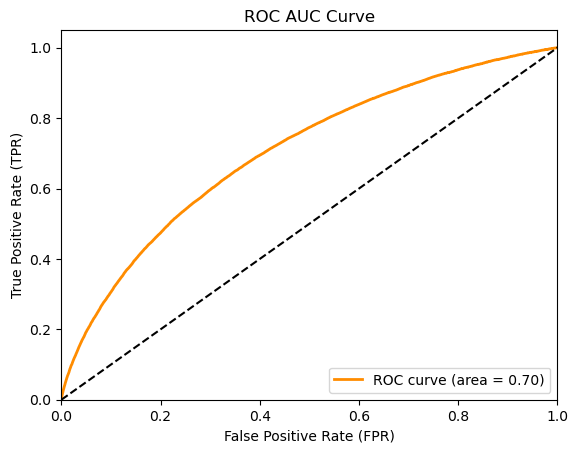

======== Test Set ==========
Confusion Matrix:
[[27169 11790]
 [ 3299  4716]]

Classification Report:
              precision    recall  f1-score   support

           0       0.89      0.70      0.78     38959
           1       0.29      0.59      0.38      8015

    accuracy                           0.68     46974
   macro avg       0.59      0.64      0.58     46974
weighted avg       0.79      0.68      0.71     46974



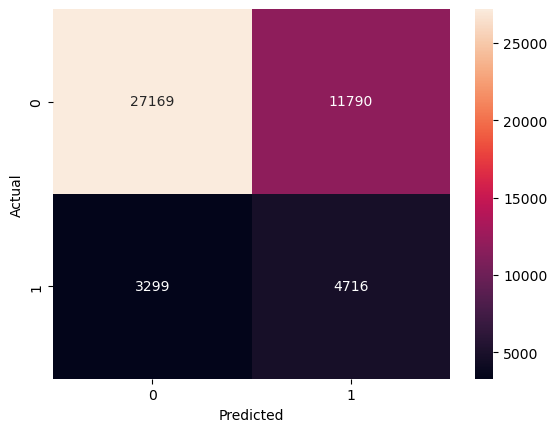

Testing AUC: 0.6951


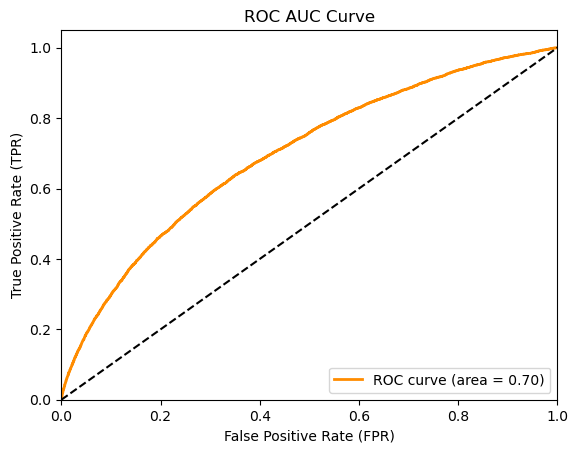

===== combined_isolated_pca_512_KNN =====
Train accuracy score: 1.0
Test accuracy score: 0.8136203005918168


======== Training Set ==========
Confusion Matrix:
[[155837      0]
 [     0  32058]]

Classification Report:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00    155837
           1       1.00      1.00      1.00     32058

    accuracy                           1.00    187895
   macro avg       1.00      1.00      1.00    187895
weighted avg       1.00      1.00      1.00    187895



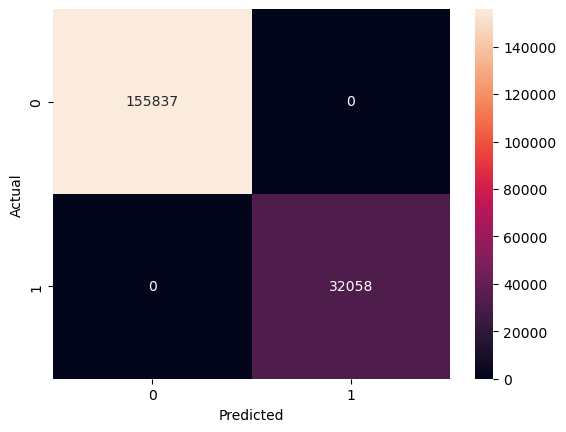

Training AUC: 1.0000


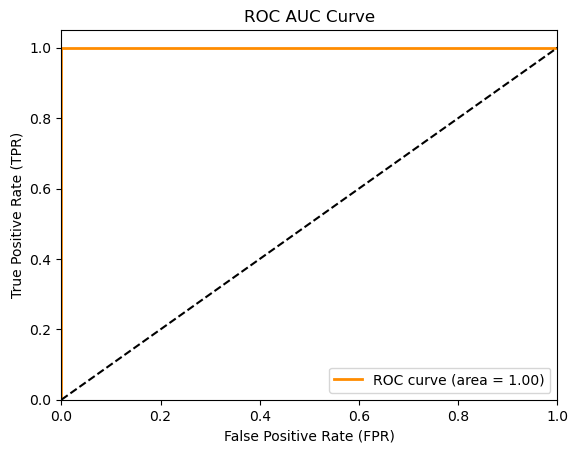

======== Test Set ==========
Confusion Matrix:
[[37400  1559]
 [ 7196   819]]

Classification Report:
              precision    recall  f1-score   support

           0       0.84      0.96      0.90     38959
           1       0.34      0.10      0.16      8015

    accuracy                           0.81     46974
   macro avg       0.59      0.53      0.53     46974
weighted avg       0.75      0.81      0.77     46974



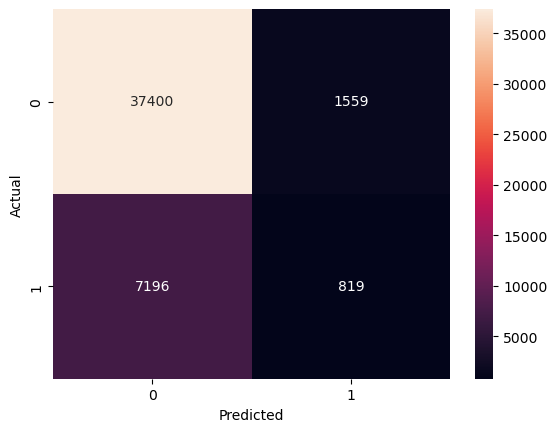

Testing AUC: 0.5795


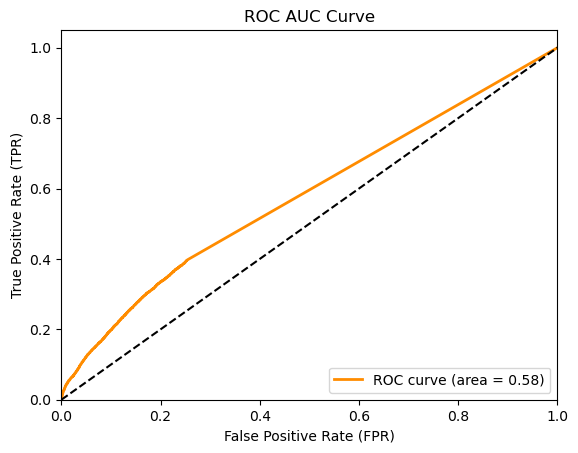

/Users/daisyliu/anaconda3/envs/had7001/lib/python3.13/site-packages/sklearn/linear_model/_logistic.py:465: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. OF ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


===== combined_isolated_pca_512_LR =====
Train accuracy score: 0.6884749461135209
Test accuracy score: 0.6843573040405331


======== Training Set ==========
Confusion Matrix:
[[110207  45630]
 [ 12904  19154]]

Classification Report:
              precision    recall  f1-score   support

           0       0.90      0.71      0.79    155837
           1       0.30      0.60      0.40     32058

    accuracy                           0.69    187895
   macro avg       0.60      0.65      0.59    187895
weighted avg       0.79      0.69      0.72    187895



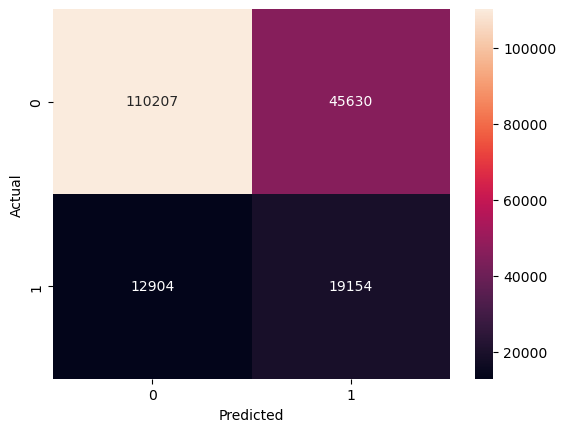

Training AUC: 0.7081


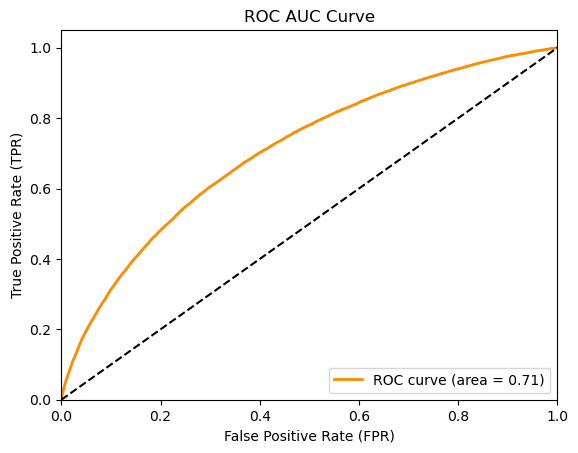

======== Test Set ==========
Confusion Matrix:
[[27464 11495]
 [ 3332  4683]]

Classification Report:
              precision    recall  f1-score   support

           0       0.89      0.70      0.79     38959
           1       0.29      0.58      0.39      8015

    accuracy                           0.68     46974
   macro avg       0.59      0.64      0.59     46974
weighted avg       0.79      0.68      0.72     46974



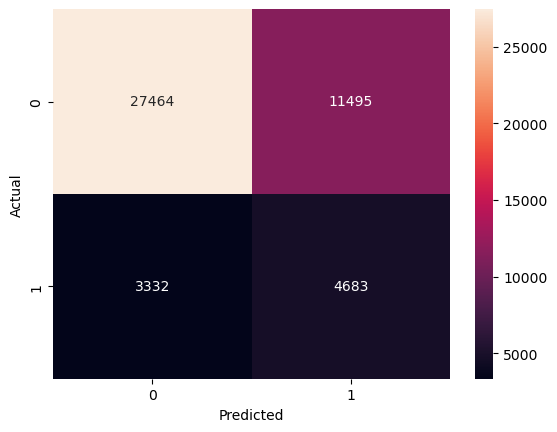

Testing AUC: 0.6974


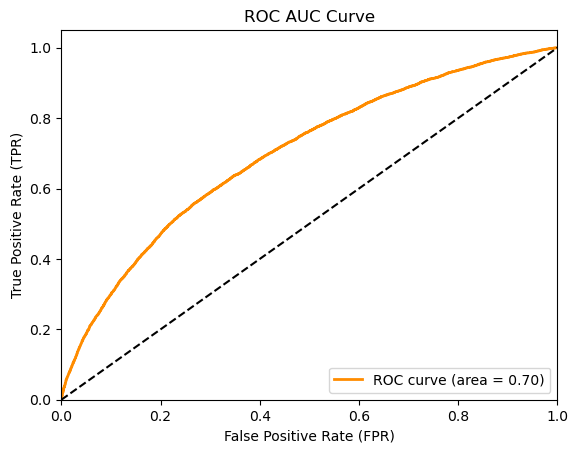

In [20]:
tuned_models = {
    'KNN': KNeighborsClassifier(weights='distance', n_neighbors = 3, metric = 'euclidean'),
    'LR': LogisticRegression(class_weight='balanced', solver = 'lbfgs', C = 100)
}

tuned_results_KNN = {}
tuned_results_LR = {}

for dataset_name, dataset_dict in training_Xy.items():
    X_train_scaled = dataset_dict['X_train_scaled']
    X_test_scaled = dataset_dict['X_test_scaled']
    y_train = dataset_dict['y_train']
    y_test = dataset_dict['y_test']

    for model_name, model in tuned_models.items():
        name = f"{dataset_name}_{model_name}"
        trained = model.fit(X_train_scaled, y_train)
        print(f'===== {name} =====')

        y_pred_train, y_pred_test, y_prob_train, y_prob_test = evaluate_model(
            trained, X_train_scaled, y_train, X_test_scaled, y_test
        )

        result_entry = {
            'trained': trained,
            'y_pred_train': y_pred_train,
            'y_pred_test': y_pred_test,
            'y_prob_train': y_prob_train,
            'y_prob_test': y_prob_test
        }

        if model_name == 'KNN':
            tuned_results_KNN[name] = result_entry
        elif model_name == 'LR':
            tuned_results_LR[name] = result_entry

===== combined_isolated_pca_128_RFC =====
Train accuracy score: 0.8385853801325208
Test accuracy score: 0.8352918635841103


======== Training Set ==========
Confusion Matrix:
[[154158   1679]
 [ 28650   3408]]

Classification Report:
              precision    recall  f1-score   support

           0       0.84      0.99      0.91    155837
           1       0.67      0.11      0.18     32058

    accuracy                           0.84    187895
   macro avg       0.76      0.55      0.55    187895
weighted avg       0.81      0.84      0.79    187895



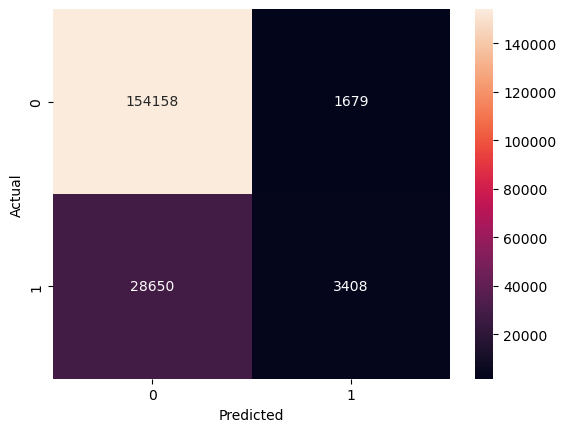

Training AUC: 0.7773


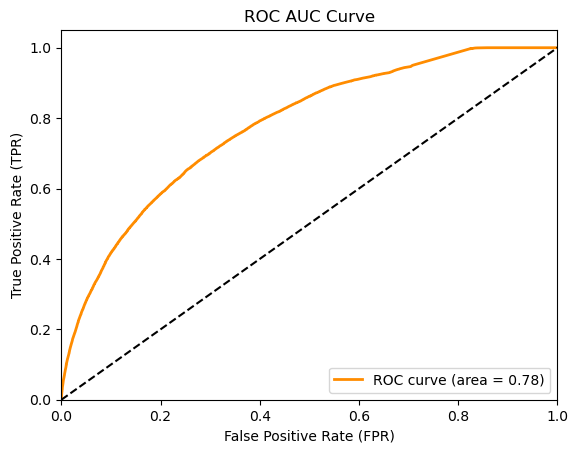

======== Test Set ==========
Confusion Matrix:
[[38488   471]
 [ 7266   749]]

Classification Report:
              precision    recall  f1-score   support

           0       0.84      0.99      0.91     38959
           1       0.61      0.09      0.16      8015

    accuracy                           0.84     46974
   macro avg       0.73      0.54      0.54     46974
weighted avg       0.80      0.84      0.78     46974



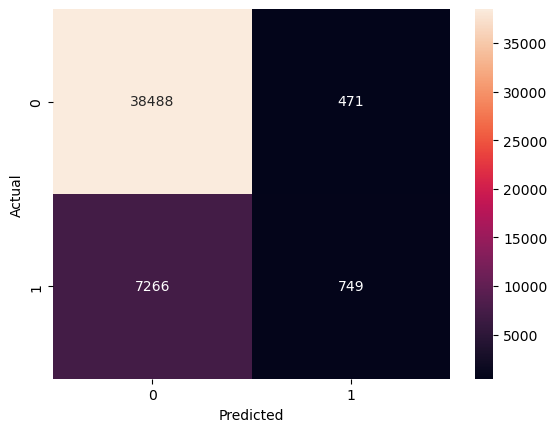

Testing AUC: 0.7667


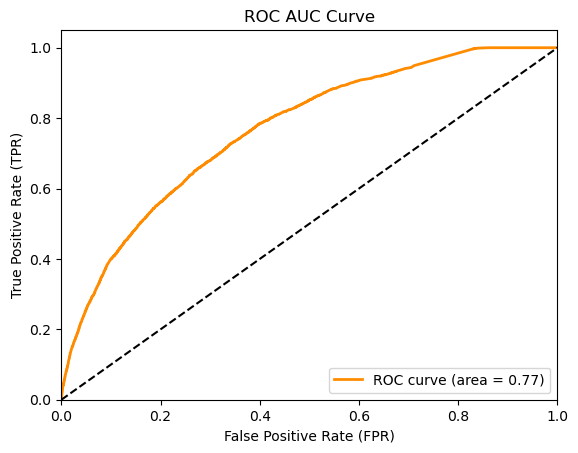

===== combined_isolated_pca_128_XGB =====
Train accuracy score: 0.8520929242396019
Test accuracy score: 0.8426789287691063


======== Training Set ==========
Confusion Matrix:
[[152866   2971]
 [ 24820   7238]]

Classification Report:
              precision    recall  f1-score   support

           0       0.86      0.98      0.92    155837
           1       0.71      0.23      0.34     32058

    accuracy                           0.85    187895
   macro avg       0.78      0.60      0.63    187895
weighted avg       0.83      0.85      0.82    187895



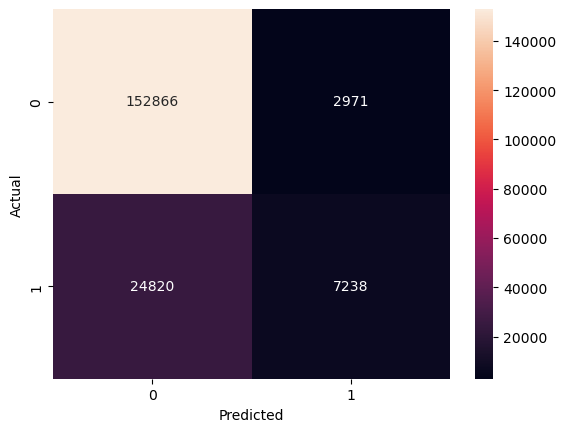

Training AUC: 0.8396


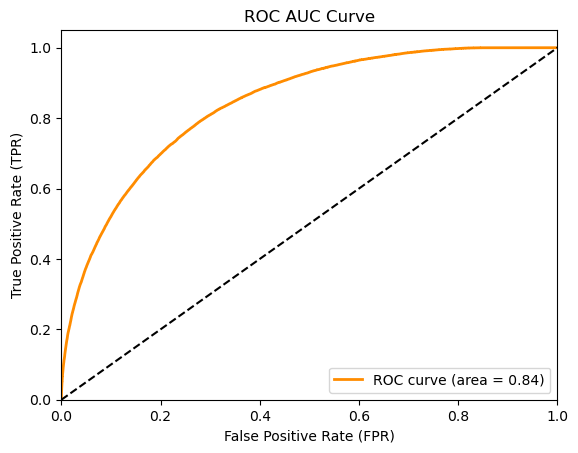

======== Test Set ==========
Confusion Matrix:
[[38055   904]
 [ 6486  1529]]

Classification Report:
              precision    recall  f1-score   support

           0       0.85      0.98      0.91     38959
           1       0.63      0.19      0.29      8015

    accuracy                           0.84     46974
   macro avg       0.74      0.58      0.60     46974
weighted avg       0.82      0.84      0.81     46974



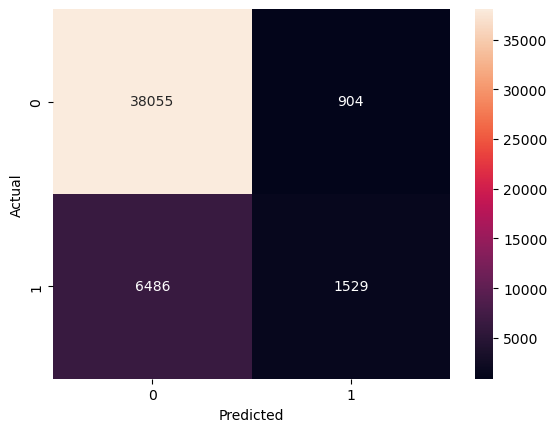

Testing AUC: 0.8175


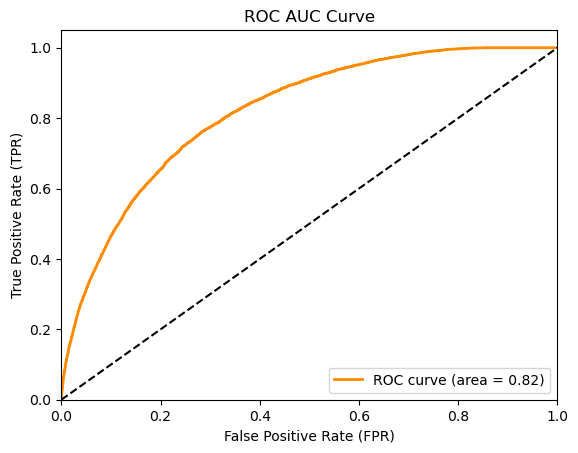

===== combined_isolated_pca_128_ADA =====
Train accuracy score: 0.8293834322360893
Test accuracy score: 0.8293736960871971


======== Training Set ==========
Confusion Matrix:
[[155837      0]
 [ 32058      0]]

Classification Report:
              precision    recall  f1-score   support

           0       0.83      1.00      0.91    155837
           1       0.00      0.00      0.00     32058

    accuracy                           0.83    187895
   macro avg       0.41      0.50      0.45    187895
weighted avg       0.69      0.83      0.75    187895



/Users/daisyliu/anaconda3/envs/had7001/lib/python3.13/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Users/daisyliu/anaconda3/envs/had7001/lib/python3.13/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Users/daisyliu/anaconda3/envs/had7001/lib/python3.13/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metr

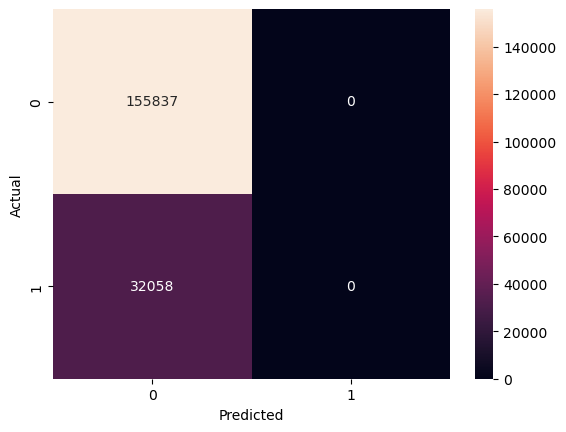

Training AUC: 0.6473


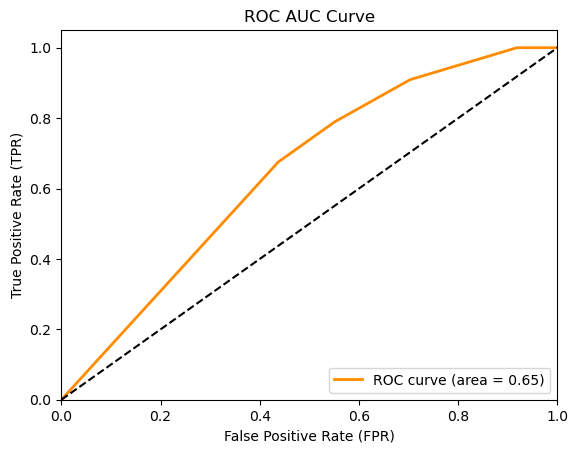

======== Test Set ==========
Confusion Matrix:
[[38959     0]
 [ 8015     0]]

Classification Report:
              precision    recall  f1-score   support

           0       0.83      1.00      0.91     38959
           1       0.00      0.00      0.00      8015

    accuracy                           0.83     46974
   macro avg       0.41      0.50      0.45     46974
weighted avg       0.69      0.83      0.75     46974



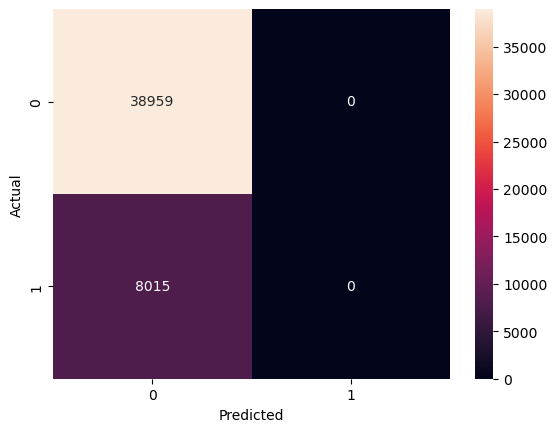

Testing AUC: 0.6455


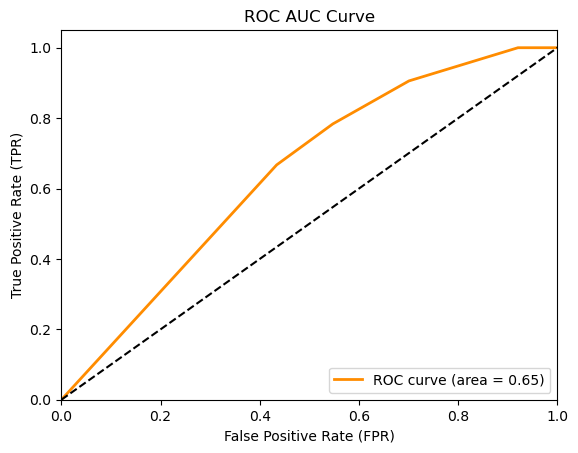

===== combined_combined_pca_128_RFC =====
Train accuracy score: 0.8386918225604726
Test accuracy score: 0.8352918635841103


======== Training Set ==========
Confusion Matrix:
[[154201   1636]
 [ 28673   3385]]

Classification Report:
              precision    recall  f1-score   support

           0       0.84      0.99      0.91    155837
           1       0.67      0.11      0.18     32058

    accuracy                           0.84    187895
   macro avg       0.76      0.55      0.55    187895
weighted avg       0.81      0.84      0.79    187895



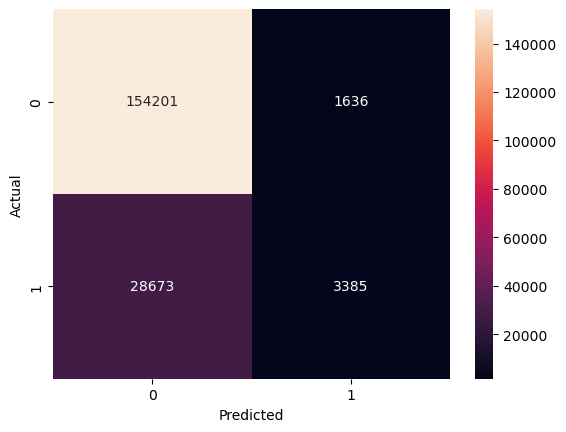

Training AUC: 0.7762


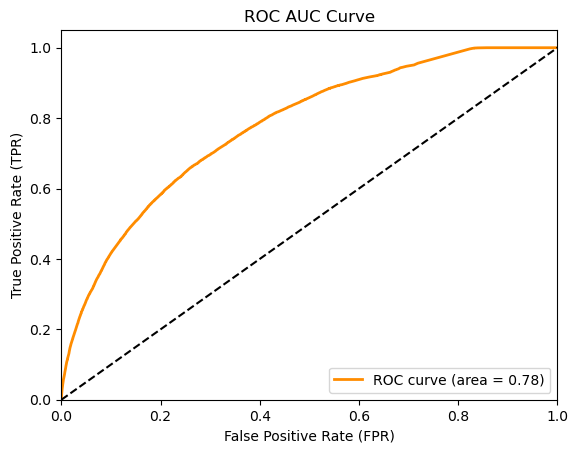

======== Test Set ==========
Confusion Matrix:
[[38492   467]
 [ 7270   745]]

Classification Report:
              precision    recall  f1-score   support

           0       0.84      0.99      0.91     38959
           1       0.61      0.09      0.16      8015

    accuracy                           0.84     46974
   macro avg       0.73      0.54      0.54     46974
weighted avg       0.80      0.84      0.78     46974



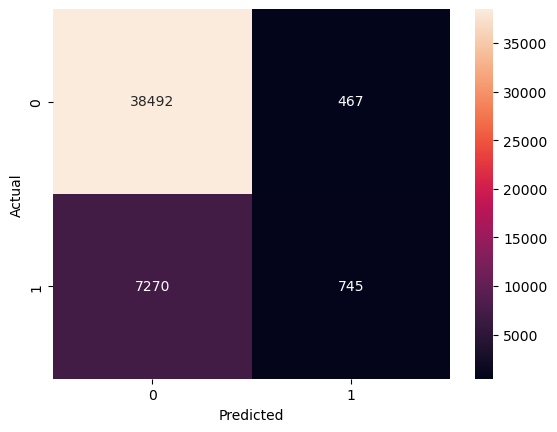

Testing AUC: 0.7653


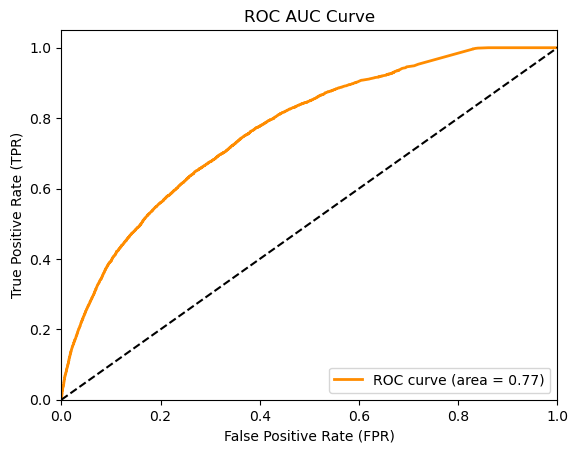

===== combined_combined_pca_128_XGB =====
Train accuracy score: 0.8528539875994572
Test accuracy score: 0.8428492357474348


======== Training Set ==========
Confusion Matrix:
[[152877   2960]
 [ 24688   7370]]

Classification Report:
              precision    recall  f1-score   support

           0       0.86      0.98      0.92    155837
           1       0.71      0.23      0.35     32058

    accuracy                           0.85    187895
   macro avg       0.79      0.61      0.63    187895
weighted avg       0.84      0.85      0.82    187895



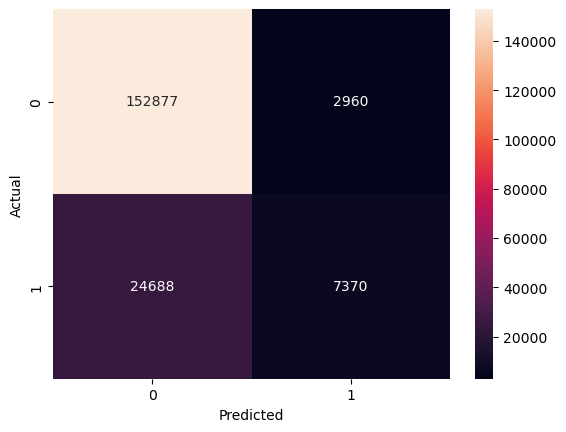

Training AUC: 0.8407


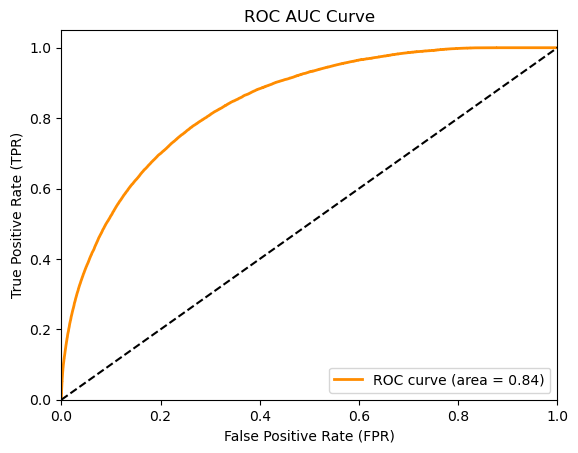

======== Test Set ==========
Confusion Matrix:
[[38038   921]
 [ 6461  1554]]

Classification Report:
              precision    recall  f1-score   support

           0       0.85      0.98      0.91     38959
           1       0.63      0.19      0.30      8015

    accuracy                           0.84     46974
   macro avg       0.74      0.59      0.60     46974
weighted avg       0.82      0.84      0.81     46974



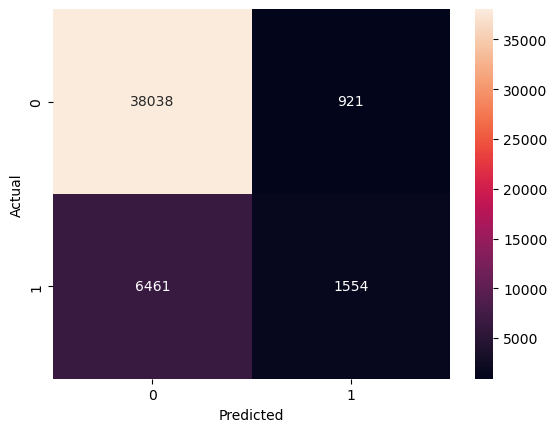

Testing AUC: 0.8174


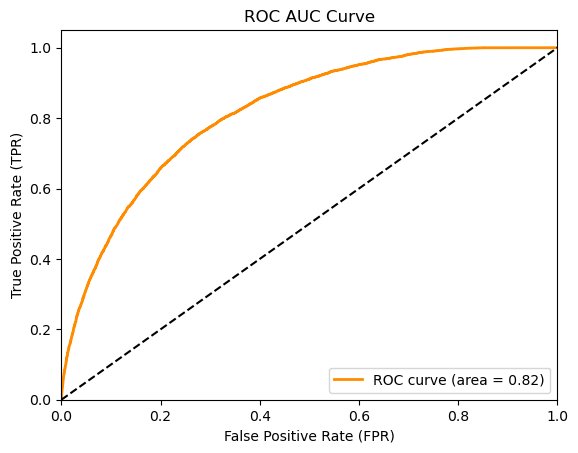

===== combined_combined_pca_128_ADA =====
Train accuracy score: 0.8293834322360893
Test accuracy score: 0.8293736960871971


======== Training Set ==========
Confusion Matrix:
[[155837      0]
 [ 32058      0]]

Classification Report:
              precision    recall  f1-score   support

           0       0.83      1.00      0.91    155837
           1       0.00      0.00      0.00     32058

    accuracy                           0.83    187895
   macro avg       0.41      0.50      0.45    187895
weighted avg       0.69      0.83      0.75    187895



/Users/daisyliu/anaconda3/envs/had7001/lib/python3.13/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Users/daisyliu/anaconda3/envs/had7001/lib/python3.13/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Users/daisyliu/anaconda3/envs/had7001/lib/python3.13/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metr

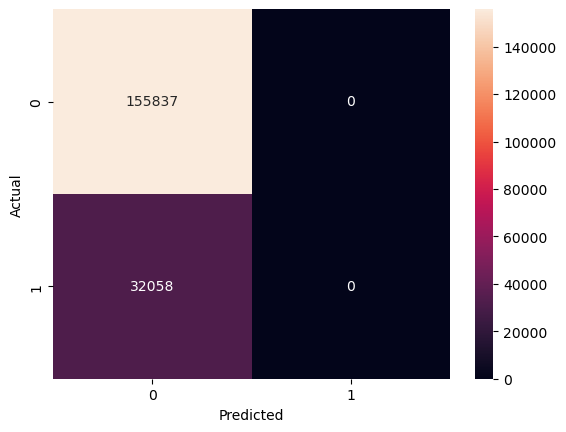

Training AUC: 0.6473


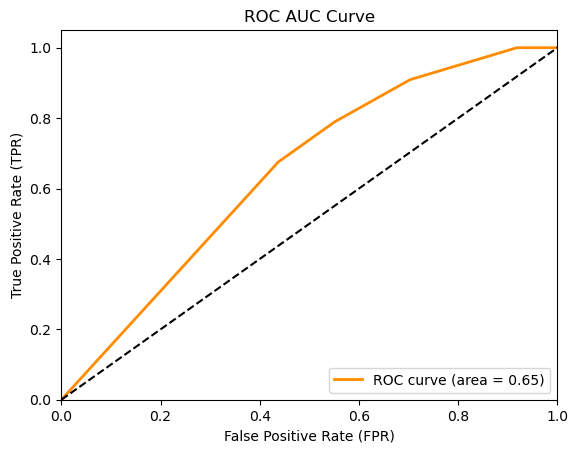

======== Test Set ==========
Confusion Matrix:
[[38959     0]
 [ 8015     0]]

Classification Report:
              precision    recall  f1-score   support

           0       0.83      1.00      0.91     38959
           1       0.00      0.00      0.00      8015

    accuracy                           0.83     46974
   macro avg       0.41      0.50      0.45     46974
weighted avg       0.69      0.83      0.75     46974



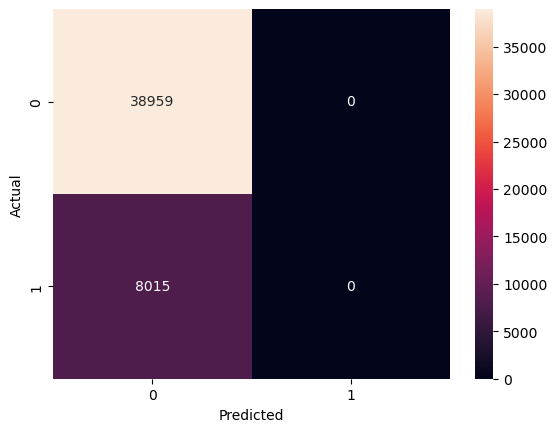

Testing AUC: 0.6455


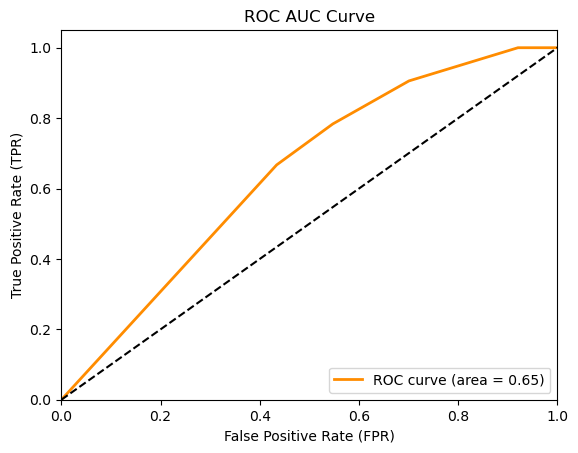

===== combined_isolated_pca_256_RFC =====
Train accuracy score: 0.8384842598259666
Test accuracy score: 0.8352705752118194


======== Training Set ==========
Confusion Matrix:
[[154200   1637]
 [ 28711   3347]]

Classification Report:
              precision    recall  f1-score   support

           0       0.84      0.99      0.91    155837
           1       0.67      0.10      0.18     32058

    accuracy                           0.84    187895
   macro avg       0.76      0.55      0.55    187895
weighted avg       0.81      0.84      0.79    187895



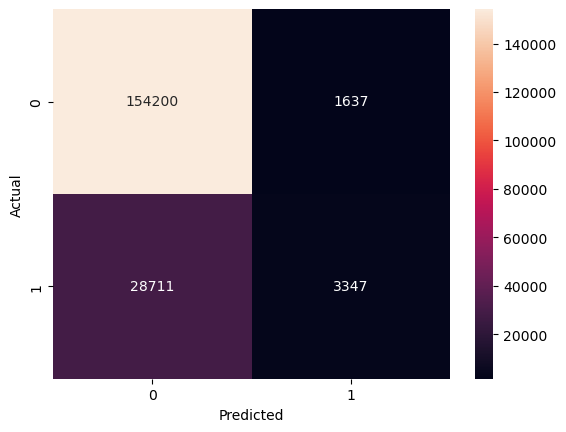

Training AUC: 0.7759


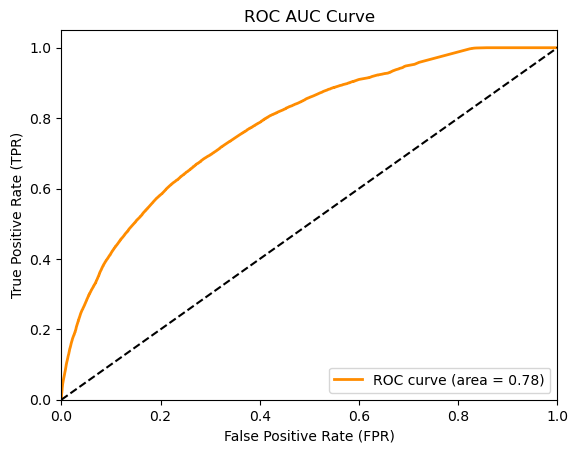

======== Test Set ==========
Confusion Matrix:
[[38502   457]
 [ 7281   734]]

Classification Report:
              precision    recall  f1-score   support

           0       0.84      0.99      0.91     38959
           1       0.62      0.09      0.16      8015

    accuracy                           0.84     46974
   macro avg       0.73      0.54      0.53     46974
weighted avg       0.80      0.84      0.78     46974



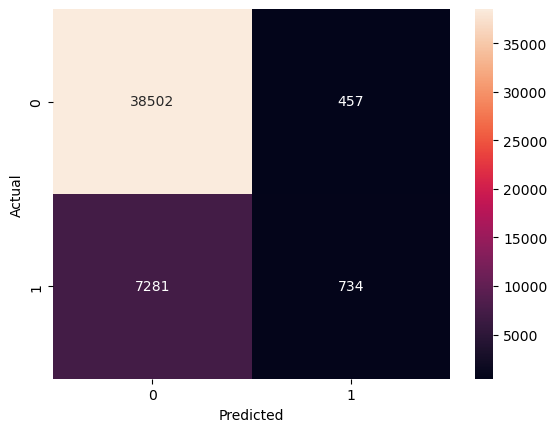

Testing AUC: 0.7645


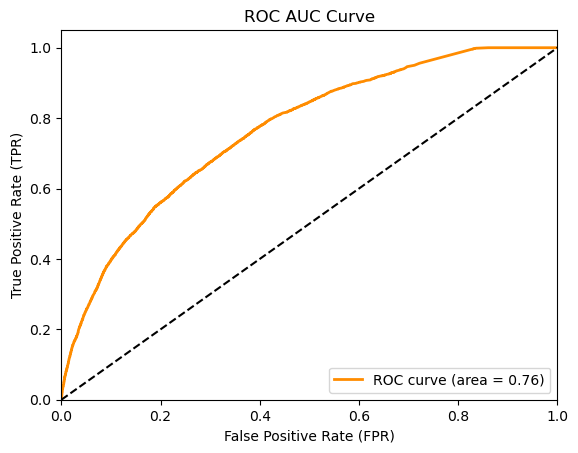

===== combined_isolated_pca_256_XGB =====
Train accuracy score: 0.8528539875994572
Test accuracy score: 0.8428492357474348


======== Training Set ==========
Confusion Matrix:
[[152877   2960]
 [ 24688   7370]]

Classification Report:
              precision    recall  f1-score   support

           0       0.86      0.98      0.92    155837
           1       0.71      0.23      0.35     32058

    accuracy                           0.85    187895
   macro avg       0.79      0.61      0.63    187895
weighted avg       0.84      0.85      0.82    187895



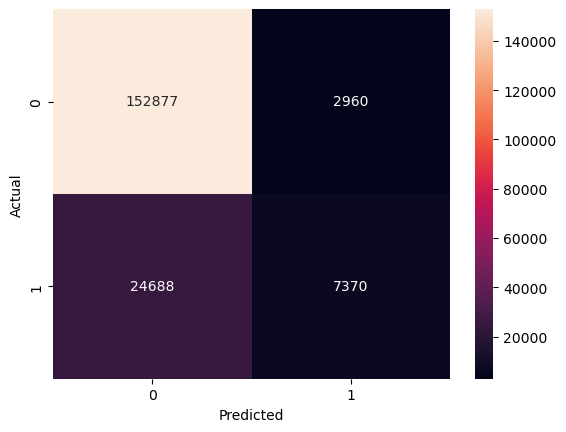

Training AUC: 0.8407


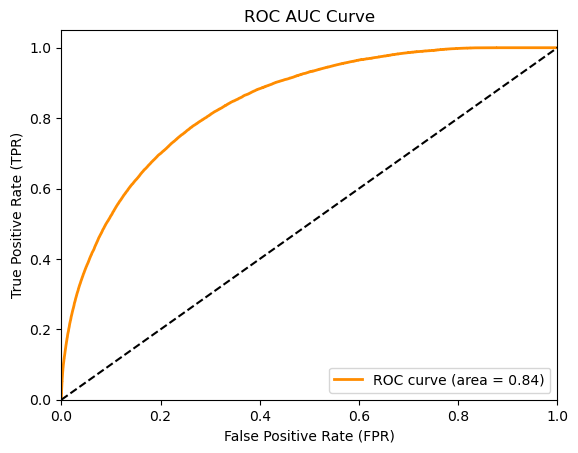

======== Test Set ==========
Confusion Matrix:
[[38038   921]
 [ 6461  1554]]

Classification Report:
              precision    recall  f1-score   support

           0       0.85      0.98      0.91     38959
           1       0.63      0.19      0.30      8015

    accuracy                           0.84     46974
   macro avg       0.74      0.59      0.60     46974
weighted avg       0.82      0.84      0.81     46974



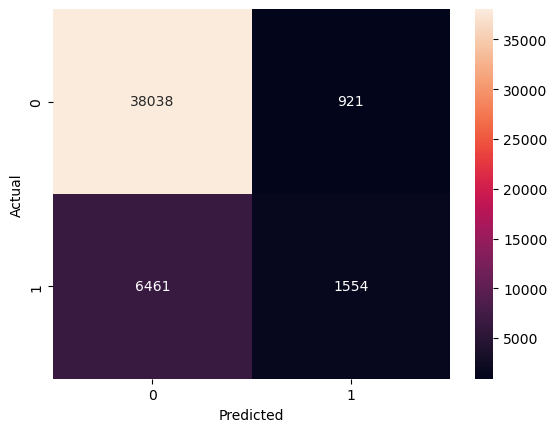

Testing AUC: 0.8174


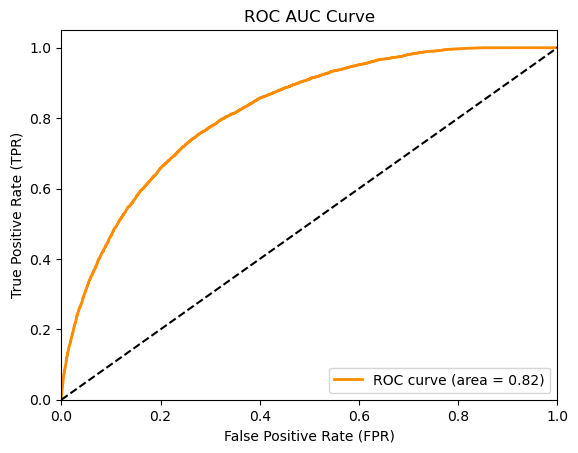

===== combined_isolated_pca_256_ADA =====
Train accuracy score: 0.8293834322360893
Test accuracy score: 0.8293736960871971


======== Training Set ==========
Confusion Matrix:
[[155837      0]
 [ 32058      0]]

Classification Report:
              precision    recall  f1-score   support

           0       0.83      1.00      0.91    155837
           1       0.00      0.00      0.00     32058

    accuracy                           0.83    187895
   macro avg       0.41      0.50      0.45    187895
weighted avg       0.69      0.83      0.75    187895



/Users/daisyliu/anaconda3/envs/had7001/lib/python3.13/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Users/daisyliu/anaconda3/envs/had7001/lib/python3.13/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Users/daisyliu/anaconda3/envs/had7001/lib/python3.13/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metr

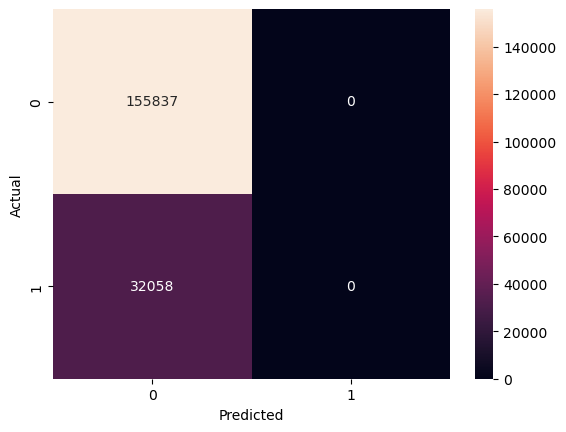

Training AUC: 0.6473


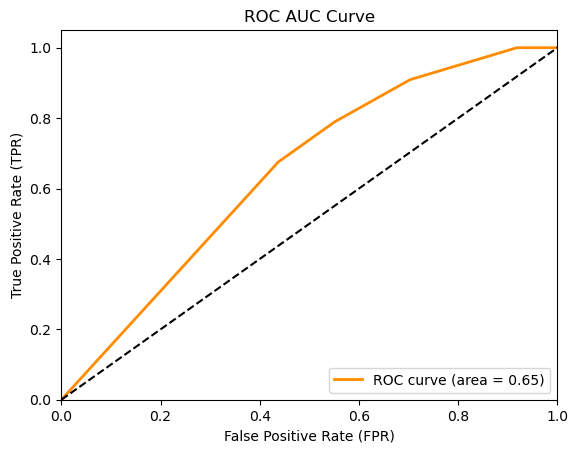

======== Test Set ==========
Confusion Matrix:
[[38959     0]
 [ 8015     0]]

Classification Report:
              precision    recall  f1-score   support

           0       0.83      1.00      0.91     38959
           1       0.00      0.00      0.00      8015

    accuracy                           0.83     46974
   macro avg       0.41      0.50      0.45     46974
weighted avg       0.69      0.83      0.75     46974



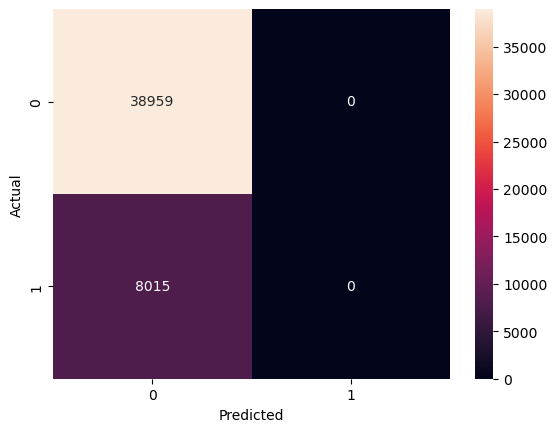

Testing AUC: 0.6455


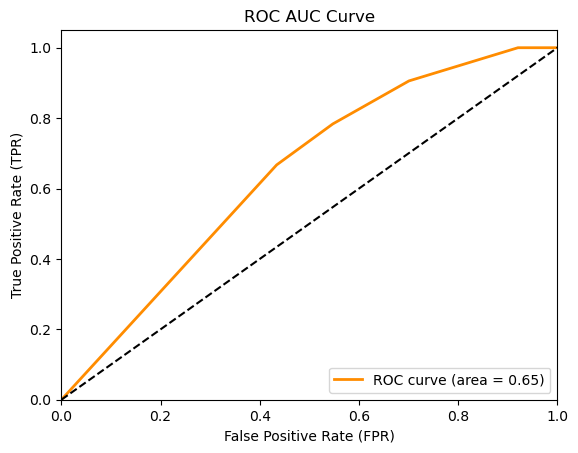

===== combined_isolated_pca_512_RFC =====
Train accuracy score: 0.8384257164905932
Test accuracy score: 0.835164133350364


======== Training Set ==========
Confusion Matrix:
[[154232   1605]
 [ 28754   3304]]

Classification Report:
              precision    recall  f1-score   support

           0       0.84      0.99      0.91    155837
           1       0.67      0.10      0.18     32058

    accuracy                           0.84    187895
   macro avg       0.76      0.55      0.54    187895
weighted avg       0.81      0.84      0.79    187895



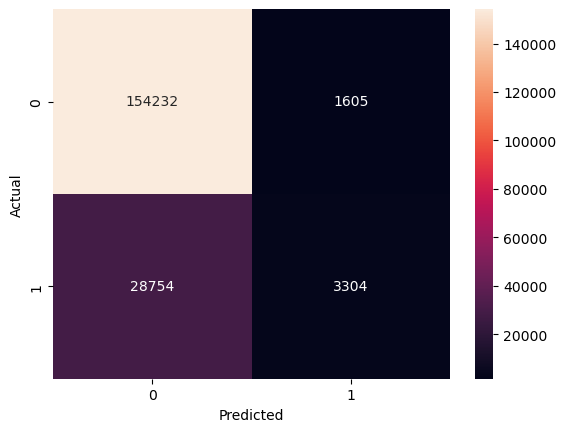

Training AUC: 0.7764


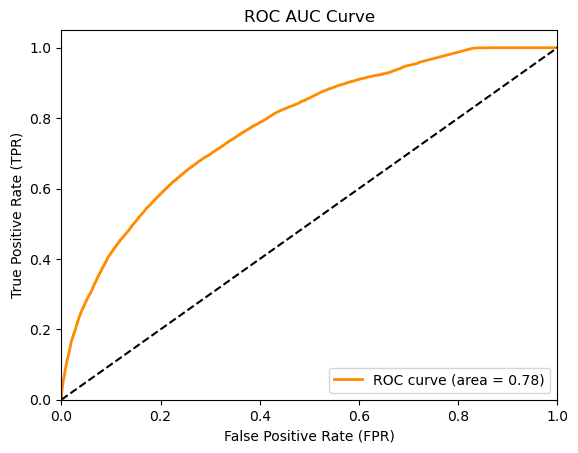

======== Test Set ==========
Confusion Matrix:
[[38500   459]
 [ 7284   731]]

Classification Report:
              precision    recall  f1-score   support

           0       0.84      0.99      0.91     38959
           1       0.61      0.09      0.16      8015

    accuracy                           0.84     46974
   macro avg       0.73      0.54      0.53     46974
weighted avg       0.80      0.84      0.78     46974



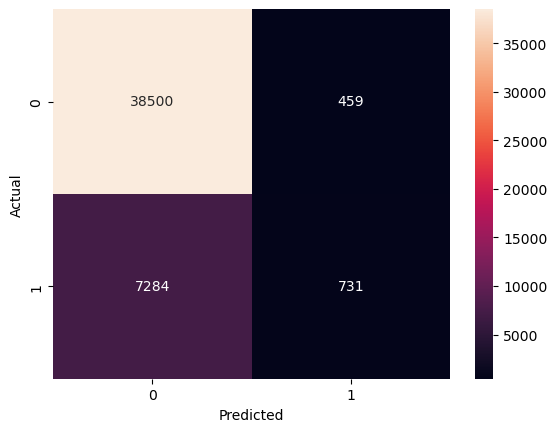

Testing AUC: 0.7647


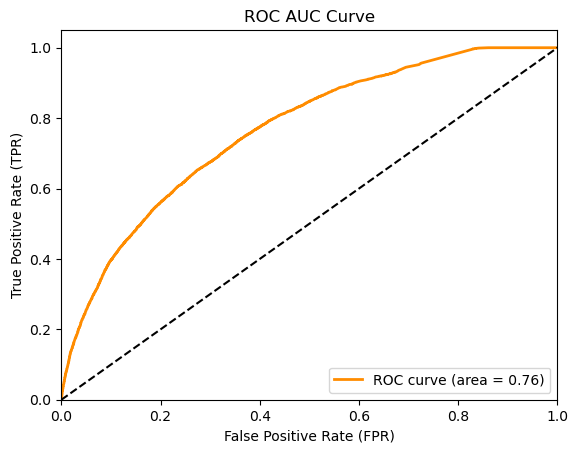

===== combined_isolated_pca_512_XGB =====
Train accuracy score: 0.8535139306527582
Test accuracy score: 0.8426789287691063


======== Training Set ==========
Confusion Matrix:
[[153014   2823]
 [ 24701   7357]]

Classification Report:
              precision    recall  f1-score   support

           0       0.86      0.98      0.92    155837
           1       0.72      0.23      0.35     32058

    accuracy                           0.85    187895
   macro avg       0.79      0.61      0.63    187895
weighted avg       0.84      0.85      0.82    187895



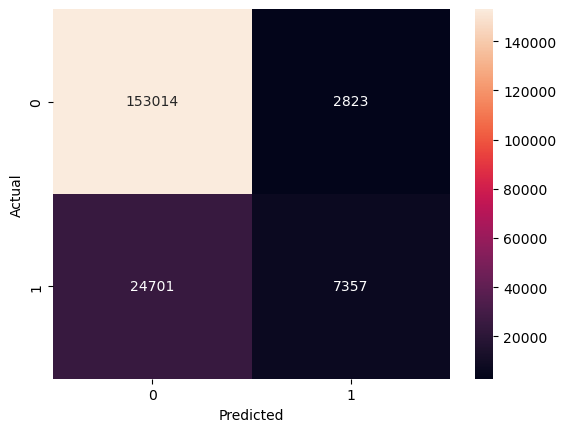

Training AUC: 0.8407


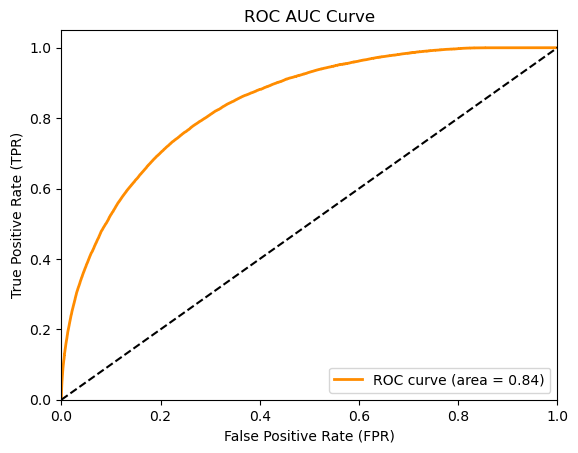

======== Test Set ==========
Confusion Matrix:
[[38052   907]
 [ 6483  1532]]

Classification Report:
              precision    recall  f1-score   support

           0       0.85      0.98      0.91     38959
           1       0.63      0.19      0.29      8015

    accuracy                           0.84     46974
   macro avg       0.74      0.58      0.60     46974
weighted avg       0.82      0.84      0.81     46974



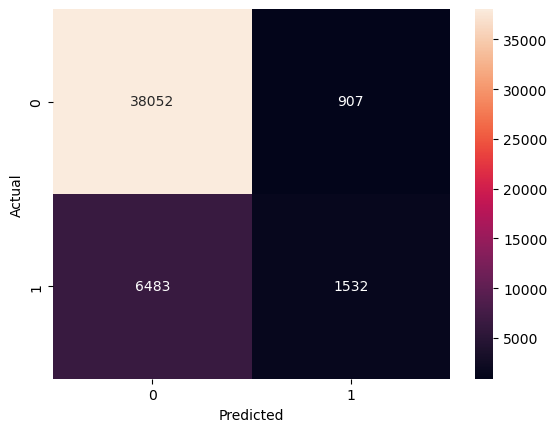

Testing AUC: 0.8155


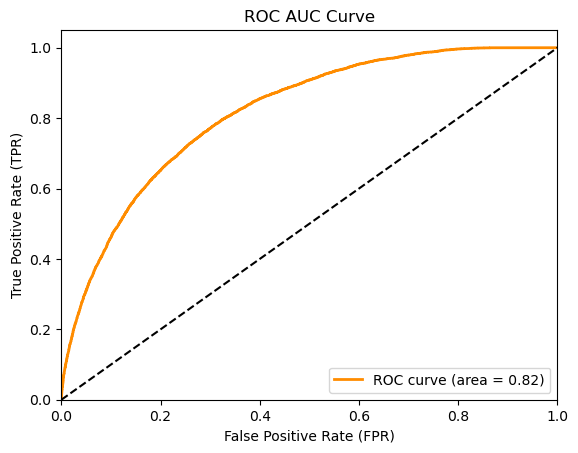

===== combined_isolated_pca_512_ADA =====
Train accuracy score: 0.8293834322360893
Test accuracy score: 0.8293736960871971


======== Training Set ==========
Confusion Matrix:
[[155837      0]
 [ 32058      0]]

Classification Report:
              precision    recall  f1-score   support

           0       0.83      1.00      0.91    155837
           1       0.00      0.00      0.00     32058

    accuracy                           0.83    187895
   macro avg       0.41      0.50      0.45    187895
weighted avg       0.69      0.83      0.75    187895



/Users/daisyliu/anaconda3/envs/had7001/lib/python3.13/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Users/daisyliu/anaconda3/envs/had7001/lib/python3.13/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Users/daisyliu/anaconda3/envs/had7001/lib/python3.13/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metr

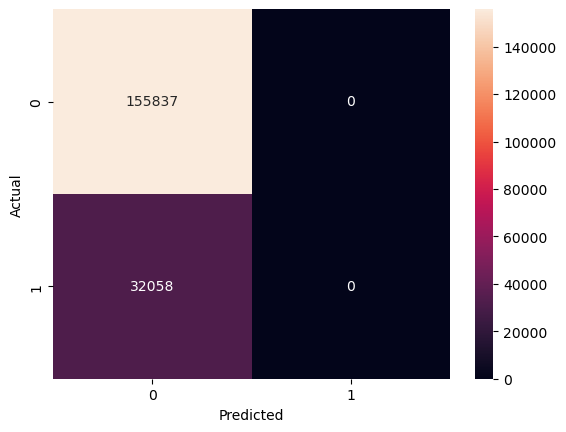

Training AUC: 0.6473


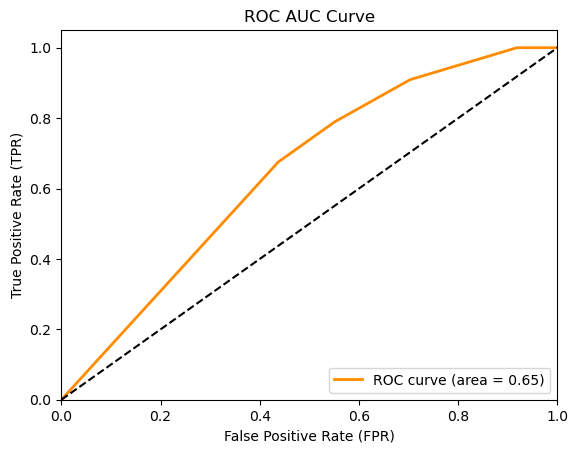

======== Test Set ==========
Confusion Matrix:
[[38959     0]
 [ 8015     0]]

Classification Report:
              precision    recall  f1-score   support

           0       0.83      1.00      0.91     38959
           1       0.00      0.00      0.00      8015

    accuracy                           0.83     46974
   macro avg       0.41      0.50      0.45     46974
weighted avg       0.69      0.83      0.75     46974



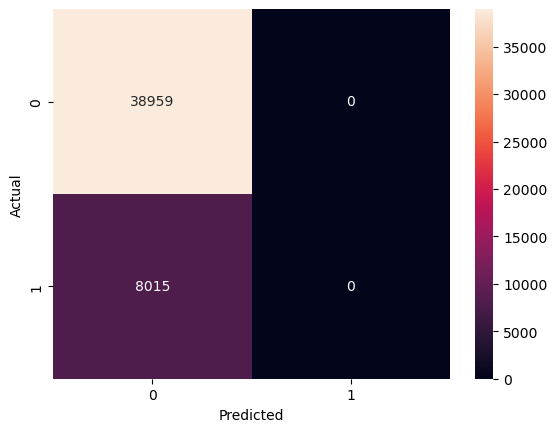

Testing AUC: 0.6455


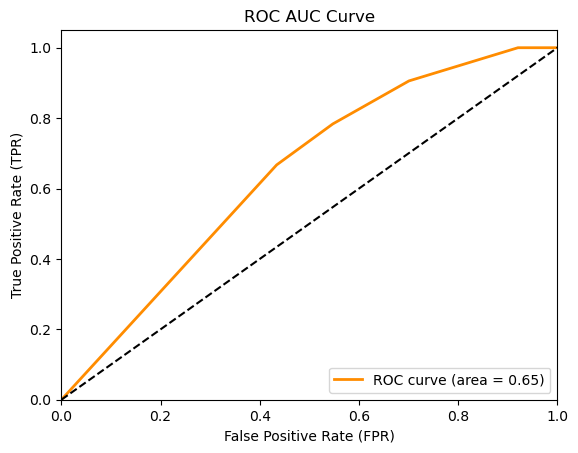

In [21]:
sample_weights = compute_sample_weight(class_weight='balanced', y=y_train)


tuned_trees = {'RFC': RandomForestClassifier(n_estimators = 100, min_samples_split = 10, max_features = 1.0, 
                                             max_depth = 7),
               'XGB': GradientBoostingClassifier(min_samples_split = 10, max_depth = 5, learning_rate=0.1),
               'ADA': AdaBoostClassifier(n_estimators = 100, learning_rate = 0.05)
              }

tuned_results_RFC = {}
tuned_results_XGB = {}
tuned_results_ADA = {}

for dataset_name, dataset_dict in training_Xy.items():
    X_train_scaled = dataset_dict['X_train_scaled']
    X_test_scaled = dataset_dict['X_test_scaled']
    y_train = dataset_dict['y_train']
    y_test = dataset_dict['y_test']

    for tree_name, tree in tuned_trees.items():
        name = f"{dataset_name}_{tree_name}"
        trained = tree.fit(X_train_scaled, y_train)
        print(f'===== {name} =====')

        y_pred_train, y_pred_test, y_prob_train, y_prob_test = evaluate_model(
            trained, X_train_scaled, y_train, X_test_scaled, y_test
        )

        result_entry = {
            'trained': trained,
            'y_pred_train': y_pred_train,
            'y_pred_test': y_pred_test,
            'y_prob_train': y_prob_train,
            'y_prob_test': y_prob_test
        }

        if tree_name == 'RFC':
            tuned_results_RFC[name] = result_entry
        elif tree_name == 'XGB':
            tuned_results_XGB[name] = result_entry
        elif tree_name == 'ADA':
            tuned_results_ADA[name] = result_entry

In [12]:
LGC_grid = {
    'num_leaves': [5, 20, 31, 63],
    'learning_rate': [0.01, 0.05, 0.1, 0.2],
    'n_estimators': [100, 200, 300],
    'max_depth': [3, 5, 7],
    'min_child_samples': [10, 20, 40],
    'reg_lambda': [0, 1, 5],
    'colsample_bytree': [0.6, 0.8, 1.0]
}

for dataset_name, dataset in training_Xy.items():

    counter = Counter(dataset['y_train'])
    scale_pos_weight = counter[0] / counter[1]

    lgc = LGBMClassifier(scale_pos_weight=scale_pos_weight, verbose=-1)

    search = RandomizedSearchCV(lgc, param_distributions = LGC_grid, n_iter = 6, 
                                scoring = 'recall', cv = 5, random_state = 42)
    
    search.fit(dataset['X_train_scaled'], dataset['y_train'])

    print(f'===== Model: LGC, {dataset_name} =====')
    best_params = search.best_params_
    print(best_params)
    print('=====')

===== Model: LGC, combined_isolated_pca_128 =====
{'reg_lambda': 5, 'num_leaves': 5, 'n_estimators': 200, 'min_child_samples': 20, 'max_depth': 5, 'learning_rate': 0.2, 'colsample_bytree': 0.6}
=====
===== Model: LGC, combined_combined_pca_128 =====
{'reg_lambda': 5, 'num_leaves': 5, 'n_estimators': 200, 'min_child_samples': 20, 'max_depth': 5, 'learning_rate': 0.2, 'colsample_bytree': 0.6}
=====
===== Model: LGC, combined_isolated_pca_256 =====
{'reg_lambda': 5, 'num_leaves': 5, 'n_estimators': 200, 'min_child_samples': 20, 'max_depth': 5, 'learning_rate': 0.2, 'colsample_bytree': 0.6}
=====
===== Model: LGC, combined_isolated_pca_512 =====
{'reg_lambda': 5, 'num_leaves': 5, 'n_estimators': 200, 'min_child_samples': 20, 'max_depth': 5, 'learning_rate': 0.2, 'colsample_bytree': 0.6}
=====


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 32058, number of negative: 155837
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.041287 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 34031
[LightGBM] [Info] Number of data points in the train set: 187895, number of used features: 155
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.170617 -> initscore=-1.581264
[LightGBM] [Info] Start training from score -1.581264
Train accuracy score: 0.7308230660741372
Test accuracy score: 0.727572699791374


======== Training Set ==========
Confusion Matrix:
[[112836  43001]
 [  7576  24482]]

Classification Report:
              precision    recall  f1-score   support

           0       0.94      0.72      0.82    155837
           1       0.36      0.76      0.49     32058

    accuracy                           0.73    187895
   macro avg

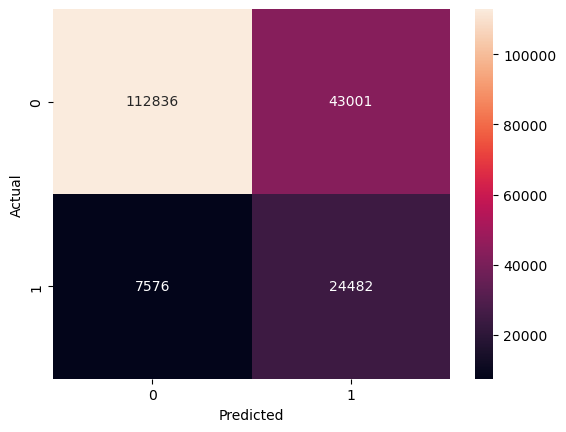

Training AUC: 0.8252


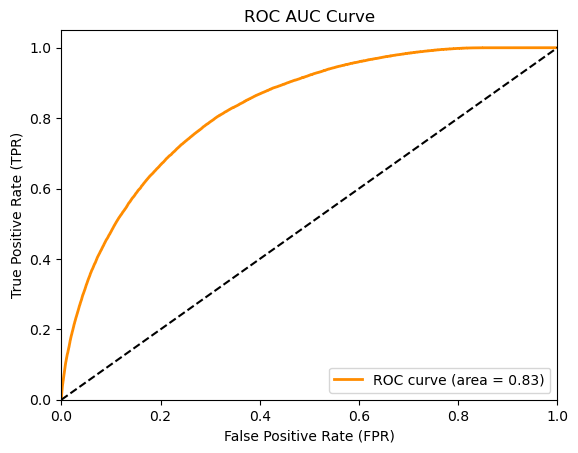

======== Test Set ==========
Confusion Matrix:
[[28153 10806]
 [ 1991  6024]]

Classification Report:
              precision    recall  f1-score   support

           0       0.93      0.72      0.81     38959
           1       0.36      0.75      0.48      8015

    accuracy                           0.73     46974
   macro avg       0.65      0.74      0.65     46974
weighted avg       0.84      0.73      0.76     46974



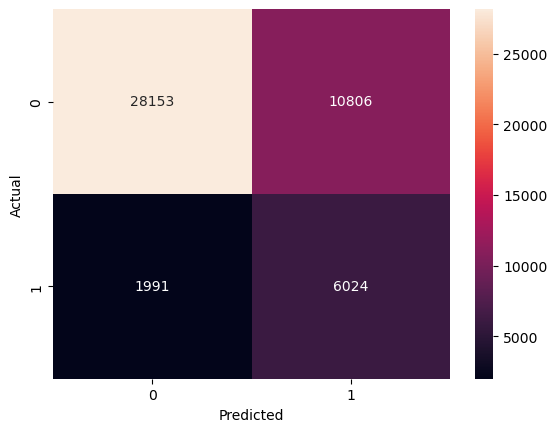

Testing AUC: 0.8164


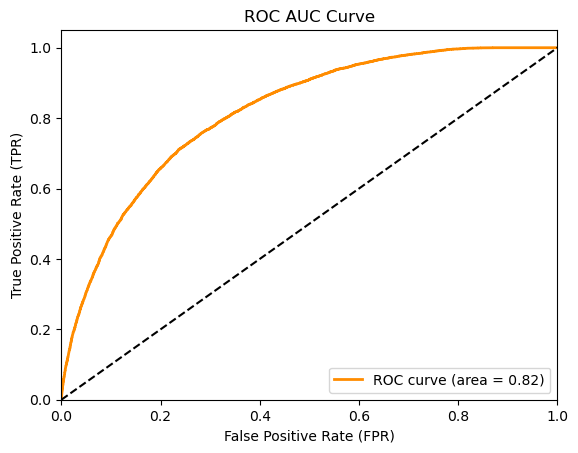

[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 32058, number of negative: 155837
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.082543 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 66674
[LightGBM] [Info] Number of data points in the train set: 187895, number of used features: 283
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.170617 -> initscore=-1.581264
[LightGBM] [Info] Start training from score -1.581264
Train accuracy score: 0.7322068176375103
Test accuracy score: 0.7292970579469493


======== Training Set ==========
Confusion Matrix:
[[113008  42829]
 [  7488  24570]]

Classification Report:
              precision    recall  f1-score   support

           0       0.94      0.73      0.82    155837
           1       0.36      0.77      0.49     32058

    accuracy                           0.73    187895
   macro av

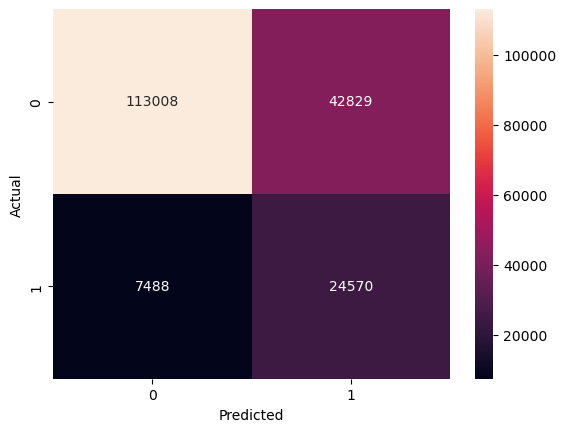

Training AUC: 0.8264


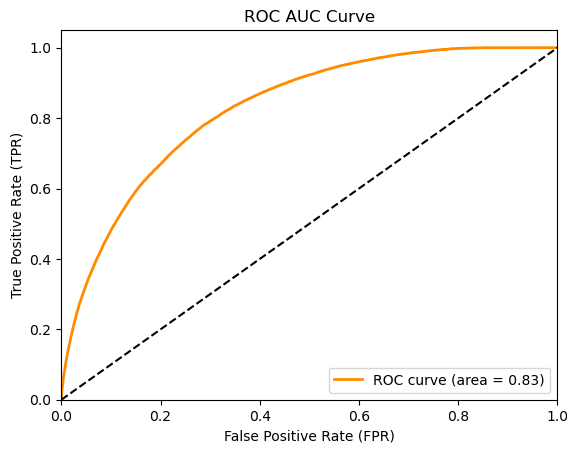

======== Test Set ==========
Confusion Matrix:
[[28235 10724]
 [ 1992  6023]]

Classification Report:
              precision    recall  f1-score   support

           0       0.93      0.72      0.82     38959
           1       0.36      0.75      0.49      8015

    accuracy                           0.73     46974
   macro avg       0.65      0.74      0.65     46974
weighted avg       0.84      0.73      0.76     46974



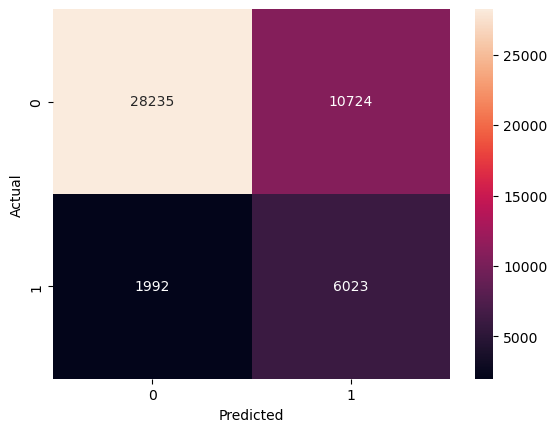

Testing AUC: 0.8172


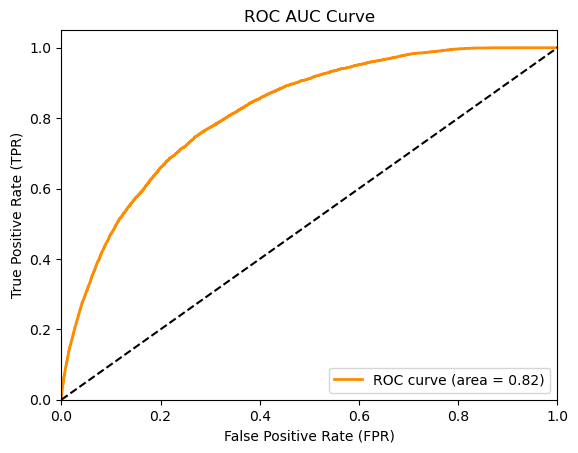

[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 32058, number of negative: 155837
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.082657 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 66674
[LightGBM] [Info] Number of data points in the train set: 187895, number of used features: 283
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.170617 -> initscore=-1.581264
[LightGBM] [Info] Start training from score -1.581264
Train accuracy score: 0.7322068176375103
Test accuracy score: 0.7292970579469493


======== Training Set ==========
Confusion Matrix:
[[113008  42829]
 [  7488  24570]]

Classification Report:
              precision    recall  f1-score   support

           0       0.94      0.73      0.82    155837
           1       0.36      0.77      0.49     32058

    accuracy                           0.73    187895
   macro av

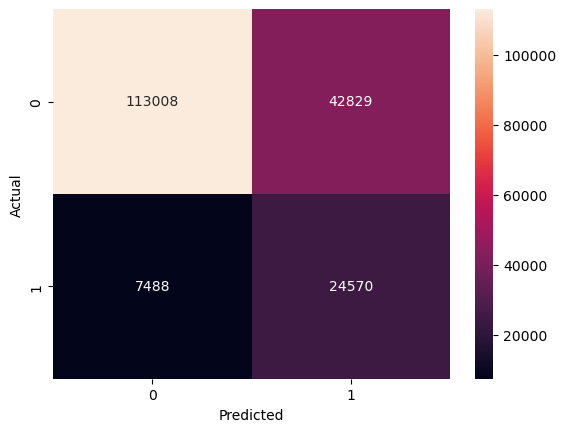

Training AUC: 0.8264


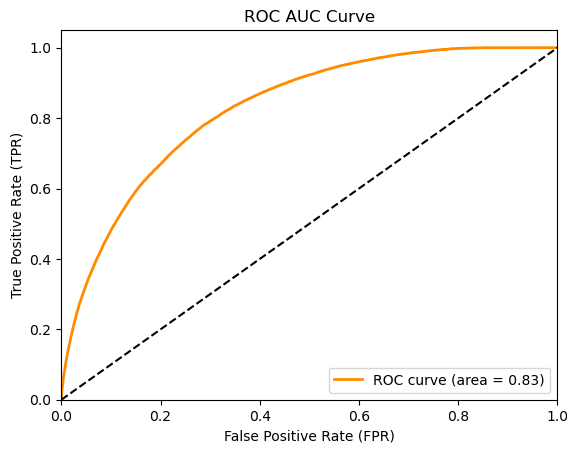

======== Test Set ==========
Confusion Matrix:
[[28235 10724]
 [ 1992  6023]]

Classification Report:
              precision    recall  f1-score   support

           0       0.93      0.72      0.82     38959
           1       0.36      0.75      0.49      8015

    accuracy                           0.73     46974
   macro avg       0.65      0.74      0.65     46974
weighted avg       0.84      0.73      0.76     46974



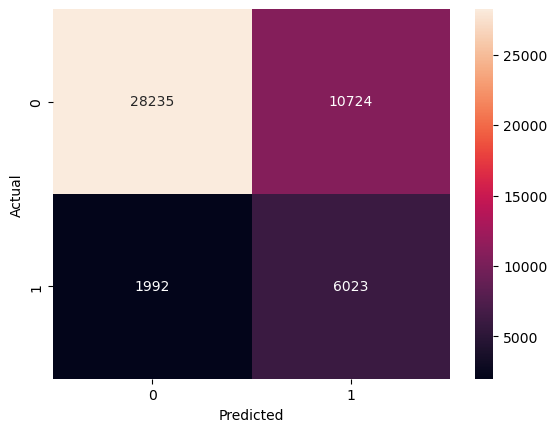

Testing AUC: 0.8172


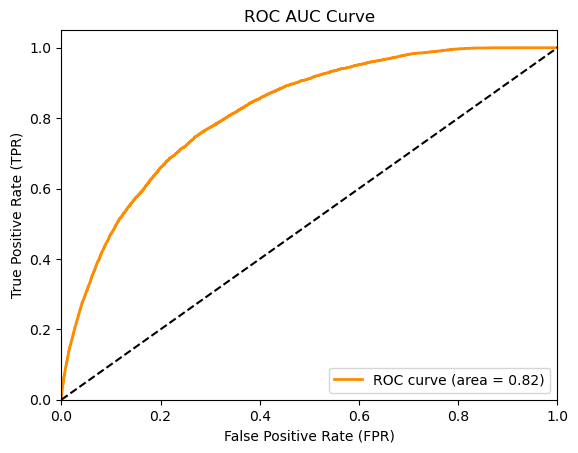

[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 32058, number of negative: 155837
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.196849 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 131951
[LightGBM] [Info] Number of data points in the train set: 187895, number of used features: 539
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.170617 -> initscore=-1.581264
[LightGBM] [Info] Start training from score -1.581264
Train accuracy score: 0.7326059767423295
Test accuracy score: 0.7279346021203219


======== Training Set ==========
Confusion Matrix:
[[113044  42793]
 [  7449  24609]]

Classification Report:
              precision    recall  f1-score   support

           0       0.94      0.73      0.82    155837
           1       0.37      0.77      0.49     32058

    accuracy                           0.73    187895
   macro a

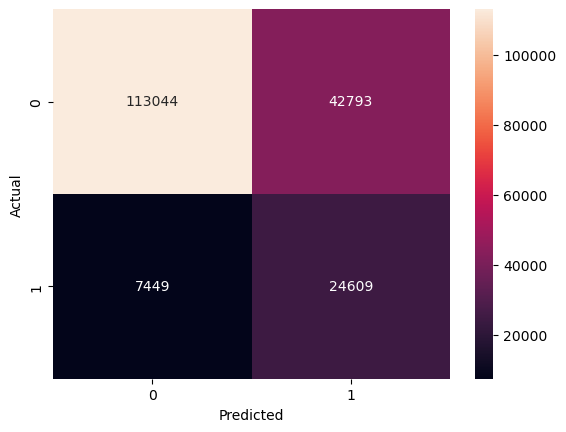

Training AUC: 0.8276


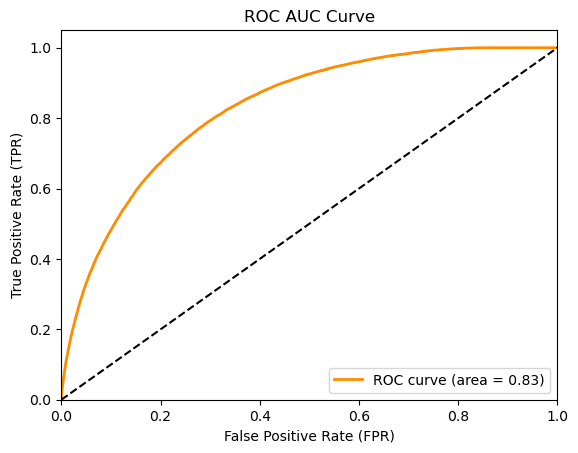

======== Test Set ==========
Confusion Matrix:
[[28165 10794]
 [ 1986  6029]]

Classification Report:
              precision    recall  f1-score   support

           0       0.93      0.72      0.82     38959
           1       0.36      0.75      0.49      8015

    accuracy                           0.73     46974
   macro avg       0.65      0.74      0.65     46974
weighted avg       0.84      0.73      0.76     46974



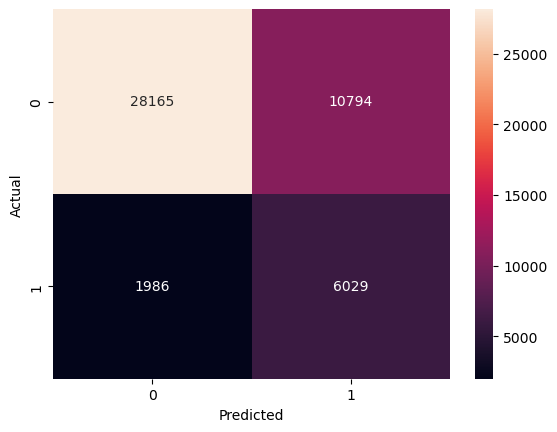

Testing AUC: 0.8177


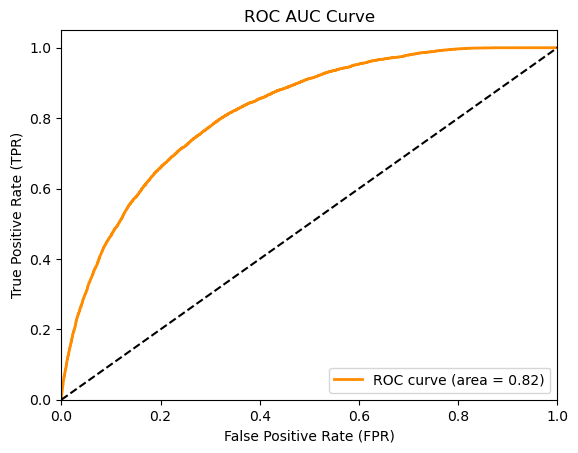

In [22]:
tuned_results_LGC = {}

for dataset_name, dataset_dict in training_Xy.items():
    X_train_scaled = dataset_dict['X_train_scaled']
    X_test_scaled = dataset_dict['X_test_scaled']
    y_train = dataset_dict['y_train']
    y_test = dataset_dict['y_test']

    counter = Counter(y_train)
    scale_pos_weight = counter[0] / counter[1]
    
    lgc_tuned = LGBMClassifier(scale_pos_weight=scale_pos_weight, reg_lambda = 5, 
                           num_leaves = 5, n_estimators = 200, min_child_samples = 20, 
                           max_depth = 5, learning_rate = 0.2, colsample_bytree = 0.6)
    
    lgc_tuned = lgc_tuned.fit(X_train_scaled, y_train)

    y_pred_train, y_pred_test, y_prob_train, y_prob_test = evaluate_model(
        lgc_tuned, X_train_scaled, y_train, X_test_scaled, y_test
    )

    tuned_results_LGC[f'{dataset_name}_LGC'] = {
        'model': lgc_tuned,
        'y_pred_train': y_pred_train,
        'y_pred_test': y_pred_test,
        'y_prob_train': y_prob_train,
        'y_prob_test': y_prob_test
    }